In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
import seaborn as sns

In [9]:
from datetime import datetime

In [10]:
from pandarallel import pandarallel

In [11]:
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [12]:
default_max_columns=pd.get_option('display.max_columns')

In [13]:
default_max_rows=pd.get_option('display.max_rows')

In [14]:
default_precision=pd.get_option('display.precision')

In [15]:
pd.set_option('display.precision', 2)

In [16]:
default_threshold=np.get_printoptions()['threshold']

In [17]:
np.set_printoptions(threshold=10000000)

# Read meta data

In [18]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [19]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [20]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [21]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [22]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [23]:
meta

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,",GBM,IDH-mutant,
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,


# Read raw matrix CORE

In [24]:
#df = pd.read_csv('20210428-EV/dplexonlyreport.csv',index_col=0,header=None)
df = pd.read_csv('20210428-EV/20210513b-report.csv.gz',index_col=0,header=None,low_memory=False)

In [25]:
df.shape

(39, 528)

In [26]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242


In [27]:
df.drop("---",inplace=True)

In [28]:
df.shape

(38, 528)

In [29]:
df.rename({'  ':'sample'},axis='rows',inplace=True)
df.rename({'Subject':'subject'},axis='rows',inplace=True)
df.rename({'Trimmer':'trimmer'},axis='rows',inplace=True)

In [30]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,4038879,4038879,4038879,4038879,4038879,4038879,3088240,3088240,3088240,3088240,...,3665258,3665258,3665258,3665258,4868169,4868169,4868169,4868169,4868169,4868169
Raw Read Length,35.0646,35.0646,35.0646,35.0646,35.0646,35.0646,48.6946,48.6946,48.6946,48.6946,...,34.0495,34.0495,34.0495,34.0495,36.2413,36.2413,36.2413,36.2413,36.2413,36.2413
Trimmed Read Count,1270784,1372973,1372997,1395891,1395893,1395893,1240850,1396651,1396740,1418066,...,3633881,3661993,3664115,3664263,4478092,4823895,4823681,4863961,4867158,4867302
Trimmed Ave Read Length,33.8185,38.2306,38.2314,43.5121,43.5142,43.524,40.8779,51.0991,51.101,64.3485,...,32.6867,33.8972,34.0071,34.0507,30.6793,34.7925,34.7983,36.0631,36.1974,36.242
STAR Aligned to Transcriptome,111104,112499,112492,112689,112696,112689,92673,93752,93727,92285,...,337860,337076,336880,336843,362402,363298,363259,362012,361905,361853


In [31]:
df=df.T
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to Salmonella,Bowtie2 Aligned to Salmonella %,Bowtie2 Aligned to masked Salmonella,Bowtie2 Aligned to masked Salmonella %,Bowtie2 Aligned to Burkholderia,Bowtie2 Aligned to Burkholderia %,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,45946,3.61,14700,1.15,375543,29.55,277406,21.82,58736,4.62
2,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
3,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,60133,4.37,17811,1.29,413414,30.11,298416,21.73,71735,5.22
4,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,61284,4.39,18218,1.30,420290,30.10,304330,21.80,75518,5.41
5,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,61285,4.39,18218,1.30,420299,30.10,304339,21.80,75522,5.41


In [32]:
#df=df.merge(meta,left_on='Subject',right_on='subject')
df=df.merge(meta,on='subject')
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,Bowtie2 Aligned to masked Burkholderia,Bowtie2 Aligned to masked Burkholderia %,Bowtie2 Aligned to mRNA_Prot,Bowtie2 Aligned to mRNA_Prot %,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,277406,21.82,58736,4.62,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,4038879,35.0646,1372973,38.2306,112499,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,4038879,35.0646,1372997,38.2314,112492,8.19,...,298416,21.73,71735,5.22,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,4038879,35.0646,1395891,43.5121,112689,8.07,...,304330,21.80,75518,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,4038879,35.0646,1395893,43.5142,112696,8.07,...,304339,21.80,75522,5.41,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [33]:
#rmsk_family_counts = pd.read_csv('20210428-EV/rmsk_family_counts.csv.gz',index_col=0,header=None,low_memory=False)
rmsk_family_counts = pd.read_csv('20210428-EV/rmsk_family_counts.csv.gz',index_col=0,low_memory=False)
rmsk_family_counts=rmsk_family_counts.T
rmsk_family_counts.columns="rf_"+rmsk_family_counts.columns
rmsk_family_counts=rmsk_family_counts.reset_index()
#rmsk_family_counts[['sample','trimmer','other']]=rmsk_family_counts['rf_sequence'].str.split(".",2,expand=True)
#rmsk_family_counts.drop(["rf_sequence","other"],inplace=True,axis='columns')
rmsk_family_counts[['sample','trimmer','other']]=rmsk_family_counts['index'].str.split(".",2,expand=True)
rmsk_family_counts.drop(["index","other"],inplace=True,axis='columns')
rmsk_family_counts.head()

sequence,rf_5S-Deu-L2,rf_Alu,rf_CR1,rf_DNA,rf_Dong-R4,rf_ERV1,rf_ERV1?,rf_ERVK,rf_ERVL,rf_ERVL-MaLR,...,rf_rRNA,rf_scRNA,rf_snRNA,rf_srpRNA,rf_tRNA,rf_tRNA-Deu,rf_tRNA-RTE,rf_telo,sample,trimmer
0,35,23819,354,11,0,3560,2,446,2858,4978,...,1735,87,1,13,79,9,4,37,SFHH005aa,bbduk1
1,36,27898,562,12,0,4479,40,559,3603,6530,...,2004,88,3,14,95,10,6,38,SFHH005aa,bbduk2
2,36,27899,562,12,0,4479,40,559,3603,6530,...,2004,88,3,14,95,10,6,38,SFHH005aa,bbduk3
3,37,28766,614,14,0,4616,43,567,3727,6904,...,2017,89,3,16,106,12,6,40,SFHH005aa,cutadapt1
4,37,28766,614,14,0,4616,43,567,3727,6904,...,2017,89,3,16,106,12,6,40,SFHH005aa,cutadapt2


In [34]:
df=df.merge(rmsk_family_counts,on=['sample','trimmer'])
df.shape

(528, 100)

In [35]:
rmsk_class_counts = pd.read_csv('20210428-EV/rmsk_class_counts.csv.gz',index_col=0,low_memory=False)
rmsk_class_counts=rmsk_class_counts.T
rmsk_class_counts.columns="rc_"+rmsk_class_counts.columns
rmsk_class_counts=rmsk_class_counts.reset_index()
rmsk_class_counts[['sample','trimmer','other']]=rmsk_class_counts['index'].str.split(".",2,expand=True)
rmsk_class_counts.drop(["index","other"],inplace=True,axis='columns')
rmsk_class_counts.head()

sequence,rc_DNA,rc_LINE,rc_LTR,rc_Low_complexity,rc_RC,rc_RNA,rc_Retroposon,rc_SINE,rc_Satellite,rc_Simple_repeat,rc_Unknown,rc_rRNA,rc_scRNA,rc_snRNA,rc_srpRNA,rc_tRNA,sample,trimmer
0,3920,33548,12035,1622,2,0,348,27579,3329,8359,32,1735,87,1,13,60,SFHH005aa,bbduk1
1,5220,45057,15482,2143,3,0,376,32904,3908,9553,58,2004,88,3,14,65,SFHH005aa,bbduk2
2,5220,45057,15482,2143,3,0,376,32905,3908,9553,58,2004,88,3,14,65,SFHH005aa,bbduk3
3,5591,46272,16167,2296,3,0,392,34217,3994,10782,59,2017,89,3,16,74,SFHH005aa,cutadapt1
4,5591,46272,16167,2296,3,0,392,34217,3994,10781,59,2017,89,3,16,74,SFHH005aa,cutadapt2


In [36]:
df=df.merge(rmsk_class_counts,on=['sample','trimmer'])
df.shape

(528, 116)

In [37]:
rmsk_name_counts = pd.read_csv('20210428-EV/rmsk_name_counts.csv.gz',index_col=0,low_memory=False)
rmsk_name_counts=rmsk_name_counts.T
rmsk_name_counts.columns="rn_"+rmsk_name_counts.columns
rmsk_name_counts=rmsk_name_counts.reset_index()
rmsk_name_counts[['sample','trimmer','other']]=rmsk_name_counts['index'].str.split(".",2,expand=True)
rmsk_name_counts.drop(["index","other"],inplace=True,axis='columns')
rmsk_name_counts.head()

sequence,rn_(A)n,rn_(AAAAAAC)n,rn_(AAAAAAG)n,rn_(AAAAAAT)n,rn_(AAAAAC)n,rn_(AAAAACA)n,rn_(AAAAACT)n,rn_(AAAAAG)n,rn_(AAAAAGA)n,rn_(AAAAAT)n,...,rn_tRNA-Thr-ACA,rn_tRNA-Thr-ACG_,rn_tRNA-Thr-ACY_,rn_tRNA-Trp-TGG,rn_tRNA-Tyr-TAC,rn_tRNA-Val-GTA,rn_tRNA-Val-GTG,rn_tRNA-Val-GTY,sample,trimmer
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,23,0,0,SFHH005aa,bbduk1
1,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,23,0,0,SFHH005aa,bbduk2
2,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,23,0,0,SFHH005aa,bbduk3
3,2,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,23,0,0,SFHH005aa,cutadapt1
4,2,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,23,0,0,SFHH005aa,cutadapt2


In [38]:
df=df.merge(rmsk_name_counts,on=['sample','trimmer'])
df.shape

(528, 5018)

In [39]:
gene_counts = pd.read_csv('20210428-EV/gene_counts.csv.gz',index_col=0,low_memory=False)
gene_counts=gene_counts.T
#gene_counts.columns="rf_"+gene_counts.columns
gene_counts=gene_counts.reset_index()
gene_counts[['sample','trimmer','other']]=gene_counts['index'].str.split(".",2,expand=True)
gene_counts.drop(["index","other"],inplace=True,axis='columns')
gene_counts.head()

sequence,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2MP1,A3GALT2,A4GALT,A4GNT,...,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,sample,trimmer
0,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,78,0,SFHH005aa,bbduk1
1,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,78,0,SFHH005aa,bbduk2
2,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,78,0,SFHH005aa,bbduk3
3,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,72,0,SFHH005aa,cutadapt1
4,0,0,0,0,0,0,0,26,0,0,...,0,0,0,0,0,0,72,0,SFHH005aa,cutadapt2


In [40]:
df=df.merge(gene_counts,on=['sample','trimmer'])
df.shape

(528, 39092)

In [41]:
mirna_counts = pd.read_csv('20210428-EV/mirna_counts.csv.gz',index_col=0,low_memory=False)
mirna_counts=mirna_counts.T
#mirna_counts.columns="rf_"+mirna_counts.columns
mirna_counts=mirna_counts.reset_index()
mirna_counts[['sample','trimmer','other']]=mirna_counts['index'].str.split(".",2,expand=True)
mirna_counts.drop(["index","other"],inplace=True,axis='columns')
mirna_counts.head()

sequence,hsa-let-7a-1-hairpin,hsa-let-7a-2-3p-mature,hsa-let-7a-2-hairpin,hsa-let-7a-3-hairpin,hsa-let-7a-3p-mature,hsa-let-7a-5p-mature,hsa-let-7b-3p-mature,hsa-let-7b-5p-mature,hsa-let-7b-hairpin,hsa-let-7c-3p-mature,...,hsa-mir-9986-hairpin,hsa-mir-9986-mature,hsa-mir-99a-3p-mature,hsa-mir-99a-5p-mature,hsa-mir-99a-hairpin,hsa-mir-99b-3p-mature,hsa-mir-99b-5p-mature,hsa-mir-99b-hairpin,sample,trimmer
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,SFHH005aa,bbduk1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,SFHH005aa,bbduk1
2,1,0,79,0,0,0,0,0,1,0,...,39,0,0,0,0,0,0,1,SFHH005aa,bbduk1
3,1,0,78,0,0,0,0,0,1,0,...,39,0,0,0,0,0,0,1,SFHH005aa,bbduk1
4,30,0,267,89,0,0,2,0,8,0,...,21,1,0,15,117,16,14,74,SFHH005aa,bbduk1


In [42]:
df=df.merge(mirna_counts,on=['sample','trimmer'])
df.shape

(2400, 43665)

In [43]:
mrna_counts = pd.read_csv('20210428-EV/mrna_counts.csv.gz',index_col=0,low_memory=False)
mrna_counts=mrna_counts.T
#mrna_counts.columns="rf_"+mrna_counts.columns
mrna_counts=mrna_counts.reset_index()
mrna_counts[['sample','trimmer','other']]=mrna_counts['index'].str.split(".",2,expand=True)
mrna_counts.drop(["index","other"],inplace=True,axis='columns')
mrna_counts.head()

sequence,NM_000014.6,NM_000015.3,NM_000016.6,NM_000020.3,NM_000021.4,NM_000022.4,NM_000025.3,NM_000026.4,NM_000027.4,NM_000028.2,...,XR_953250.2,XR_953252.2,XR_953253.2,XR_953316.2,XR_953317.3,XR_953318.3,XR_953324.3,XR_953325.3,sample,trimmer
0,0,0,0,0,0,0,0,1,1,0,...,0,0,0,0,1,0,0,0,SFHH005aa,bbduk1
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,SFHH005aa,bbduk2
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,SFHH005aa,bbduk3
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,SFHH005aa,cutadapt1
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,SFHH005aa,cutadapt2


In [44]:
df=df.merge(mrna_counts,on=['sample','trimmer'])
df.shape

(2400, 167817)

(2400, 167817)


In [45]:
df.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,XR_953246.2,XR_953247.2,XR_953250.2,XR_953252.2,XR_953253.2,XR_953316.2,XR_953317.3,XR_953318.3,XR_953324.3,XR_953325.3
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
2,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
3,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
4,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0


In [46]:
df.columns  #.tolist()

Index(['sample', 'subject', 'Lab kit', 'trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'XR_953246.2', 'XR_953247.2', 'XR_953250.2', 'XR_953252.2',
       'XR_953253.2', 'XR_953316.2', 'XR_953317.3', 'XR_953318.3',
       'XR_953324.3', 'XR_953325.3'],
      dtype='object', length=167817)

In [47]:
#df.columns.tolist().index('bowtie2 mRNA Counts')

In [48]:
#mrnas=df.columns[41:91]
#mrnas=df.columns[37:99]
#a=df.columns.tolist().index('bowtie2 mRNA Counts')+1
#b=df.columns.tolist().index('STAR Gene Counts')
#mrnas=df.columns[a:b]
mrnas=mrna_counts.columns[:-2]
mrnas

Index(['NM_000014.6', 'NM_000015.3', 'NM_000016.6', 'NM_000020.3',
       'NM_000021.4', 'NM_000022.4', 'NM_000025.3', 'NM_000026.4',
       'NM_000027.4', 'NM_000028.2',
       ...
       'XR_953246.2', 'XR_953247.2', 'XR_953250.2', 'XR_953252.2',
       'XR_953253.2', 'XR_953316.2', 'XR_953317.3', 'XR_953318.3',
       'XR_953324.3', 'XR_953325.3'],
      dtype='object', name='sequence', length=124152)

In [49]:
#df.columns.tolist().index('STAR Gene Counts')

In [50]:
#genes=df.columns[92:142]
#genes=df.columns[100:554]
#a=df.columns.tolist().index('STAR Gene Counts')+1
#b=df.columns.tolist().index('STAR miRNA Counts')
#genes=df.columns[a:b]
genes=gene_counts.columns[:-2]
genes

Index(['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', 'A2M-AS1', 'A2ML1', 'A2MP1',
       'A3GALT2', 'A4GALT', 'A4GNT',
       ...
       'ZWILCH', 'ZWINT', 'ZXDA', 'ZXDB', 'ZXDC', 'ZYG11A', 'ZYG11B', 'ZYX',
       'ZZEF1', 'ZZZ3'],
      dtype='object', name='sequence', length=34074)

In [51]:
#df.columns.tolist().index('STAR miRNA Counts')

In [52]:
#mirnas=df.columns[143:193]
#mirnas=df.columns[555:1139]
#a=df.columns.tolist().index('STAR miRNA Counts')+1
#b=df.columns.tolist().index('rmsk Family Counts')
##b=df.columns.tolist().index('diamond Family Counts')
#mirnas=df.columns[a:b]
mirnas=mirna_counts.columns[:-2]
mirnas

Index(['hsa-let-7a-1-hairpin', 'hsa-let-7a-2-3p-mature',
       'hsa-let-7a-2-hairpin', 'hsa-let-7a-3-hairpin', 'hsa-let-7a-3p-mature',
       'hsa-let-7a-5p-mature', 'hsa-let-7b-3p-mature', 'hsa-let-7b-5p-mature',
       'hsa-let-7b-hairpin', 'hsa-let-7c-3p-mature',
       ...
       'hsa-mir-9985-hairpin', 'hsa-mir-9985-mature', 'hsa-mir-9986-hairpin',
       'hsa-mir-9986-mature', 'hsa-mir-99a-3p-mature', 'hsa-mir-99a-5p-mature',
       'hsa-mir-99a-hairpin', 'hsa-mir-99b-3p-mature', 'hsa-mir-99b-5p-mature',
       'hsa-mir-99b-hairpin'],
      dtype='object', name='sequence', length=4573)

In [53]:
#df.columns.tolist().index('diamond Family Counts')

In [54]:
#diamond_families=df.columns[194:244]
#a=df.columns.tolist().index('diamond Family Counts')+1
#b=df.columns.tolist().index('rmsk Family Counts')
#diamond_families=df.columns[a:b]

diamond_families=[]
#diamond_families=diamond_family_counts.columns[:-2]
diamond_families

[]

In [55]:
#df.columns.tolist().index('rmsk Family Counts')

In [56]:
#rmsk_families=df.columns[245:295]
#rmsk_families=df.columns[1140:1196]
#a=df.columns.tolist().index('rmsk Family Counts')+1
#b=df.columns.tolist().index('rmsk Class Counts')
#rmsk_families=df.columns[a:b]
rmsk_families=rmsk_family_counts.columns[:-2]
rmsk_families

Index(['rf_5S-Deu-L2', 'rf_Alu', 'rf_CR1', 'rf_DNA', 'rf_Dong-R4', 'rf_ERV1',
       'rf_ERV1?', 'rf_ERVK', 'rf_ERVL', 'rf_ERVL-MaLR', 'rf_ERVL?',
       'rf_Gypsy', 'rf_Gypsy?', 'rf_Helitron', 'rf_L1', 'rf_L2', 'rf_LTR',
       'rf_Low_complexity', 'rf_MIR', 'rf_MULE-MuDR', 'rf_Merlin',
       'rf_PIF-Harbinger', 'rf_Penelope', 'rf_PiggyBac', 'rf_PiggyBac?',
       'rf_RNA', 'rf_RTE-BovB', 'rf_RTE-X', 'rf_SVA', 'rf_Satellite',
       'rf_Simple_repeat', 'rf_TcMar', 'rf_TcMar-Mariner', 'rf_TcMar-Pogo',
       'rf_TcMar-Tc2', 'rf_TcMar-Tigger', 'rf_TcMar?', 'rf_Unknown', 'rf_acro',
       'rf_centr', 'rf_hAT', 'rf_hAT-Ac', 'rf_hAT-Blackjack', 'rf_hAT-Charlie',
       'rf_hAT-Tag1', 'rf_hAT-Tip100', 'rf_hAT-Tip100?', 'rf_hAT?', 'rf_rRNA',
       'rf_scRNA', 'rf_snRNA', 'rf_srpRNA', 'rf_tRNA', 'rf_tRNA-Deu',
       'rf_tRNA-RTE', 'rf_telo'],
      dtype='object', name='sequence')

In [57]:
#df.columns.tolist().index('rmsk Class Counts')

In [58]:
#rmsk_classes=df.columns[296:312]
#rmsk_classes=df.columns[1197:1213]
#a=df.columns.tolist().index('rmsk Class Counts')+1
#b=df.columns.tolist().index('rmsk Name Counts')
#rmsk_classes=df.columns[a:b]
rmsk_classes=rmsk_class_counts.columns[:-2]
rmsk_classes

Index(['rc_DNA', 'rc_LINE', 'rc_LTR', 'rc_Low_complexity', 'rc_RC', 'rc_RNA',
       'rc_Retroposon', 'rc_SINE', 'rc_Satellite', 'rc_Simple_repeat',
       'rc_Unknown', 'rc_rRNA', 'rc_scRNA', 'rc_snRNA', 'rc_srpRNA',
       'rc_tRNA'],
      dtype='object', name='sequence')

In [59]:
#df.columns.tolist().index('rmsk Name Counts')

In [60]:
#rmsk_names=df.columns[313:363]
#rmsk_names=df.columns[1214:1699]
#a=df.columns.tolist().index('rmsk Name Counts')+1
#b=df.columns.tolist().index('subject')
#rmsk_names=df.columns[a:b]
rmsk_names=rmsk_name_counts.columns[:-2]
rmsk_names

Index(['rn_(A)n', 'rn_(AAAAAAC)n', 'rn_(AAAAAAG)n', 'rn_(AAAAAAT)n',
       'rn_(AAAAAC)n', 'rn_(AAAAACA)n', 'rn_(AAAAACT)n', 'rn_(AAAAAG)n',
       'rn_(AAAAAGA)n', 'rn_(AAAAAT)n',
       ...
       'rn_tRNA-Ser-TCG', 'rn_tRNA-Ser-TCY', 'rn_tRNA-Thr-ACA',
       'rn_tRNA-Thr-ACG_', 'rn_tRNA-Thr-ACY_', 'rn_tRNA-Trp-TGG',
       'rn_tRNA-Tyr-TAC', 'rn_tRNA-Val-GTA', 'rn_tRNA-Val-GTG',
       'rn_tRNA-Val-GTY'],
      dtype='object', name='sequence', length=4902)

In [61]:
#df.columns.tolist().index('subject')

In [62]:
df['Raw Read Count'] = pd.to_numeric(df['Raw Read Count'], errors='coerce')

In [63]:
df['Trimmed Read Count'] = pd.to_numeric(df['Trimmed Read Count'], errors='coerce')

In [64]:
pd.set_option('display.max_rows',None)

In [65]:
df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

,subject,sample,Raw Read Count
1021,1_1,SFHH006a,364593
1081,1_2,SFHH006b,400868
1135,1_3,SFHH006c,455355
1513,1_10,SFHH006j,469602
2215,3_1,SFHH006w,487861
1405,1_8,SFHH006h,574687
1243,1_5,SFHH006e,634722
373,3_11,SFHH006ag,704209
427,4_1,SFHH006ah,715171
1297,1_6,SFHH006f,901462


In [66]:
df[['subject','sample','trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

,subject,sample,trimmer,Trimmed Read Count
883,4_10,SFHH005aq,bbduk1,320844
1021,1_1,SFHH006a,bbduk1,343248
1026,1_1,SFHH006a,bbduk2,360723
1031,1_1,SFHH006a,bbduk3,360738
1036,1_1,SFHH006a,cutadapt1,364038
1041,1_1,SFHH006a,cutadapt2,364400
1046,1_1,SFHH006a,cutadapt3,364427
888,4_10,SFHH005aq,bbduk2,371834
893,4_10,SFHH005aq,bbduk3,371844
903,4_10,SFHH005aq,cutadapt2,376186


In [67]:
pd.set_option('display.max_rows',default_max_rows)

# Prepping to ttest all items against all other items

In [68]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [69]:
u=df['diag'].unique()
diags=u[0:3]
diags=np.append(diags,u[4])

In [70]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [71]:
type(diags)

numpy.ndarray

In [72]:
diags=diags.tolist()

In [73]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [74]:
# Why was this here?

#import warnings
#warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

pca plots

In [75]:
def ttests_boxplots_and_heatmaps(localdf,columns,box_p=0.01,heat_p=0.1):
    select_p_values=[]
    for col in columns:

        if ( col not in localdf.columns ):
            continue

        for labkit in localdf['Lab kit'].unique():
            #"D-plex","Lexogen":
            for trimmer in 'bbduk2','cutadapt2':
                #localdf['Trimmer'].unique():
                #"bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
                for diag in diags:
                    others=diags.copy()
                    others.remove(diag)
                    for other in others:
                        t, p = stats.ttest_ind(
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==diag))][col],
                            localdf[((localdf["Lab kit"]==labkit) &
                                     (localdf["trimmer"]==trimmer) & 
                                (localdf["diag"]==other))][col])
                        if p < heat_p:
                            select_p_values.append([abs(t),p,col,labkit,trimmer])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col','labkit','trimmer'])                        
    pdf=pdf.drop_duplicates().sort_values('p')

    for index, row in pdf.iterrows():
        if row['p'] < box_p:
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+
                  row['labkit']+"  :  "+row['trimmer']+"  :  "+row['col'])
            print("Control and blanks")
            print(localdf[
                (localdf['diag']=='V01 control (S1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank 2 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
            print(localdf[
                (localdf['diag']=='blank1 (C1),,') &
                (localdf["Lab kit"]==row['labkit']) &
                (localdf["trimmer"]==row['trimmer'])][row['col']])
                        
            localdf[((localdf["Lab kit"]==row['labkit']) &
                     (localdf["trimmer"]==row['trimmer']))].boxplot(
                column=row['col'],by=['diag'])
            plt.title(row['col'] + " Normalized by Trimmed Read Count")
            plt.xticks(rotation=75,ha='right')
            plt.show()

    selected=['subject','sample','Lab kit','trimmer','diag','idh']
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)

    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    if len(selected) > 7:
        for trimmer in 'bbduk2','cutadapt2':
            for labkit in dfn['Lab kit'].unique():
                tmp=localdf[selected].copy()
                tmp=tmp[(tmp['trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
                tmp=tmp.drop('trimmer',axis='columns')
                tmp=tmp.drop('Lab kit',axis='columns')
                tmp.set_index(['subject','sample','diag','idh'],inplace=True)
                
                #tmp-=tmp.min() # This may almost always be 0 now.
                tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
                # ...
                #standard_scale int or None, optional
                #Either 0 (rows) or 1 (columns).
                #Whether or not to standardize that dimension, meaning for each row or column,
                #subtract the minimum and divide each by its maximum.
                # how would that deal with 0s or empty cells

                tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this
                
                tmp.reset_index(inplace=True)

                #tmp1=tmp.sort_values(['diag']).T
                tmp=tmp.sort_values(['idh','diag'])
                #print(tmp.head())
                tmp.drop(['subject'],inplace=True,axis='columns')
                tmp.set_index(['sample','idh'],inplace=True)
                
                diagnoses=tmp.pop('diag')
                #lut = dict(zip(diagnoses.unique(), "rgbcmykb"))
                #col_colors = diagnoses.map(lut)
                #print(col_colors)
                #print(tmp.columns)
                
                tmp=tmp.T

                #print('pal')
                network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                                    light=.9, dark=.1, reverse=True,
                                    start=1, rot=-2)
                #print(network_pal)
                network_pal
                #print('lut')
                network_lut = dict(zip(diagnoses.unique(), network_pal))
                #print(network_lut)
                #print('labels')
                # Convert the palette to vectors that will be drawn on the side of the matrix
                network_labels = diagnoses
                #print(network_labels)
                network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
                #print('colors')
                #print(network_colors)
                
                # from http://dawnmy.github.io/2016/10/24/Plot-heatmaap-with-side-color-indicating-the-class-of-variables/
                # Create a custom palette to identify the networks
                #network_pal = sns.cubehelix_palette(len(used_networks),
                #                    light=.9, dark=.1, reverse=True,
                #                    start=1, rot=-2)
                #network_lut = dict(zip(map(str, used_networks), network_pal))

                # Convert the palette to vectors that will be drawn on the side of the matrix
                #network_labels = df.columns.get_level_values("network")
                #network_colors = pd.Series(network_labels, index=df.columns).map(network_lut)                
   
                # Create a custom colormap for the heatmap values
                #cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

                # Draw the full plot
                #g = sns.clustermap(df.corr(),

                #                 # Turn off the clustering
                #                 row_cluster=False, col_cluster=False,

                #                  # Add colored class labels
                #                  row_colors=network_colors, col_colors=network_colors,

                #                  # Make the plot look better when many rows/cols
                #                  linewidths=0, xticklabels=False, yticklabels=False)

                # Draw the legend bar for the classes                 
                #for label in network_labels.unique():
                #    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                #                            label=label, linewidth=0)
                #g.ax_col_dendrogram.legend(loc="center", ncol=5)

                
                g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 1 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                
                # Adjust the postion of the main colorbar for the heatmap
                #g.cax.set_position([.97, .2, .03, .45])
                g.cax.set_position([0, .15, .005, .65])
                plt.show()

                g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",col_colors=network_colors)
                g.fig.suptitle("Clustermap 2 : "+trimmer+" "+labkit)
                plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

                # Draw the legend bar for the classes                 
                for label in network_labels.unique():
                    g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                            label=label, linewidth=0)
                g.ax_col_dendrogram.legend(loc="center", ncol=4)
                                
                # Adjust the postion of the main colorbar for the heatmap
                # [dist from left,dist from bottom?,width?,height?]
                g.cax.set_position([0, .15, .005, .65])
                plt.show()  
    else:
        print("Not enough data to produce cluster maps")

# Normalize by Trimmed Read Count

In [76]:
dfn=df.copy()

In [77]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,XR_953246.2,XR_953247.2,XR_953250.2,XR_953252.2,XR_953253.2,XR_953316.2,XR_953317.3,XR_953318.3,XR_953324.3,XR_953325.3
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
2,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
3,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0
4,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0,0,0,0,0,0,1,0,0,0


In [84]:
def normalize(row,cols):
    #return math.sin(x.a**2) + math.sin(x.b**2)
    return 1e9*row[cols]/row['Trimmed Read Count']

In [79]:
datetime.now().strftime("%H:%M:%S")

'20:56:18'

In [81]:
dfn[mirnas]=dfn.parallel_apply(normalize,args=(mirnas,),axis='columns')
#    lambda row: 1e9*row[mirnas]/row['Trimmed Read Count'], axis='columns' )

In [82]:
datetime.now().strftime("%H:%M:%S")

'01:45:56'

In [85]:
dfn[genes]=dfn.parallel_apply(normalize,args=(genes,),axis='columns')
#    lambda row: 1e9*row[genes]/row['Trimmed Read Count'], axis='columns' )

In [86]:
datetime.now().strftime("%H:%M:%S")

'08:26:35'

In [87]:
dfn[mrnas]=dfn.parallel_apply(normalize,args=(mrnas,),axis='columns')
#    lambda row: 1e9*row[mrnas]/row['Trimmed Read Count'], axis='columns' )

In [88]:
datetime.now().strftime("%H:%M:%S")

'16:17:14'

In [89]:
dfn[diamond_families]=dfn.parallel_apply(normalize,args=(diamond_families,),axis='columns')
#    lambda row: 1e9*row[diamond_families]/row['Trimmed Read Count'], axis='columns' )

In [90]:
datetime.now().strftime("%H:%M:%S")

'16:19:13'

In [91]:
dfn[rmsk_families]=dfn.parallel_apply(normalize,args=(rmsk_families,),axis='columns')
#    lambda row: 1e9*row[rmsk_families]/row['Trimmed Read Count'], axis='columns' )
dfn[rmsk_classes]=dfn.parallel_apply(normalize,args=(rmsk_classes,),axis='columns')
#    lambda row: 1e9*row[rmsk_classes]/row['Trimmed Read Count'], axis='columns' )
dfn[rmsk_names]=dfn.parallel_apply(normalize,args=(rmsk_names,),axis='columns')
#    lambda row: 1e9*row[rmsk_names/row['Trimmed Read Count'], axis='columns' )


In [92]:
datetime.now().strftime("%H:%M:%S")

'16:26:35'

In [93]:
#a=dfn.columns.tolist().index('x1p19q')+1
#a

In [94]:
#cols=dfn.columns[a:]
#cols

In [95]:
dfn.head()

,sample,subject,Lab kit,trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,XR_953246.2,XR_953247.2,XR_953250.2,XR_953252.2,XR_953253.2,XR_953316.2,XR_953317.3,XR_953318.3,XR_953324.3,XR_953325.3
0,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,786.92,0.0,0.0,0.0
1,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,786.92,0.0,0.0,0.0
2,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,786.92,0.0,0.0,0.0
3,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,786.92,0.0,0.0,0.0
4,SFHH005aa,3_5,D-plex,bbduk1,4038879,35.0646,1270784,33.8185,111104,8.74,...,0.0,0.0,0.0,0.0,0.0,0.0,786.92,0.0,0.0,0.0


In [96]:
datetime.now().strftime("%H:%M:%S")

'16:26:36'

In [97]:
for c in ['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1',
    'EGFR','EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1',
    'RB1','RB1CC1','RB1-DT','TERT','TP53']:
        if( c not in dfn.columns ):
            print("Missing "+c) 

In [98]:
datetime.now().strftime("%H:%M:%S")

'16:26:36'

# Select Genes

 p : 2.2984054351148367e-06  ( t : 5.021645162818573 ) :  D-plex  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2AIPNL, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2AIPNL, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIPNL, dtype: float64


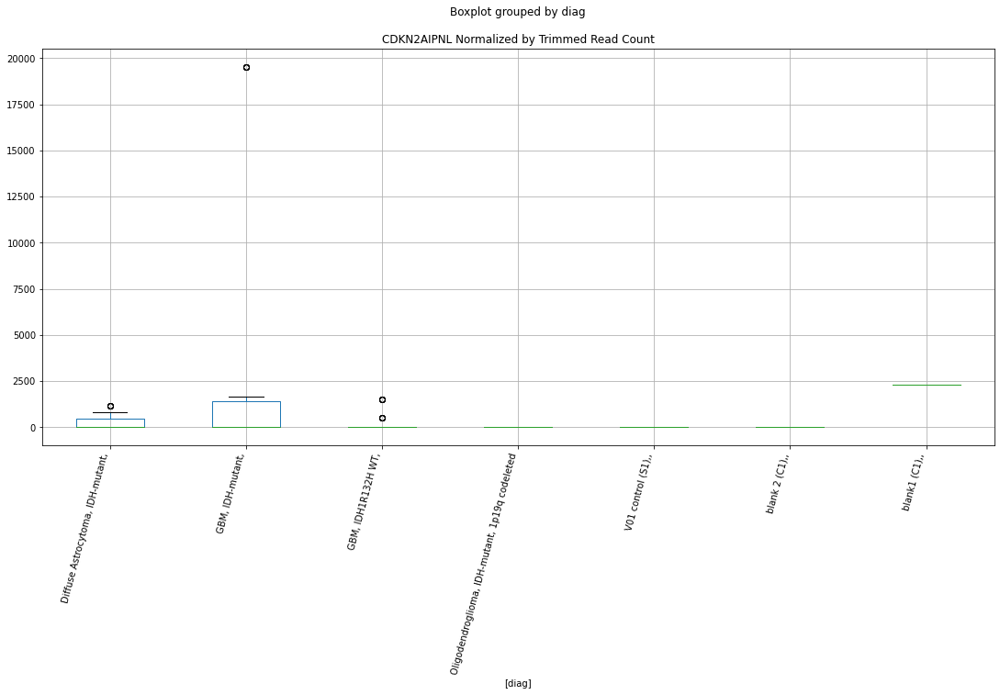

 p : 1.2578384865686186e-05  ( t : 4.657035794777486 ) :  Lexogen  :  bbduk2  :  EGFR
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: EGFR, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: EGFR, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: EGFR, dtype: float64


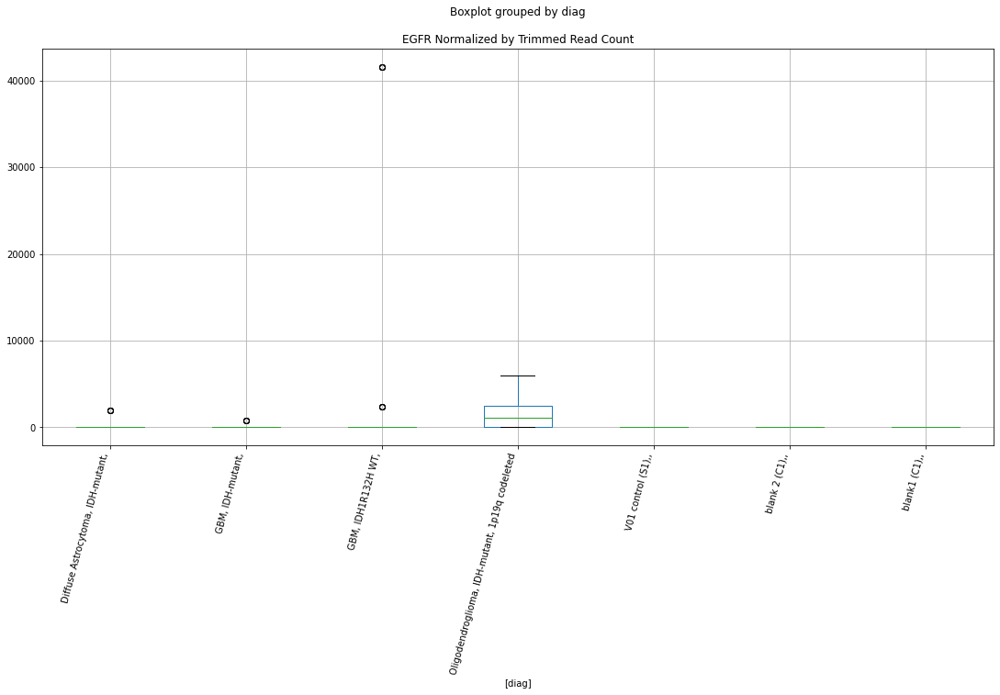

 p : 1.576707418999395e-05  ( t : 4.543913037613584 ) :  D-plex  :  bbduk2  :  IDH1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH1, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: IDH1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH1, dtype: float64


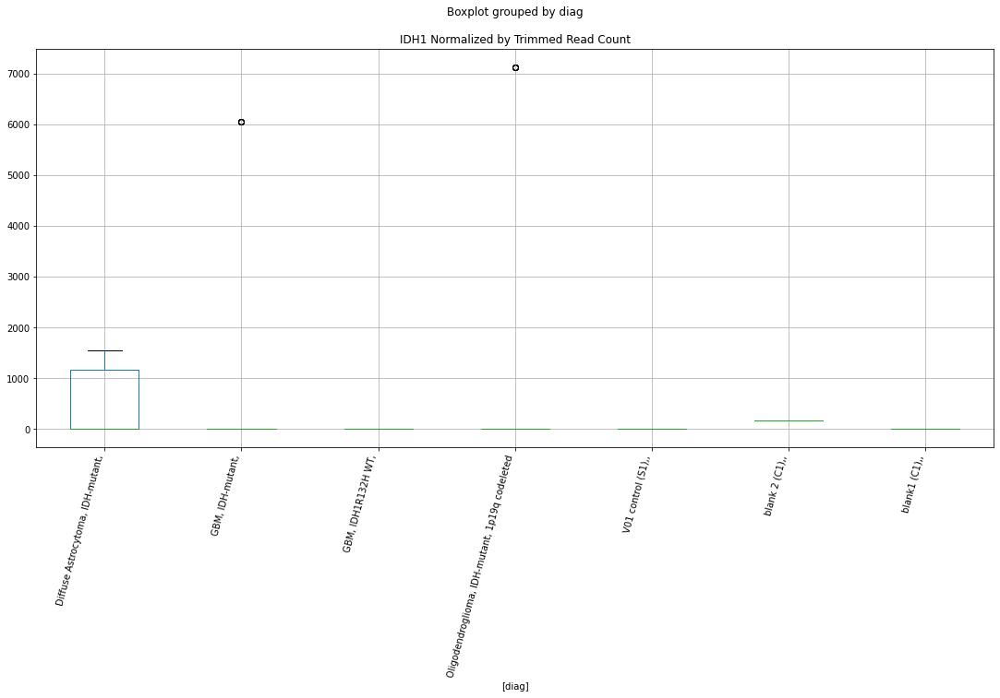

 p : 4.559285314587371e-05  ( t : 4.267958071780525 ) :  D-plex  :  cutadapt2  :  RB1-DT
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: RB1-DT, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: RB1-DT, dtype: float64
2151    577.96
2152    577.96
2153    577.96
2154    577.96
2155    577.96
Name: RB1-DT, dtype: float64


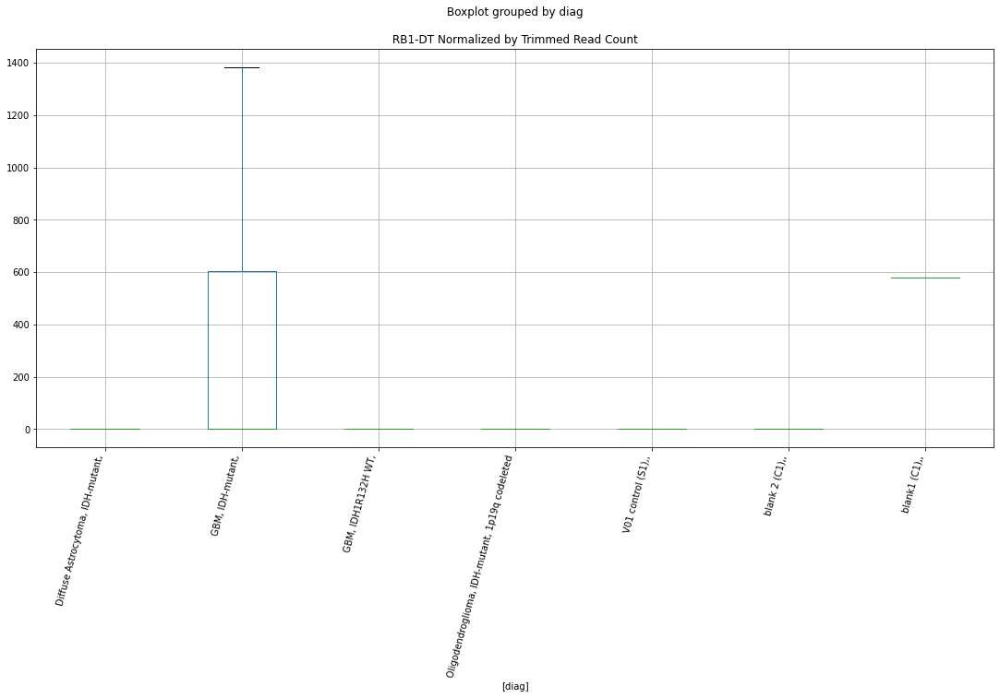

 p : 6.351705315128134e-05  ( t : 4.179605096370542 ) :  D-plex  :  bbduk2  :  NOTCH1
Control and blanks
348     12368.13
349     12368.13
350     12368.13
351     12368.13
352     12368.13
1542    85455.10
1543    85455.10
1544    85455.10
1545    85455.10
1546    85455.10
Name: NOTCH1, dtype: float64
942    64651.83
943    64651.83
944    64651.83
945    64651.83
946    64651.83
Name: NOTCH1, dtype: float64
2136    403421.63
2137    403421.63
2138    403421.63
2139    403421.63
2140    403421.63
Name: NOTCH1, dtype: float64


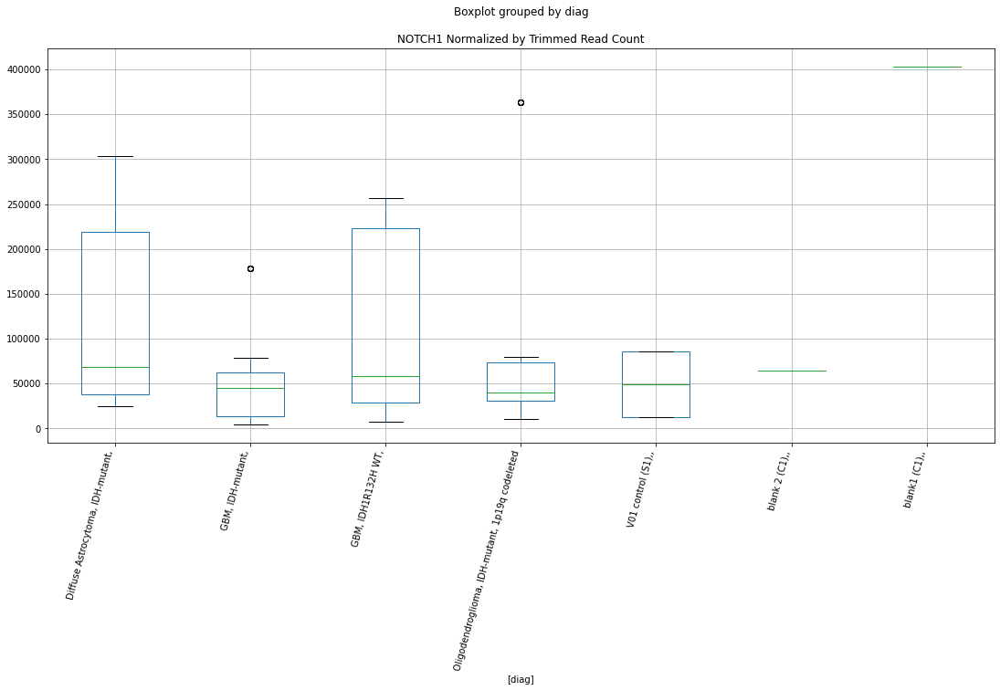

 p : 7.52894173826325e-05  ( t : 4.133853745549875 ) :  D-plex  :  cutadapt2  :  NOTCH1
Control and blanks
363     12121.83
364     12121.83
365     12121.83
366     12121.83
367     12121.83
1557    84550.28
1558    84550.28
1559    84550.28
1560    84550.28
1561    84550.28
Name: NOTCH1, dtype: float64
957    64371.48
958    64371.48
959    64371.48
960    64371.48
961    64371.48
Name: NOTCH1, dtype: float64
2151    394165.88
2152    394165.88
2153    394165.88
2154    394165.88
2155    394165.88
Name: NOTCH1, dtype: float64


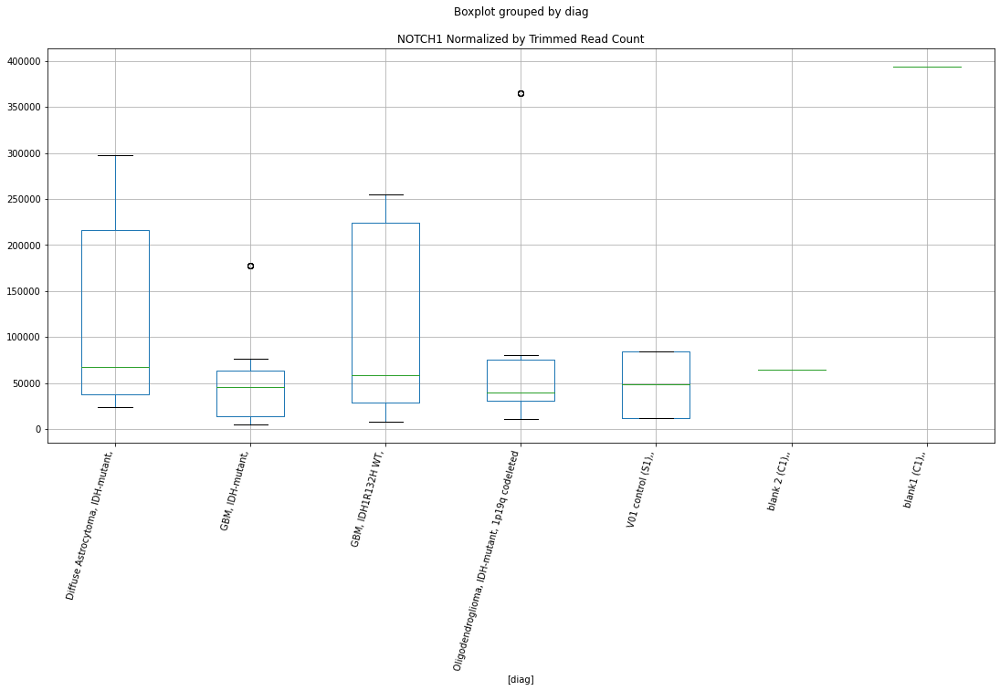

 p : 7.653097747211552e-05  ( t : 4.170541834400939 ) :  Lexogen  :  bbduk2  :  EGFR
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: EGFR, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: EGFR, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: EGFR, dtype: float64


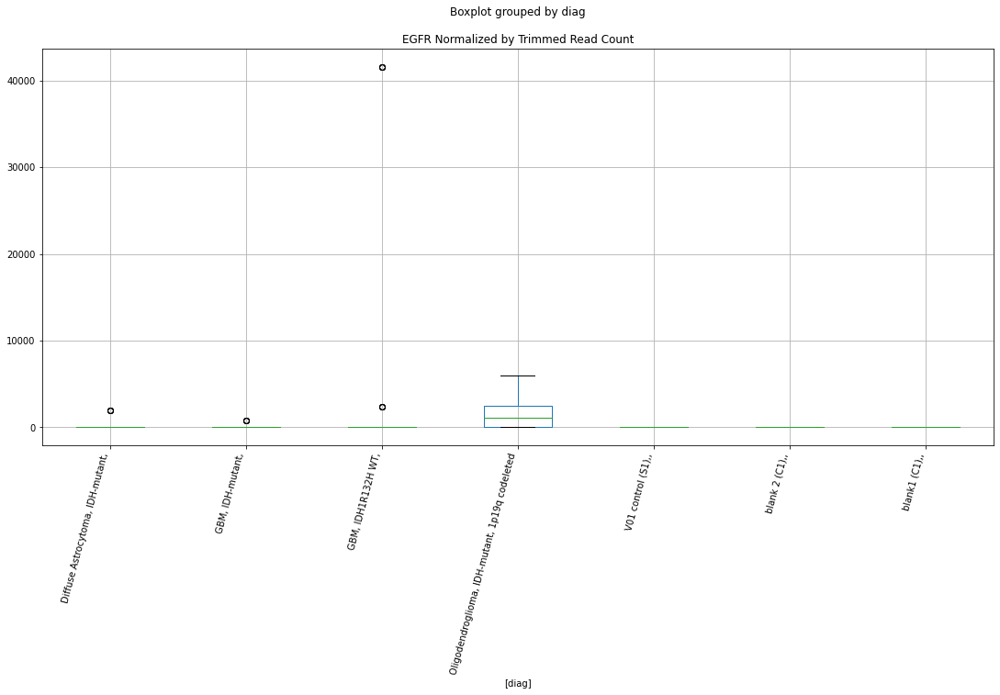

 p : 0.00015785730996308226  ( t : 3.9666848691081875 ) :  Lexogen  :  cutadapt2  :  NOTCH1
Control and blanks
389         0.00
390         0.00
391         0.00
392         0.00
1583    28198.23
1584    28198.23
1585    28198.23
1586    28198.23
Name: NOTCH1, dtype: float64
983    8679.25
984    8679.25
985    8679.25
986    8679.25
Name: NOTCH1, dtype: float64
2177    474.92
2178    474.92
2179    474.92
2180    474.92
Name: NOTCH1, dtype: float64


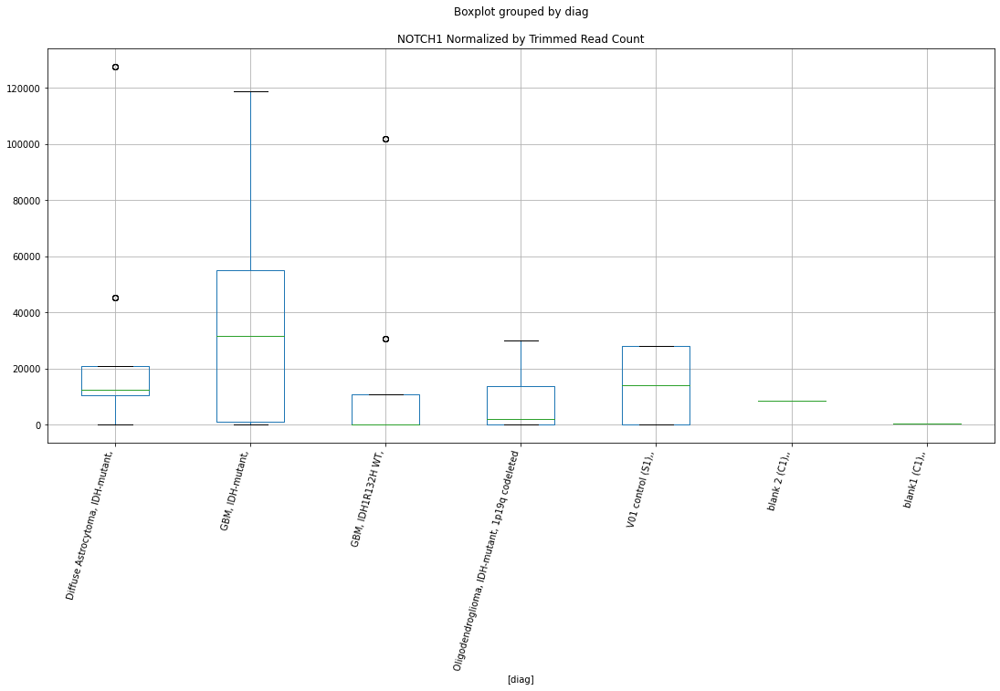

 p : 0.0002094245018907153  ( t : 3.8854601852719695 ) :  Lexogen  :  bbduk2  :  NOTCH1
Control and blanks
377         0.00
378         0.00
379         0.00
380         0.00
1571    28450.12
1572    28450.12
1573    28450.12
1574    28450.12
Name: NOTCH1, dtype: float64
971    8745.8
972    8745.8
973    8745.8
974    8745.8
Name: NOTCH1, dtype: float64
2165    479.03
2166    479.03
2167    479.03
2168    479.03
Name: NOTCH1, dtype: float64


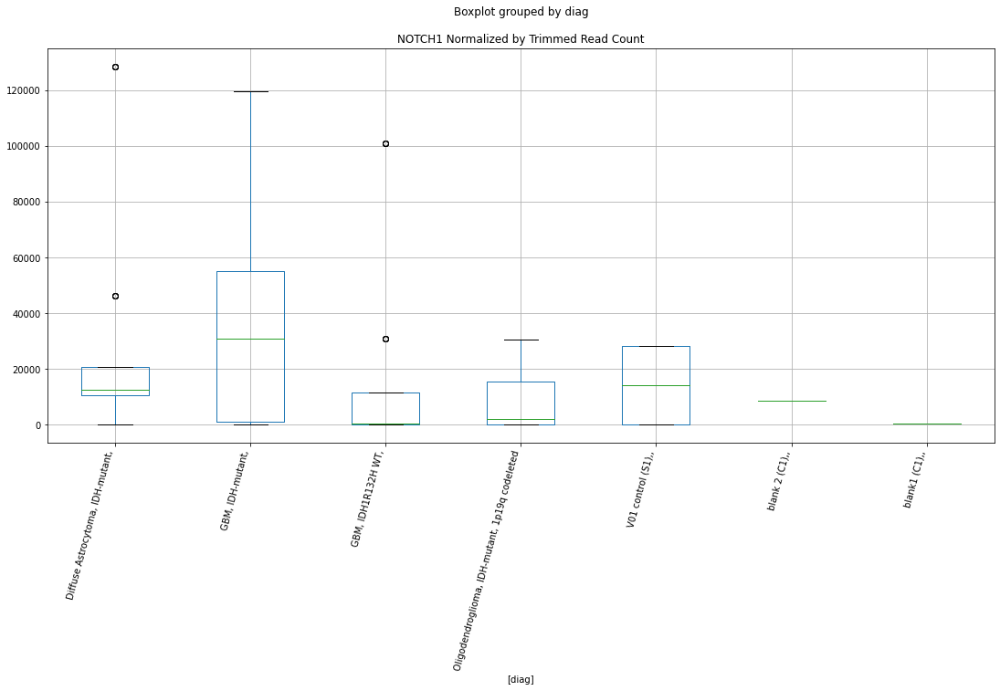

 p : 0.0002825548769047754  ( t : 3.7665232605687047 ) :  D-plex  :  cutadapt2  :  NOTCH1
Control and blanks
363     12121.83
364     12121.83
365     12121.83
366     12121.83
367     12121.83
1557    84550.28
1558    84550.28
1559    84550.28
1560    84550.28
1561    84550.28
Name: NOTCH1, dtype: float64
957    64371.48
958    64371.48
959    64371.48
960    64371.48
961    64371.48
Name: NOTCH1, dtype: float64
2151    394165.88
2152    394165.88
2153    394165.88
2154    394165.88
2155    394165.88
Name: NOTCH1, dtype: float64


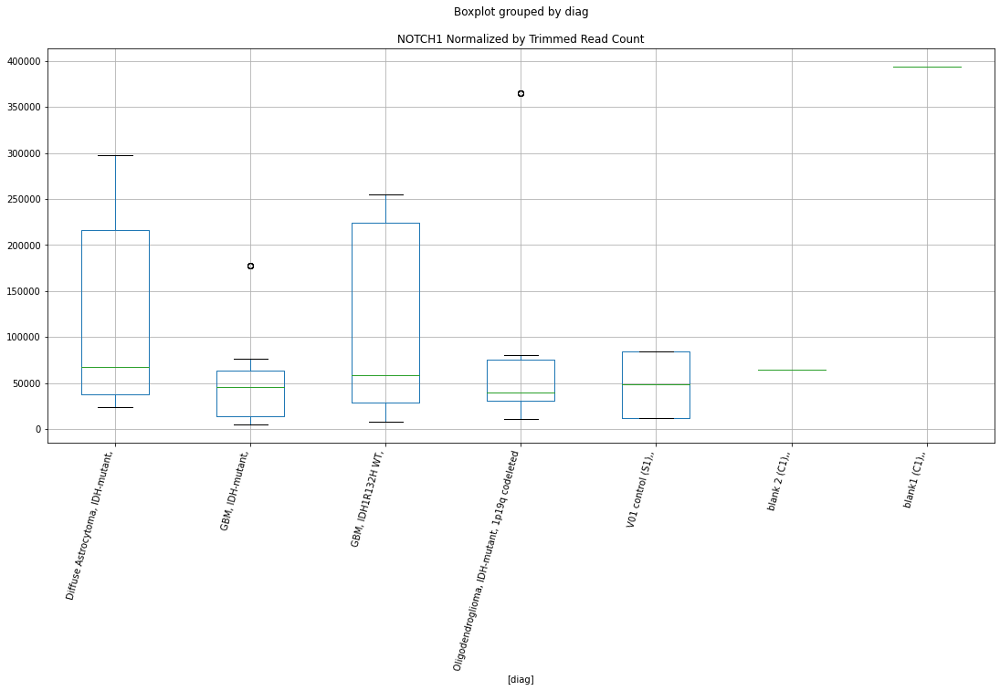

 p : 0.0002947940112514398  ( t : 3.754374431557132 ) :  D-plex  :  bbduk2  :  NOTCH1
Control and blanks
348     12368.13
349     12368.13
350     12368.13
351     12368.13
352     12368.13
1542    85455.10
1543    85455.10
1544    85455.10
1545    85455.10
1546    85455.10
Name: NOTCH1, dtype: float64
942    64651.83
943    64651.83
944    64651.83
945    64651.83
946    64651.83
Name: NOTCH1, dtype: float64
2136    403421.63
2137    403421.63
2138    403421.63
2139    403421.63
2140    403421.63
Name: NOTCH1, dtype: float64


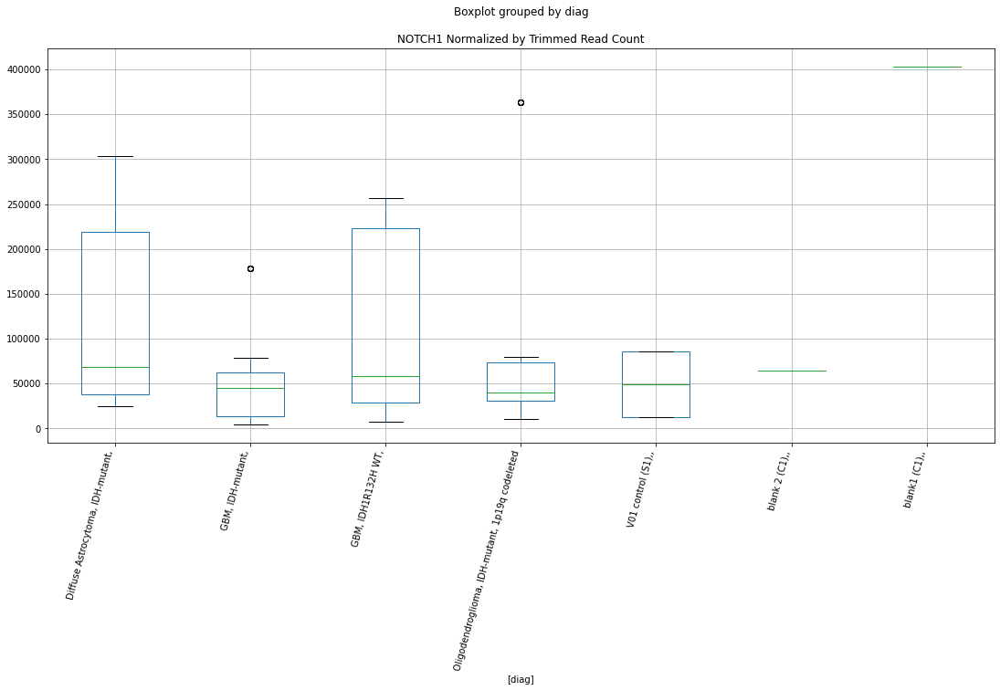

 p : 0.000299216235596244  ( t : 3.7501025323792914 ) :  D-plex  :  bbduk2  :  CDKN2AIPNL
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIPNL, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: CDKN2AIPNL, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2AIPNL, dtype: float64


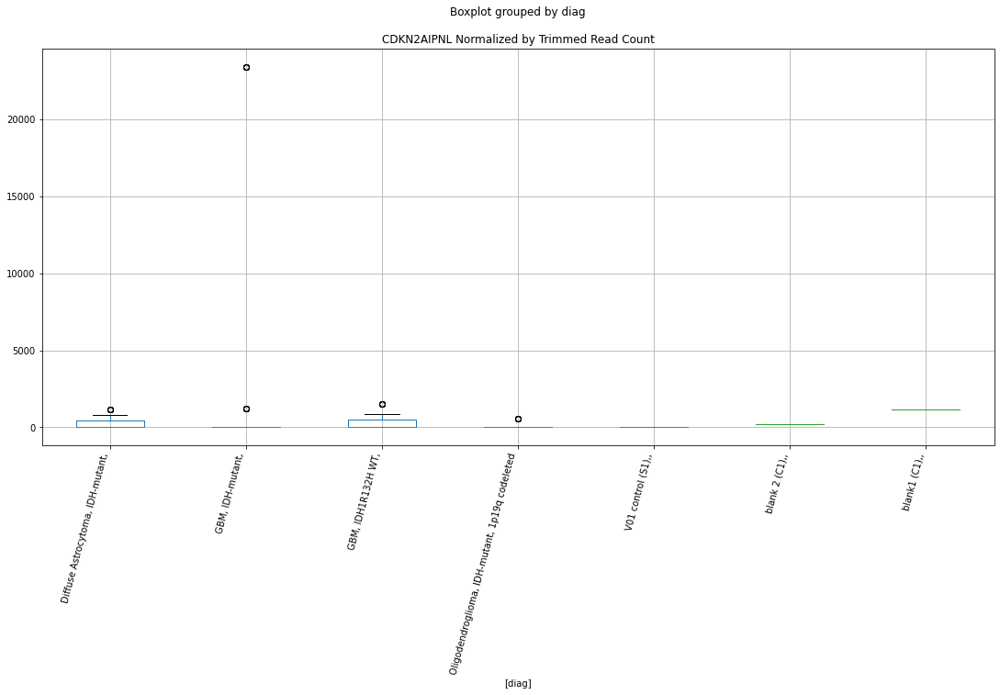

 p : 0.00030022853222329233  ( t : 3.7491330944301158 ) :  D-plex  :  cutadapt2  :  TERT
Control and blanks
363     3030.46
364     3030.46
365     3030.46
366     3030.46
367     3030.46
1557       0.00
1558       0.00
1559       0.00
1560       0.00
1561       0.00
Name: TERT, dtype: float64
957    2821.76
958    2821.76
959    2821.76
960    2821.76
961    2821.76
Name: TERT, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: TERT, dtype: float64


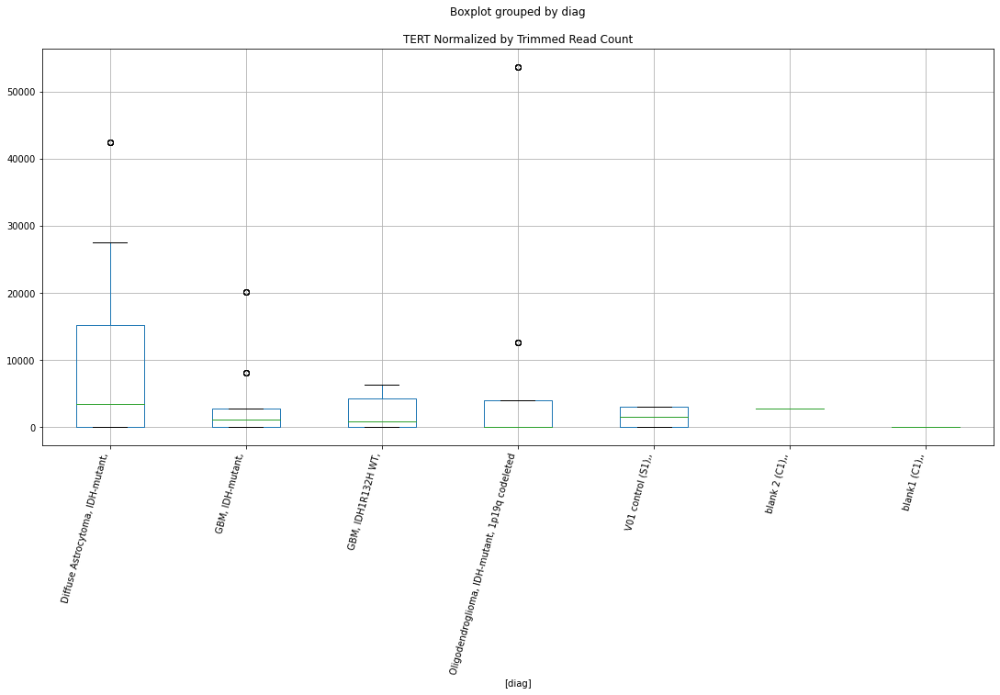

 p : 0.0003312980464943552  ( t : 3.7207964637685453 ) :  D-plex  :  bbduk2  :  CDKN2B-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: CDKN2B-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2B-AS1, dtype: float64


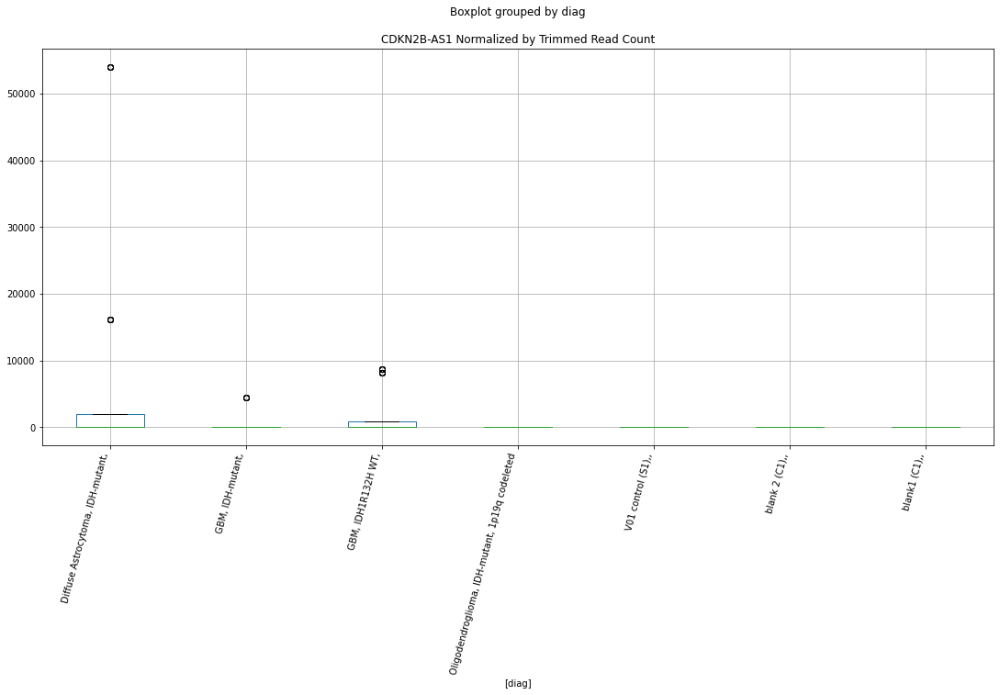

 p : 0.00033672919589964234  ( t : 3.7161040040178066 ) :  D-plex  :  cutadapt2  :  NF1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: NF1, dtype: float64
957    7583.49
958    7583.49
959    7583.49
960    7583.49
961    7583.49
Name: NF1, dtype: float64
2151    8091.38
2152    8091.38
2153    8091.38
2154    8091.38
2155    8091.38
Name: NF1, dtype: float64


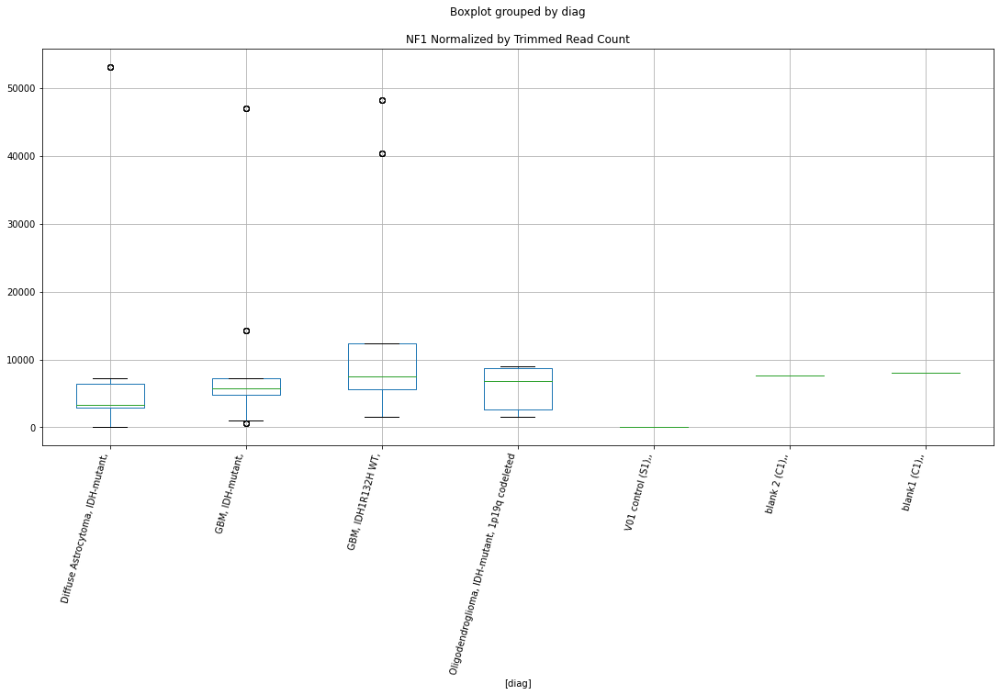

 p : 0.00046264867803406625  ( t : 3.65217226786002 ) :  Lexogen  :  cutadapt2  :  EGFR
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: EGFR, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: EGFR, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: EGFR, dtype: float64


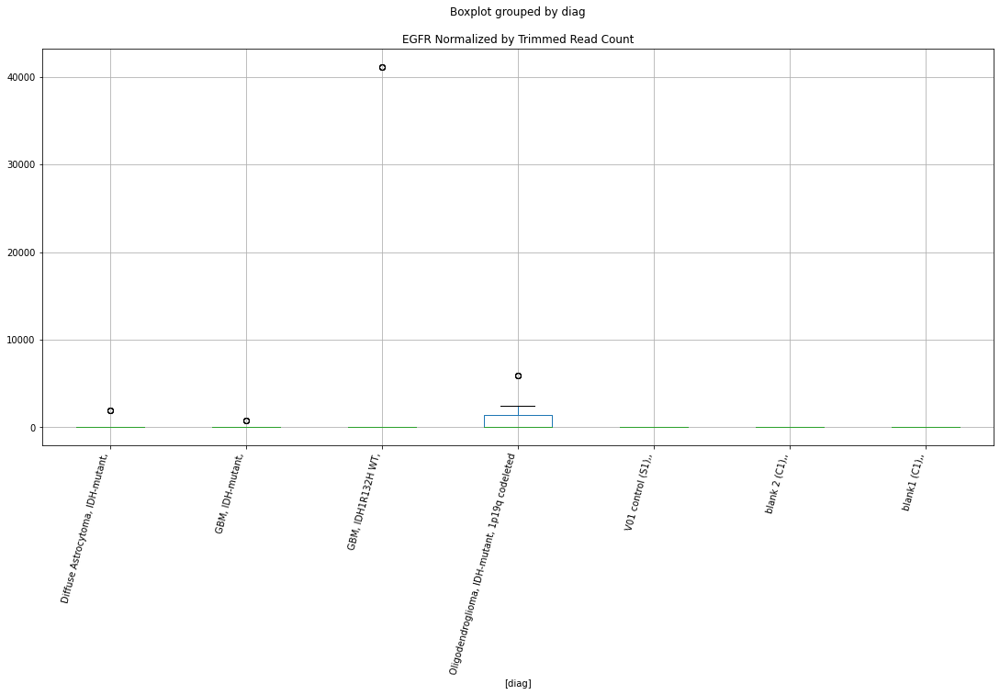

 p : 0.0005390975773758094  ( t : 3.606134889316628 ) :  Lexogen  :  bbduk2  :  CDKN2B
Control and blanks
377       0.00
378       0.00
379       0.00
380       0.00
1571    424.63
1572    424.63
1573    424.63
1574    424.63
Name: CDKN2B, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2B, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2B, dtype: float64


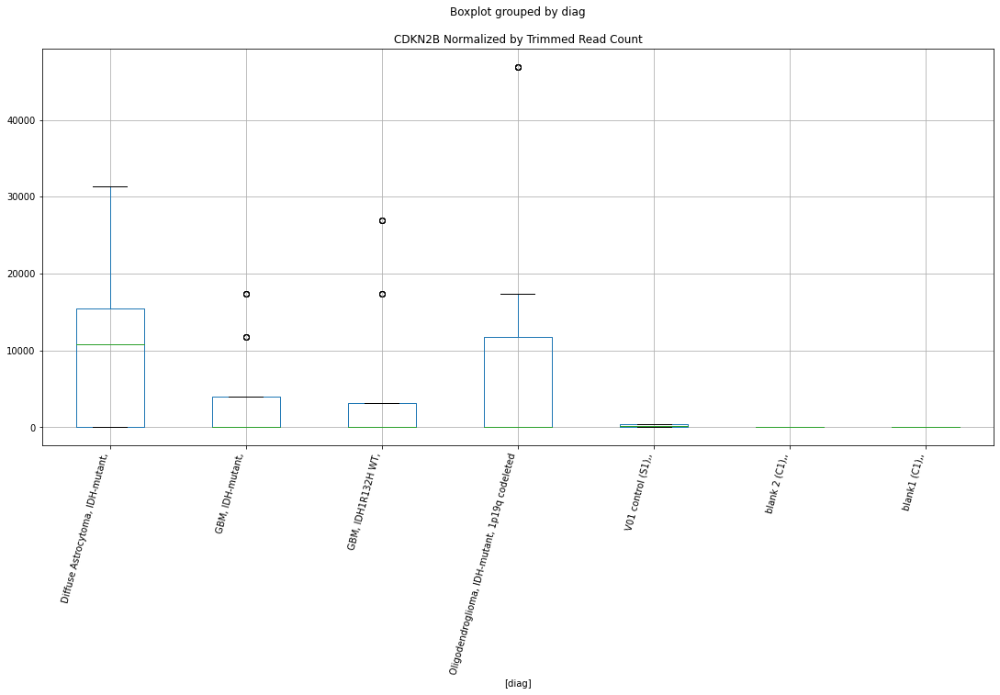

 p : 0.0005884868575323573  ( t : 3.579585109926015 ) :  Lexogen  :  cutadapt2  :  CDKN2B
Control and blanks
389       0.00
390       0.00
391       0.00
392       0.00
1583    420.87
1584    420.87
1585    420.87
1586    420.87
Name: CDKN2B, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2B, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2B, dtype: float64


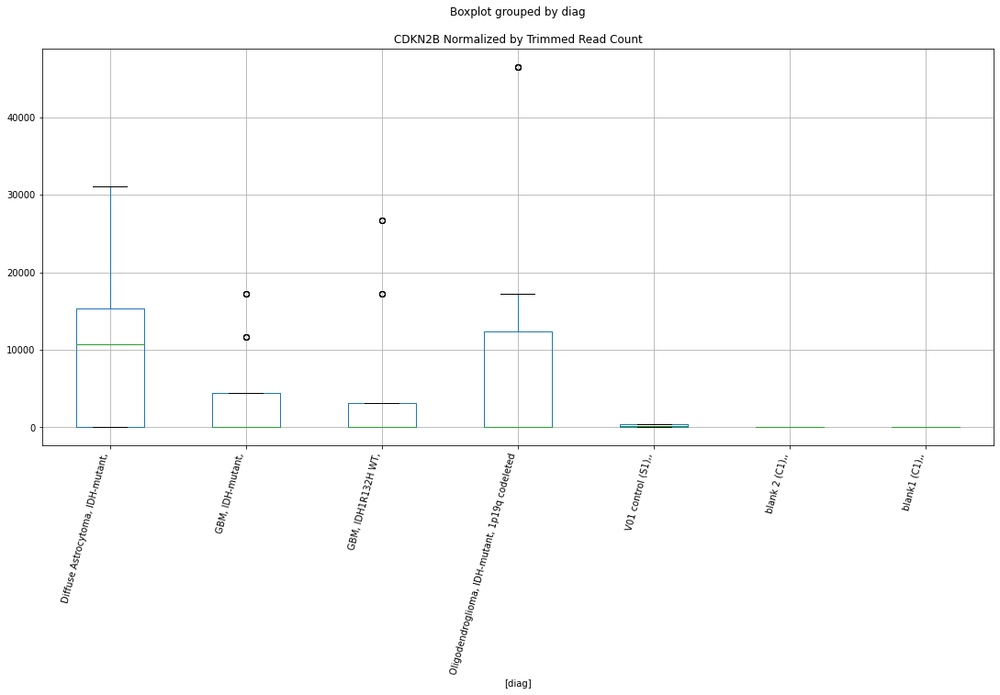

 p : 0.0006669677690329848  ( t : 3.515243879175212 ) :  D-plex  :  bbduk2  :  NF1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: NF1, dtype: float64
942    8059.09
943    8059.09
944    8059.09
945    8059.09
946    8059.09
Name: NF1, dtype: float64
2136    7689.86
2137    7689.86
2138    7689.86
2139    7689.86
2140    7689.86
Name: NF1, dtype: float64


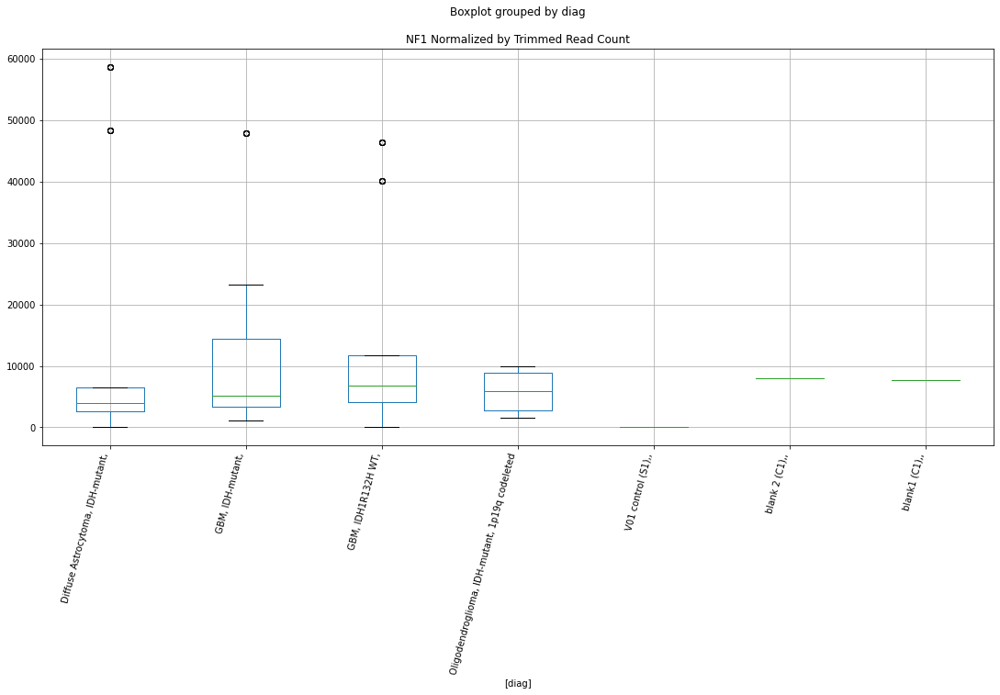

 p : 0.0006917813237670322  ( t : 3.504298319922573 ) :  D-plex  :  bbduk2  :  TERT
Control and blanks
348     3092.03
349     3092.03
350     3092.03
351     3092.03
352     3092.03
1542       0.00
1543       0.00
1544       0.00
1545       0.00
1546       0.00
Name: TERT, dtype: float64
942    2865.46
943    2865.46
944    2865.46
945    2865.46
946    2865.46
Name: TERT, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: TERT, dtype: float64


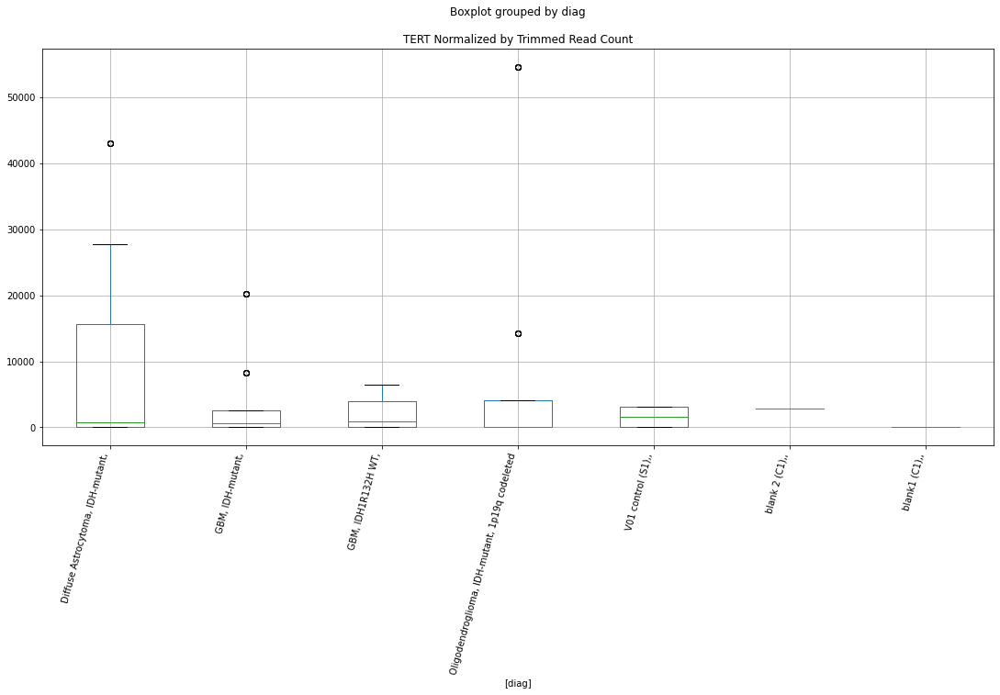

 p : 0.0007156813999254023  ( t : 3.494100506811841 ) :  D-plex  :  cutadapt2  :  IDH1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: IDH1, dtype: float64
957    176.36
958    176.36
959    176.36
960    176.36
961    176.36
Name: IDH1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: IDH1, dtype: float64


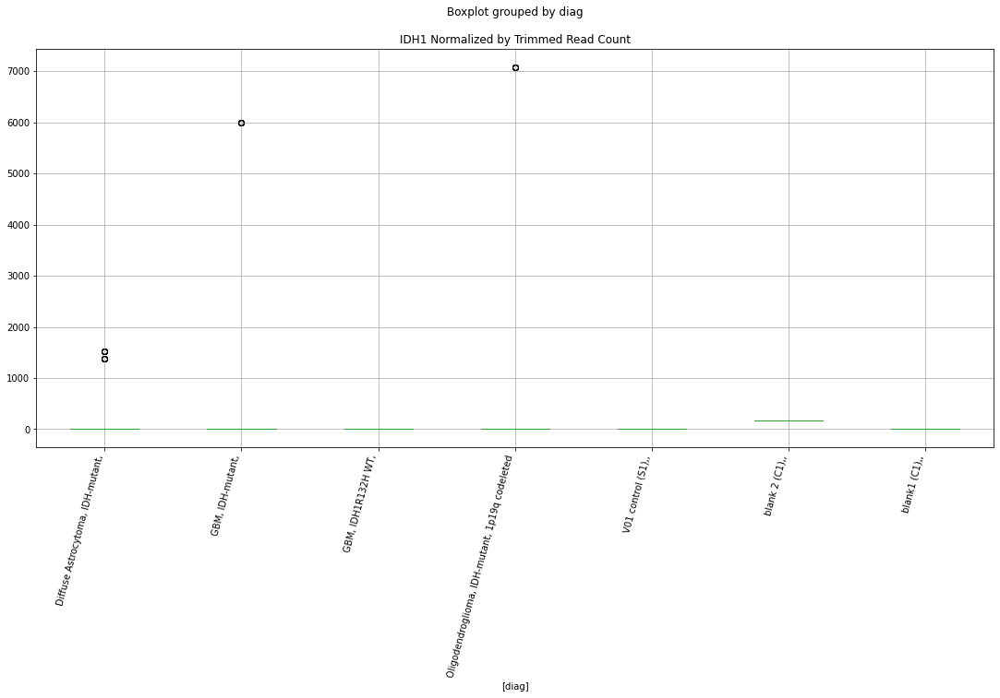

 p : 0.0008583559816295846  ( t : 3.4391831658960488 ) :  D-plex  :  bbduk2  :  IDH2
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH2, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: IDH2, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH2, dtype: float64


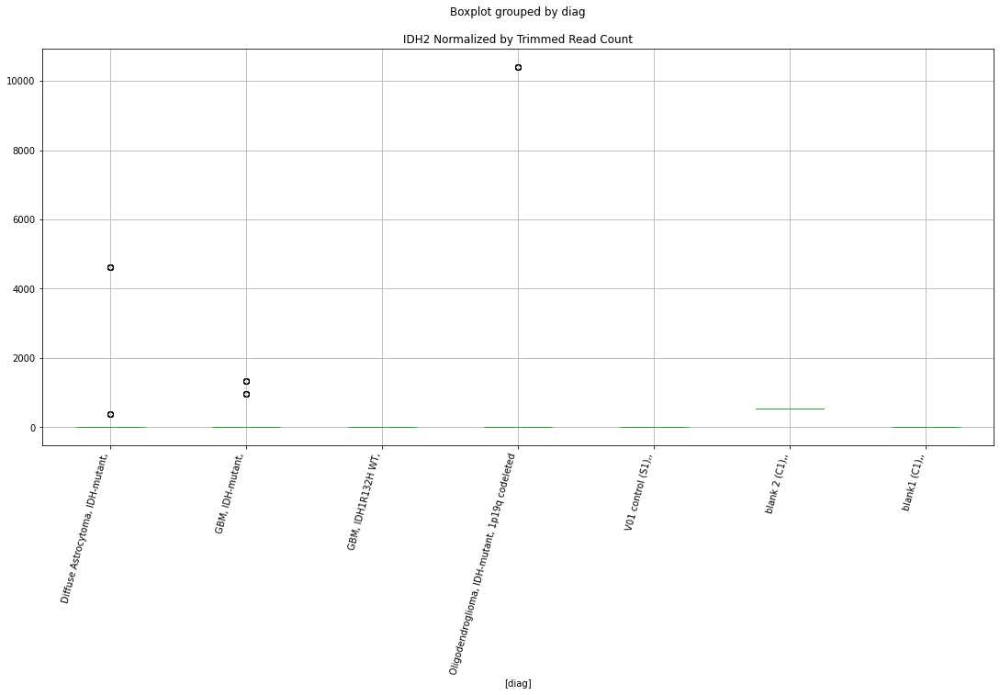

 p : 0.0009021781279911656  ( t : 3.424039134288335 ) :  D-plex  :  bbduk2  :  RB1-DT
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: RB1-DT, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: RB1-DT, dtype: float64
2136    591.53
2137    591.53
2138    591.53
2139    591.53
2140    591.53
Name: RB1-DT, dtype: float64


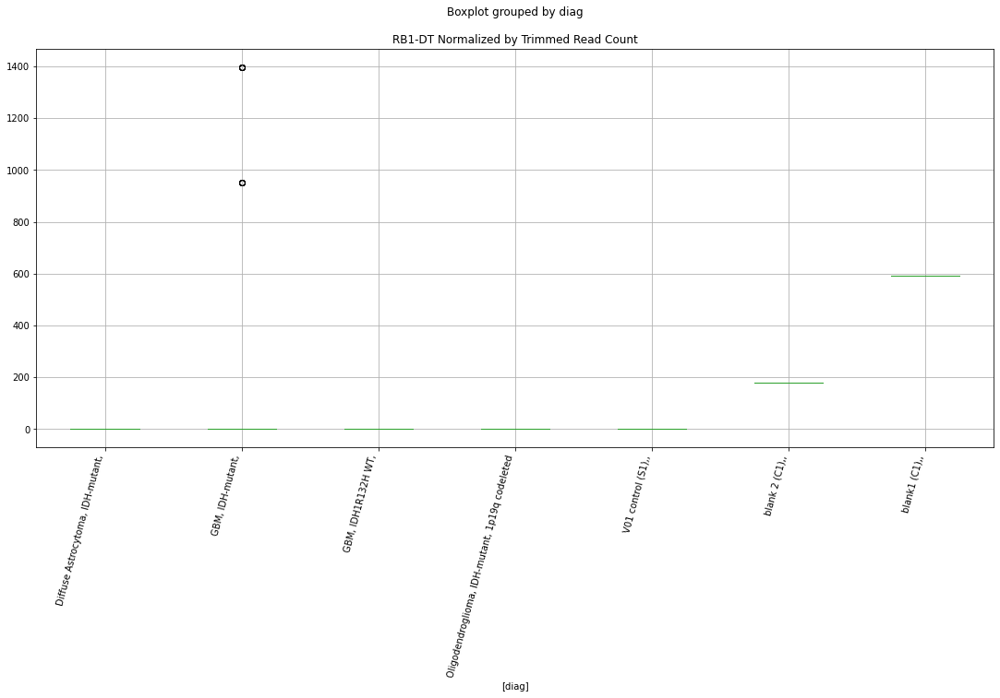

 p : 0.0015089979489161757  ( t : 3.2648859997092896 ) :  D-plex  :  cutadapt2  :  CDKN2AIP
Control and blanks
363        0.00
364        0.00
365        0.00
366        0.00
367        0.00
1557    1761.46
1558    1761.46
1559    1761.46
1560    1761.46
1561    1761.46
Name: CDKN2AIP, dtype: float64
957    705.44
958    705.44
959    705.44
960    705.44
961    705.44
Name: CDKN2AIP, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIP, dtype: float64


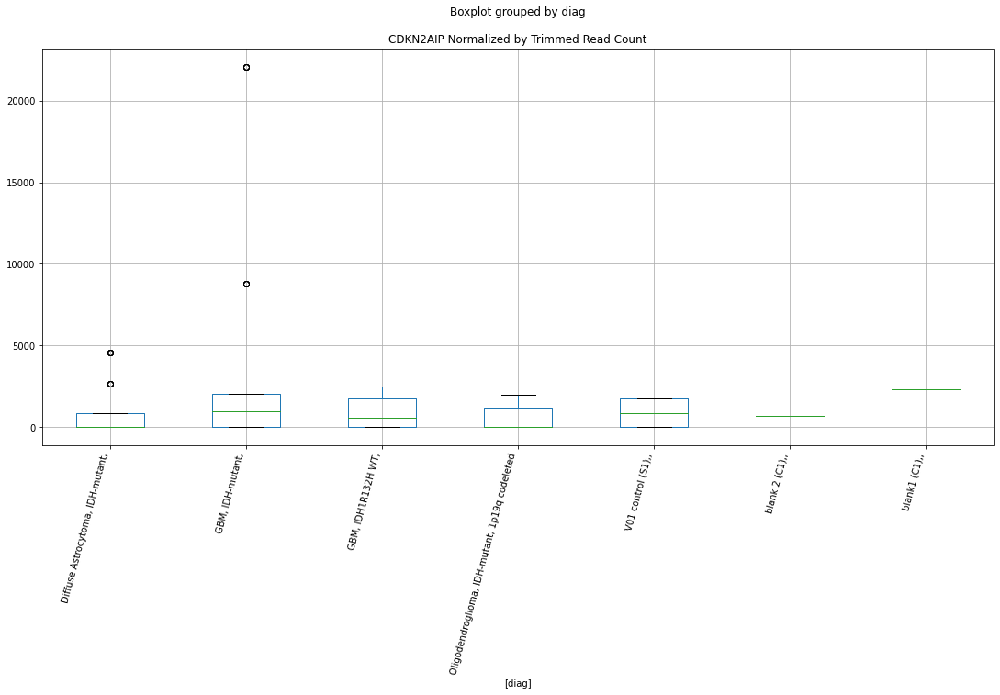

 p : 0.0020659913784491575  ( t : 3.1650748526316934 ) :  D-plex  :  bbduk2  :  CDKN2AIP
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIP, dtype: float64
942    716.36
943    716.36
944    716.36
945    716.36
946    716.36
Name: CDKN2AIP, dtype: float64
2136    2366.11
2137    2366.11
2138    2366.11
2139    2366.11
2140    2366.11
Name: CDKN2AIP, dtype: float64


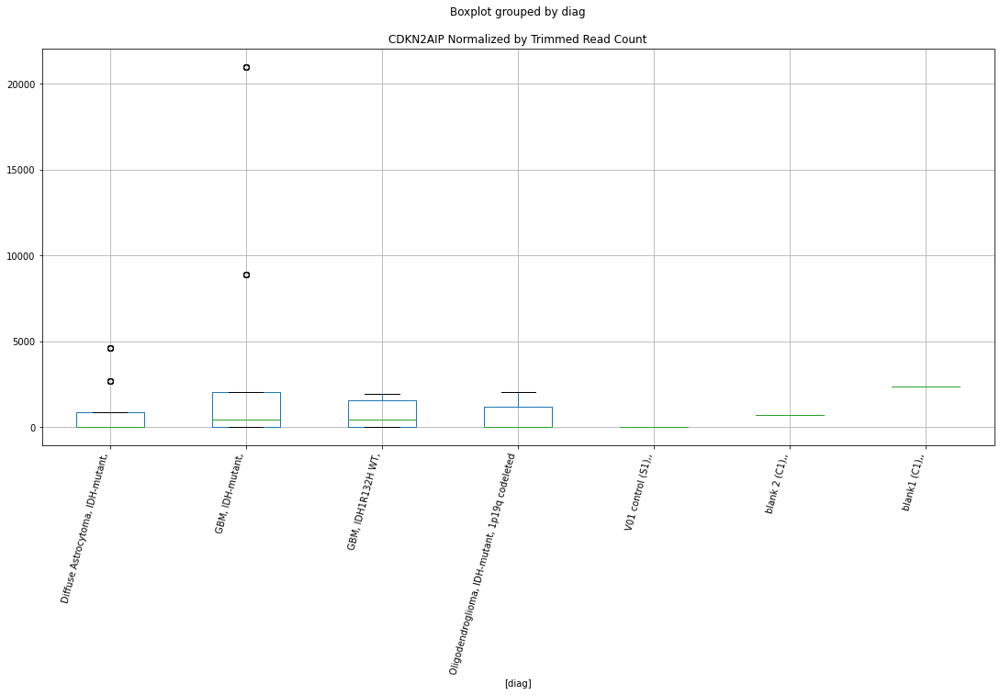

 p : 0.002302868039029024  ( t : 3.149093049411445 ) :  Lexogen  :  cutadapt2  :  EGFR
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: EGFR, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: EGFR, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: EGFR, dtype: float64


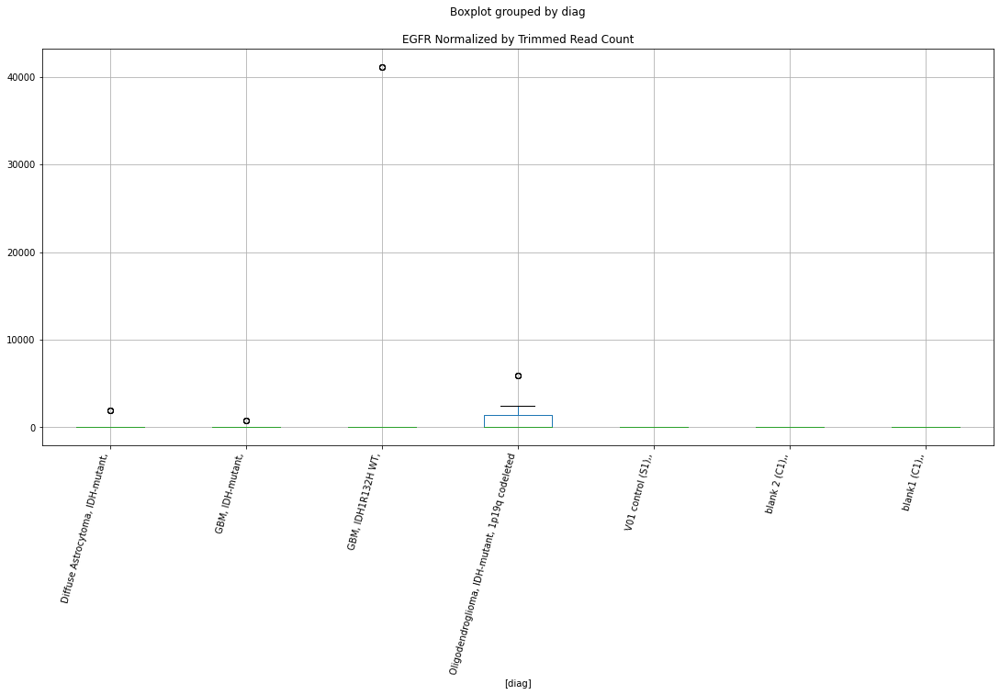

 p : 0.002513044553980164  ( t : 3.101751524458824 ) :  D-plex  :  bbduk2  :  CDKN2AIPNL
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIPNL, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: CDKN2AIPNL, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2AIPNL, dtype: float64


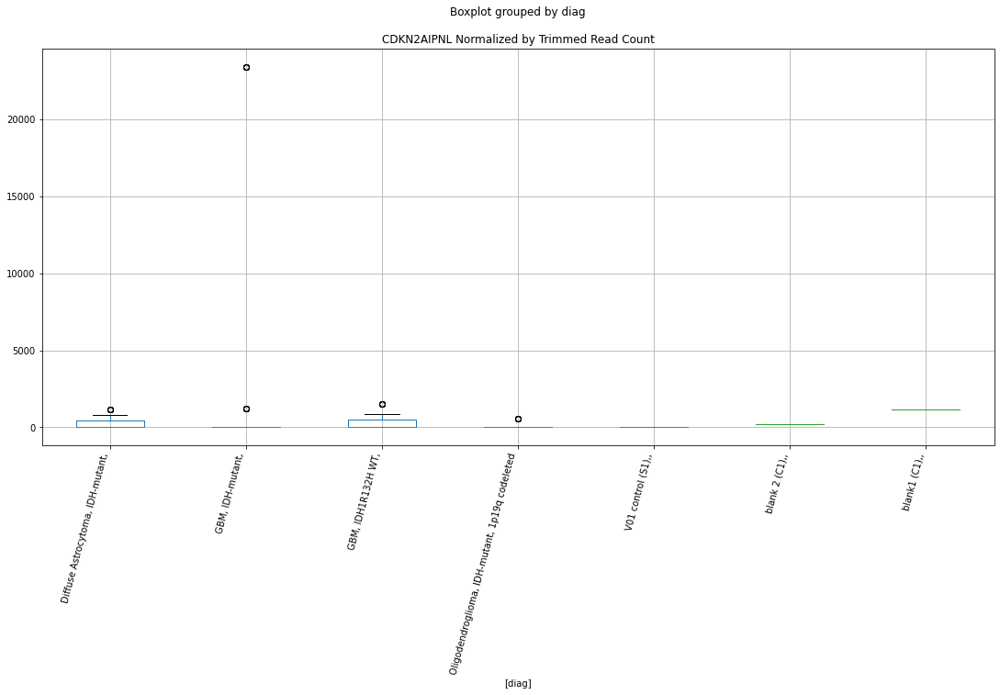

 p : 0.002536244410616757  ( t : 3.0987593780706866 ) :  D-plex  :  bbduk2  :  CDKN2B-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: CDKN2B-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2B-AS1, dtype: float64


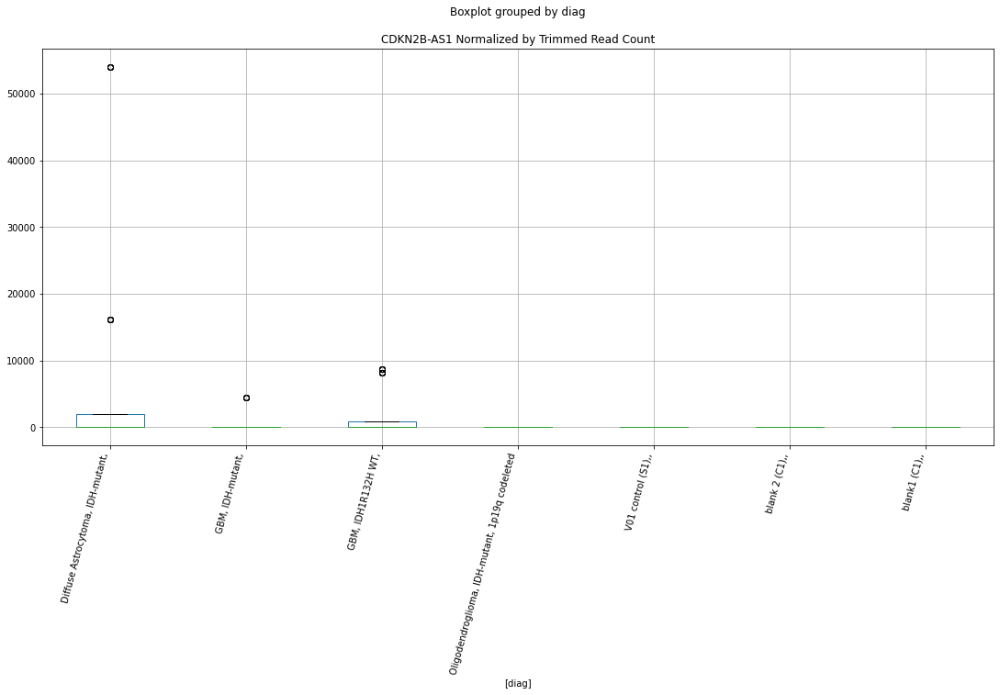

 p : 0.002551860011226676  ( t : 3.096759671527888 ) :  D-plex  :  cutadapt2  :  CDKN2B-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B-AS1, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B-AS1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B-AS1, dtype: float64


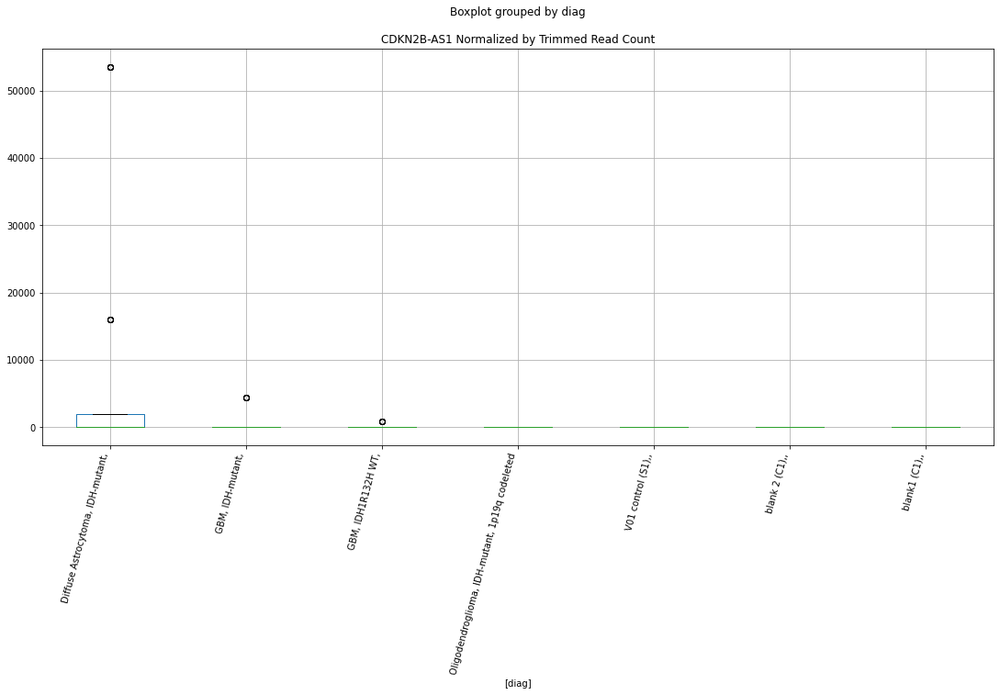

 p : 0.0028754580395041274  ( t : 3.057687995018727 ) :  D-plex  :  cutadapt2  :  CDKN2B-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B-AS1, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B-AS1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B-AS1, dtype: float64


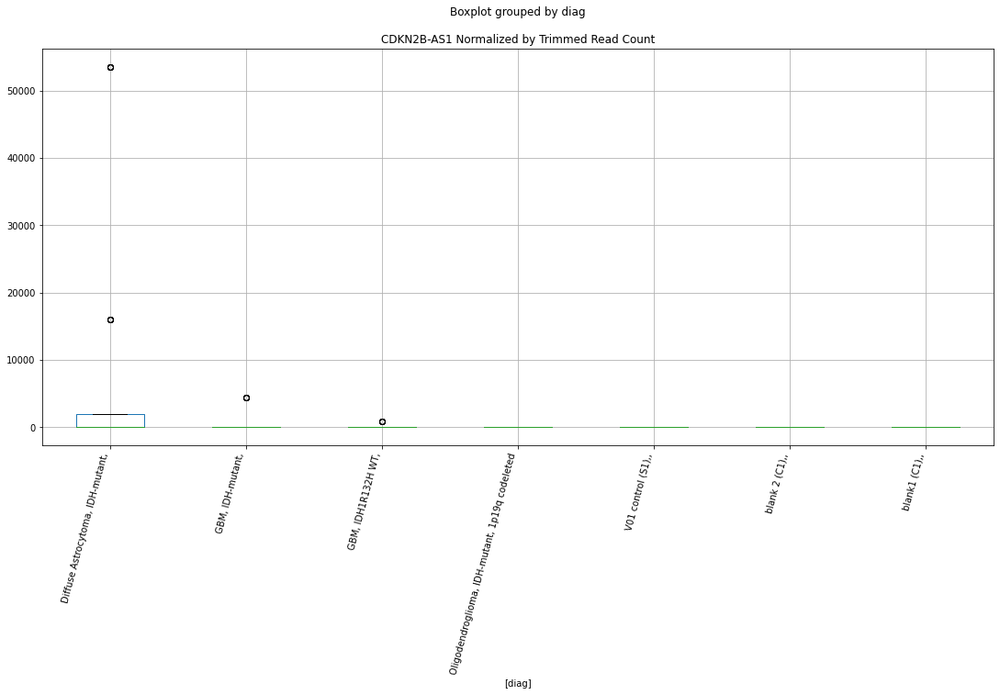

 p : 0.0029607685355941774  ( t : 3.0480680353270126 ) :  D-plex  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2AIPNL, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2AIPNL, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIPNL, dtype: float64


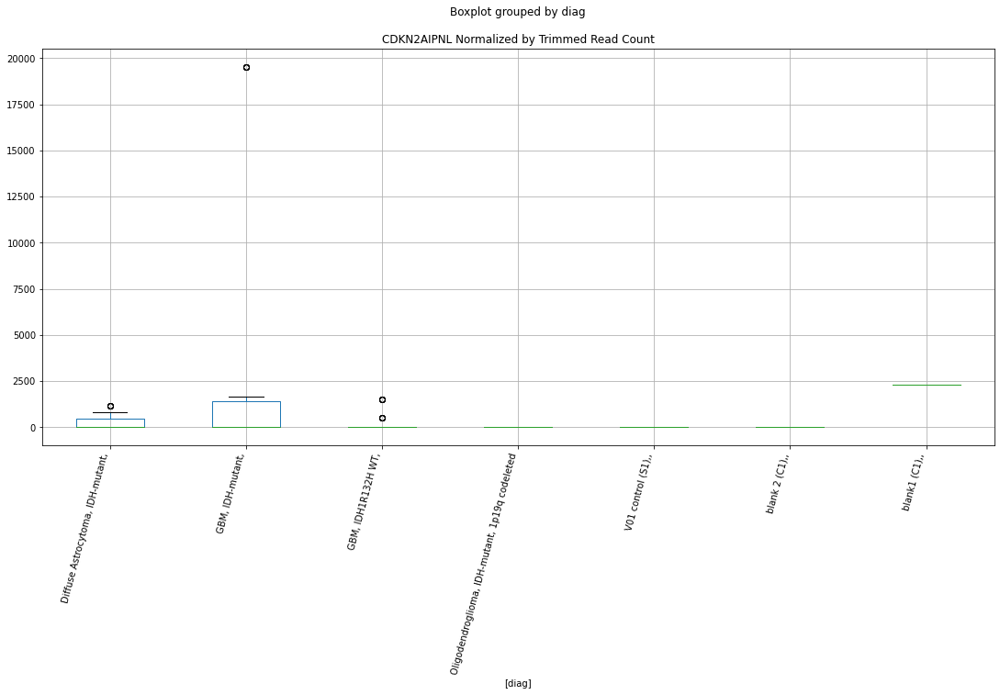

 p : 0.00302738956810878  ( t : 3.0407325251692345 ) :  D-plex  :  cutadapt2  :  RB1
Control and blanks
363         0.00
364         0.00
365         0.00
366         0.00
367         0.00
1557    26421.96
1558    26421.96
1559    26421.96
1560    26421.96
1561    26421.96
Name: RB1, dtype: float64
957    352.72
958    352.72
959    352.72
960    352.72
961    352.72
Name: RB1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: RB1, dtype: float64


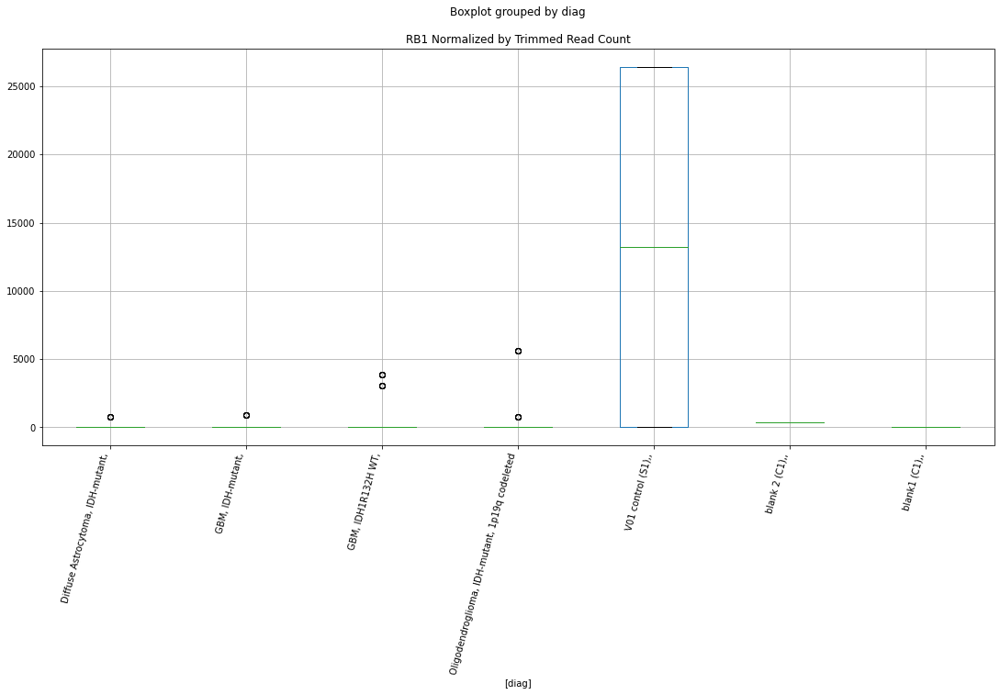

 p : 0.0030796584072075436  ( t : 3.0525327351858618 ) :  Lexogen  :  cutadapt2  :  NOTCH1
Control and blanks
389         0.00
390         0.00
391         0.00
392         0.00
1583    28198.23
1584    28198.23
1585    28198.23
1586    28198.23
Name: NOTCH1, dtype: float64
983    8679.25
984    8679.25
985    8679.25
986    8679.25
Name: NOTCH1, dtype: float64
2177    474.92
2178    474.92
2179    474.92
2180    474.92
Name: NOTCH1, dtype: float64


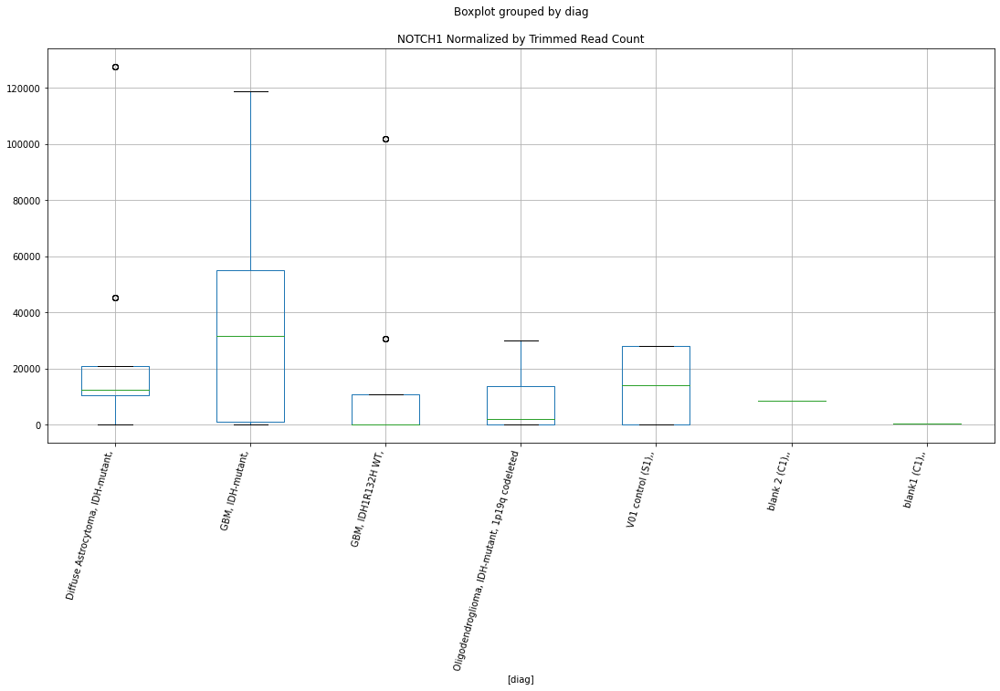

 p : 0.003157130142141097  ( t : 3.0441879702642898 ) :  Lexogen  :  bbduk2  :  NF1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: NF1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: NF1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: NF1, dtype: float64


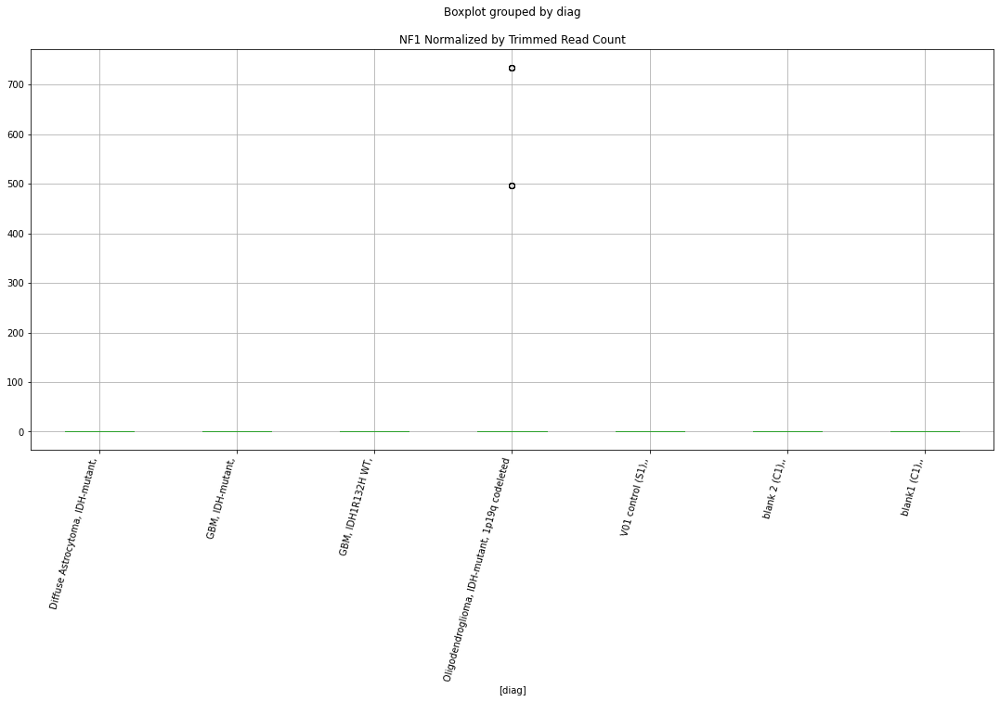

 p : 0.0033118588853520347  ( t : 3.0280757305331 ) :  Lexogen  :  cutadapt2  :  RB1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1, dtype: float64


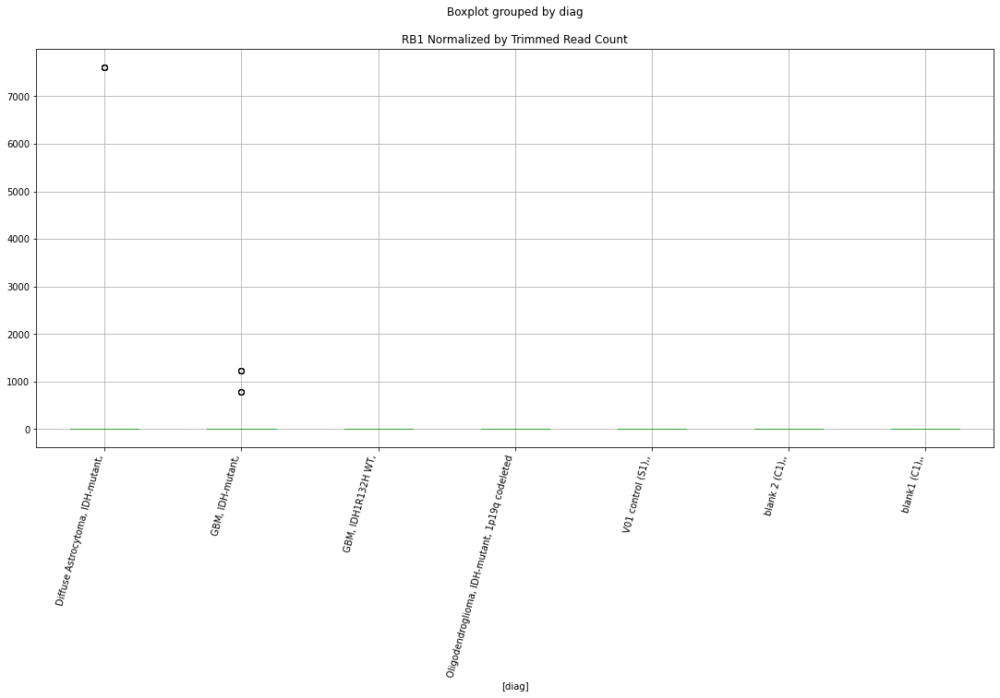

 p : 0.00331944597262842  ( t : 3.027303766275059 ) :  Lexogen  :  bbduk2  :  RB1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1, dtype: float64


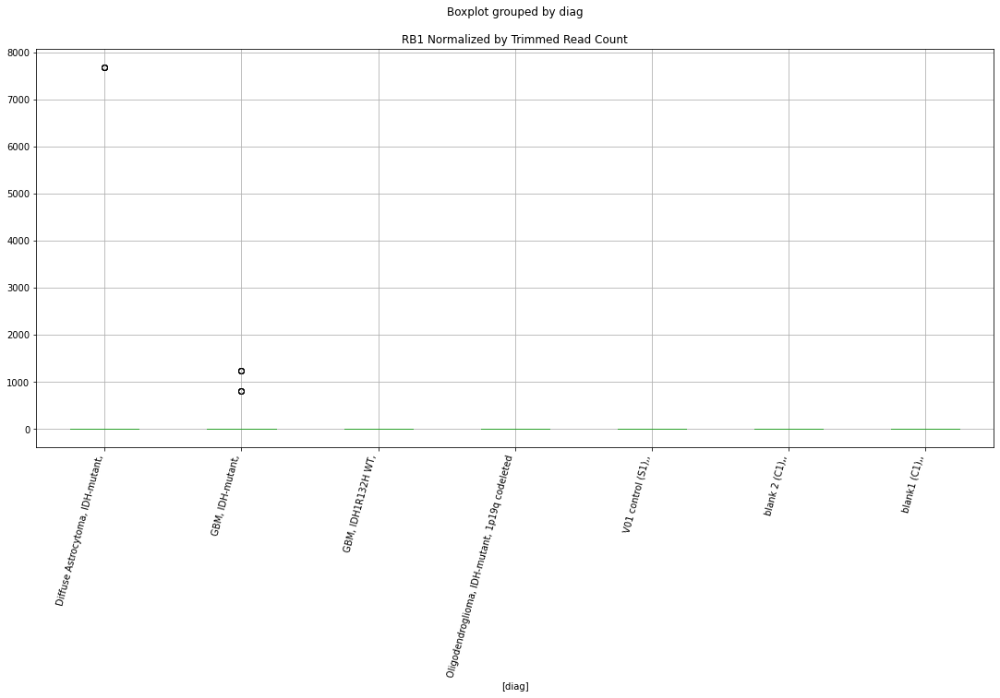

 p : 0.0035535276954919166  ( t : 3.004256423671656 ) :  Lexogen  :  bbduk2  :  NOTCH1
Control and blanks
377         0.00
378         0.00
379         0.00
380         0.00
1571    28450.12
1572    28450.12
1573    28450.12
1574    28450.12
Name: NOTCH1, dtype: float64
971    8745.8
972    8745.8
973    8745.8
974    8745.8
Name: NOTCH1, dtype: float64
2165    479.03
2166    479.03
2167    479.03
2168    479.03
Name: NOTCH1, dtype: float64


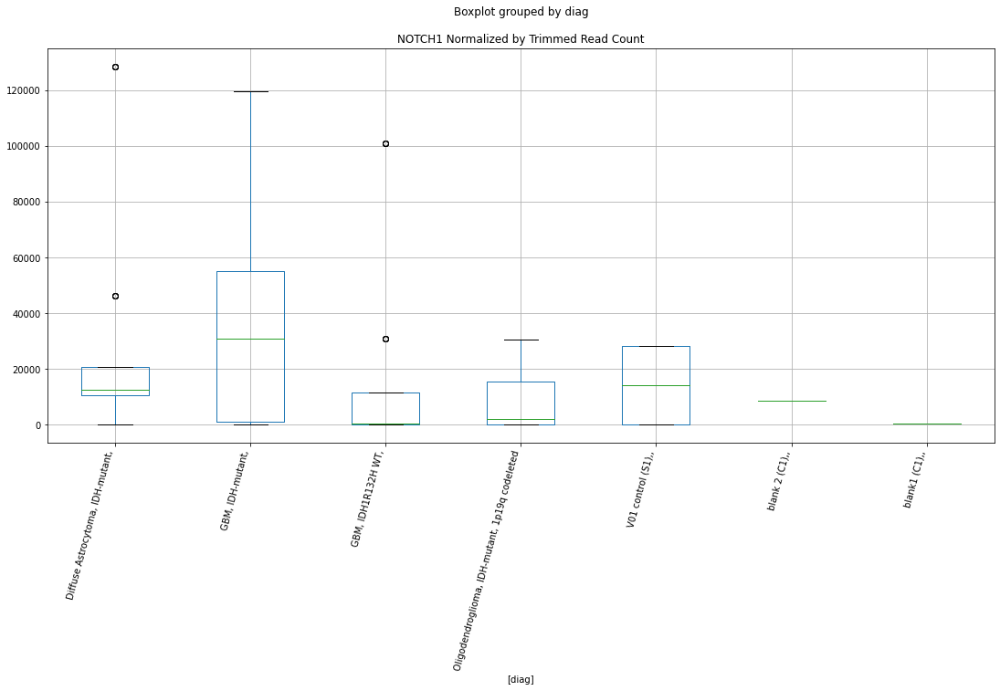

 p : 0.003937545139893175  ( t : 2.9531452383707864 ) :  D-plex  :  cutadapt2  :  RB1
Control and blanks
363         0.00
364         0.00
365         0.00
366         0.00
367         0.00
1557    26421.96
1558    26421.96
1559    26421.96
1560    26421.96
1561    26421.96
Name: RB1, dtype: float64
957    352.72
958    352.72
959    352.72
960    352.72
961    352.72
Name: RB1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: RB1, dtype: float64


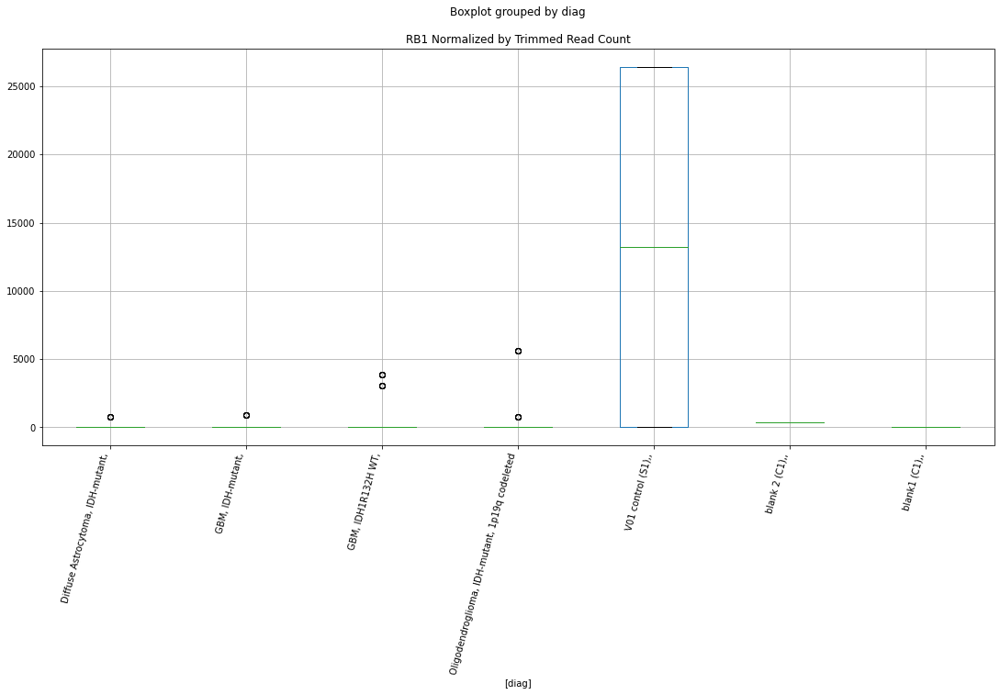

 p : 0.00393822288047064  ( t : 2.9530873103208166 ) :  D-plex  :  bbduk2  :  CDKN2AIP
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIP, dtype: float64
942    716.36
943    716.36
944    716.36
945    716.36
946    716.36
Name: CDKN2AIP, dtype: float64
2136    2366.11
2137    2366.11
2138    2366.11
2139    2366.11
2140    2366.11
Name: CDKN2AIP, dtype: float64


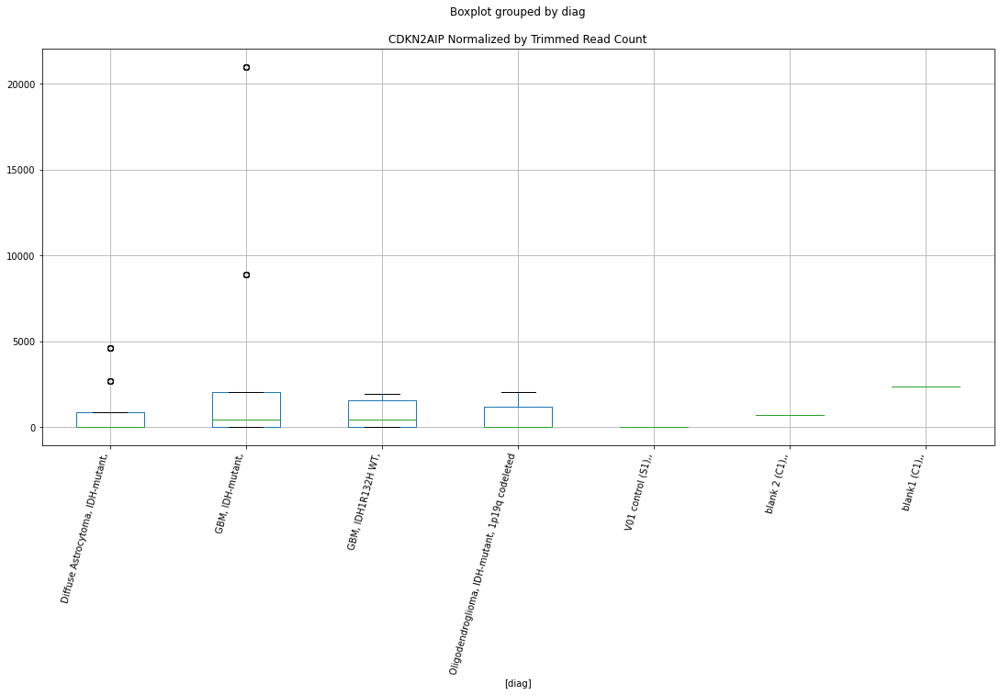

 p : 0.004066244824866862  ( t : 2.9423064592452035 ) :  D-plex  :  cutadapt2  :  CDKN2AIP
Control and blanks
363        0.00
364        0.00
365        0.00
366        0.00
367        0.00
1557    1761.46
1558    1761.46
1559    1761.46
1560    1761.46
1561    1761.46
Name: CDKN2AIP, dtype: float64
957    705.44
958    705.44
959    705.44
960    705.44
961    705.44
Name: CDKN2AIP, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIP, dtype: float64


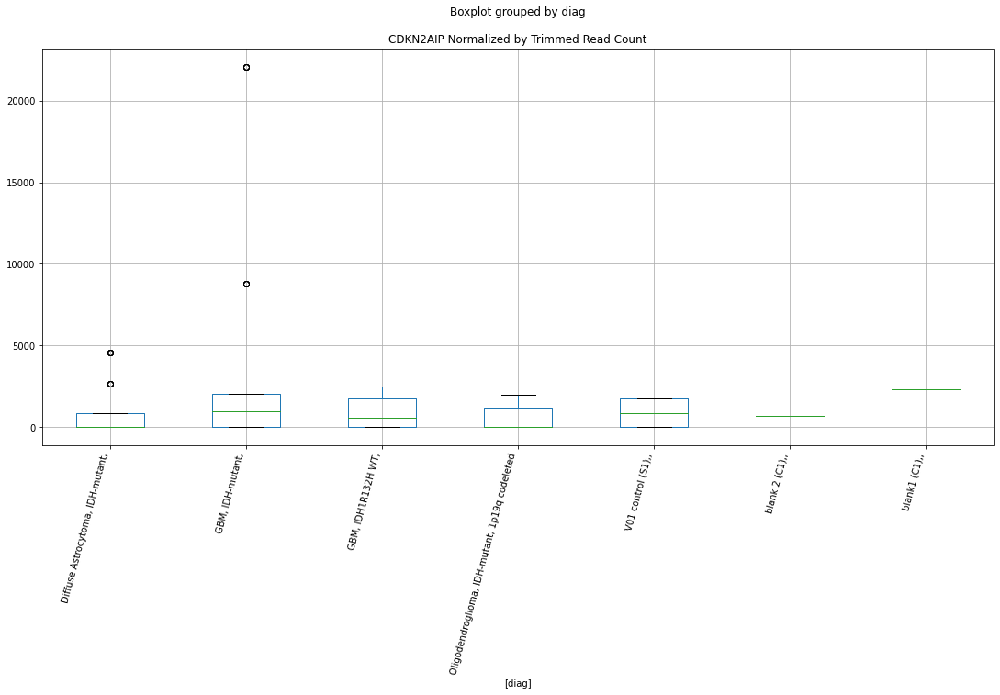

 p : 0.004627514537521694  ( t : 2.8984532716104154 ) :  D-plex  :  bbduk2  :  CDKN2B-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: CDKN2B-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2B-AS1, dtype: float64


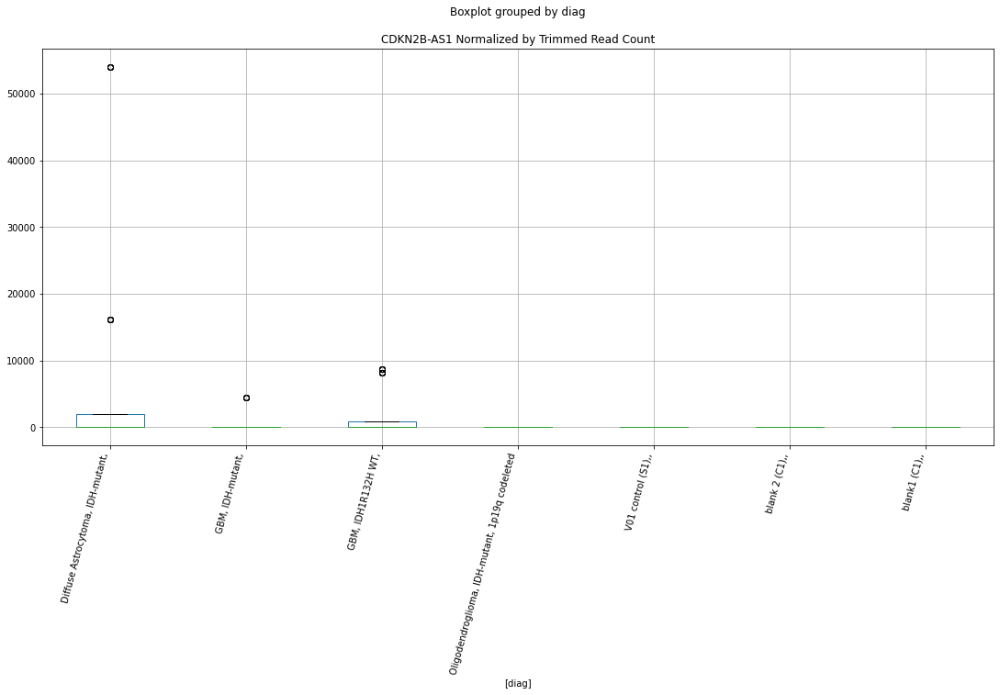

 p : 0.00464699655625367  ( t : 2.897020783740702 ) :  D-plex  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2AIPNL, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2AIPNL, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIPNL, dtype: float64


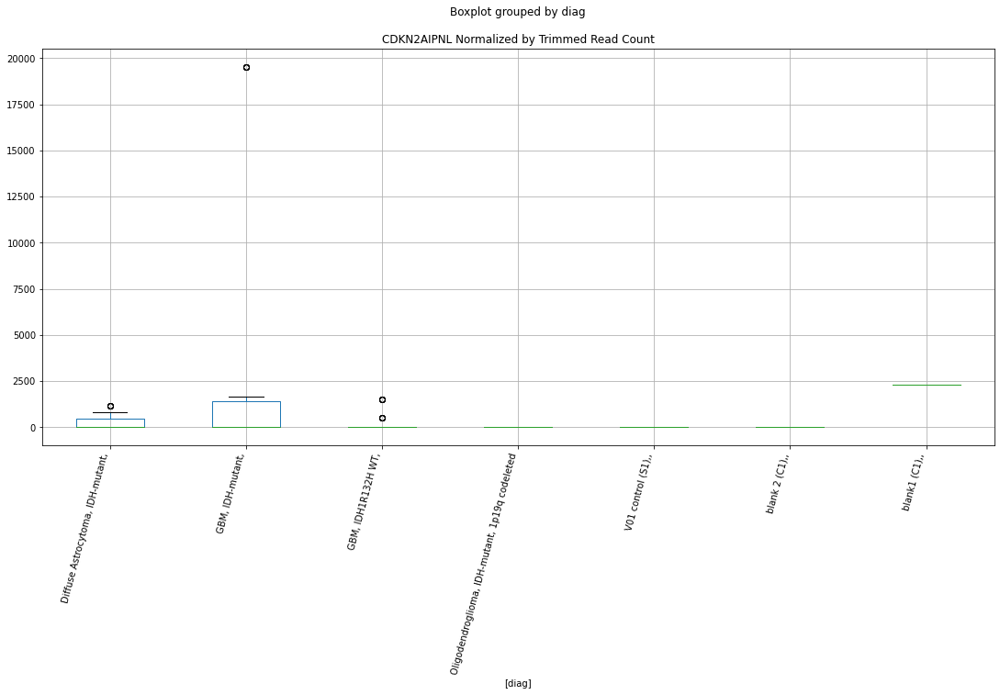

 p : 0.004651862662325749  ( t : 2.89666384701151 ) :  D-plex  :  cutadapt2  :  CDKN2B-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B-AS1, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B-AS1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B-AS1, dtype: float64


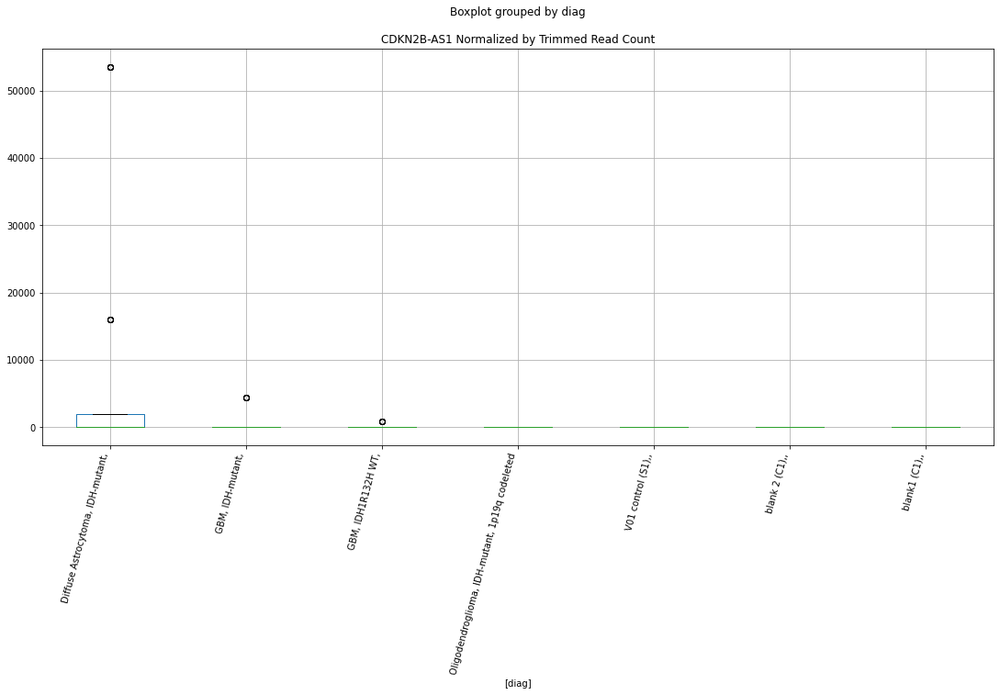

 p : 0.0047007098606686015  ( t : 2.8930997184533185 ) :  D-plex  :  cutadapt2  :  CDKN2AIP
Control and blanks
363        0.00
364        0.00
365        0.00
366        0.00
367        0.00
1557    1761.46
1558    1761.46
1559    1761.46
1560    1761.46
1561    1761.46
Name: CDKN2AIP, dtype: float64
957    705.44
958    705.44
959    705.44
960    705.44
961    705.44
Name: CDKN2AIP, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIP, dtype: float64


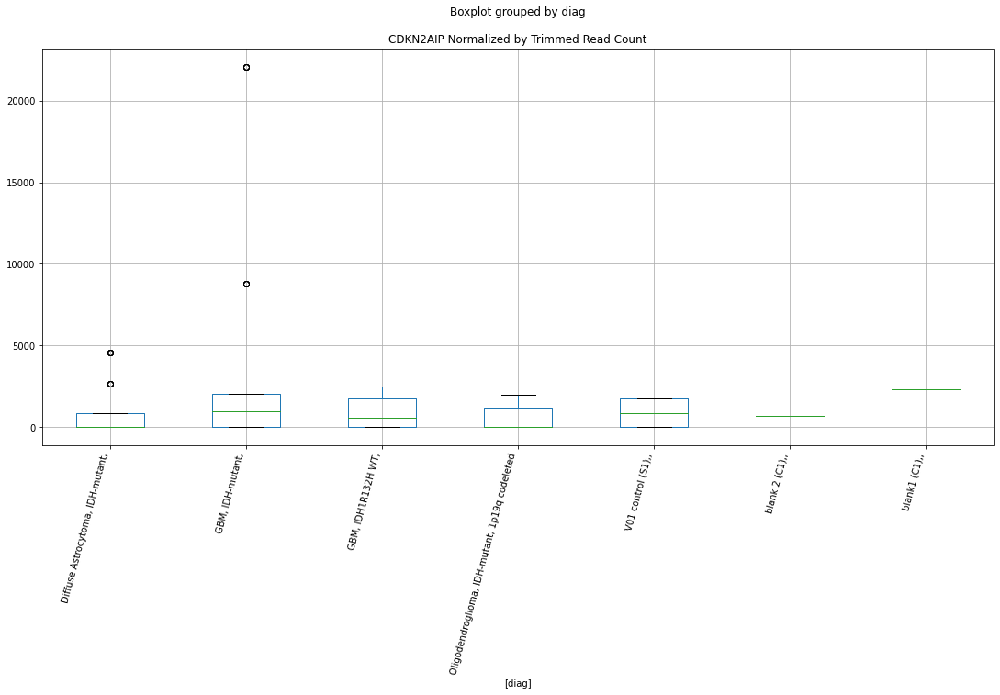

 p : 0.005087469340071846  ( t : 2.866023595264782 ) :  D-plex  :  cutadapt2  :  TERT
Control and blanks
363     3030.46
364     3030.46
365     3030.46
366     3030.46
367     3030.46
1557       0.00
1558       0.00
1559       0.00
1560       0.00
1561       0.00
Name: TERT, dtype: float64
957    2821.76
958    2821.76
959    2821.76
960    2821.76
961    2821.76
Name: TERT, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: TERT, dtype: float64


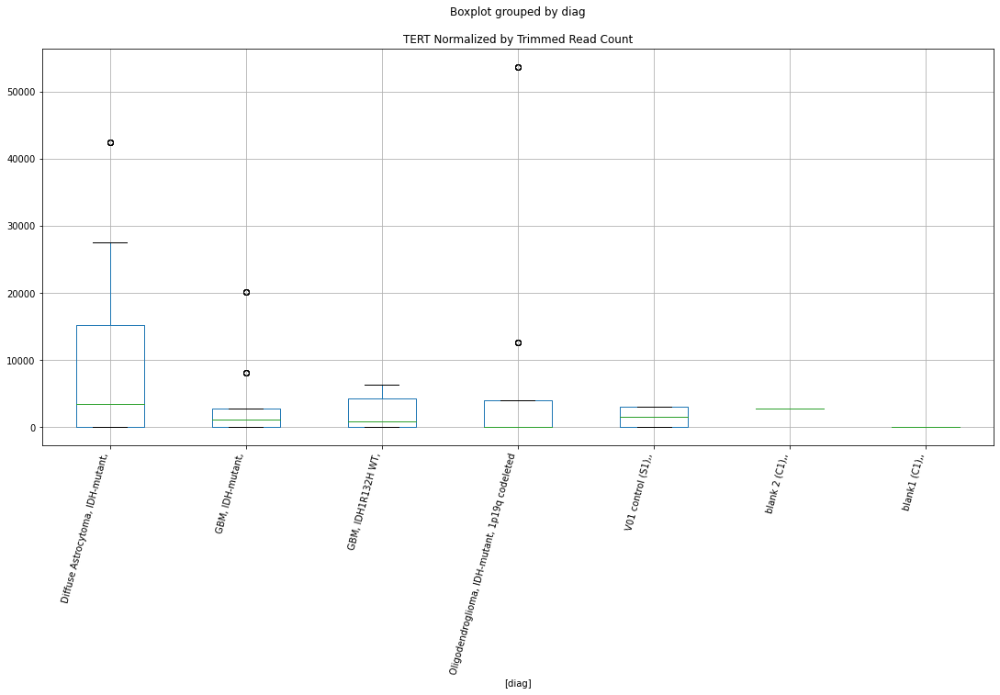

 p : 0.005666791737938635  ( t : 2.8288077964836233 ) :  D-plex  :  bbduk2  :  CDKN2AIP
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIP, dtype: float64
942    716.36
943    716.36
944    716.36
945    716.36
946    716.36
Name: CDKN2AIP, dtype: float64
2136    2366.11
2137    2366.11
2138    2366.11
2139    2366.11
2140    2366.11
Name: CDKN2AIP, dtype: float64


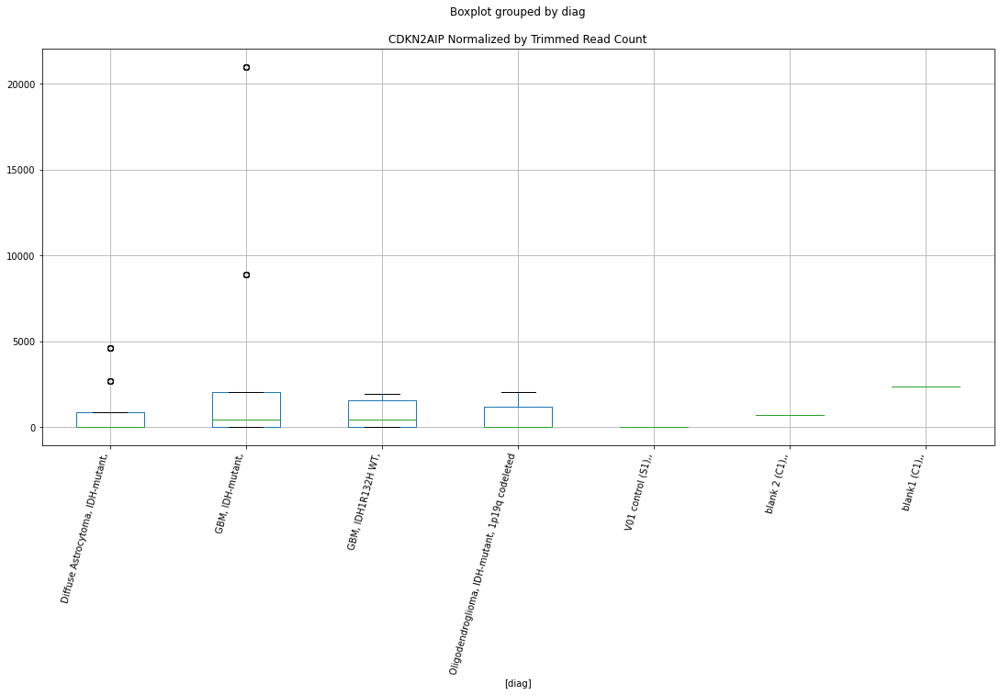

 p : 0.0075922000163411345  ( t : 2.7261272505522123 ) :  D-plex  :  bbduk2  :  NF1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: NF1, dtype: float64
942    8059.09
943    8059.09
944    8059.09
945    8059.09
946    8059.09
Name: NF1, dtype: float64
2136    7689.86
2137    7689.86
2138    7689.86
2139    7689.86
2140    7689.86
Name: NF1, dtype: float64


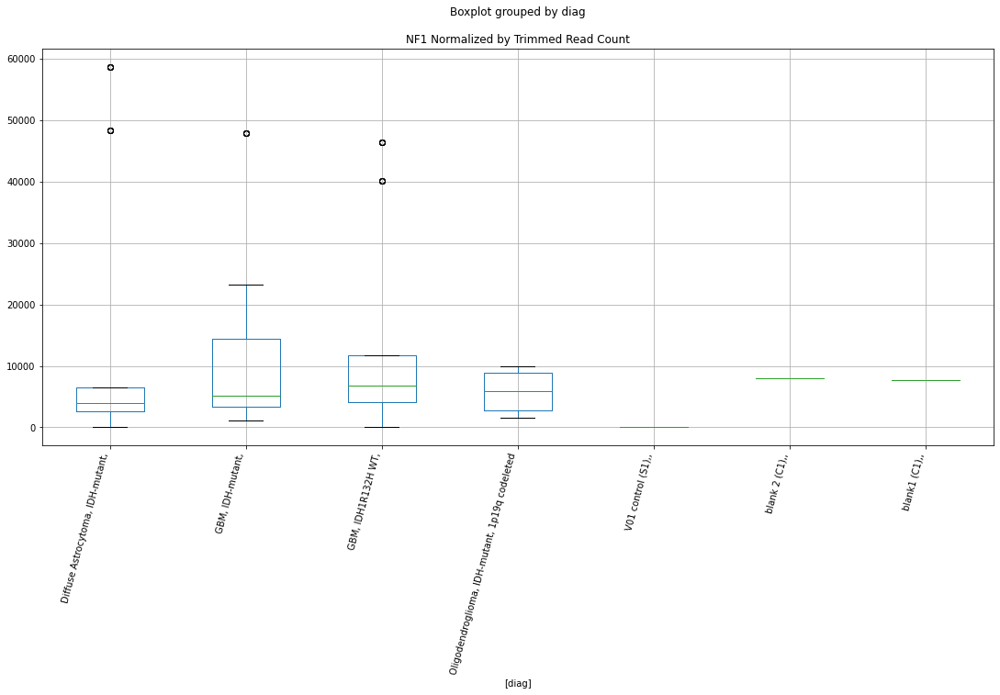

 p : 0.00914592890219966  ( t : 2.659358806401067 ) :  D-plex  :  bbduk2  :  CDKN2A
Control and blanks
348     773.01
349     773.01
350     773.01
351     773.01
352     773.01
1542      0.00
1543      0.00
1544      0.00
1545      0.00
1546      0.00
Name: CDKN2A, dtype: float64
942    5372.73
943    5372.73
944    5372.73
945    5372.73
946    5372.73
Name: CDKN2A, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2A, dtype: float64


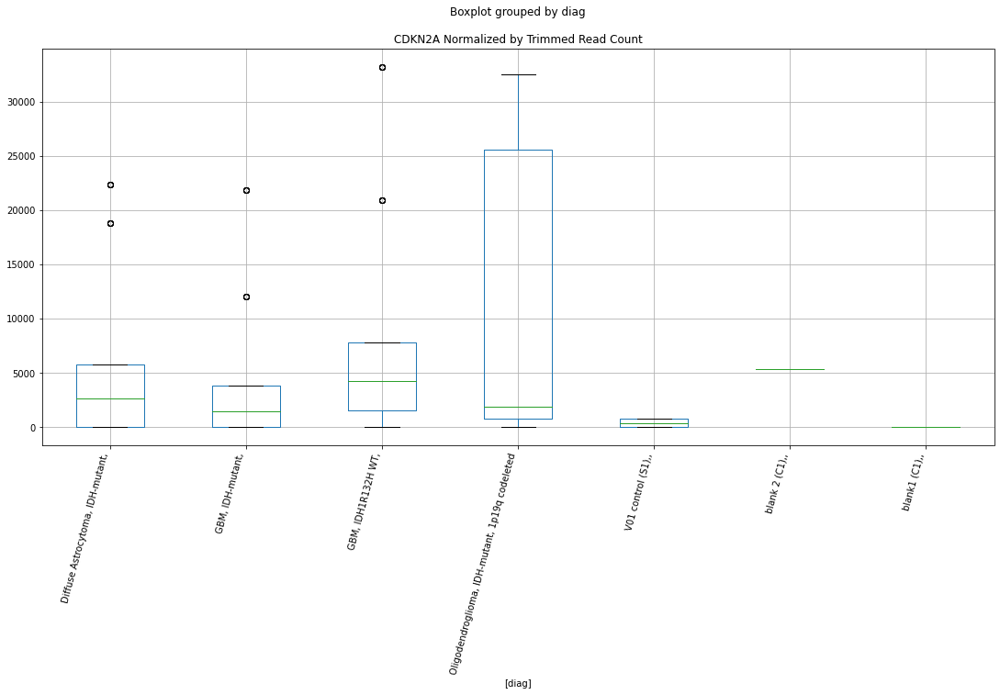

 p : 0.009518399586276873  ( t : 2.6448933423172725 ) :  D-plex  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2AIPNL, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2AIPNL, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIPNL, dtype: float64


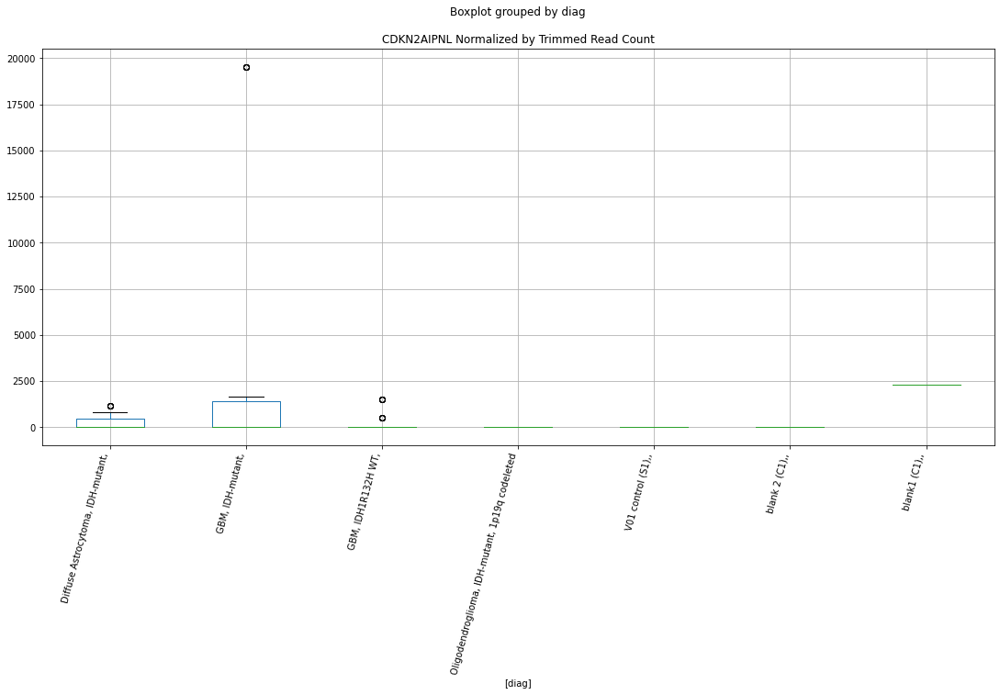

 p : 0.010544129181322628  ( t : 2.6075547184436743 ) :  D-plex  :  cutadapt2  :  TP53
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: TP53, dtype: float64
957    10581.61
958    10581.61
959    10581.61
960    10581.61
961    10581.61
Name: TP53, dtype: float64
2151    26008.01
2152    26008.01
2153    26008.01
2154    26008.01
2155    26008.01
Name: TP53, dtype: float64


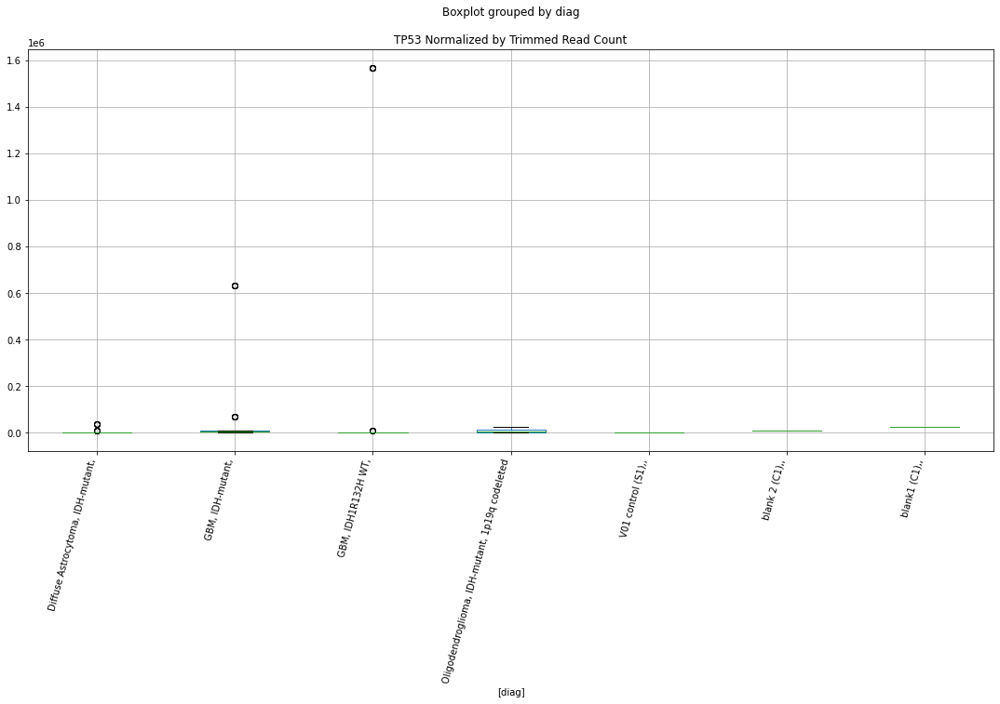

 p : 0.010565501172649882  ( t : 2.6068122579857147 ) :  D-plex  :  bbduk2  :  NF1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: NF1, dtype: float64
942    8059.09
943    8059.09
944    8059.09
945    8059.09
946    8059.09
Name: NF1, dtype: float64
2136    7689.86
2137    7689.86
2138    7689.86
2139    7689.86
2140    7689.86
Name: NF1, dtype: float64


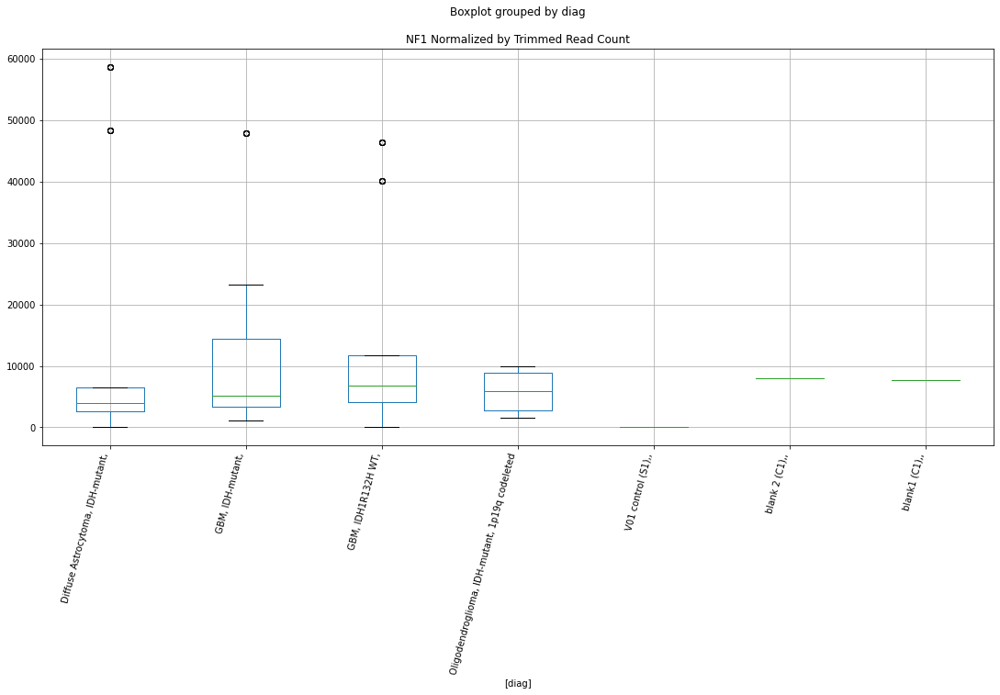

 p : 0.010782924658880063  ( t : 2.5993351004767815 ) :  D-plex  :  bbduk2  :  CDKN2B-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: CDKN2B-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2B-AS1, dtype: float64


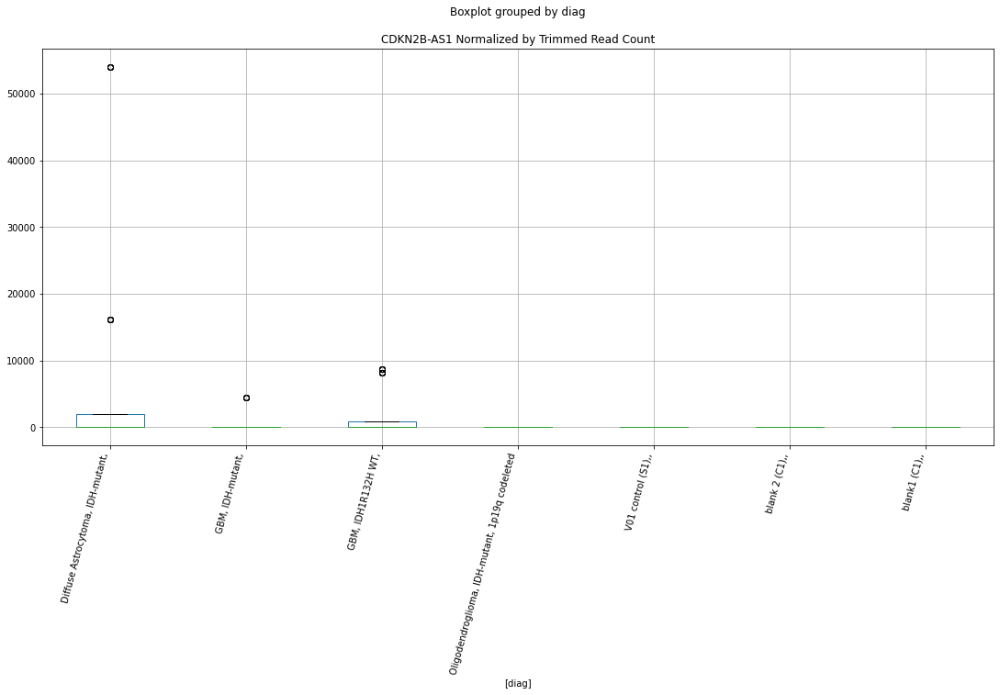

 p : 0.010930696395466372  ( t : 2.5943305509542394 ) :  D-plex  :  cutadapt2  :  EGFR
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR, dtype: float64
957    3527.2
958    3527.2
959    3527.2
960    3527.2
961    3527.2
Name: EGFR, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: EGFR, dtype: float64


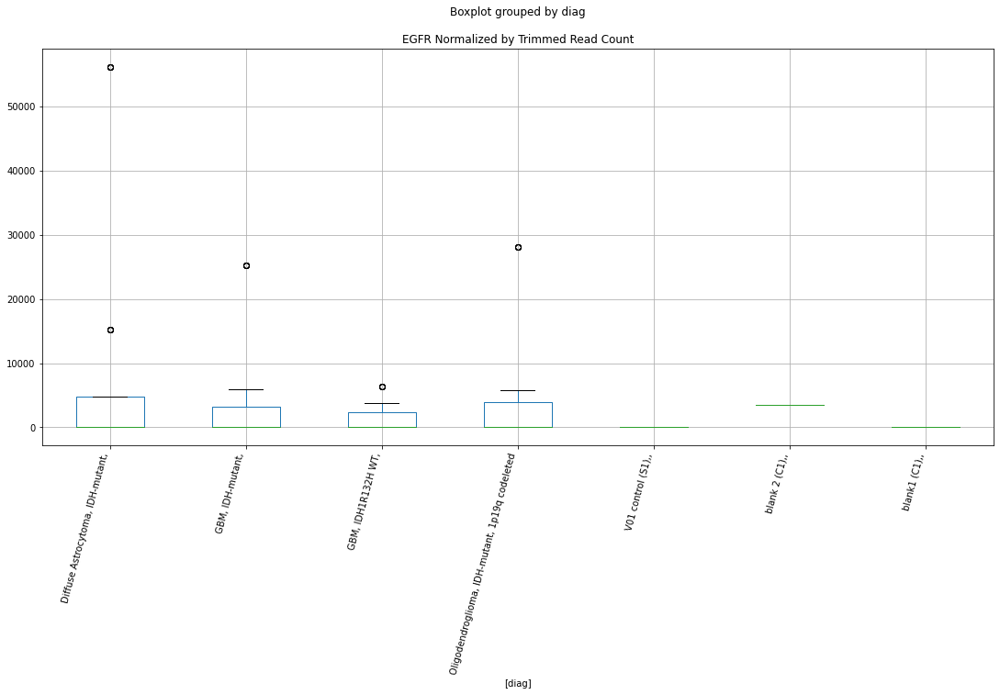

 p : 0.011150951644747253  ( t : 2.5869833680697583 ) :  D-plex  :  bbduk2  :  EGFR
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR, dtype: float64
942    3581.82
943    3581.82
944    3581.82
945    3581.82
946    3581.82
Name: EGFR, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: EGFR, dtype: float64


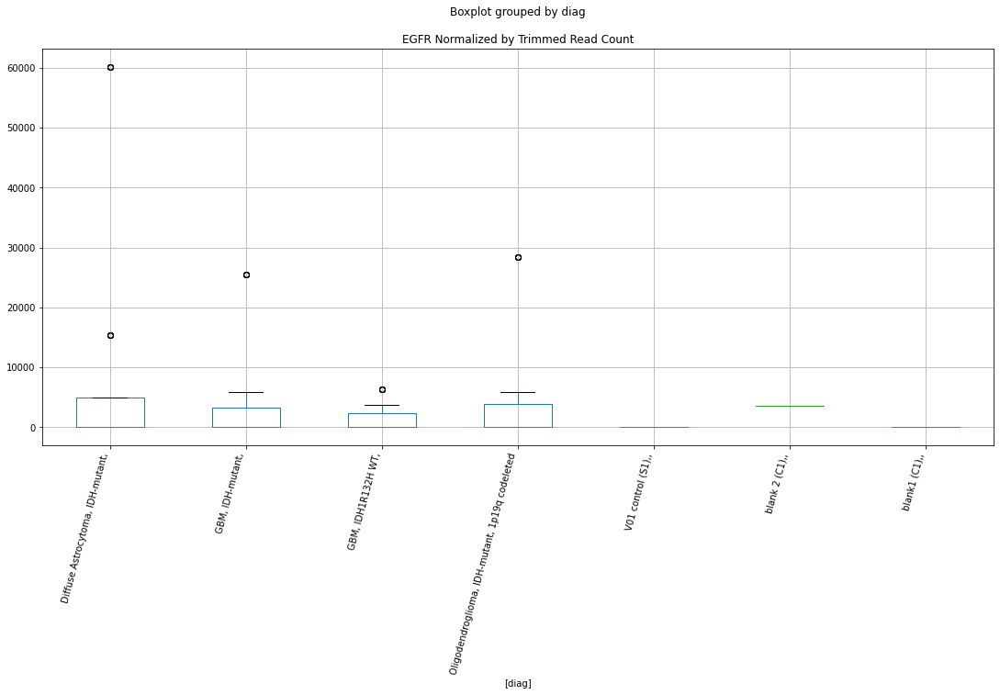

 p : 0.011690663456478045  ( t : 2.5695185485432086 ) :  D-plex  :  bbduk2  :  TP53
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: TP53, dtype: float64
942    10745.46
943    10745.46
944    10745.46
945    10745.46
946    10745.46
Name: TP53, dtype: float64
2136    26618.73
2137    26618.73
2138    26618.73
2139    26618.73
2140    26618.73
Name: TP53, dtype: float64


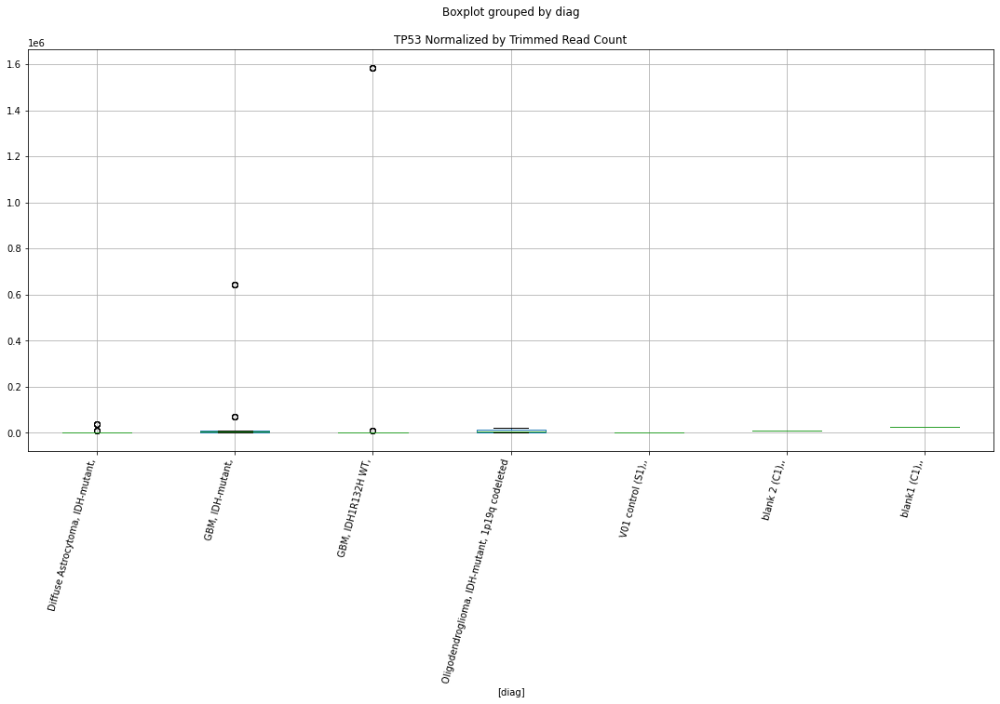

 p : 0.011992686523855125  ( t : 2.5600597735916386 ) :  D-plex  :  bbduk2  :  TERT
Control and blanks
348     3092.03
349     3092.03
350     3092.03
351     3092.03
352     3092.03
1542       0.00
1543       0.00
1544       0.00
1545       0.00
1546       0.00
Name: TERT, dtype: float64
942    2865.46
943    2865.46
944    2865.46
945    2865.46
946    2865.46
Name: TERT, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: TERT, dtype: float64


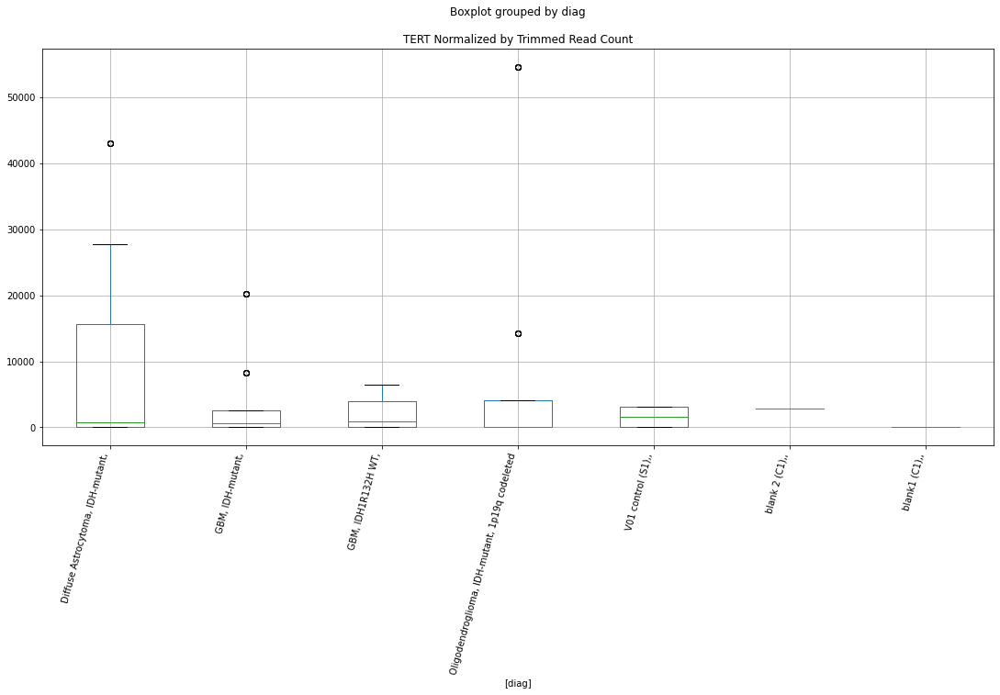

 p : 0.012047316301609231  ( t : 2.5583718186559485 ) :  D-plex  :  cutadapt2  :  CDKN2A
Control and blanks
363     757.61
364     757.61
365     757.61
366     757.61
367     757.61
1557      0.00
1558      0.00
1559      0.00
1560      0.00
1561      0.00
Name: CDKN2A, dtype: float64
957    5290.81
958    5290.81
959    5290.81
960    5290.81
961    5290.81
Name: CDKN2A, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2A, dtype: float64


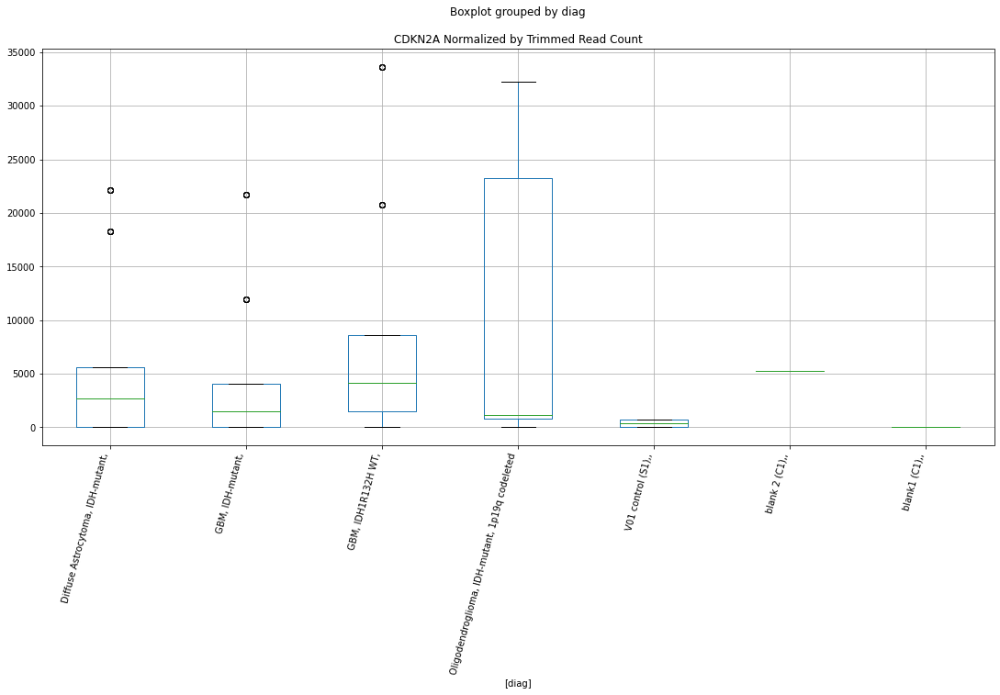

 p : 0.012452321602144354  ( t : 2.546068428162491 ) :  D-plex  :  bbduk2  :  IDH2
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH2, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: IDH2, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH2, dtype: float64


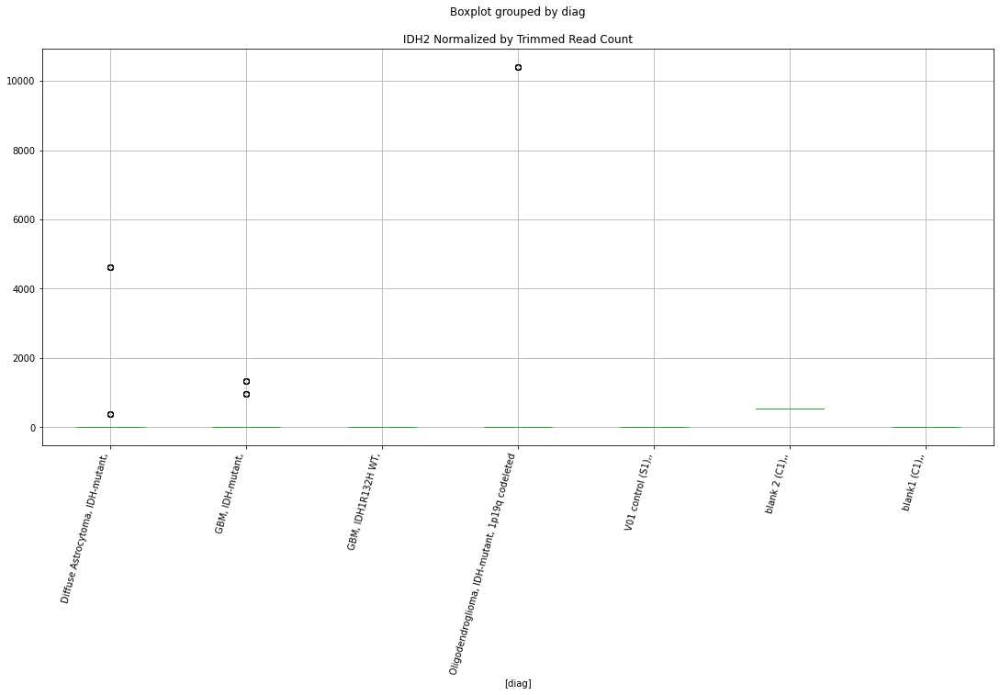

 p : 0.012452451431233143  ( t : 2.54606454222575 ) :  D-plex  :  cutadapt2  :  IDH2
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: IDH2, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: IDH2, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: IDH2, dtype: float64


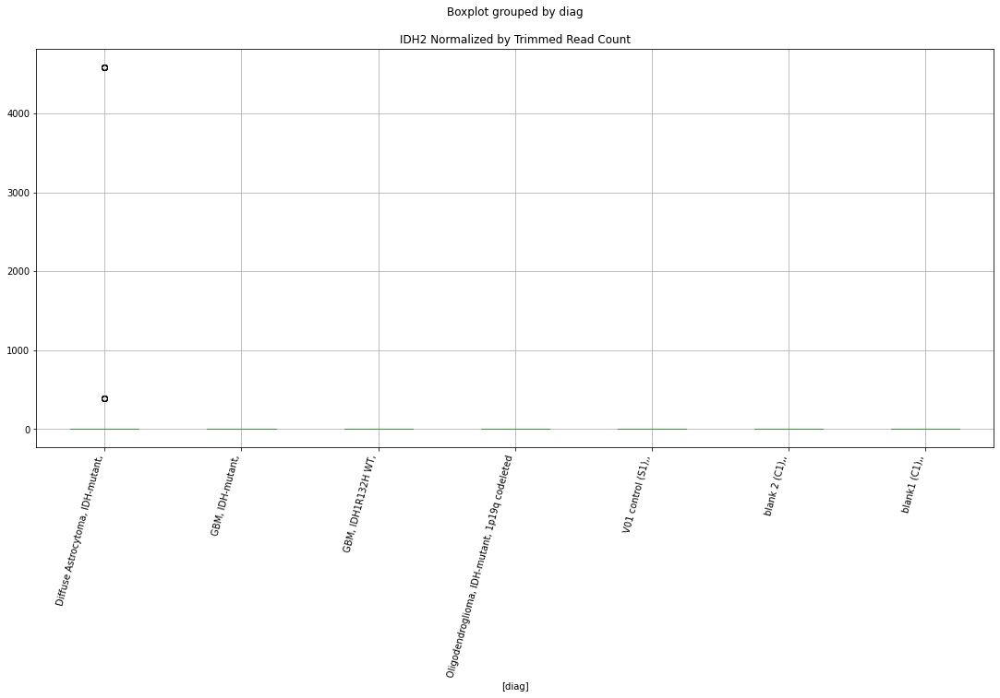

 p : 0.012544838917817843  ( t : 2.5540831134316844 ) :  Lexogen  :  bbduk2  :  TP53
Control and blanks
377     6.87e+05
378     6.87e+05
379     6.87e+05
380     6.87e+05
1571    5.99e+06
1572    5.99e+06
1573    5.99e+06
1574    5.99e+06
Name: TP53, dtype: float64
971    1.02e+06
972    1.02e+06
973    1.02e+06
974    1.02e+06
Name: TP53, dtype: float64
2165    1.02e+06
2166    1.02e+06
2167    1.02e+06
2168    1.02e+06
Name: TP53, dtype: float64


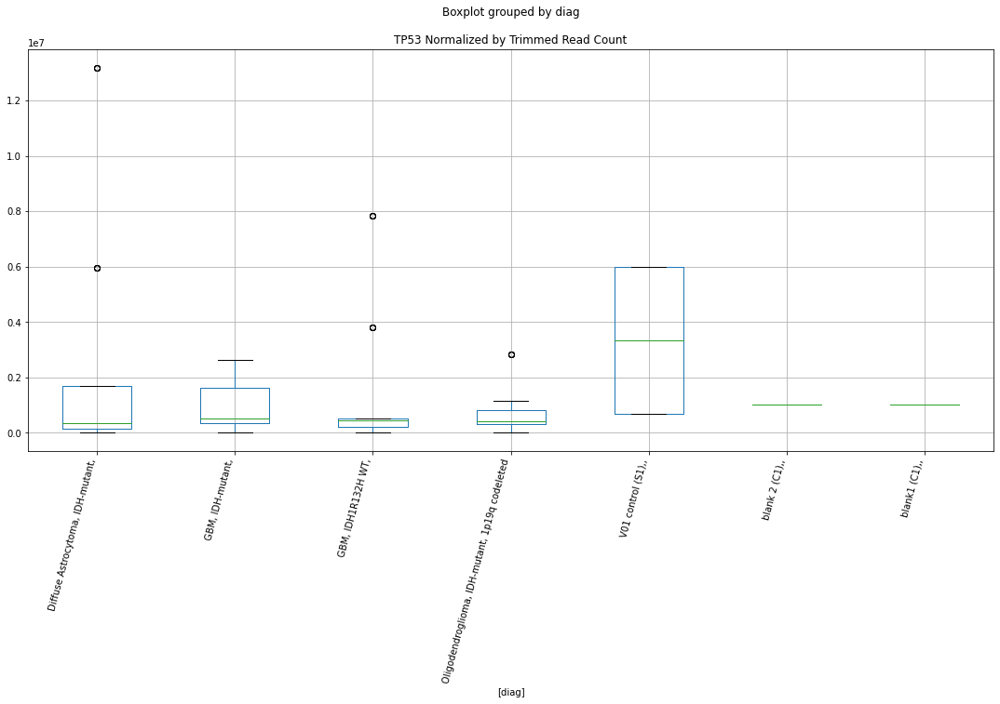

 p : 0.01254901424560022  ( t : 2.5431843438545734 ) :  D-plex  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2AIPNL, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2AIPNL, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIPNL, dtype: float64


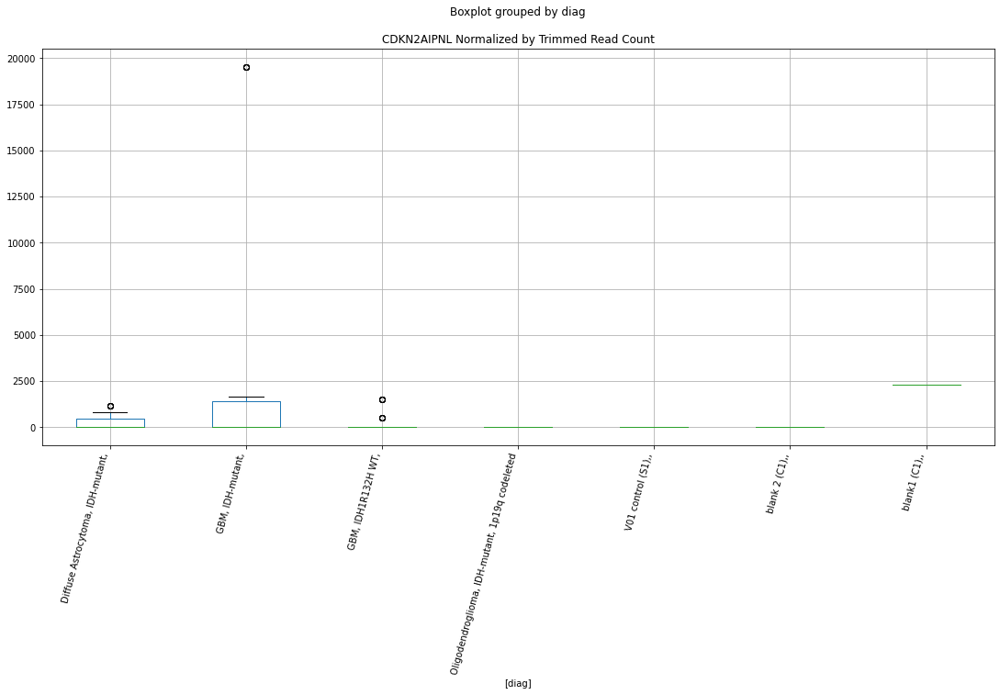

 p : 0.012560687618018507  ( t : 2.553606773812668 ) :  Lexogen  :  bbduk2  :  IDH1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH1, dtype: float64


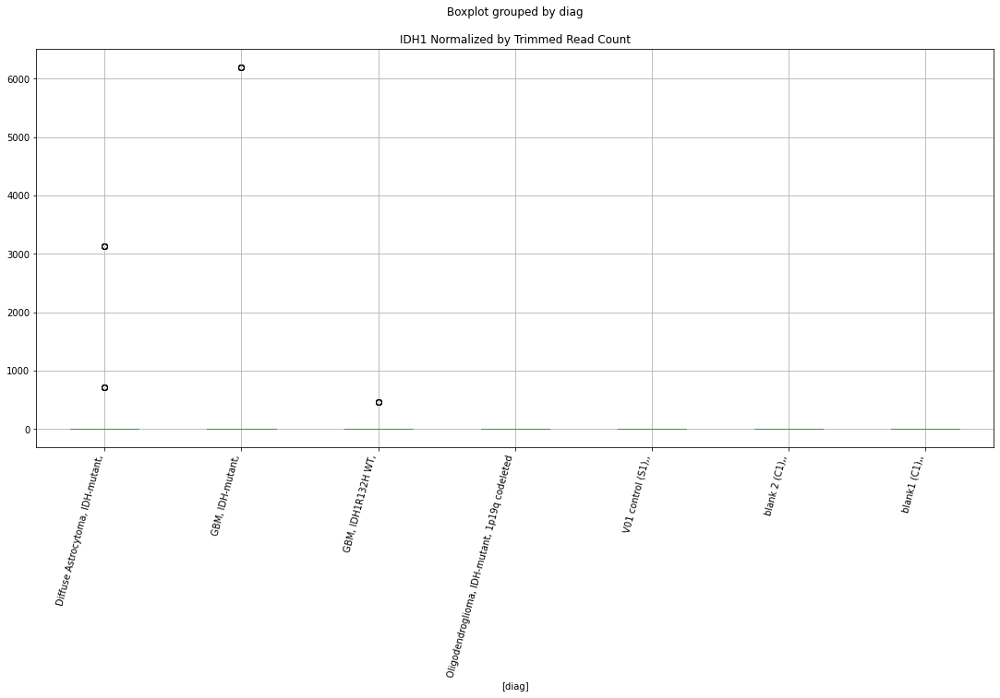

 p : 0.012717560446745954  ( t : 2.548920906821654 ) :  Lexogen  :  cutadapt2  :  TP53
Control and blanks
389     6.82e+05
390     6.82e+05
391     6.82e+05
392     6.82e+05
1583    5.98e+06
1584    5.98e+06
1585    5.98e+06
1586    5.98e+06
Name: TP53, dtype: float64
983    1.01e+06
984    1.01e+06
985    1.01e+06
986    1.01e+06
Name: TP53, dtype: float64
2177    1.02e+06
2178    1.02e+06
2179    1.02e+06
2180    1.02e+06
Name: TP53, dtype: float64


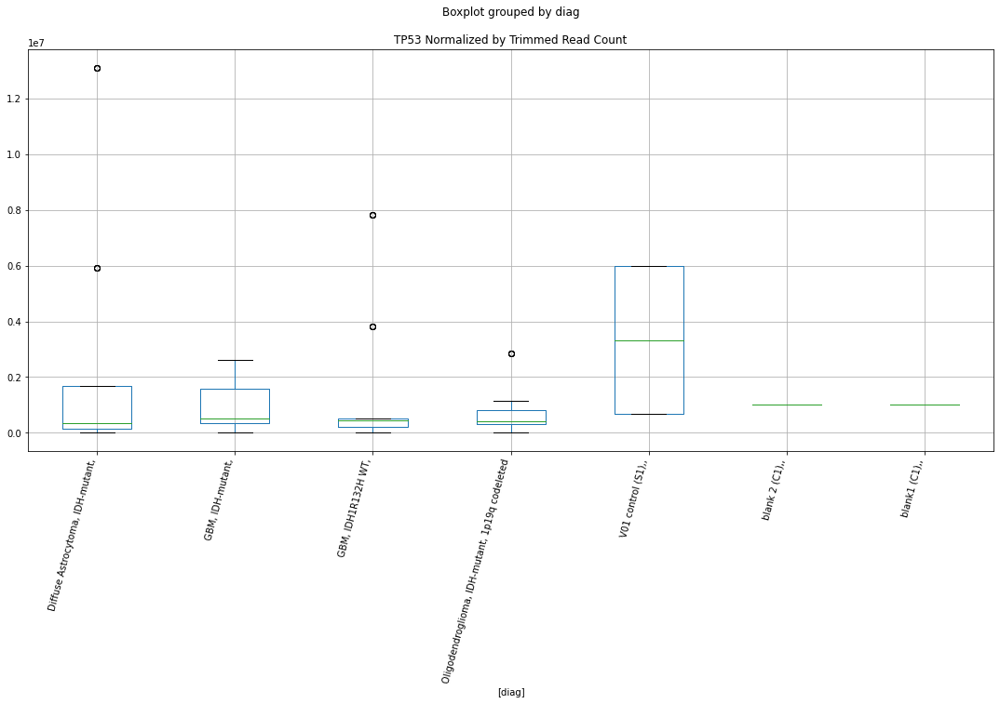

 p : 0.014596316428744004  ( t : 2.4863751336655824 ) :  D-plex  :  bbduk2  :  EGFR-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR-AS1, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: EGFR-AS1, dtype: float64
2136    591.53
2137    591.53
2138    591.53
2139    591.53
2140    591.53
Name: EGFR-AS1, dtype: float64


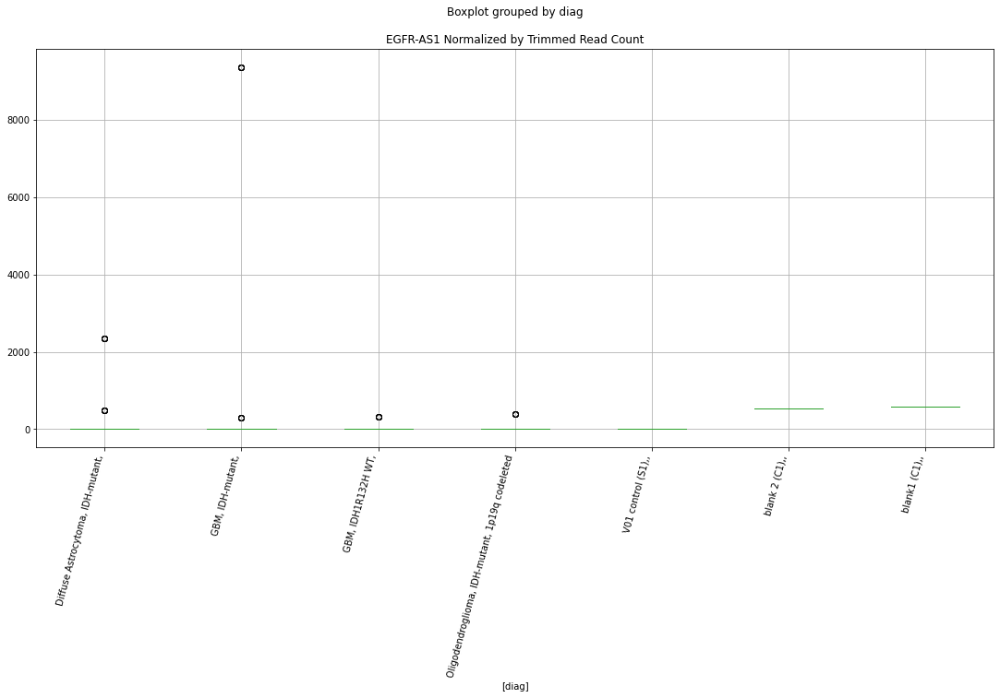

 p : 0.014627732992449283  ( t : 2.4855604883049622 ) :  D-plex  :  cutadapt2  :  EGFR-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR-AS1, dtype: float64
957    529.08
958    529.08
959    529.08
960    529.08
961    529.08
Name: EGFR-AS1, dtype: float64
2151    1155.91
2152    1155.91
2153    1155.91
2154    1155.91
2155    1155.91
Name: EGFR-AS1, dtype: float64


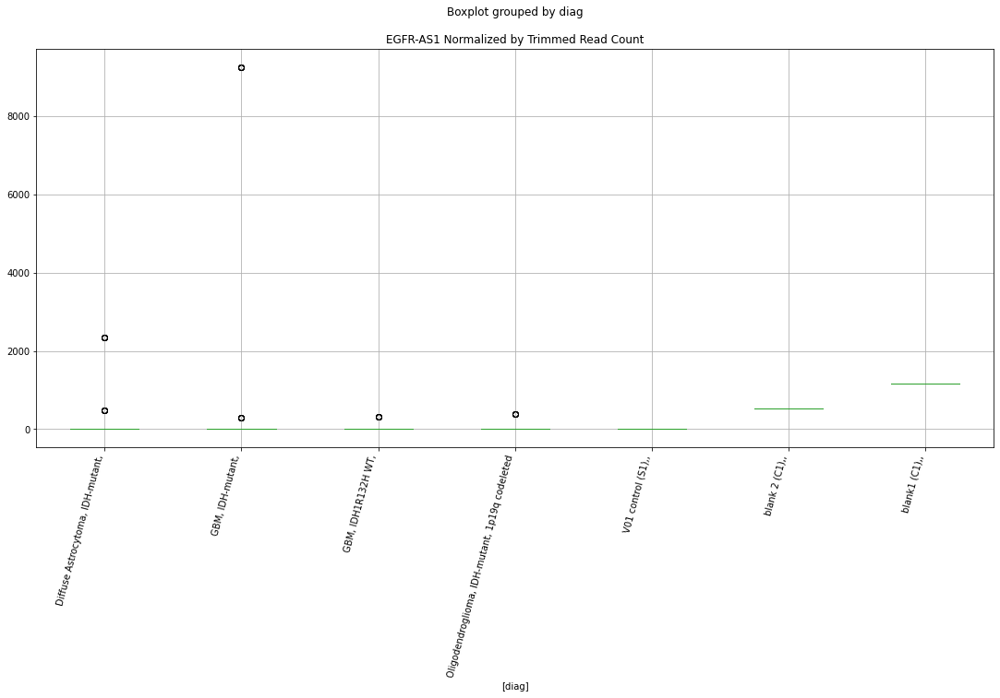

 p : 0.016280104898042706  ( t : 2.444774048698593 ) :  D-plex  :  bbduk2  :  TP53
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: TP53, dtype: float64
942    10745.46
943    10745.46
944    10745.46
945    10745.46
946    10745.46
Name: TP53, dtype: float64
2136    26618.73
2137    26618.73
2138    26618.73
2139    26618.73
2140    26618.73
Name: TP53, dtype: float64


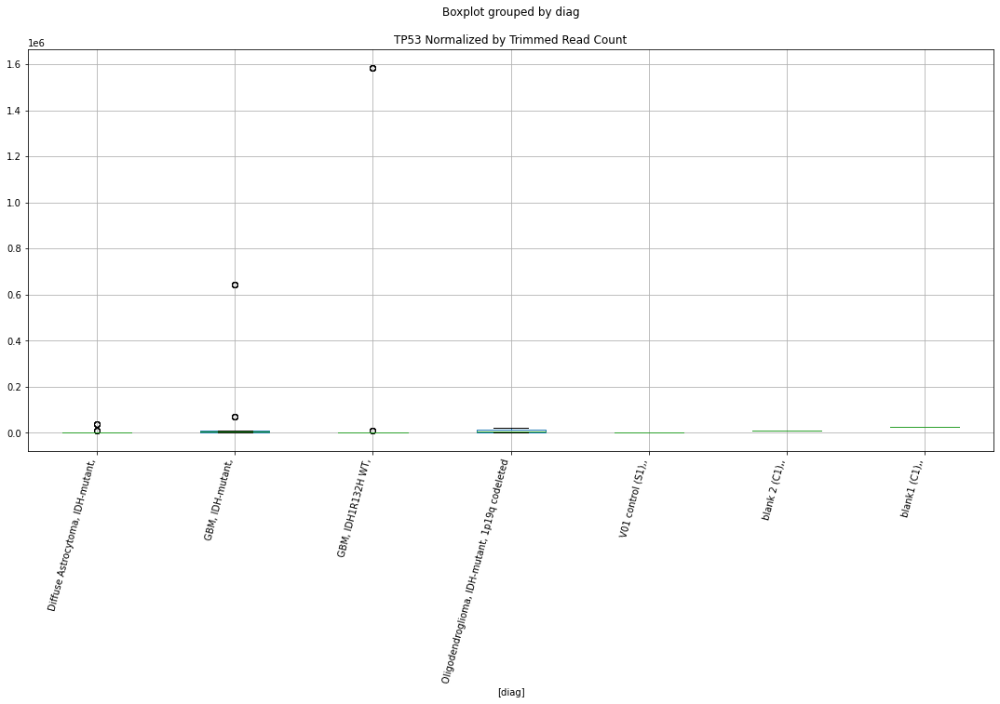

 p : 0.016394040052611372  ( t : 2.4517599948396462 ) :  Lexogen  :  bbduk2  :  CDKN2A
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2A, dtype: float64
971    1639.84
972    1639.84
973    1639.84
974    1639.84
Name: CDKN2A, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2A, dtype: float64


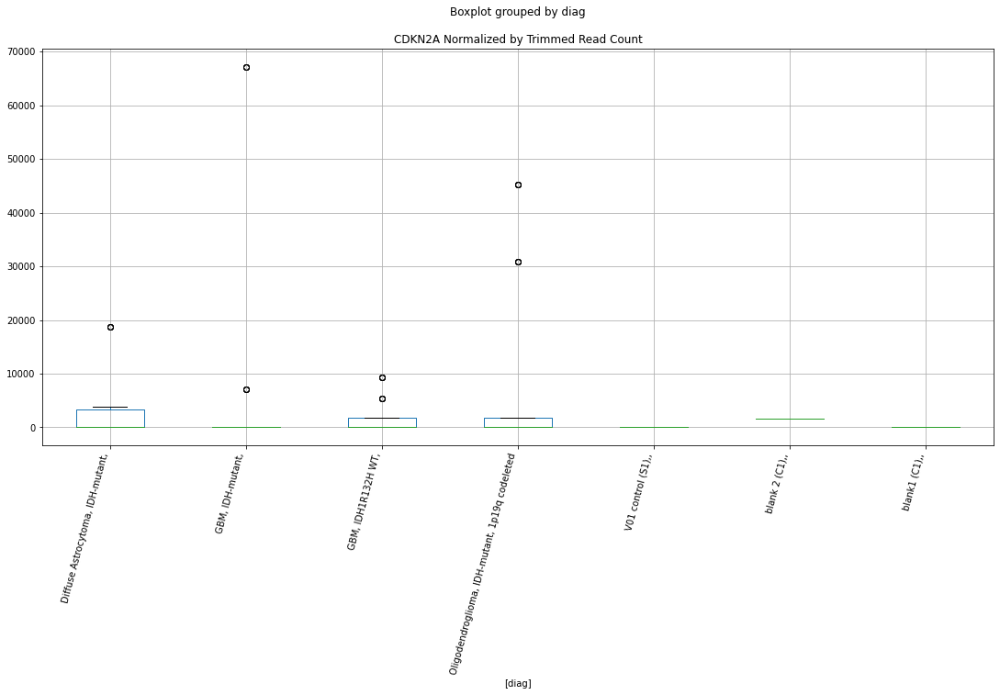

 p : 0.01671269622309686  ( t : 2.4442901683034735 ) :  Lexogen  :  cutadapt2  :  CDKN2A
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2A, dtype: float64
983    1627.36
984    1627.36
985    1627.36
986    1627.36
Name: CDKN2A, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2A, dtype: float64


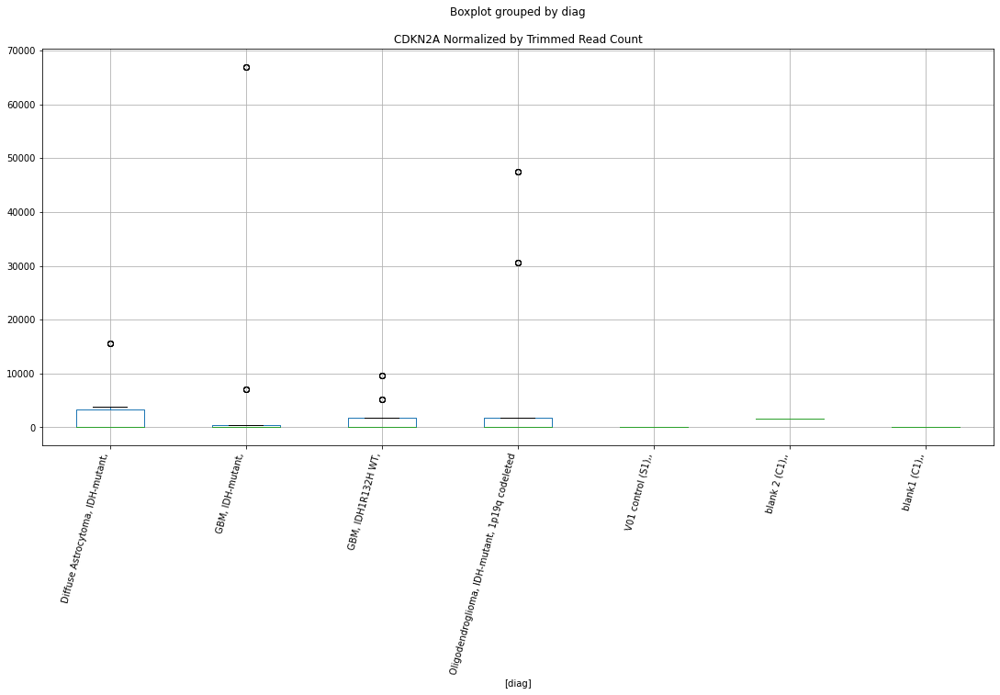

 p : 0.01681735992600238  ( t : 2.432307974963986 ) :  D-plex  :  cutadapt2  :  TP53
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: TP53, dtype: float64
957    10581.61
958    10581.61
959    10581.61
960    10581.61
961    10581.61
Name: TP53, dtype: float64
2151    26008.01
2152    26008.01
2153    26008.01
2154    26008.01
2155    26008.01
Name: TP53, dtype: float64


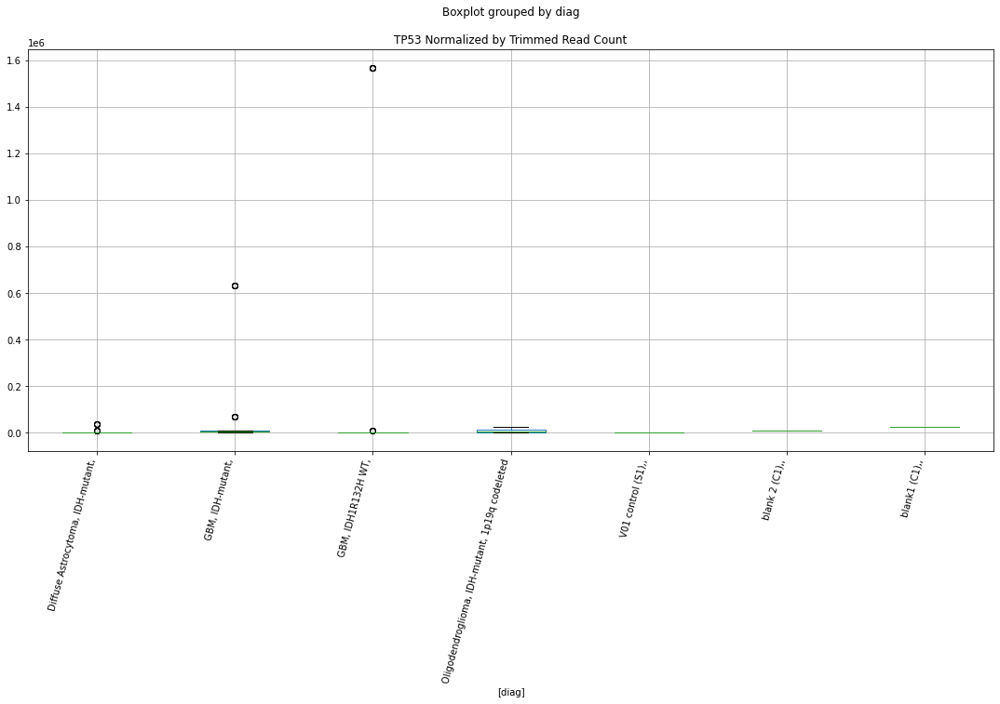

 p : 0.017821395829229064  ( t : 2.409933374407199 ) :  D-plex  :  bbduk2  :  CDKN2AIPNL
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIPNL, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: CDKN2AIPNL, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2AIPNL, dtype: float64


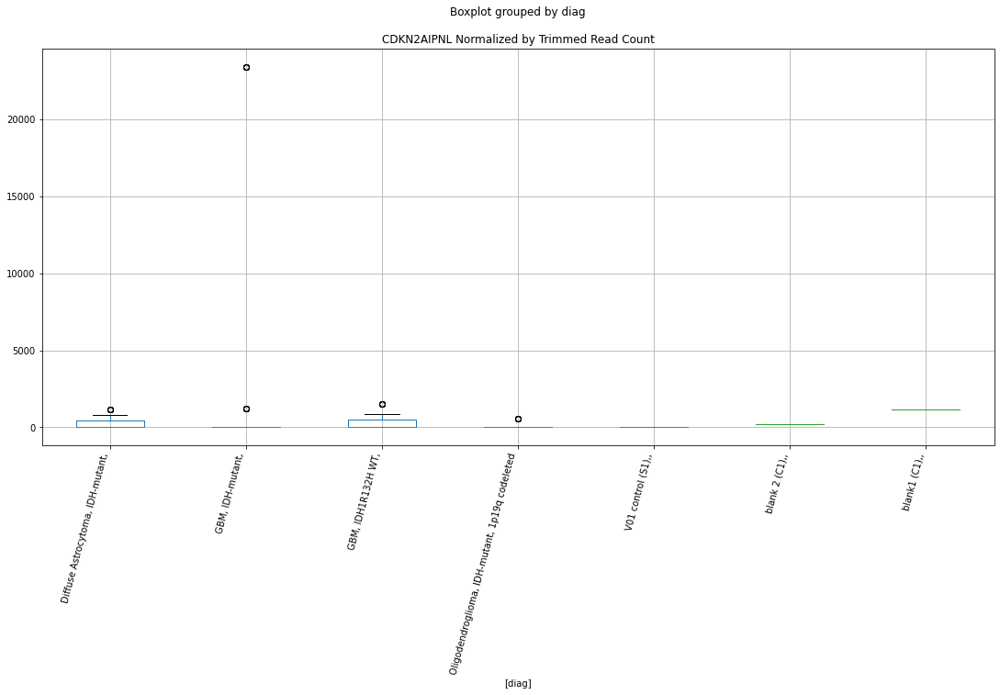

 p : 0.018455979732503205  ( t : 2.3963637556051958 ) :  D-plex  :  bbduk2  :  EGFR-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR-AS1, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: EGFR-AS1, dtype: float64
2136    591.53
2137    591.53
2138    591.53
2139    591.53
2140    591.53
Name: EGFR-AS1, dtype: float64


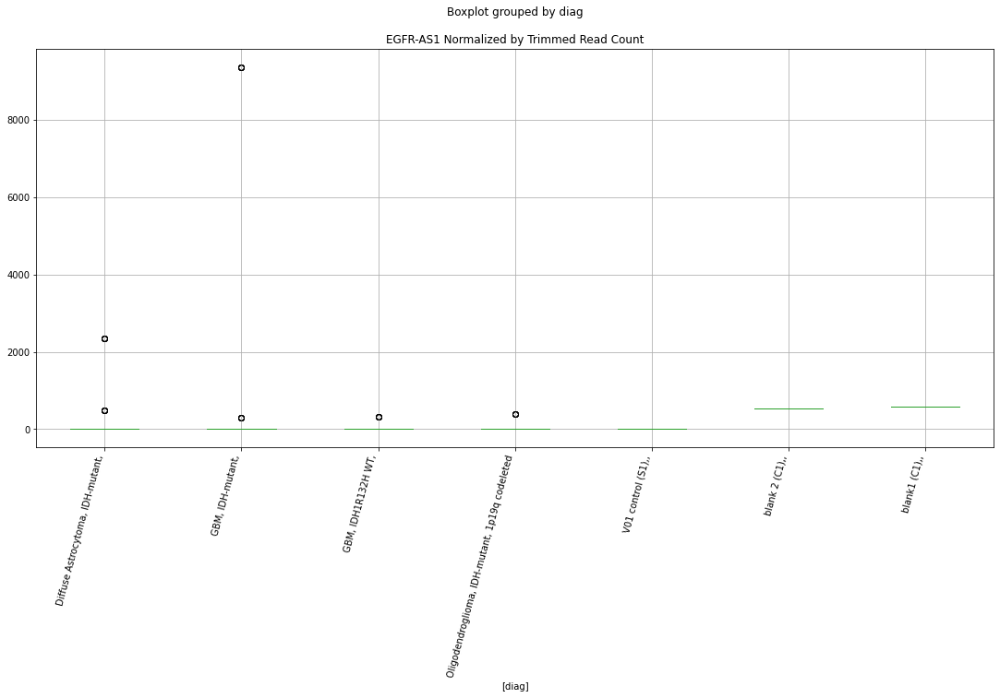

 p : 0.01853072126528814  ( t : 2.4039600837031534 ) :  Lexogen  :  cutadapt2  :  CDKN2B
Control and blanks
389       0.00
390       0.00
391       0.00
392       0.00
1583    420.87
1584    420.87
1585    420.87
1586    420.87
Name: CDKN2B, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2B, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2B, dtype: float64


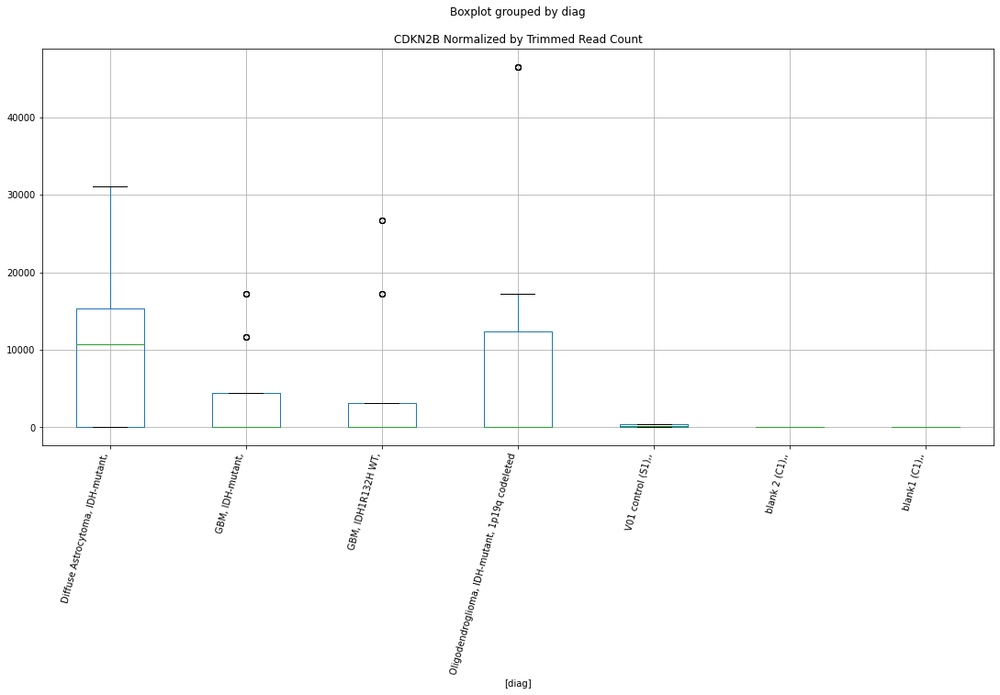

 p : 0.018539746479898273  ( t : 2.394603628719679 ) :  D-plex  :  cutadapt2  :  EGFR-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR-AS1, dtype: float64
957    529.08
958    529.08
959    529.08
960    529.08
961    529.08
Name: EGFR-AS1, dtype: float64
2151    1155.91
2152    1155.91
2153    1155.91
2154    1155.91
2155    1155.91
Name: EGFR-AS1, dtype: float64


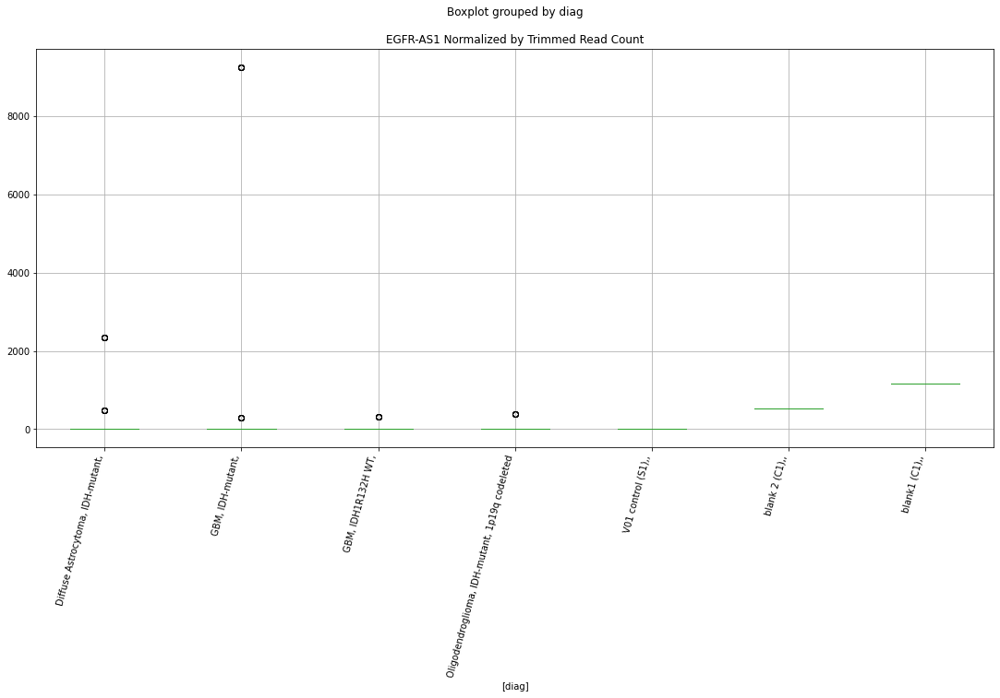

 p : 0.018609046978780307  ( t : 2.402303189720792 ) :  Lexogen  :  bbduk2  :  CDKN2B
Control and blanks
377       0.00
378       0.00
379       0.00
380       0.00
1571    424.63
1572    424.63
1573    424.63
1574    424.63
Name: CDKN2B, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2B, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2B, dtype: float64


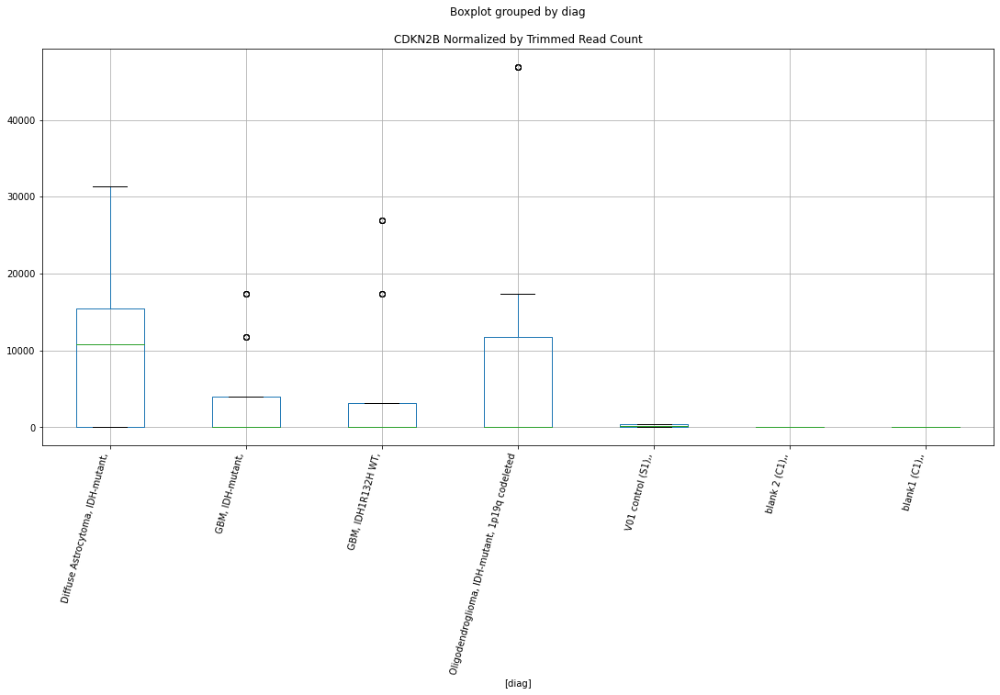

 p : 0.01993522637788039  ( t : 2.3751527496154976 ) :  Lexogen  :  cutadapt2  :  NOTCH1
Control and blanks
389         0.00
390         0.00
391         0.00
392         0.00
1583    28198.23
1584    28198.23
1585    28198.23
1586    28198.23
Name: NOTCH1, dtype: float64
983    8679.25
984    8679.25
985    8679.25
986    8679.25
Name: NOTCH1, dtype: float64
2177    474.92
2178    474.92
2179    474.92
2180    474.92
Name: NOTCH1, dtype: float64


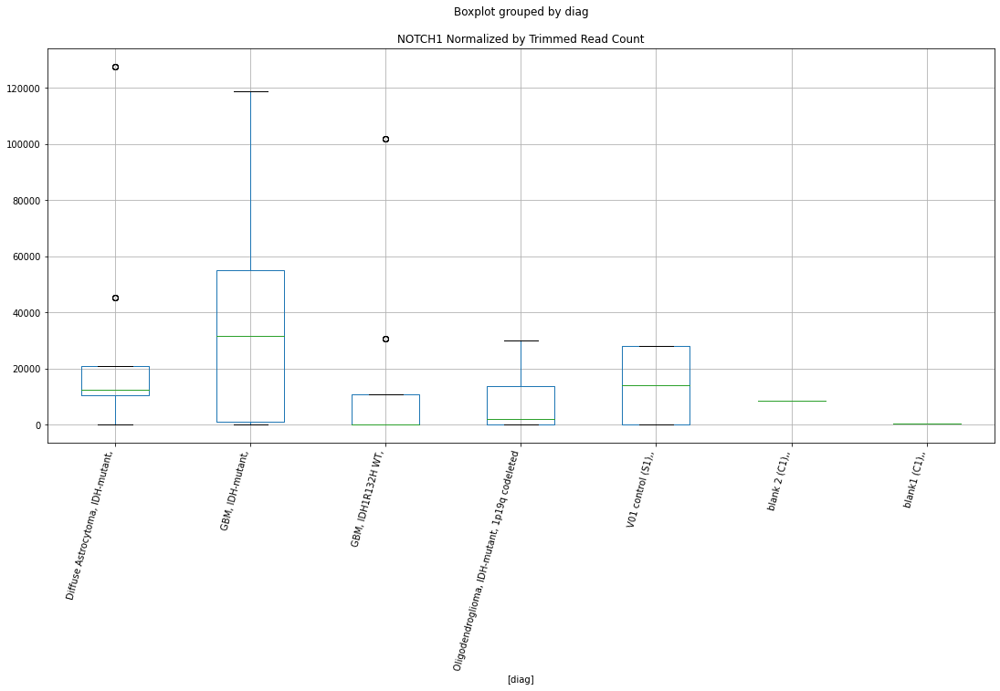

 p : 0.02086697958708364  ( t : 2.3570226039551585 ) :  Lexogen  :  cutadapt2  :  RB1-DT
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1-DT, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1-DT, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1-DT, dtype: float64


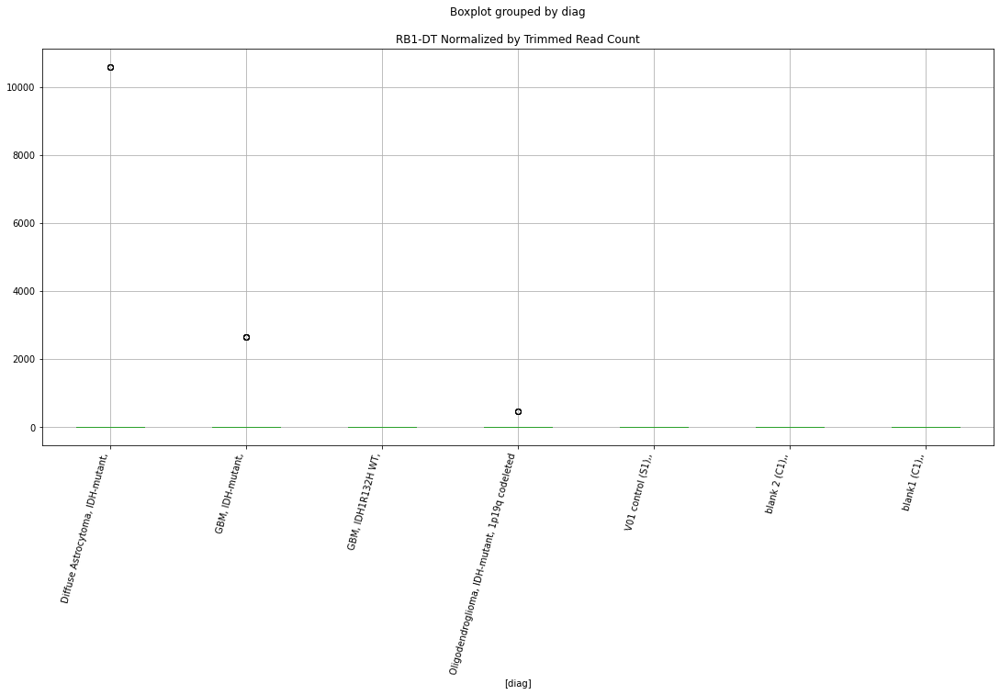

 p : 0.02086697958708364  ( t : 2.3570226039551585 ) :  Lexogen  :  cutadapt2  :  IDH1-AS1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH1-AS1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH1-AS1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH1-AS1, dtype: float64


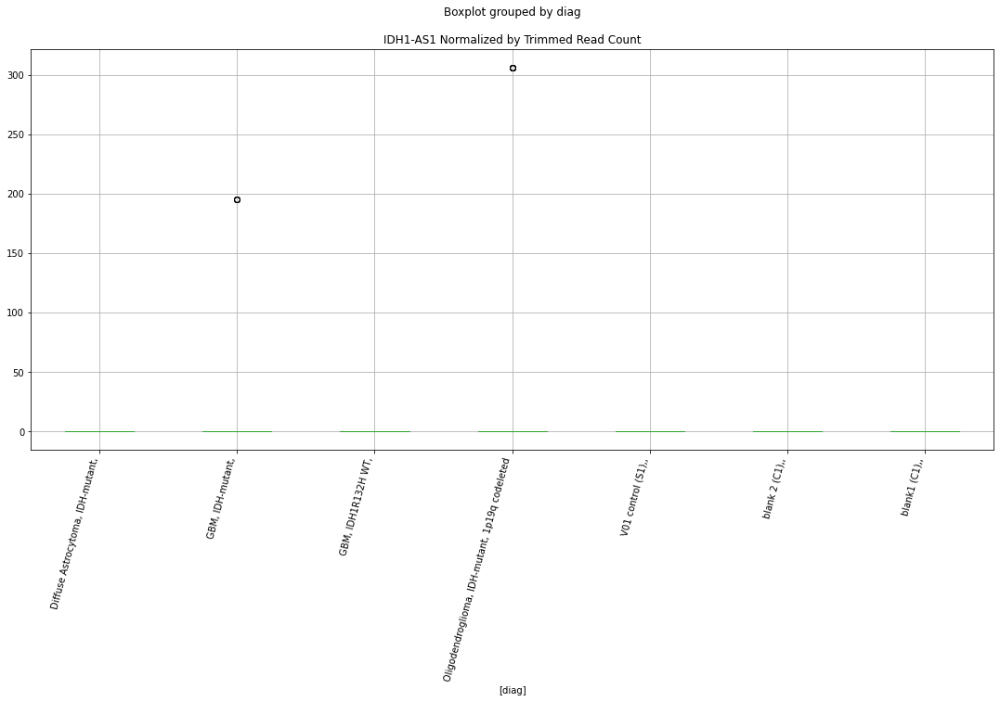

 p : 0.02086697958708367  ( t : 2.357022603955158 ) :  Lexogen  :  bbduk2  :  IDH1-AS1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH1-AS1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH1-AS1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH1-AS1, dtype: float64


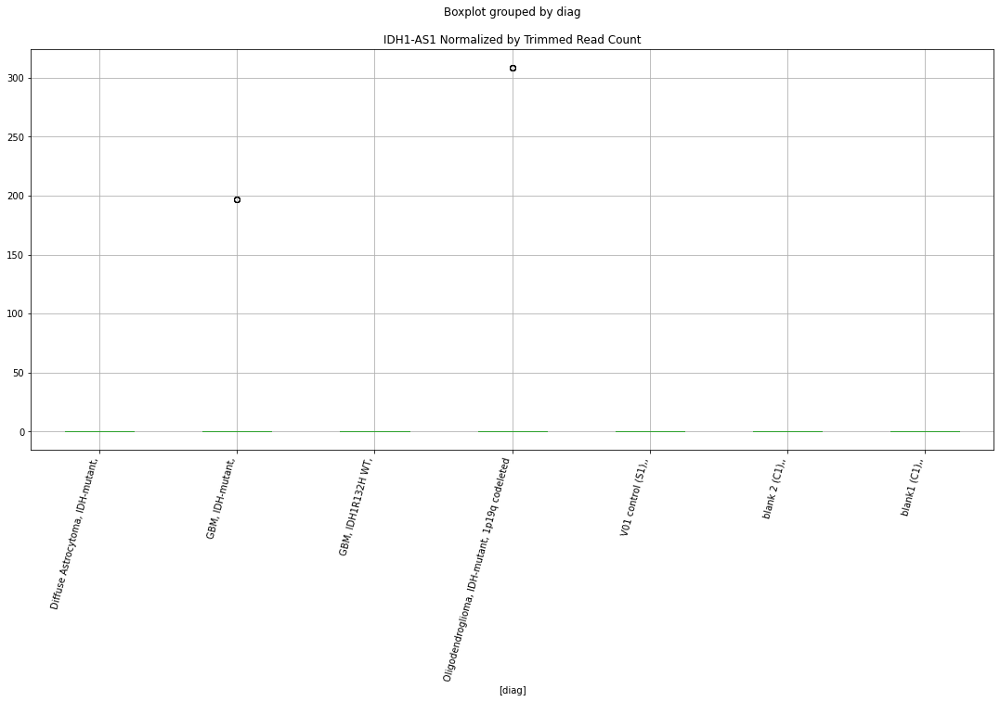

 p : 0.02086697958708367  ( t : 2.357022603955158 ) :  Lexogen  :  bbduk2  :  RB1-DT
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1-DT, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1-DT, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1-DT, dtype: float64


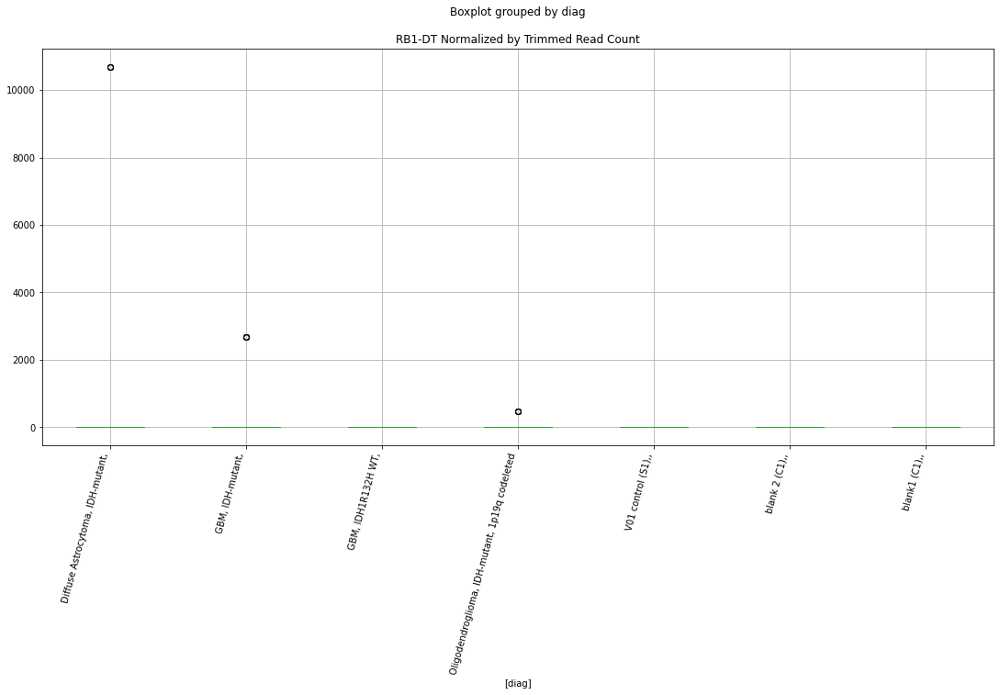

 p : 0.021144688290499345  ( t : 2.3431091972459375 ) :  D-plex  :  cutadapt2  :  CDKN2B
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B, dtype: float64


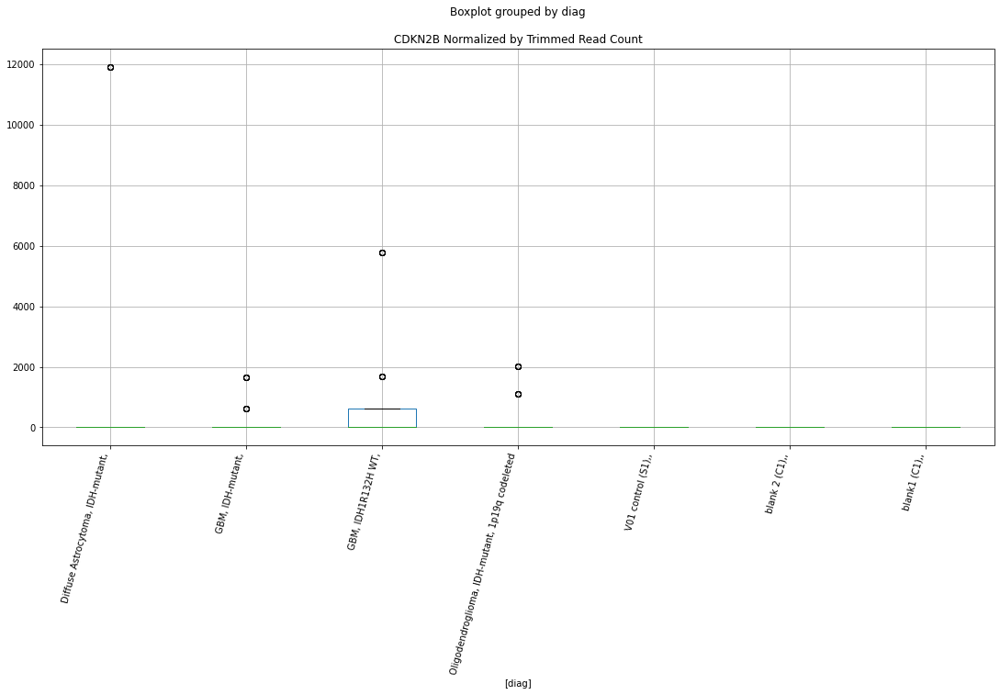

 p : 0.021607222629172324  ( t : 2.3345592970999136 ) :  D-plex  :  cutadapt2  :  EGFR-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR-AS1, dtype: float64
957    529.08
958    529.08
959    529.08
960    529.08
961    529.08
Name: EGFR-AS1, dtype: float64
2151    1155.91
2152    1155.91
2153    1155.91
2154    1155.91
2155    1155.91
Name: EGFR-AS1, dtype: float64


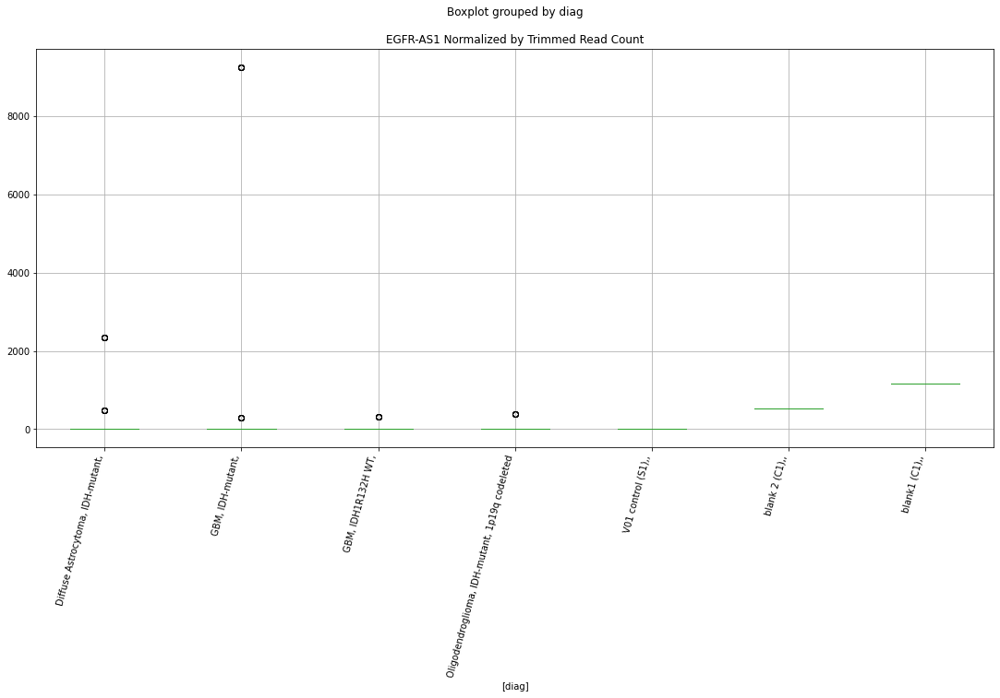

 p : 0.021613855498819164  ( t : 2.3344378704957576 ) :  D-plex  :  bbduk2  :  EGFR-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR-AS1, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: EGFR-AS1, dtype: float64
2136    591.53
2137    591.53
2138    591.53
2139    591.53
2140    591.53
Name: EGFR-AS1, dtype: float64


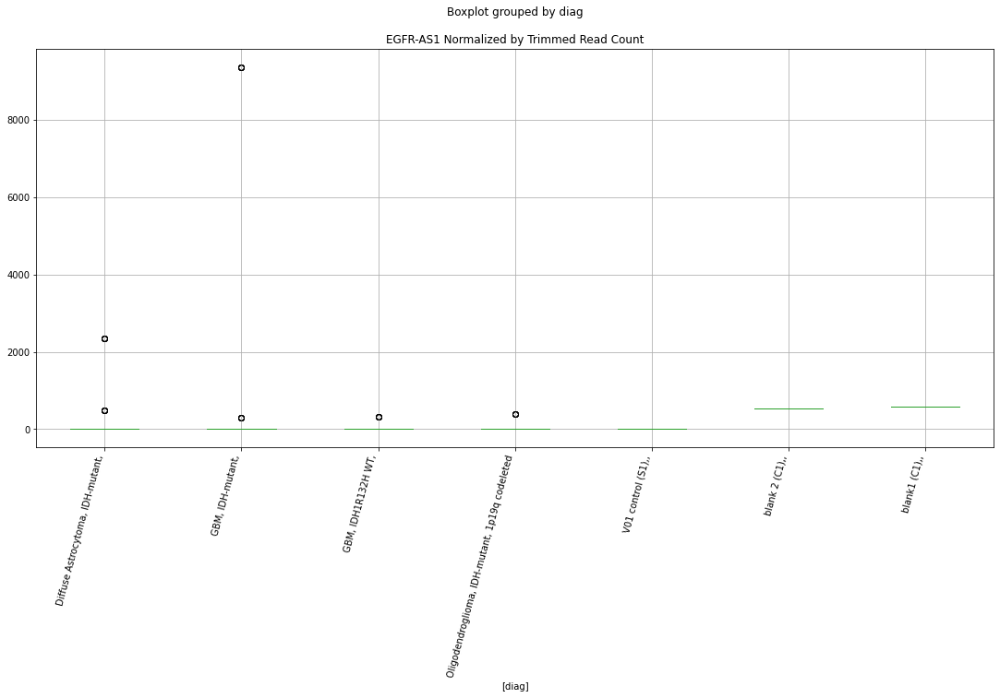

 p : 0.021674272993200346  ( t : 2.333333333333334 ) :  D-plex  :  bbduk2  :  IDH2
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH2, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: IDH2, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH2, dtype: float64


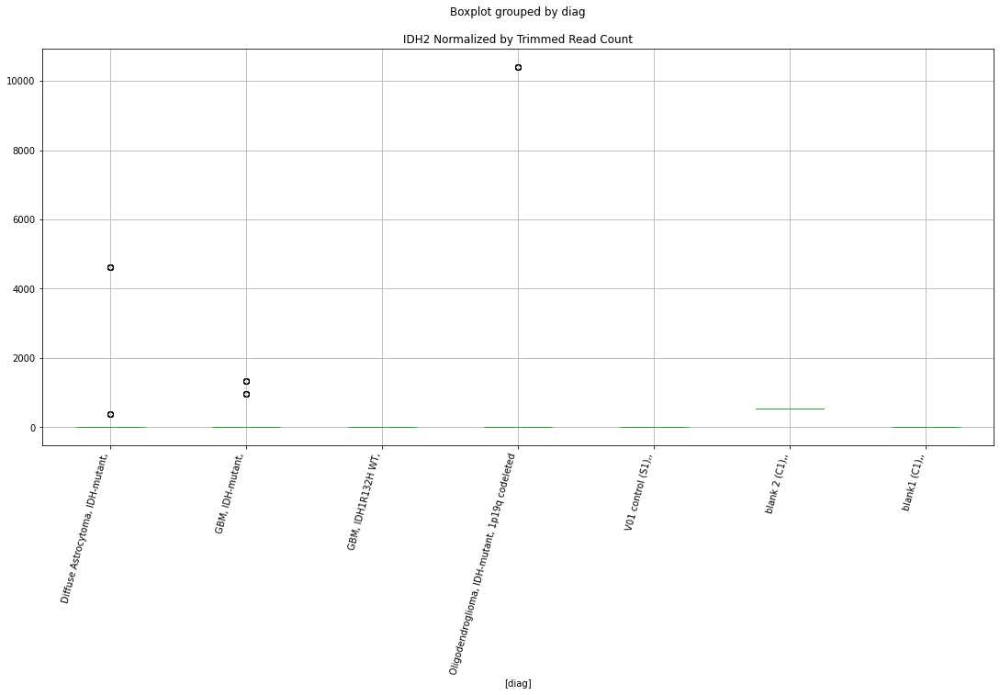

 p : 0.021674272993200374  ( t : 2.3333333333333335 ) :  D-plex  :  bbduk2  :  IDH1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH1, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: IDH1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH1, dtype: float64


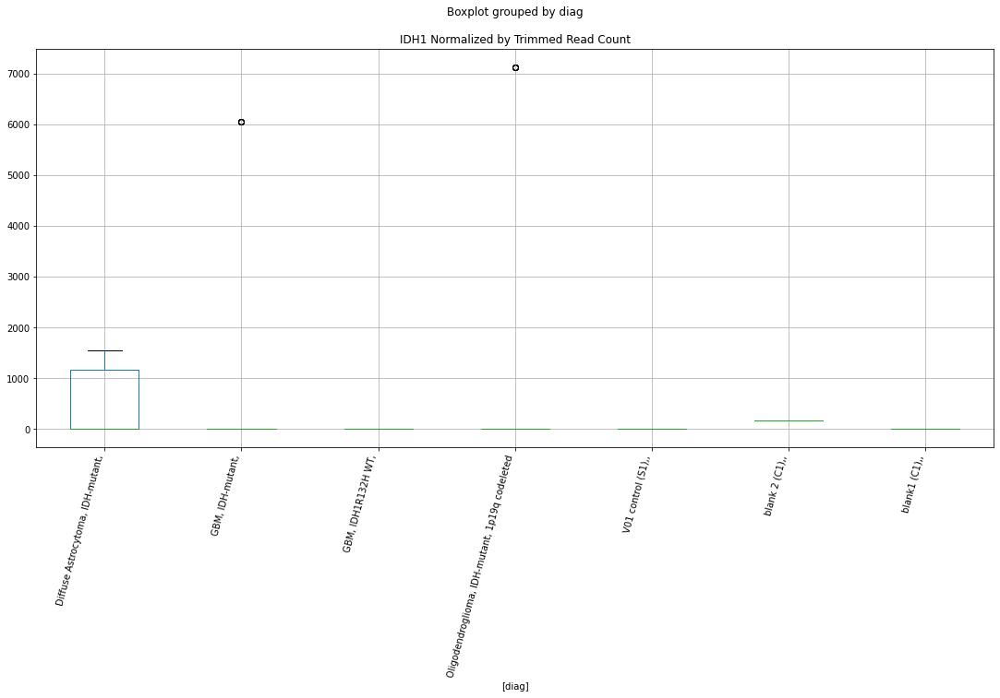

 p : 0.021674272993200374  ( t : 2.3333333333333335 ) :  D-plex  :  bbduk2  :  IDH1-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH1-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: IDH1-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH1-AS1, dtype: float64


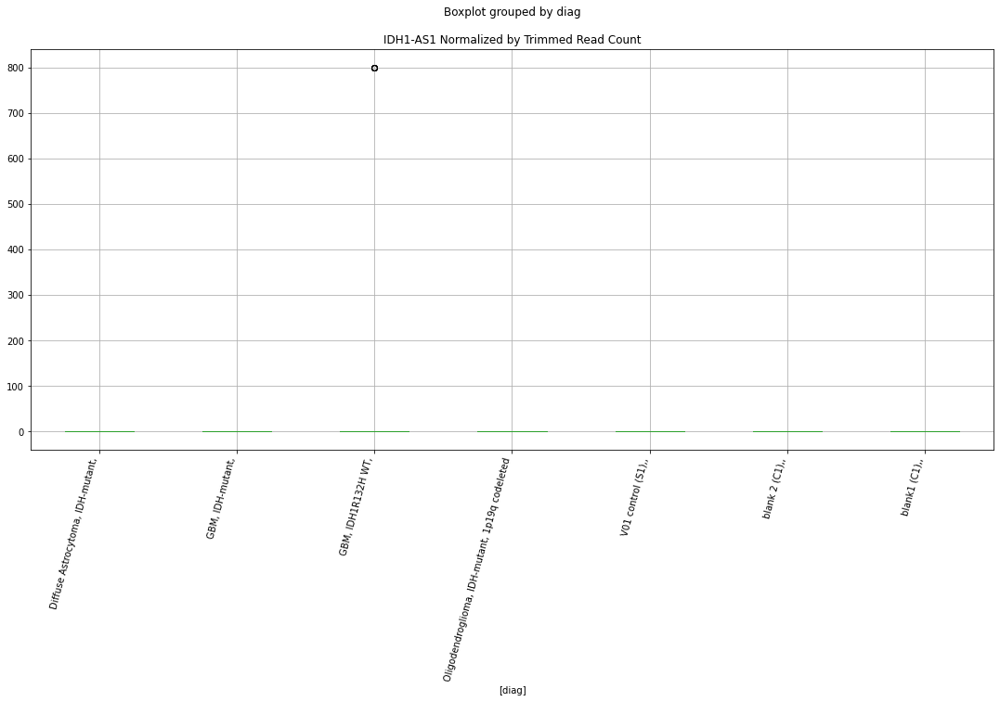

 p : 0.021674272993200374  ( t : 2.3333333333333335 ) :  D-plex  :  bbduk2  :  CDKN2B-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: CDKN2B-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2B-AS1, dtype: float64


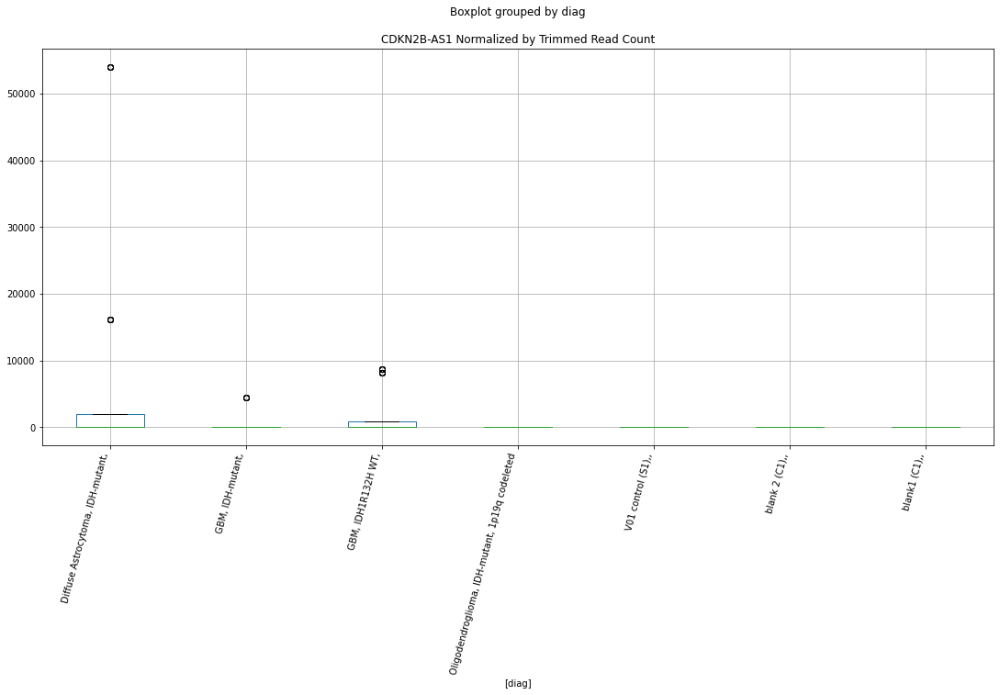

 p : 0.021674272993200374  ( t : 2.3333333333333335 ) :  D-plex  :  cutadapt2  :  CDKN2B-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B-AS1, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B-AS1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B-AS1, dtype: float64


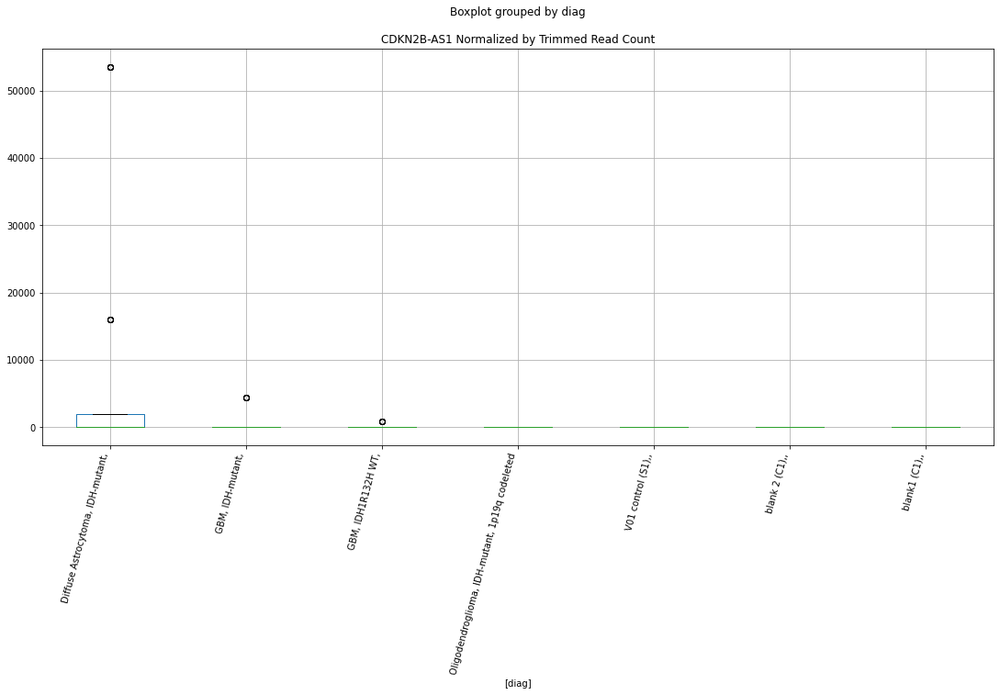

 p : 0.021674272993200374  ( t : 2.3333333333333335 ) :  D-plex  :  cutadapt2  :  IDH1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: IDH1, dtype: float64
957    176.36
958    176.36
959    176.36
960    176.36
961    176.36
Name: IDH1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: IDH1, dtype: float64


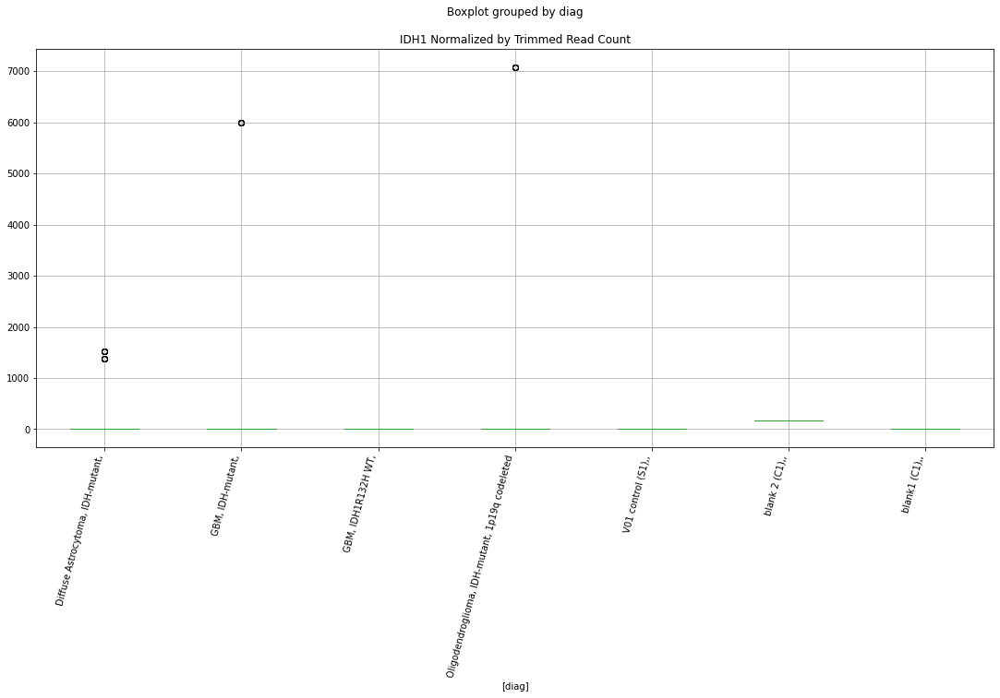

 p : 0.021674272993200423  ( t : 2.333333333333333 ) :  D-plex  :  cutadapt2  :  IDH1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: IDH1, dtype: float64
957    176.36
958    176.36
959    176.36
960    176.36
961    176.36
Name: IDH1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: IDH1, dtype: float64


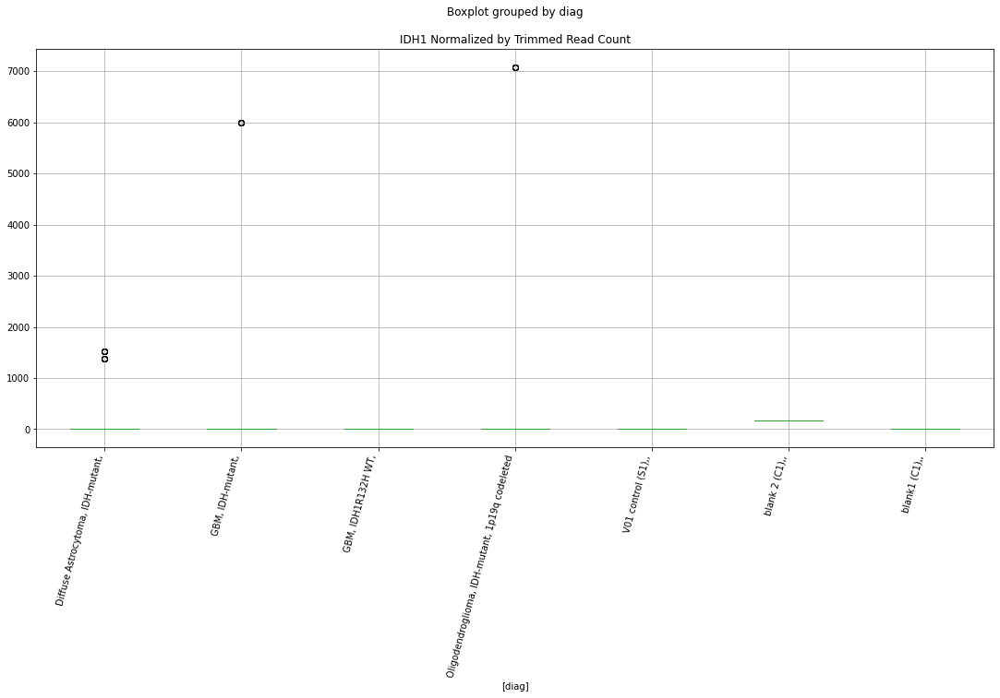

 p : 0.021674272993200423  ( t : 2.333333333333333 ) :  D-plex  :  bbduk2  :  IDH1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH1, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: IDH1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH1, dtype: float64


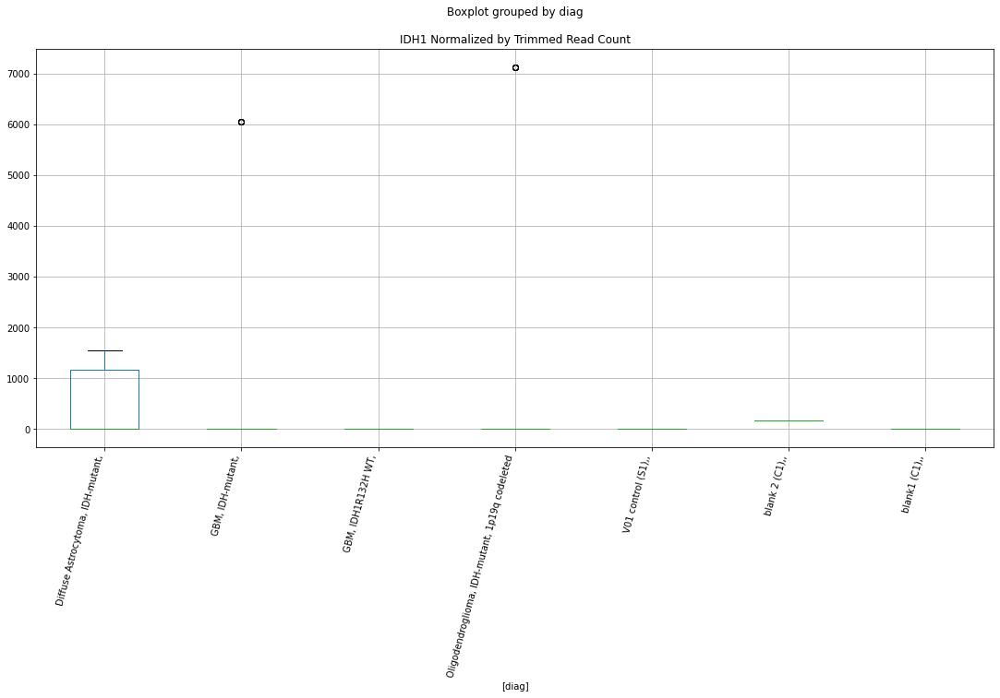

 p : 0.021674272993200423  ( t : 2.333333333333333 ) :  D-plex  :  cutadapt2  :  IDH1-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: IDH1-AS1, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: IDH1-AS1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: IDH1-AS1, dtype: float64


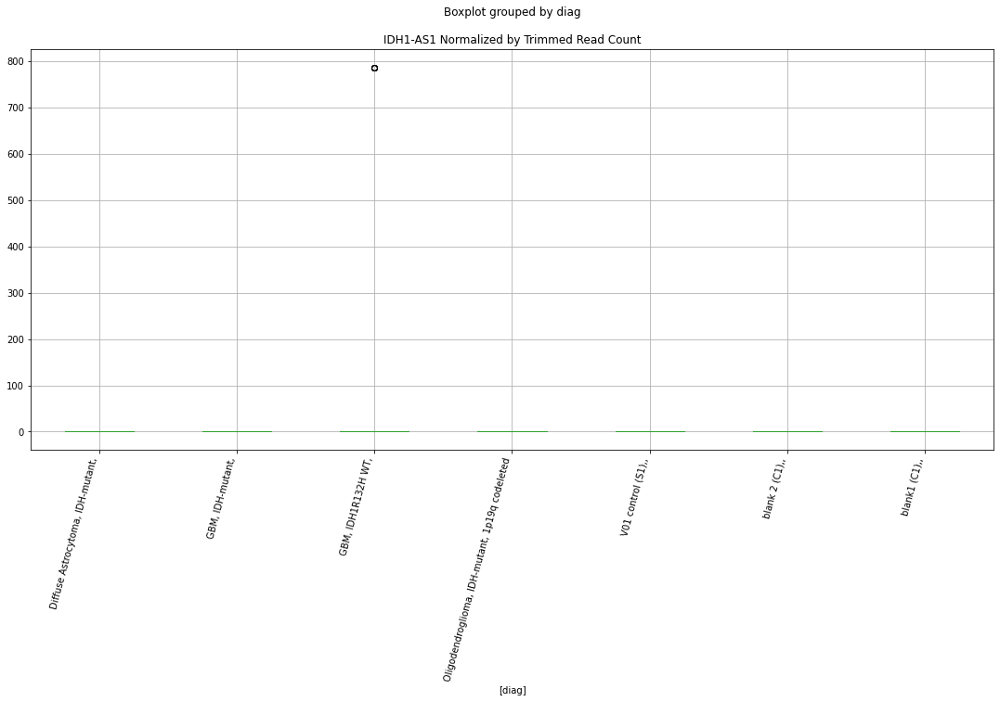

 p : 0.021745544187840814  ( t : 2.340574318442973 ) :  Lexogen  :  cutadapt2  :  CDKN2B
Control and blanks
389       0.00
390       0.00
391       0.00
392       0.00
1583    420.87
1584    420.87
1585    420.87
1586    420.87
Name: CDKN2B, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2B, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2B, dtype: float64


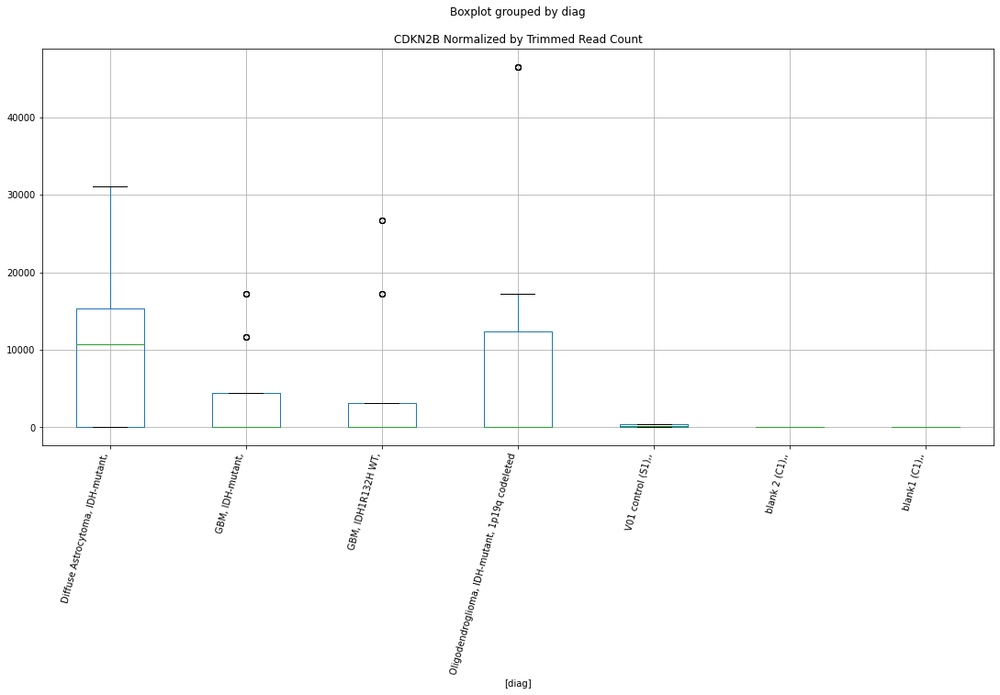

 p : 0.02175425342658727  ( t : 2.3318753292053693 ) :  D-plex  :  cutadapt2  :  TP53
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: TP53, dtype: float64
957    10581.61
958    10581.61
959    10581.61
960    10581.61
961    10581.61
Name: TP53, dtype: float64
2151    26008.01
2152    26008.01
2153    26008.01
2154    26008.01
2155    26008.01
Name: TP53, dtype: float64


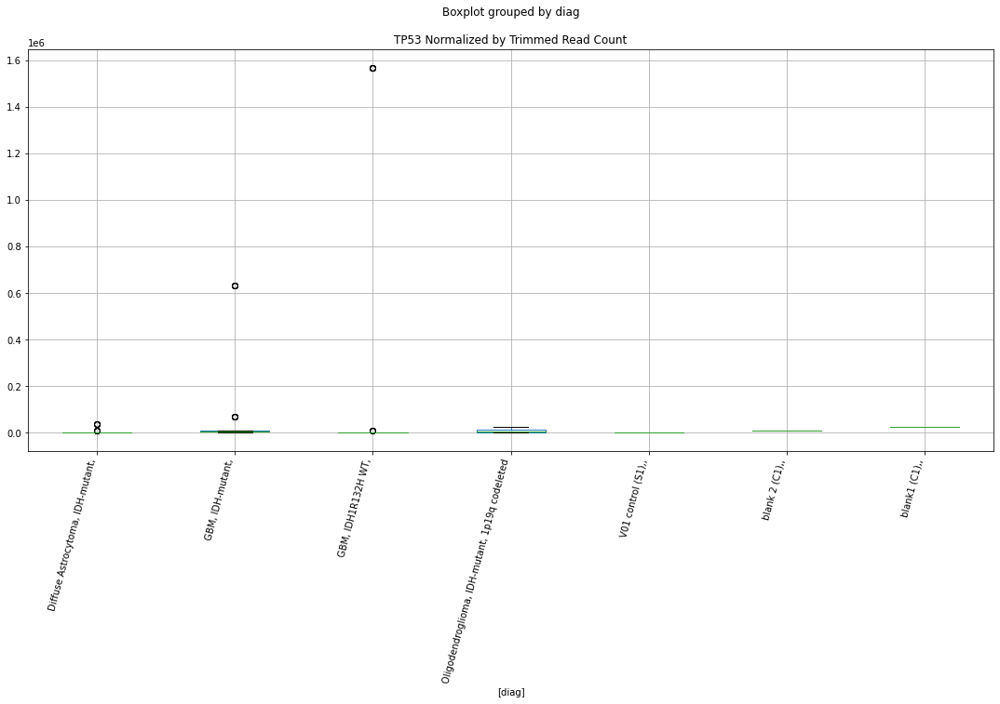

 p : 0.021984332122323695  ( t : 2.3277073606997885 ) :  D-plex  :  cutadapt2  :  RB1
Control and blanks
363         0.00
364         0.00
365         0.00
366         0.00
367         0.00
1557    26421.96
1558    26421.96
1559    26421.96
1560    26421.96
1561    26421.96
Name: RB1, dtype: float64
957    352.72
958    352.72
959    352.72
960    352.72
961    352.72
Name: RB1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: RB1, dtype: float64


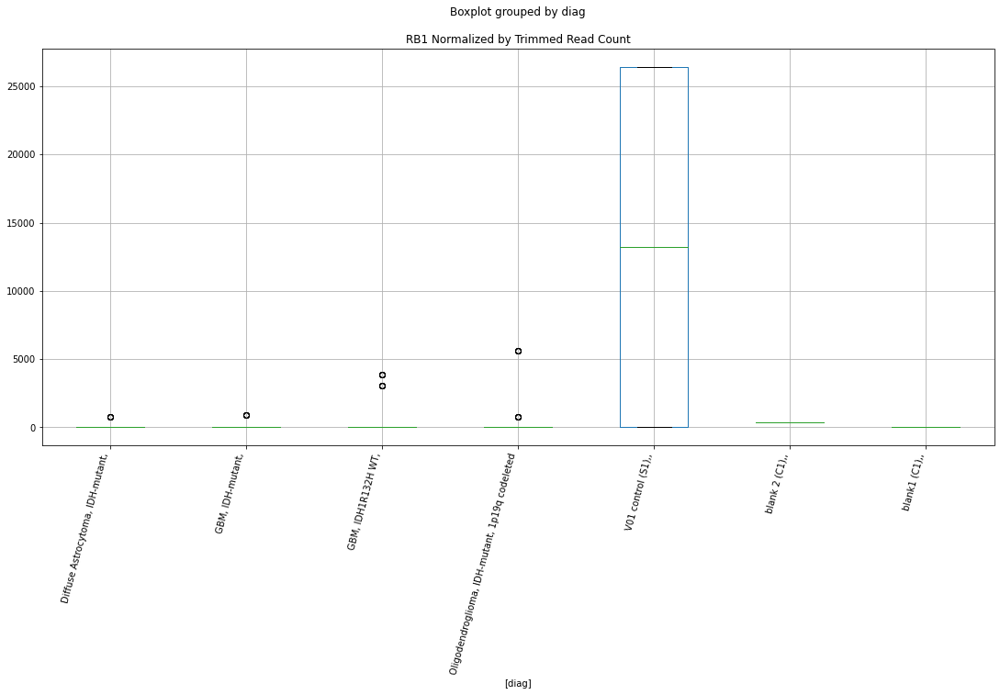

 p : 0.02216646054236286  ( t : 2.3329019041496926 ) :  Lexogen  :  bbduk2  :  CDKN2B
Control and blanks
377       0.00
378       0.00
379       0.00
380       0.00
1571    424.63
1572    424.63
1573    424.63
1574    424.63
Name: CDKN2B, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2B, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2B, dtype: float64


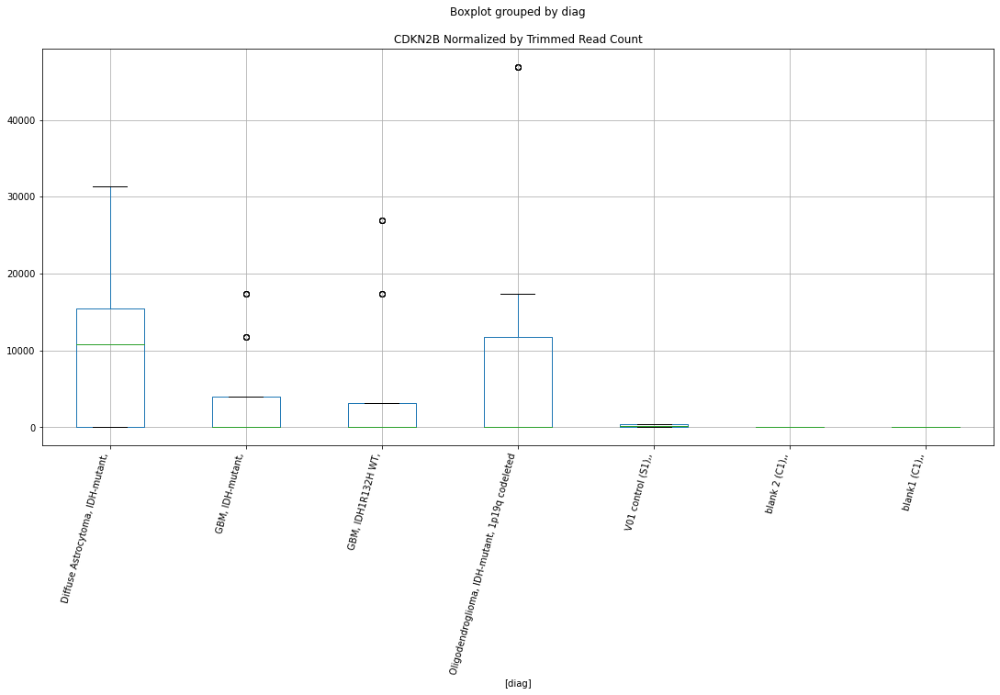

 p : 0.02260032716417536  ( t : 2.32512737374581 ) :  Lexogen  :  bbduk2  :  NOTCH1
Control and blanks
377         0.00
378         0.00
379         0.00
380         0.00
1571    28450.12
1572    28450.12
1573    28450.12
1574    28450.12
Name: NOTCH1, dtype: float64
971    8745.8
972    8745.8
973    8745.8
974    8745.8
Name: NOTCH1, dtype: float64
2165    479.03
2166    479.03
2167    479.03
2168    479.03
Name: NOTCH1, dtype: float64


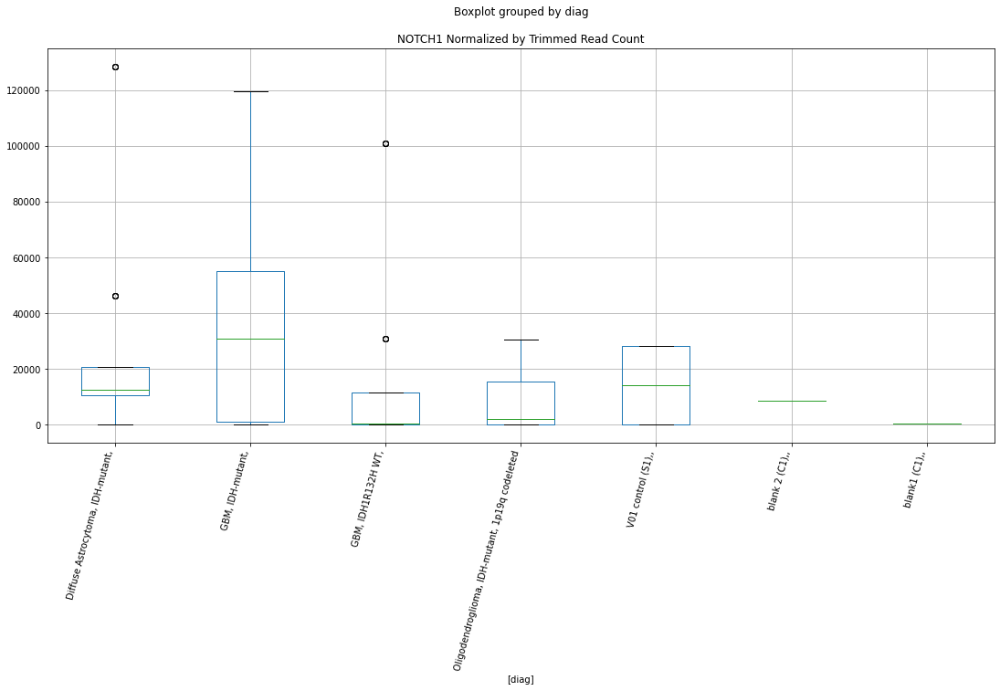

 p : 0.02276415112374018  ( t : 2.3138614706699063 ) :  D-plex  :  bbduk2  :  EGFR-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR-AS1, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: EGFR-AS1, dtype: float64
2136    591.53
2137    591.53
2138    591.53
2139    591.53
2140    591.53
Name: EGFR-AS1, dtype: float64


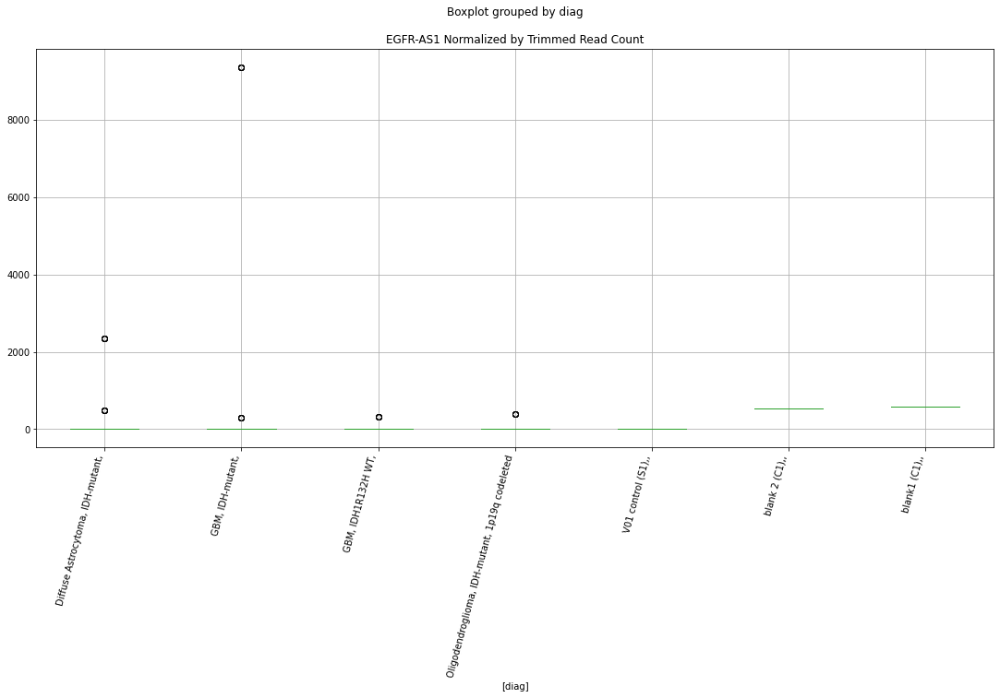

 p : 0.022772747183109537  ( t : 2.313711192607061 ) :  D-plex  :  cutadapt2  :  EGFR-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR-AS1, dtype: float64
957    529.08
958    529.08
959    529.08
960    529.08
961    529.08
Name: EGFR-AS1, dtype: float64
2151    1155.91
2152    1155.91
2153    1155.91
2154    1155.91
2155    1155.91
Name: EGFR-AS1, dtype: float64


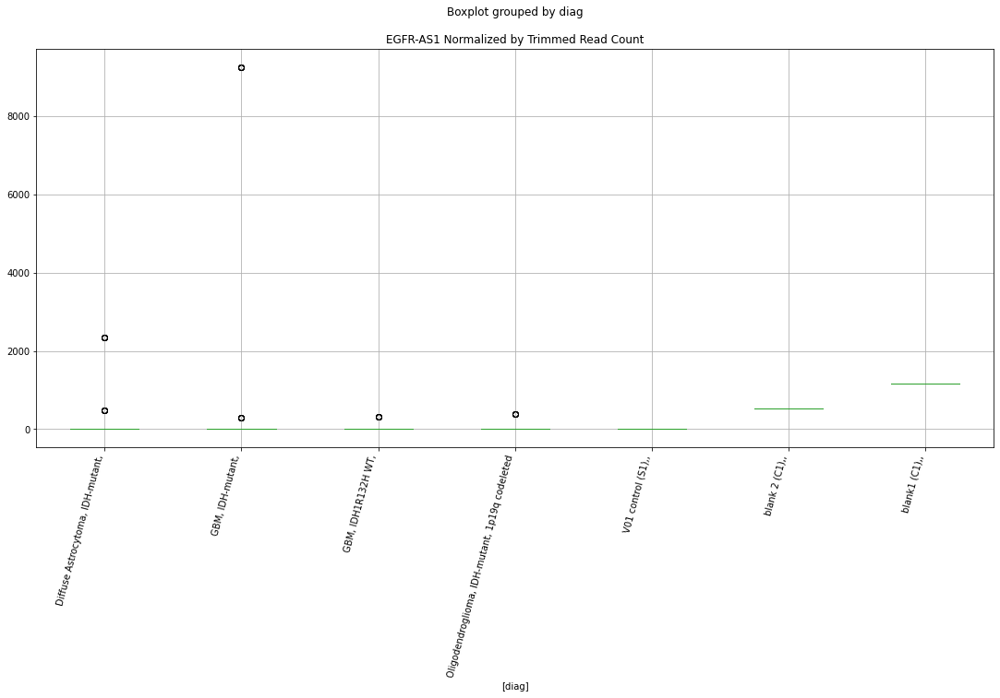

 p : 0.02290619104480548  ( t : 2.311384694621072 ) :  D-plex  :  bbduk2  :  CDKN2B
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B, dtype: float64
942    358.18
943    358.18
944    358.18
945    358.18
946    358.18
Name: CDKN2B, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2B, dtype: float64


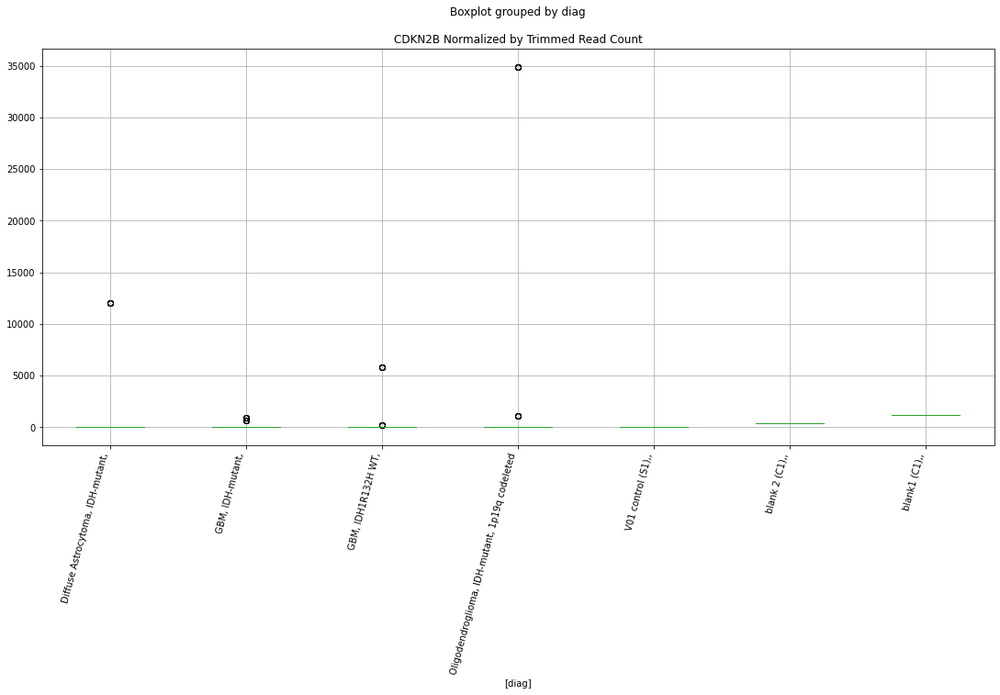

 p : 0.02446137068923149  ( t : 2.285117205362336 ) :  D-plex  :  cutadapt2  :  TP53
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: TP53, dtype: float64
957    10581.61
958    10581.61
959    10581.61
960    10581.61
961    10581.61
Name: TP53, dtype: float64
2151    26008.01
2152    26008.01
2153    26008.01
2154    26008.01
2155    26008.01
Name: TP53, dtype: float64


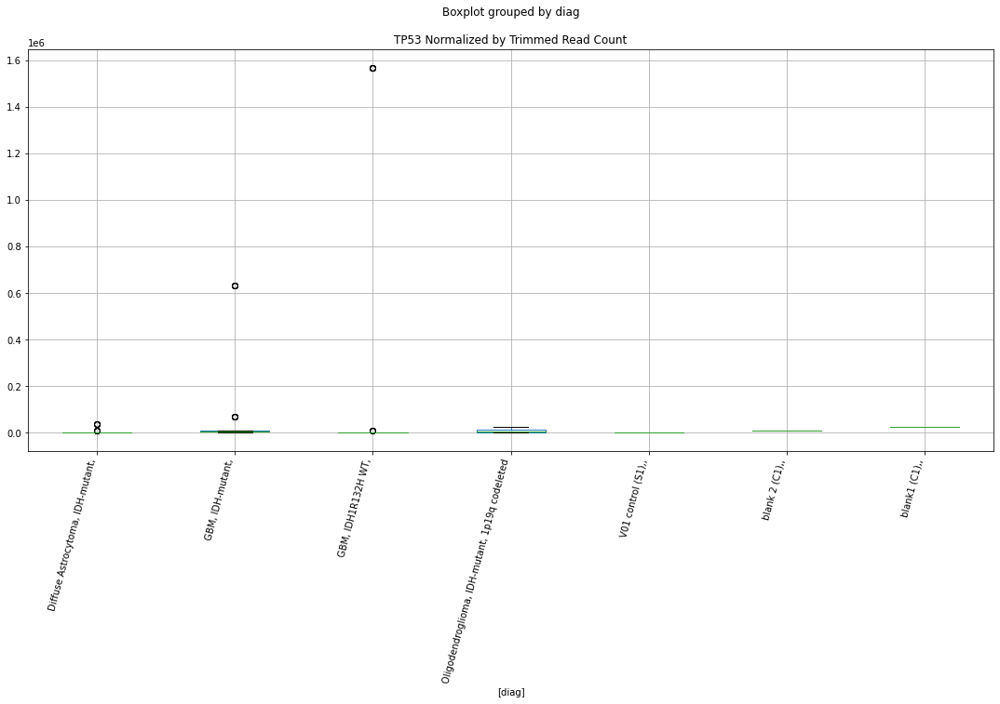

 p : 0.02450569557895353  ( t : 2.2924752251038614 ) :  Lexogen  :  bbduk2  :  RB1CC1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1CC1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1CC1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1CC1, dtype: float64


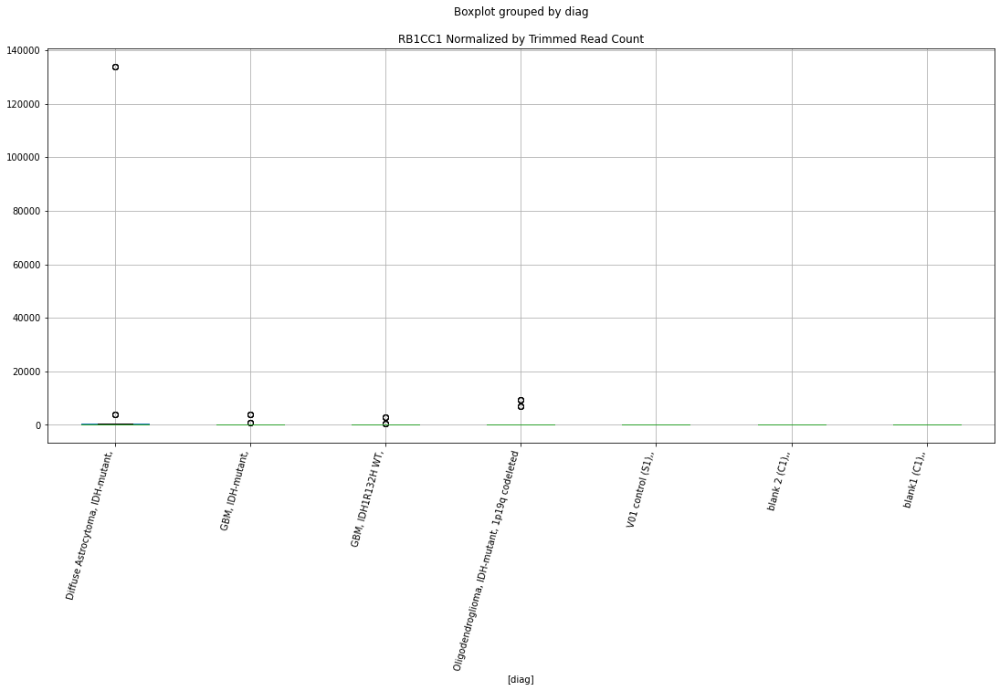

 p : 0.024550292654043612  ( t : 2.2836601698452275 ) :  D-plex  :  bbduk2  :  CDKN2B-AS1
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B-AS1, dtype: float64
942    0.0
943    0.0
944    0.0
945    0.0
946    0.0
Name: CDKN2B-AS1, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2B-AS1, dtype: float64


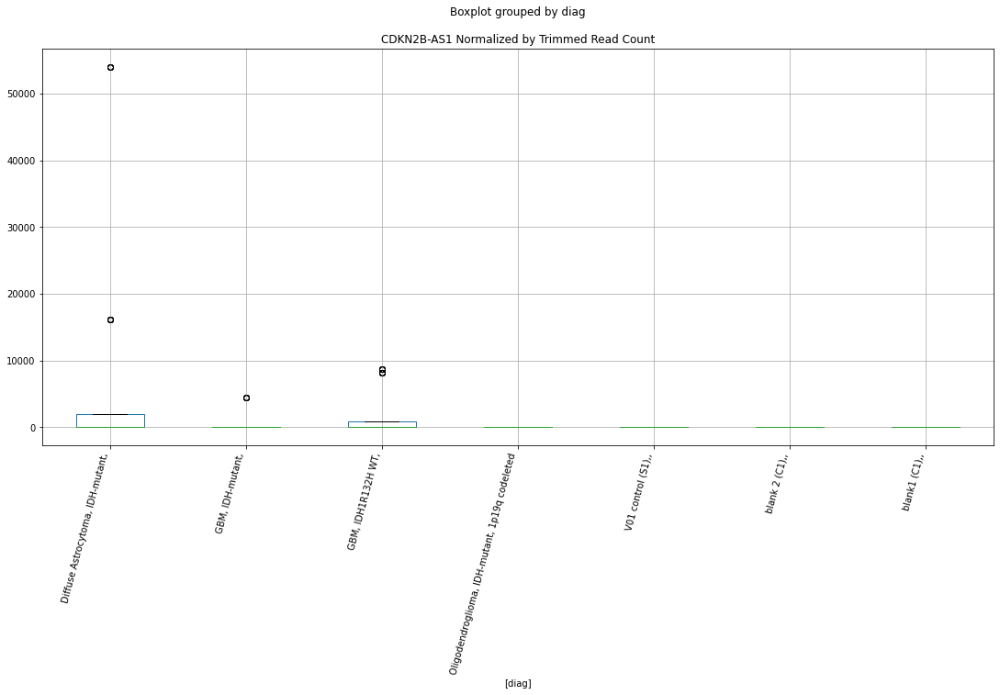

 p : 0.02456599550218374  ( t : 2.2834033524757027 ) :  D-plex  :  bbduk2  :  TP53
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: TP53, dtype: float64
942    10745.46
943    10745.46
944    10745.46
945    10745.46
946    10745.46
Name: TP53, dtype: float64
2136    26618.73
2137    26618.73
2138    26618.73
2139    26618.73
2140    26618.73
Name: TP53, dtype: float64


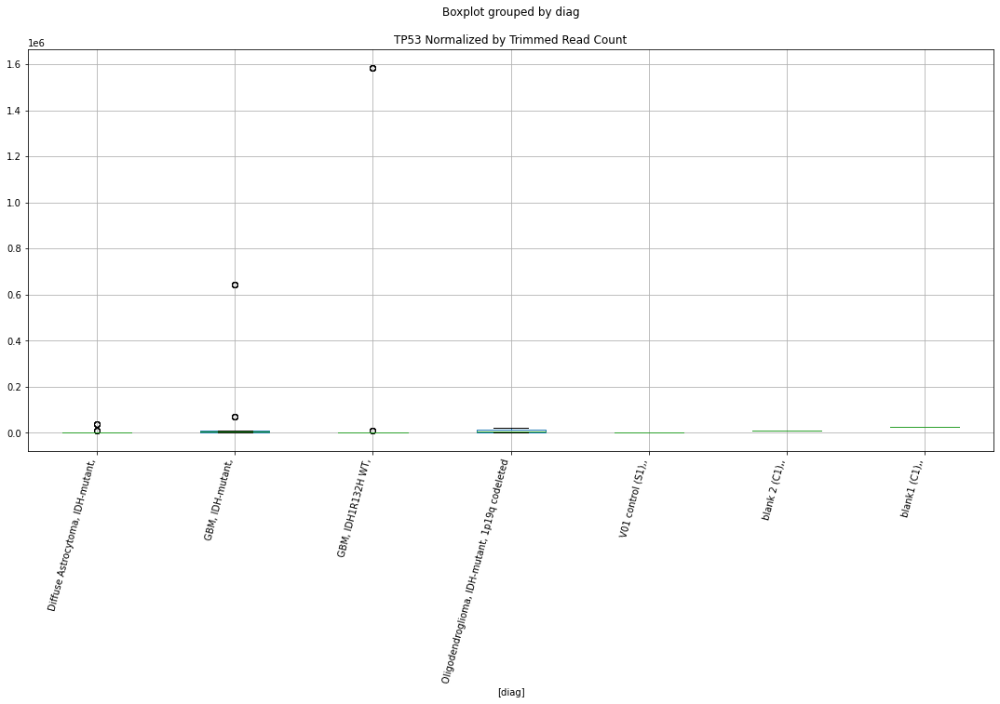

 p : 0.024905544240938448  ( t : 2.277885109977566 ) :  D-plex  :  bbduk2  :  TERT
Control and blanks
348     3092.03
349     3092.03
350     3092.03
351     3092.03
352     3092.03
1542       0.00
1543       0.00
1544       0.00
1545       0.00
1546       0.00
Name: TERT, dtype: float64
942    2865.46
943    2865.46
944    2865.46
945    2865.46
946    2865.46
Name: TERT, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: TERT, dtype: float64


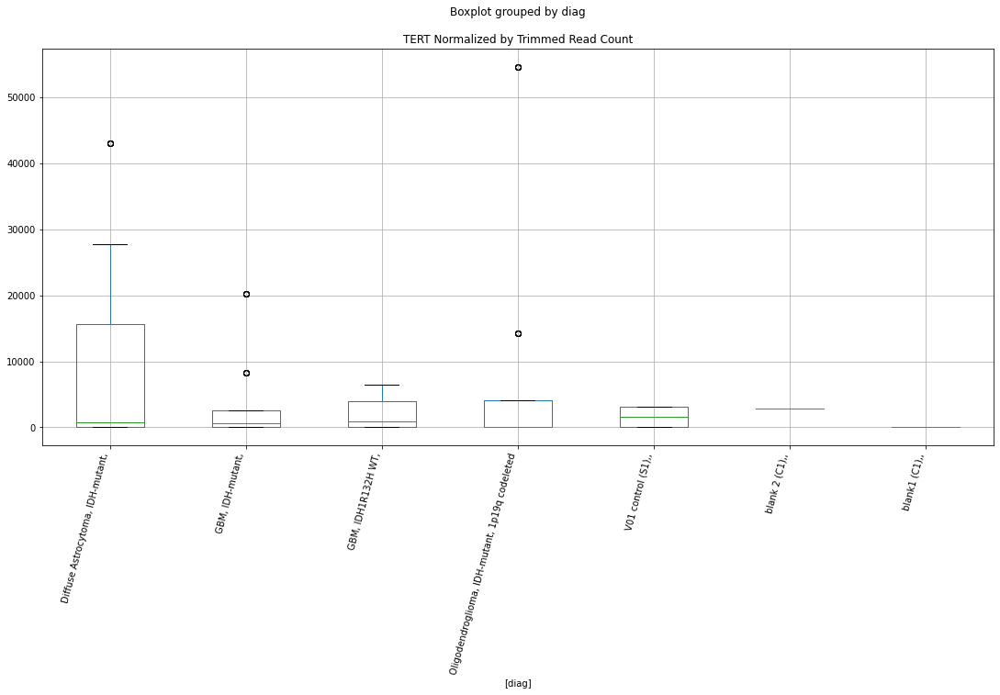

 p : 0.026098996940326163  ( t : 2.2590001708451144 ) :  D-plex  :  cutadapt2  :  RB1
Control and blanks
363         0.00
364         0.00
365         0.00
366         0.00
367         0.00
1557    26421.96
1558    26421.96
1559    26421.96
1560    26421.96
1561    26421.96
Name: RB1, dtype: float64
957    352.72
958    352.72
959    352.72
960    352.72
961    352.72
Name: RB1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: RB1, dtype: float64


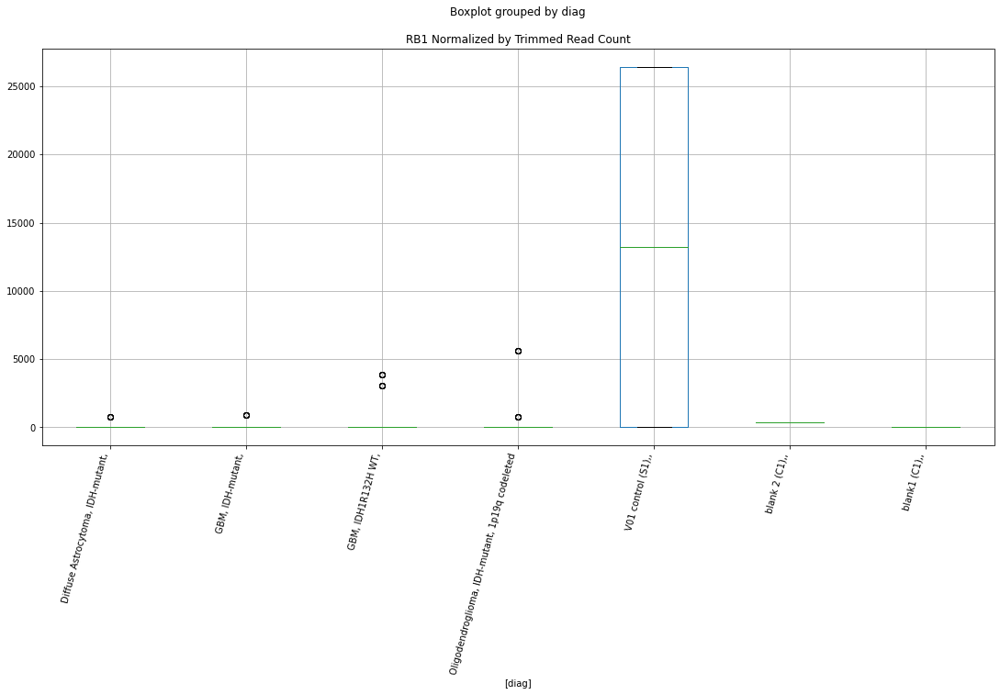

 p : 0.026204932349679785  ( t : 2.265194788016329 ) :  Lexogen  :  bbduk2  :  TP53
Control and blanks
377     6.87e+05
378     6.87e+05
379     6.87e+05
380     6.87e+05
1571    5.99e+06
1572    5.99e+06
1573    5.99e+06
1574    5.99e+06
Name: TP53, dtype: float64
971    1.02e+06
972    1.02e+06
973    1.02e+06
974    1.02e+06
Name: TP53, dtype: float64
2165    1.02e+06
2166    1.02e+06
2167    1.02e+06
2168    1.02e+06
Name: TP53, dtype: float64


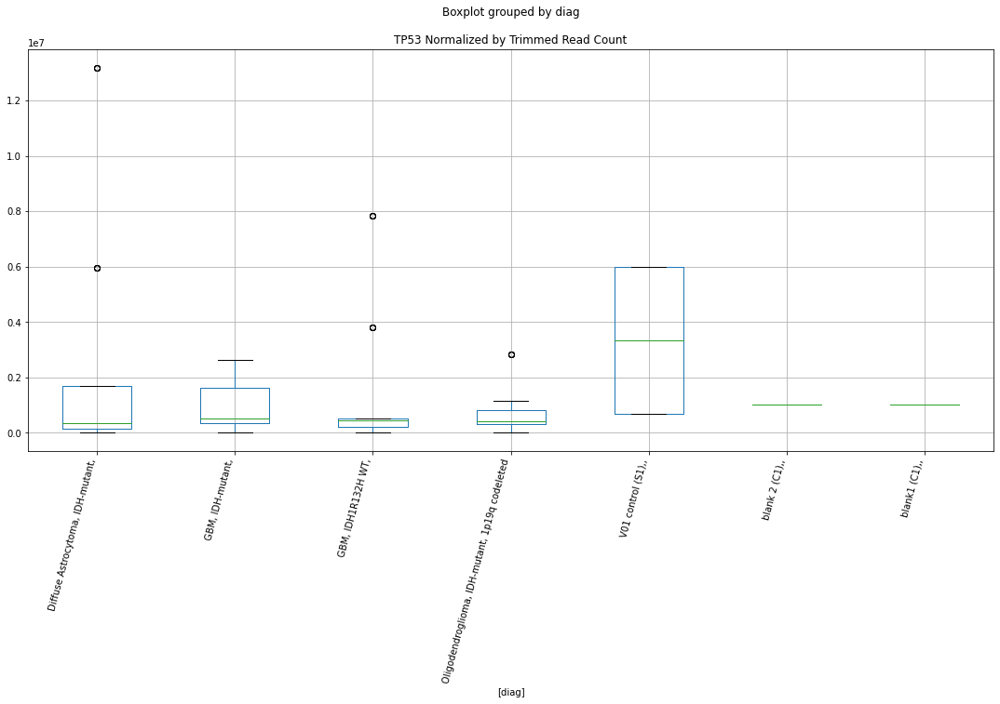

 p : 0.026321470045465475  ( t : 2.263381504257727 ) :  Lexogen  :  cutadapt2  :  TP53
Control and blanks
389     6.82e+05
390     6.82e+05
391     6.82e+05
392     6.82e+05
1583    5.98e+06
1584    5.98e+06
1585    5.98e+06
1586    5.98e+06
Name: TP53, dtype: float64
983    1.01e+06
984    1.01e+06
985    1.01e+06
986    1.01e+06
Name: TP53, dtype: float64
2177    1.02e+06
2178    1.02e+06
2179    1.02e+06
2180    1.02e+06
Name: TP53, dtype: float64


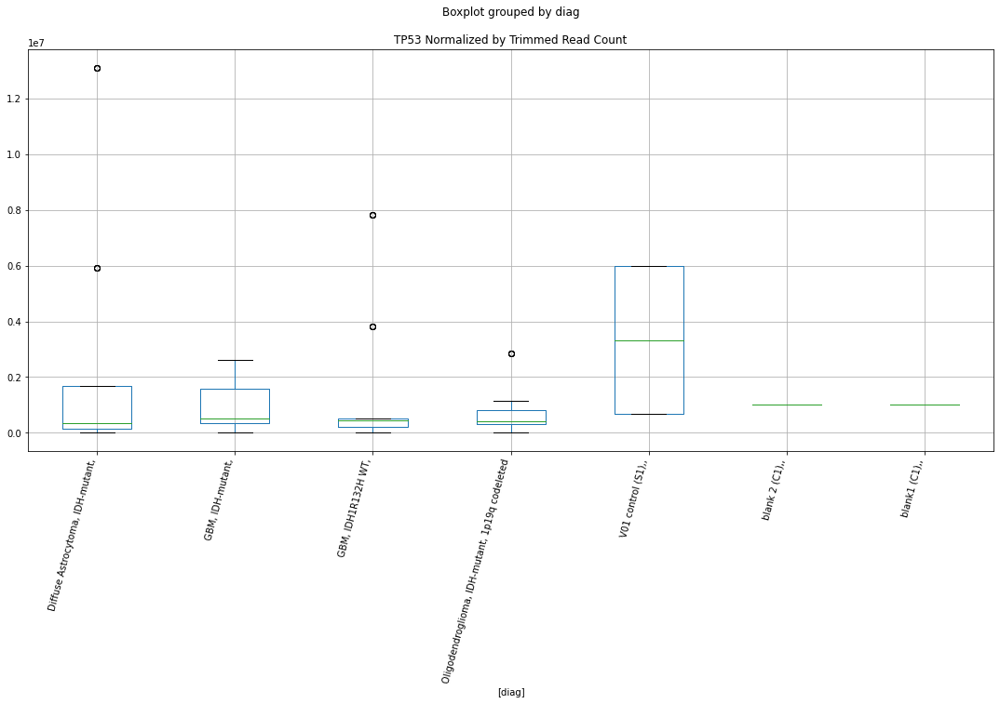

 p : 0.027580420841428123  ( t : 2.2365853982889288 ) :  D-plex  :  cutadapt2  :  CDKN2A
Control and blanks
363     757.61
364     757.61
365     757.61
366     757.61
367     757.61
1557      0.00
1558      0.00
1559      0.00
1560      0.00
1561      0.00
Name: CDKN2A, dtype: float64
957    5290.81
958    5290.81
959    5290.81
960    5290.81
961    5290.81
Name: CDKN2A, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2A, dtype: float64


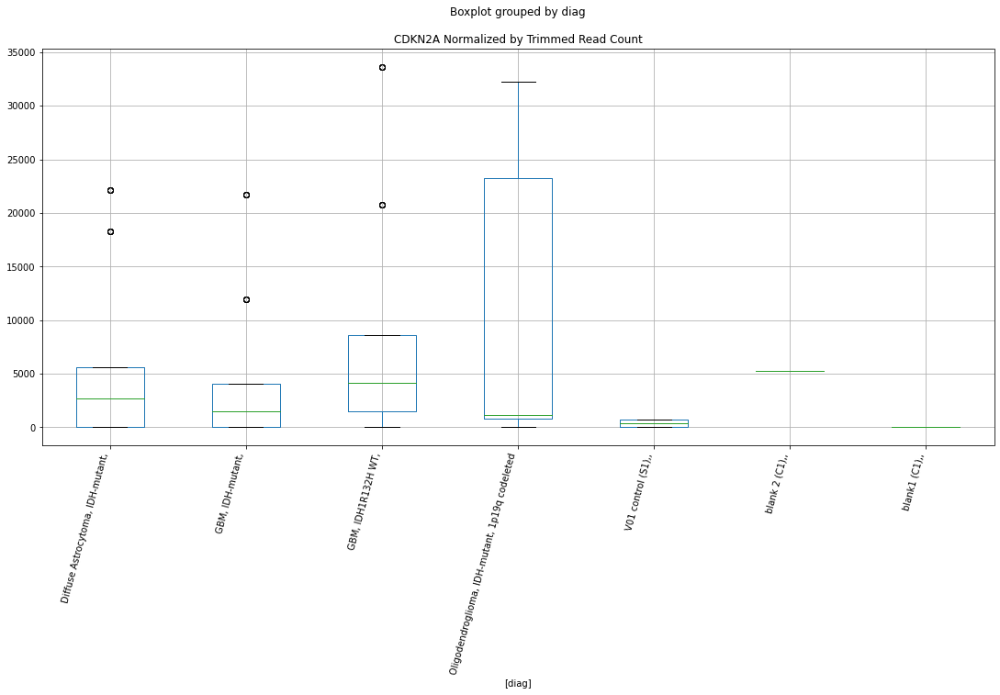

 p : 0.02784961508958749  ( t : 2.232626084190698 ) :  D-plex  :  bbduk2  :  TP53
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: TP53, dtype: float64
942    10745.46
943    10745.46
944    10745.46
945    10745.46
946    10745.46
Name: TP53, dtype: float64
2136    26618.73
2137    26618.73
2138    26618.73
2139    26618.73
2140    26618.73
Name: TP53, dtype: float64


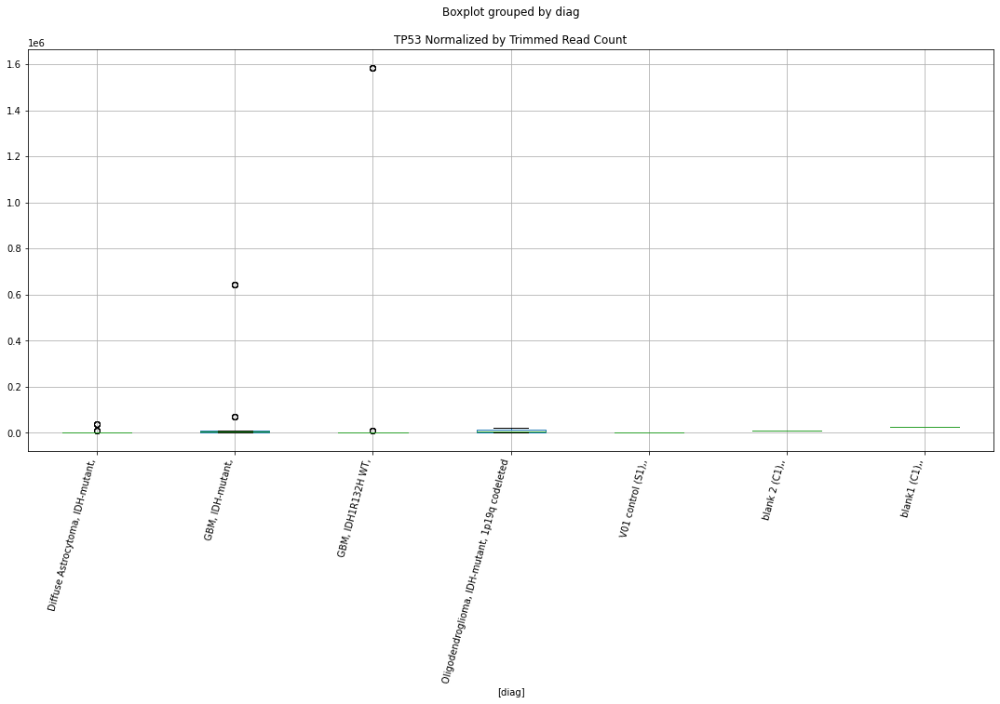

 p : 0.028123535714808363  ( t : 2.22863149620165 ) :  D-plex  :  bbduk2  :  NOTCH1
Control and blanks
348     12368.13
349     12368.13
350     12368.13
351     12368.13
352     12368.13
1542    85455.10
1543    85455.10
1544    85455.10
1545    85455.10
1546    85455.10
Name: NOTCH1, dtype: float64
942    64651.83
943    64651.83
944    64651.83
945    64651.83
946    64651.83
Name: NOTCH1, dtype: float64
2136    403421.63
2137    403421.63
2138    403421.63
2139    403421.63
2140    403421.63
Name: NOTCH1, dtype: float64


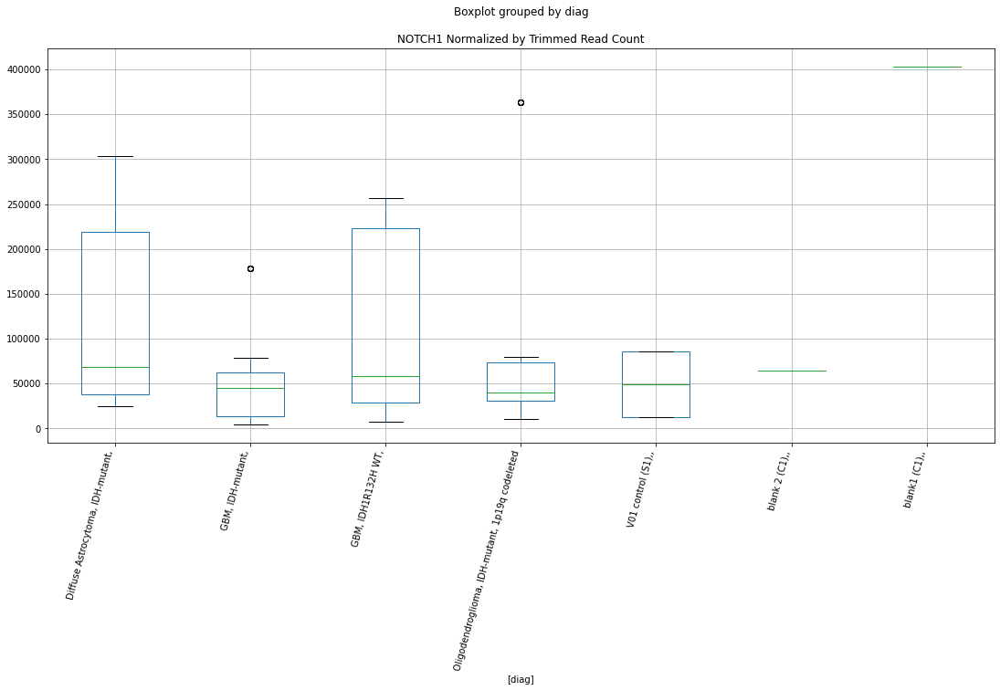

 p : 0.028529155121019882  ( t : 2.2227784286787236 ) :  D-plex  :  bbduk2  :  CDKN2A
Control and blanks
348     773.01
349     773.01
350     773.01
351     773.01
352     773.01
1542      0.00
1543      0.00
1544      0.00
1545      0.00
1546      0.00
Name: CDKN2A, dtype: float64
942    5372.73
943    5372.73
944    5372.73
945    5372.73
946    5372.73
Name: CDKN2A, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2A, dtype: float64


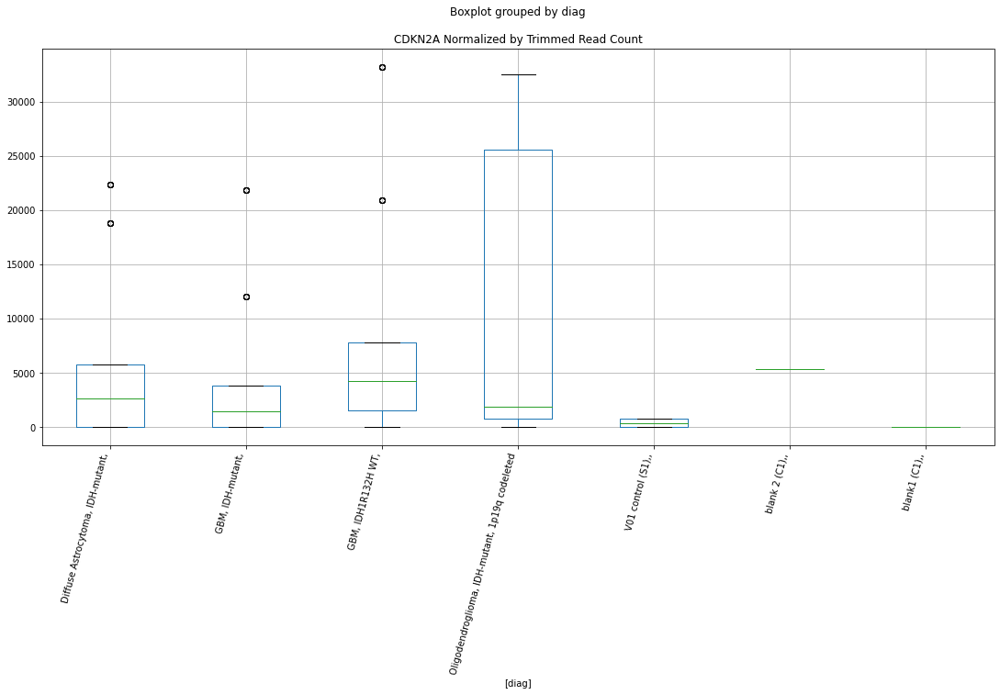

 p : 0.029085099985048078  ( t : 2.214873289176622 ) :  D-plex  :  cutadapt2  :  TP53
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: TP53, dtype: float64
957    10581.61
958    10581.61
959    10581.61
960    10581.61
961    10581.61
Name: TP53, dtype: float64
2151    26008.01
2152    26008.01
2153    26008.01
2154    26008.01
2155    26008.01
Name: TP53, dtype: float64


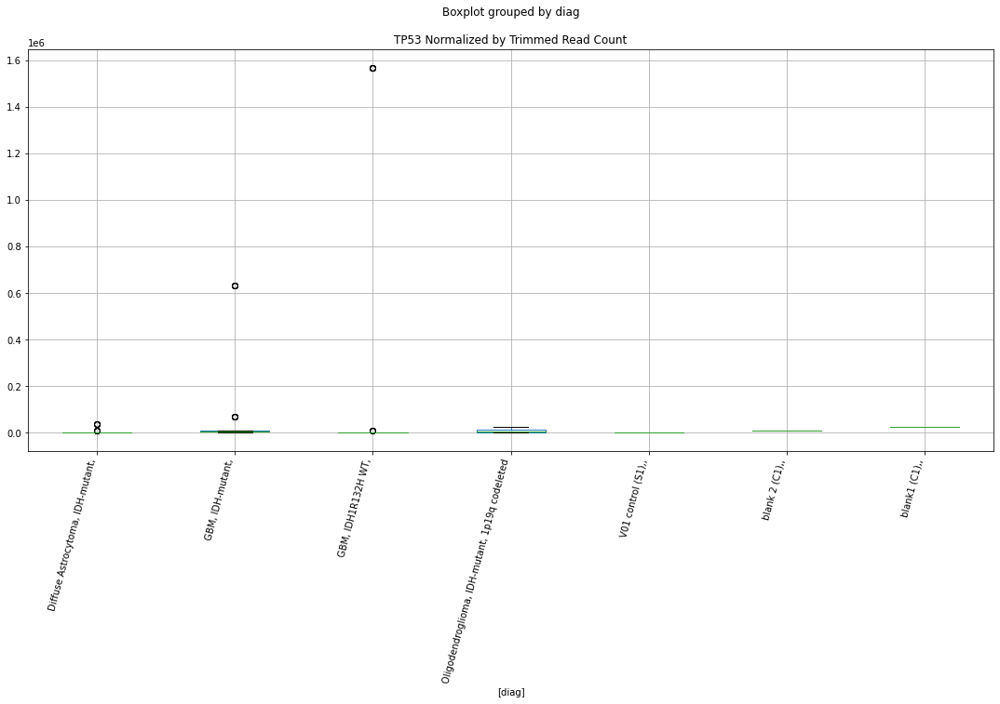

 p : 0.029281276311583348  ( t : 2.219541597628324 ) :  Lexogen  :  bbduk2  :  IDH1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH1, dtype: float64


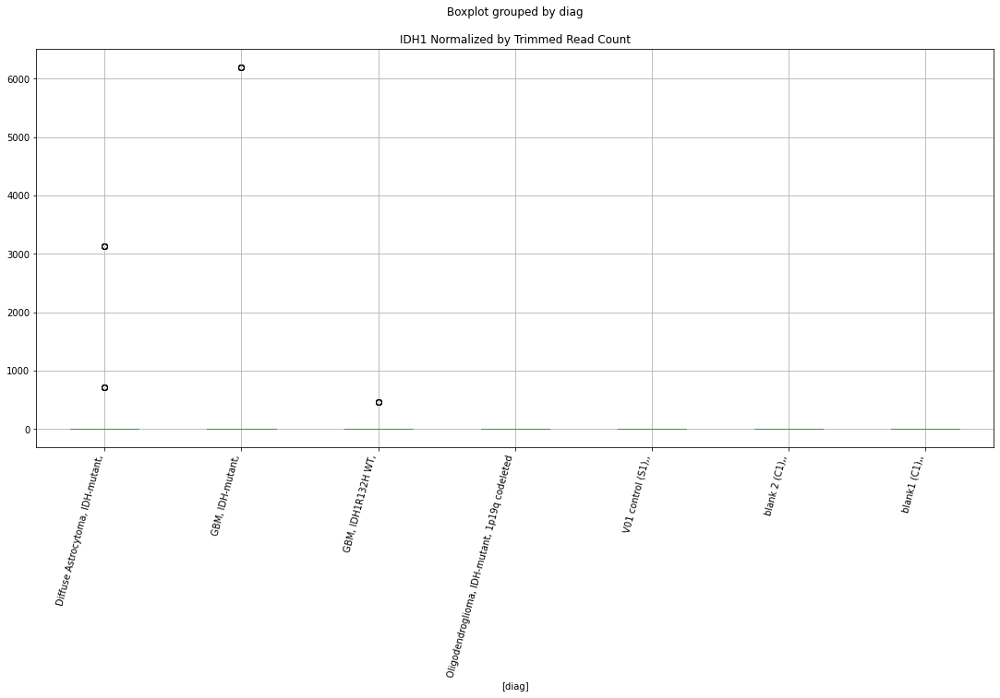

 p : 0.030689140806545525  ( t : 2.192782741239898 ) :  D-plex  :  bbduk2  :  EGFR
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR, dtype: float64
942    3581.82
943    3581.82
944    3581.82
945    3581.82
946    3581.82
Name: EGFR, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: EGFR, dtype: float64


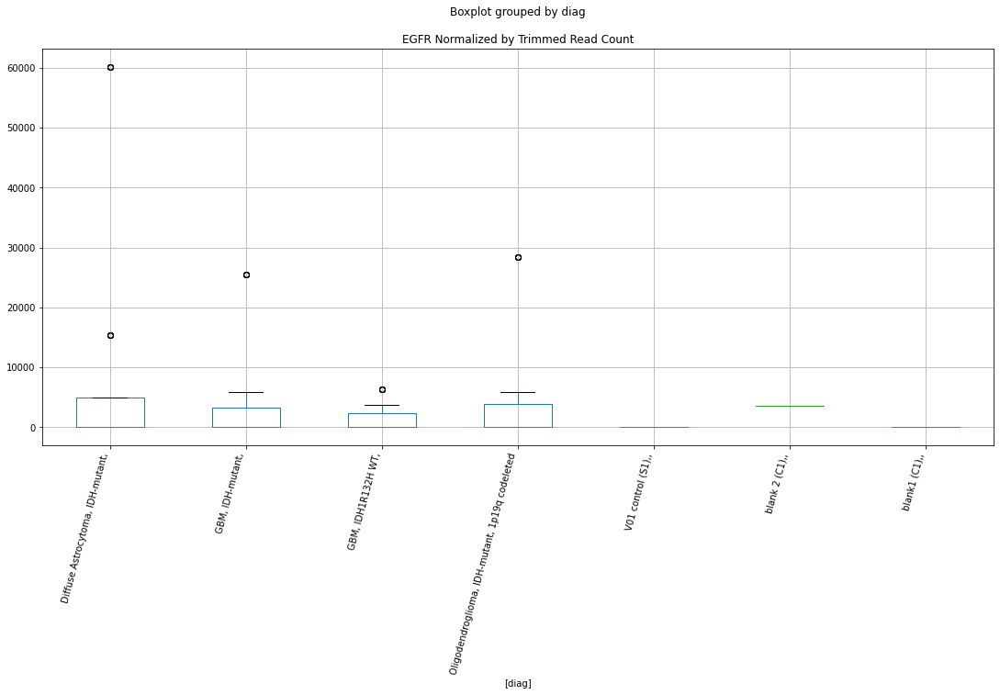

 p : 0.030768630731951983  ( t : 2.191714441062553 ) :  D-plex  :  cutadapt2  :  EGFR
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR, dtype: float64
957    3527.2
958    3527.2
959    3527.2
960    3527.2
961    3527.2
Name: EGFR, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: EGFR, dtype: float64


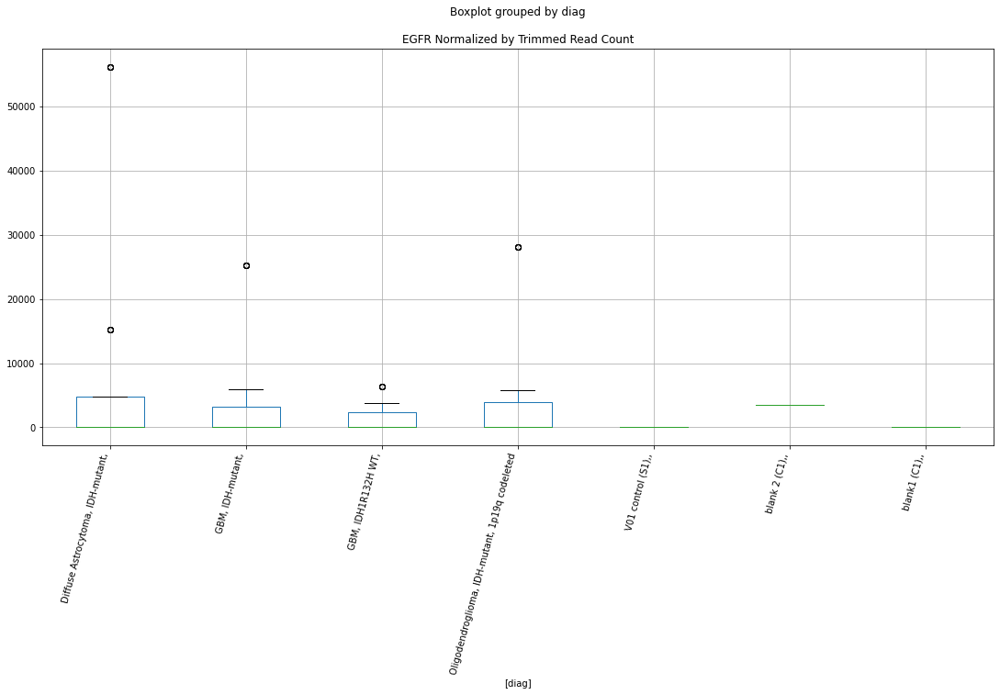

 p : 0.032213613948890114  ( t : 2.172702138486021 ) :  D-plex  :  bbduk2  :  CDKN2AIPNL
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIPNL, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: CDKN2AIPNL, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2AIPNL, dtype: float64


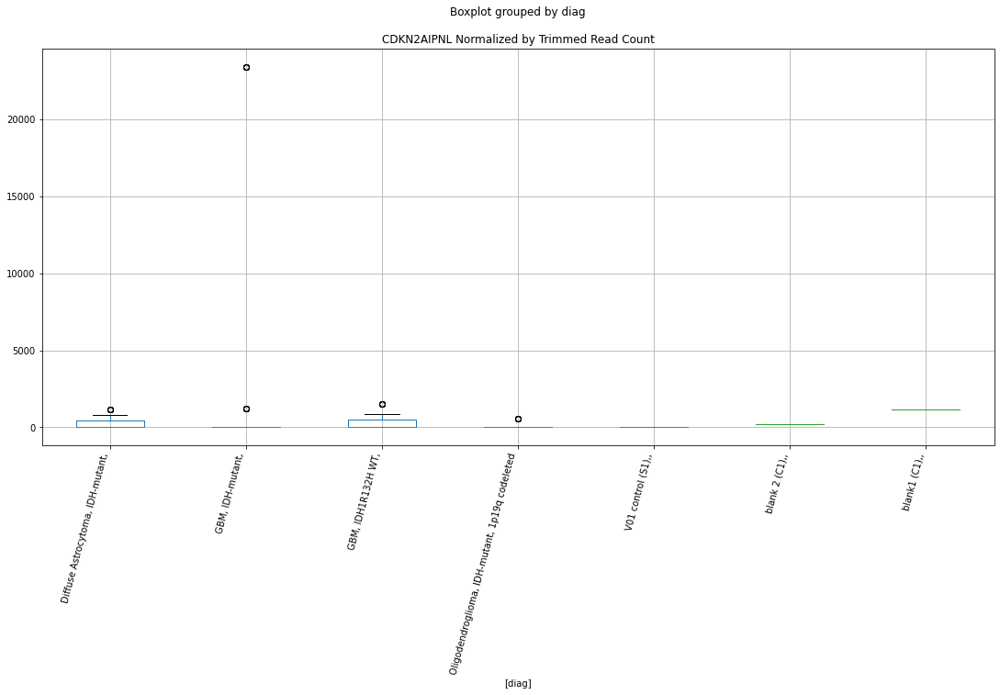

 p : 0.032450909426896164  ( t : 2.1696511896131243 ) :  D-plex  :  bbduk2  :  CDKN2AIPNL
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2AIPNL, dtype: float64
942    179.09
943    179.09
944    179.09
945    179.09
946    179.09
Name: CDKN2AIPNL, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2AIPNL, dtype: float64


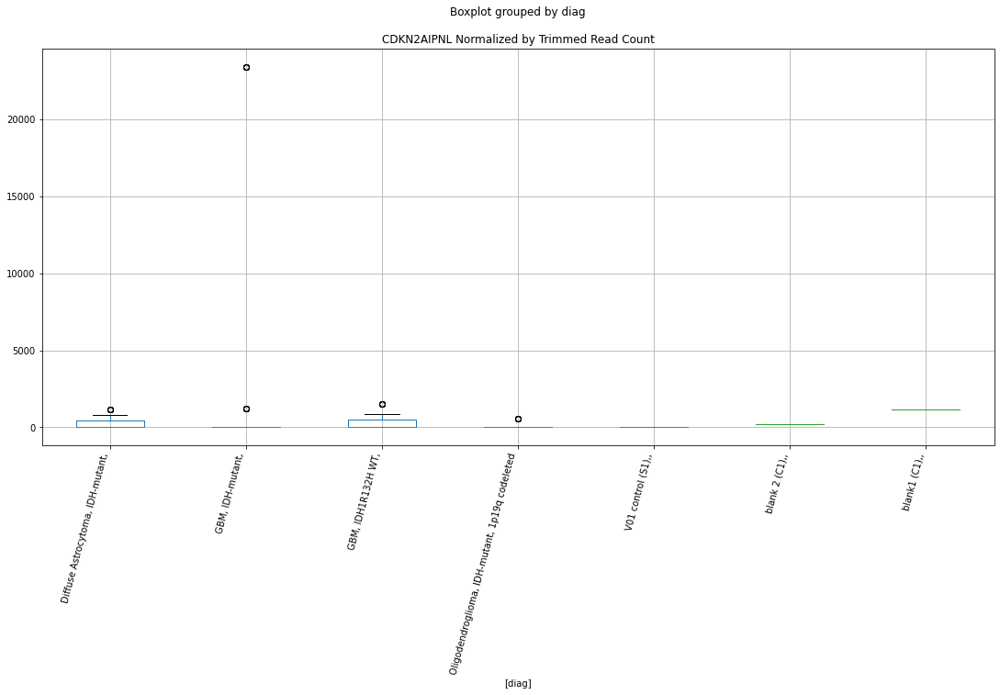

 p : 0.03340528381534225  ( t : 2.164527896602429 ) :  Lexogen  :  bbduk2  :  EGFR
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: EGFR, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: EGFR, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: EGFR, dtype: float64


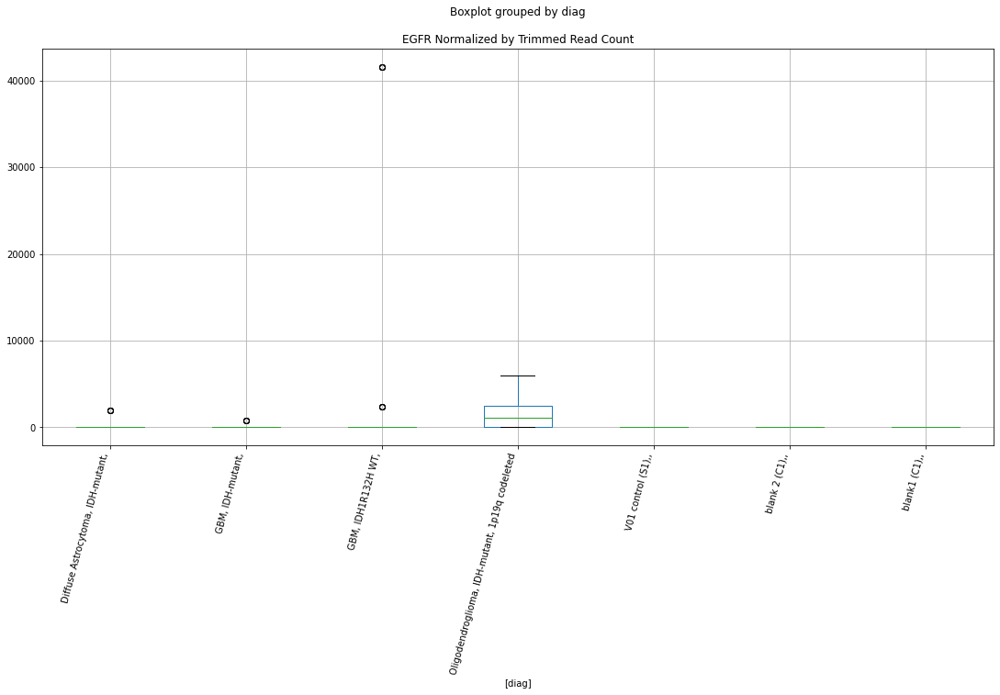

 p : 0.03415145948382436  ( t : 2.14833726356673 ) :  D-plex  :  cutadapt2  :  NOTCH1
Control and blanks
363     12121.83
364     12121.83
365     12121.83
366     12121.83
367     12121.83
1557    84550.28
1558    84550.28
1559    84550.28
1560    84550.28
1561    84550.28
Name: NOTCH1, dtype: float64
957    64371.48
958    64371.48
959    64371.48
960    64371.48
961    64371.48
Name: NOTCH1, dtype: float64
2151    394165.88
2152    394165.88
2153    394165.88
2154    394165.88
2155    394165.88
Name: NOTCH1, dtype: float64


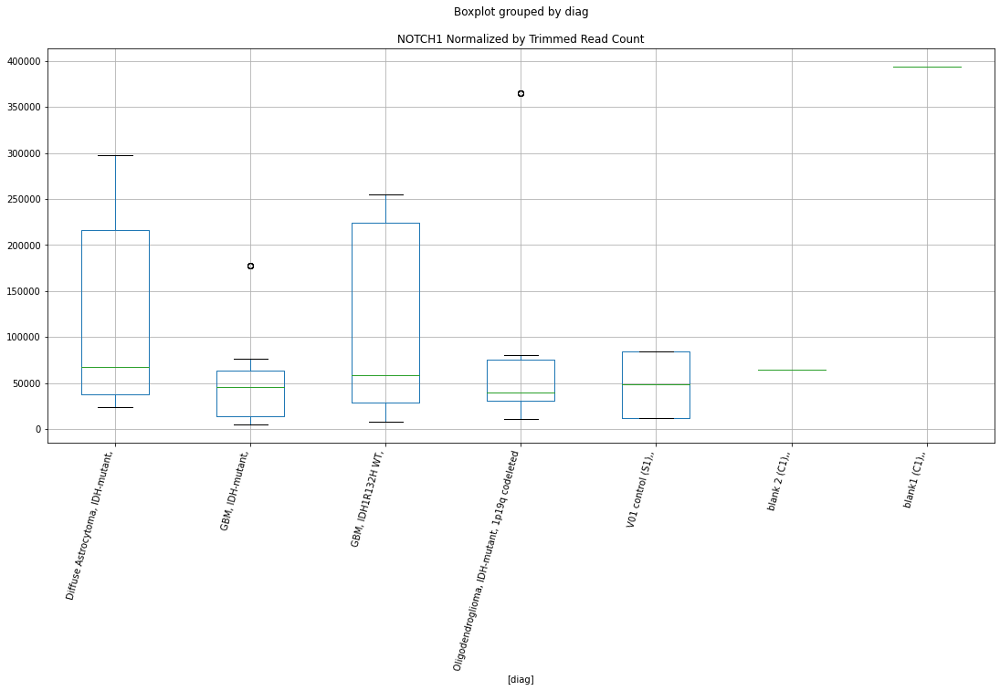

 p : 0.03597805430122629  ( t : 2.133140960706535 ) :  Lexogen  :  cutadapt2  :  CDKN2A
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2A, dtype: float64
983    1627.36
984    1627.36
985    1627.36
986    1627.36
Name: CDKN2A, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2A, dtype: float64


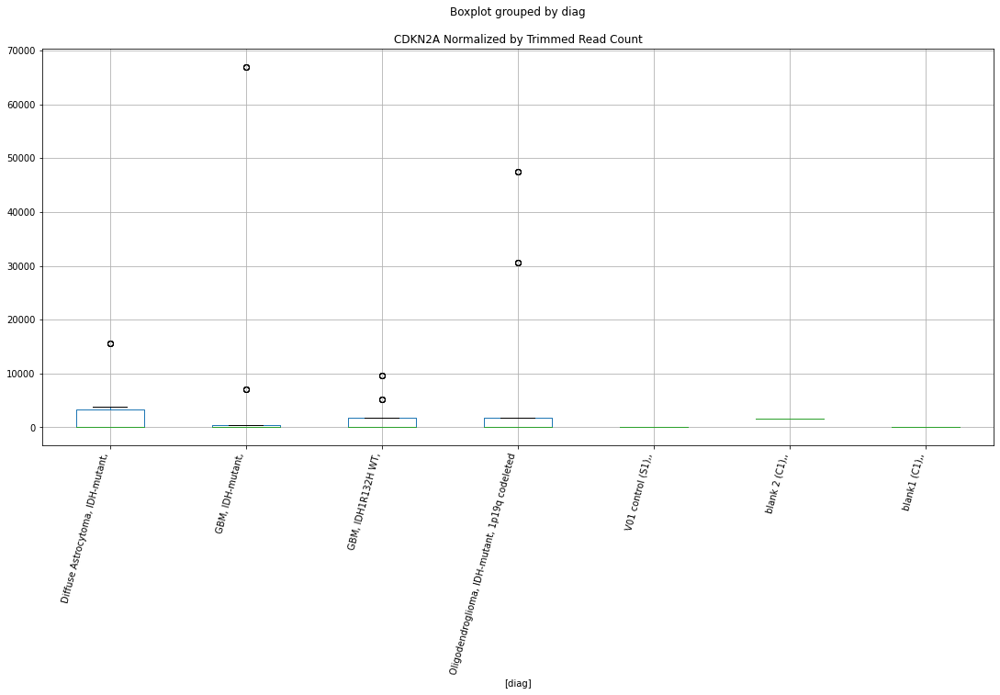

 p : 0.038278546361184114  ( t : 2.106686034465373 ) :  Lexogen  :  bbduk2  :  EGFR
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: EGFR, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: EGFR, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: EGFR, dtype: float64


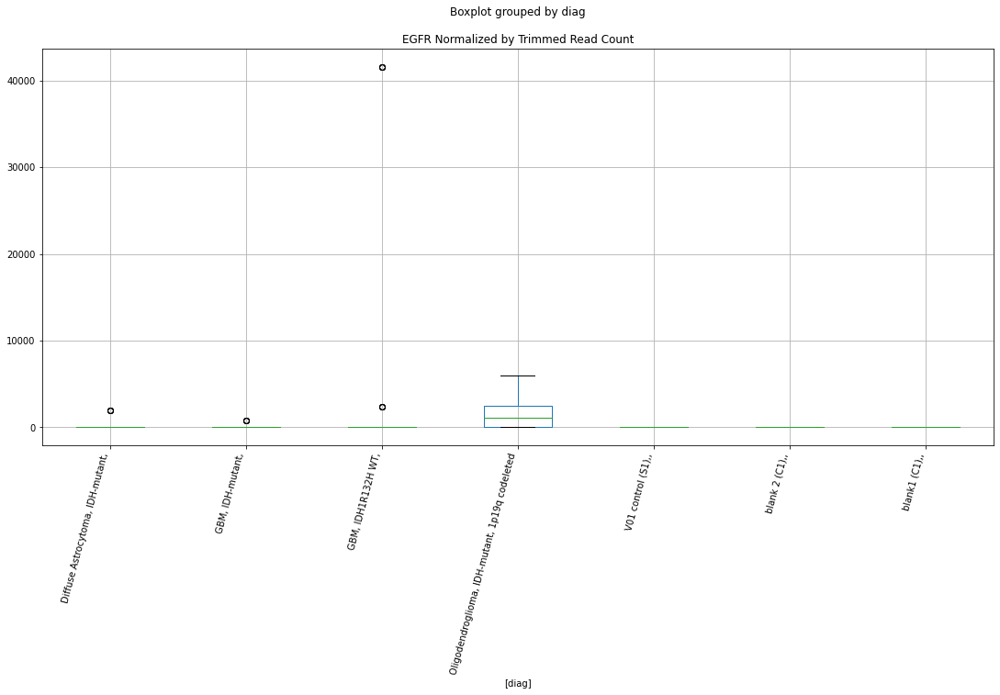

 p : 0.03897491400313443  ( t : 2.0989498230995487 ) :  Lexogen  :  bbduk2  :  RB1CC1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1CC1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1CC1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1CC1, dtype: float64


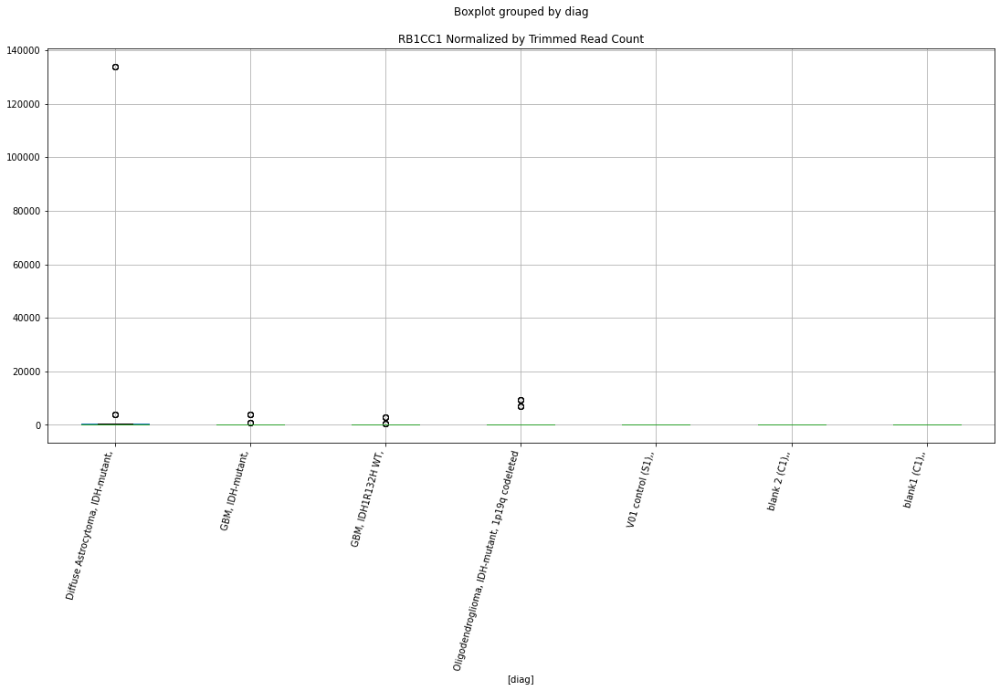

 p : 0.03931334333501313  ( t : 2.095233196745318 ) :  Lexogen  :  bbduk2  :  RB1CC1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1CC1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1CC1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1CC1, dtype: float64


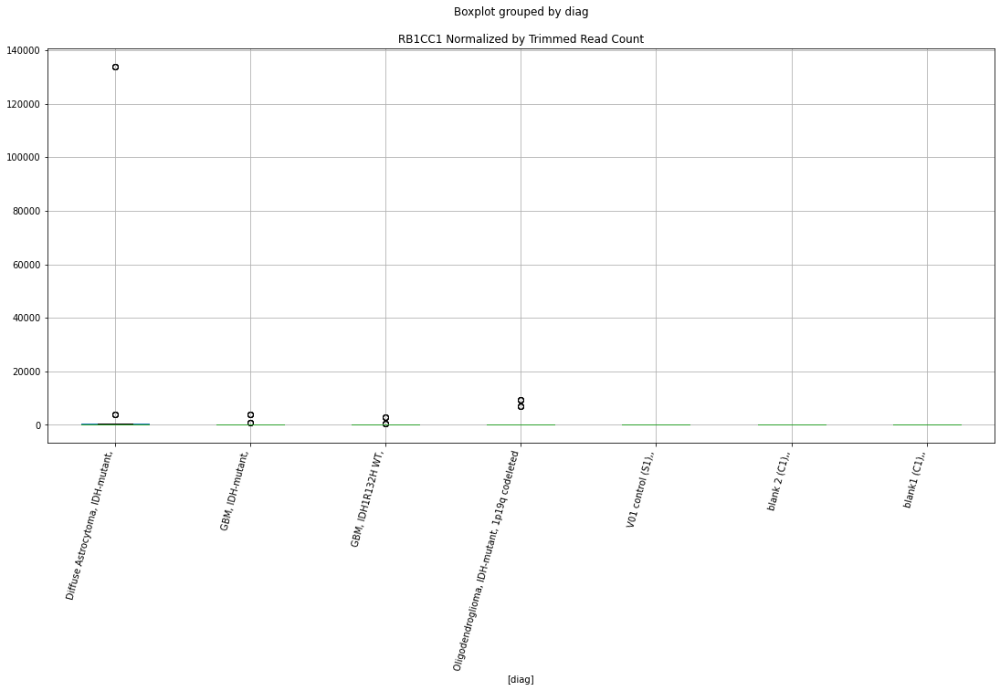

 p : 0.03932342030637862  ( t : 2.09512295656887 ) :  Lexogen  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2AIPNL, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2AIPNL, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2AIPNL, dtype: float64


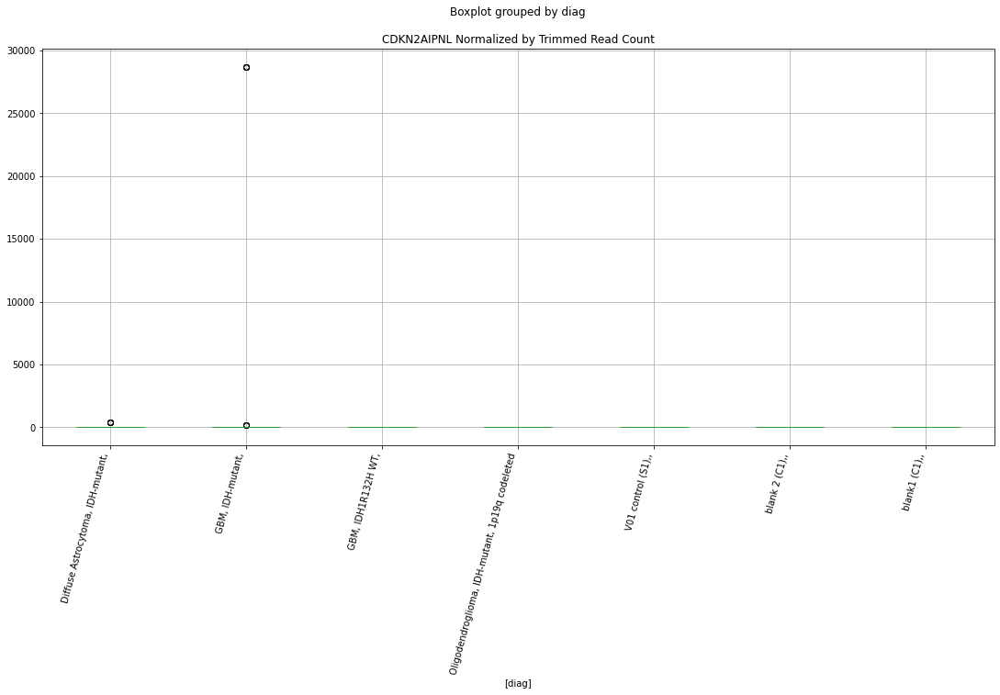

 p : 0.03932508954085858  ( t : 2.0951046978160304 ) :  Lexogen  :  bbduk2  :  CDKN2AIPNL
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2AIPNL, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2AIPNL, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2AIPNL, dtype: float64


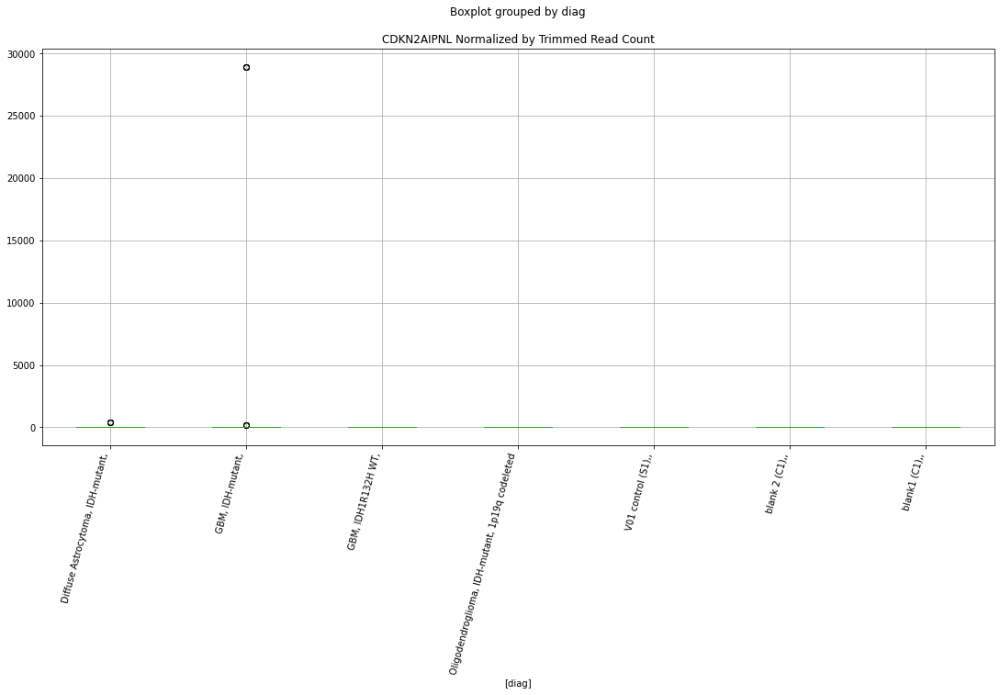

 p : 0.04000266429912795  ( t : 2.08774788165301 ) :  Lexogen  :  cutadapt2  :  RB1CC1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1CC1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1CC1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1CC1, dtype: float64


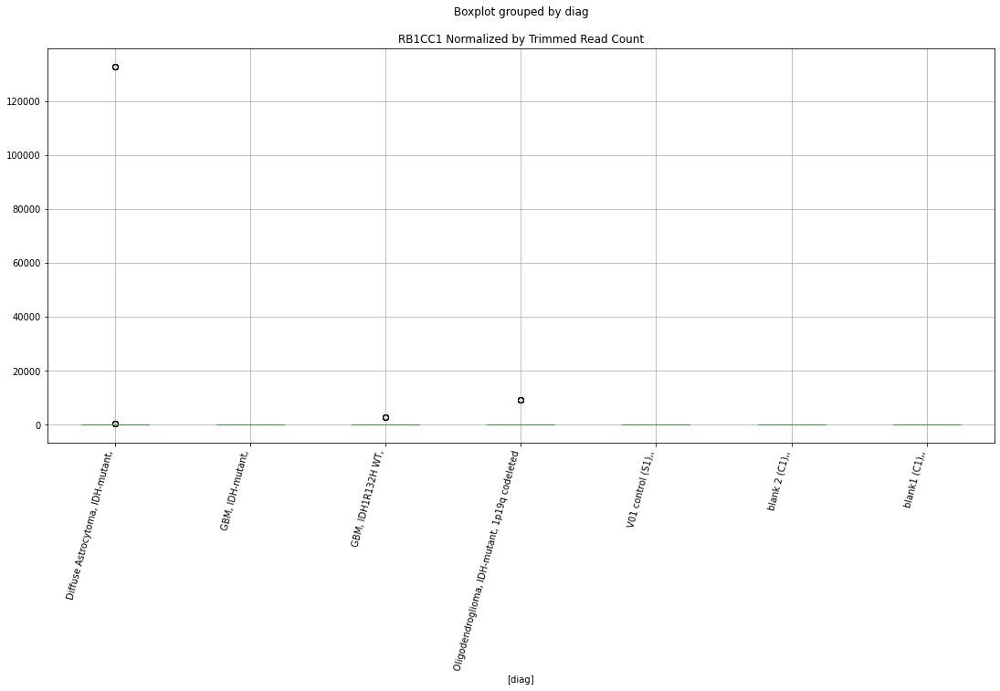

 p : 0.04022706464561181  ( t : 2.0853351775489606 ) :  Lexogen  :  bbduk2  :  RB1CC1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1CC1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1CC1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1CC1, dtype: float64


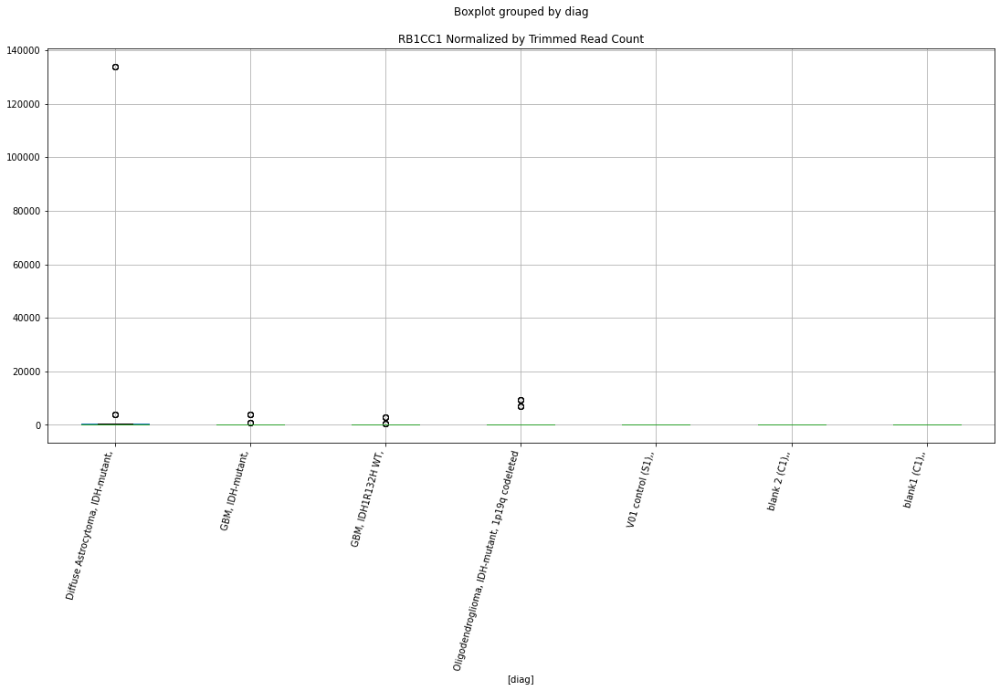

 p : 0.04077419025766816  ( t : 2.079500979640146 ) :  Lexogen  :  bbduk2  :  CDKN2AIPNL
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2AIPNL, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2AIPNL, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2AIPNL, dtype: float64


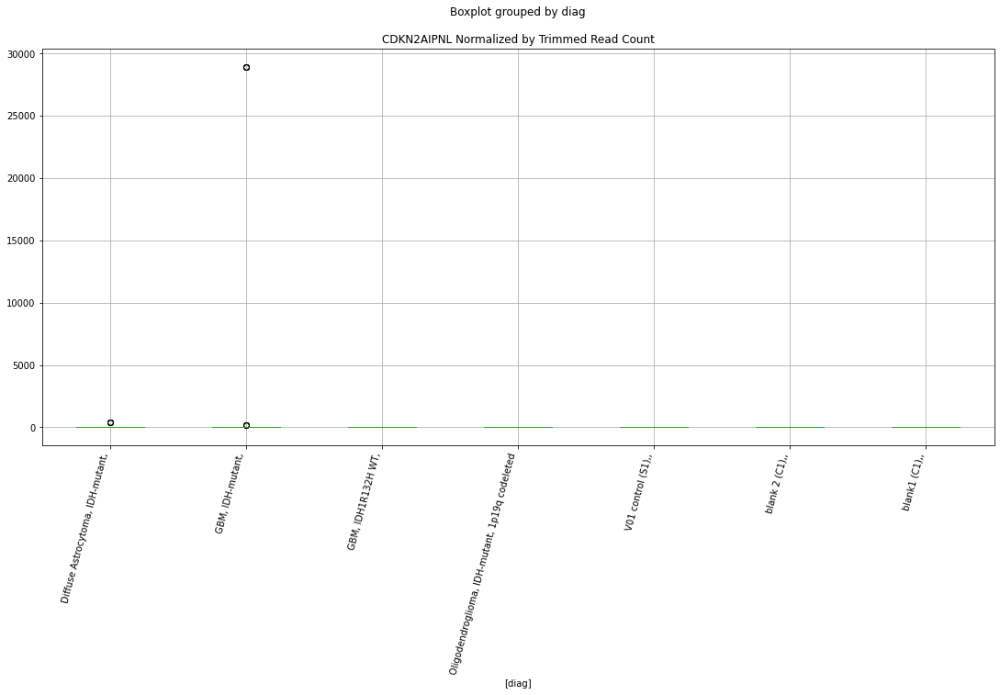

 p : 0.04077419025766816  ( t : 2.079500979640146 ) :  Lexogen  :  cutadapt2  :  NF1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: NF1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: NF1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: NF1, dtype: float64


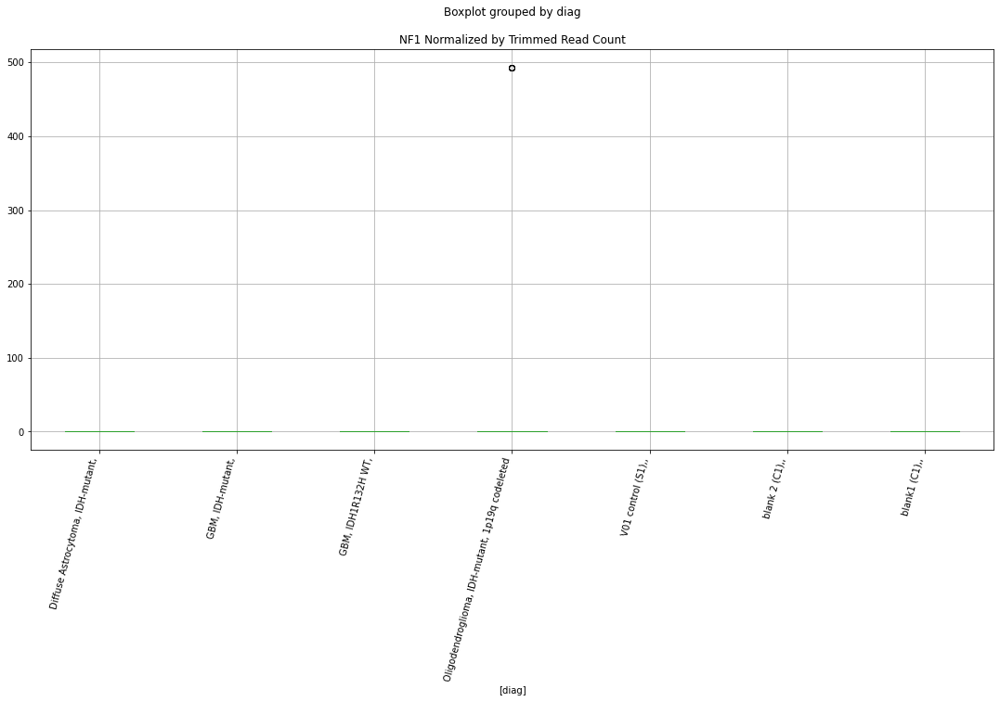

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  RB1-DT
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1-DT, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1-DT, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1-DT, dtype: float64


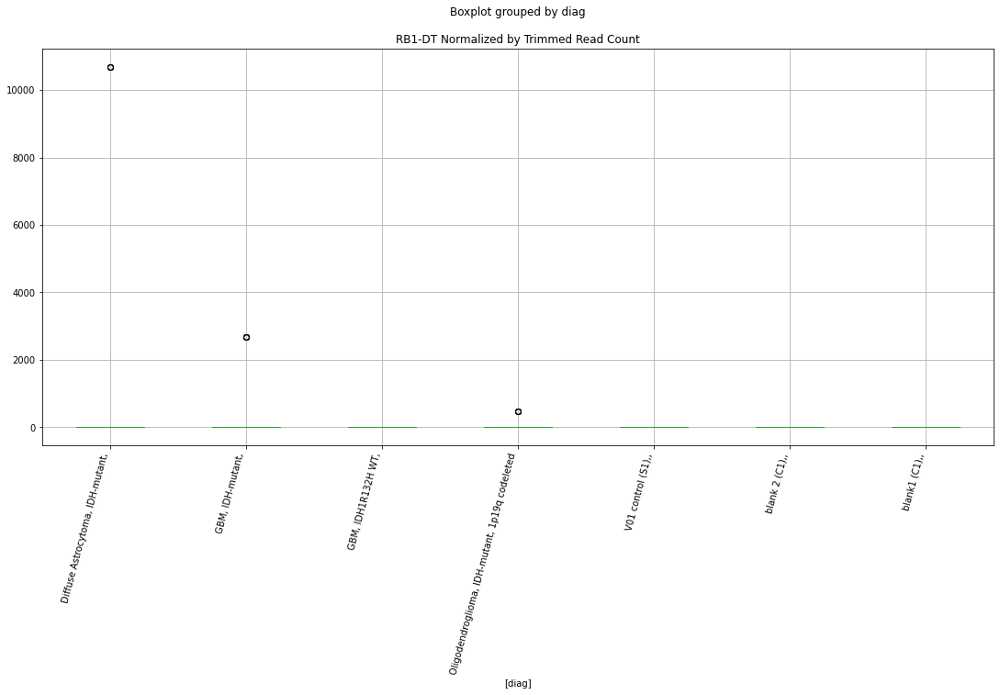

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  RB1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1, dtype: float64


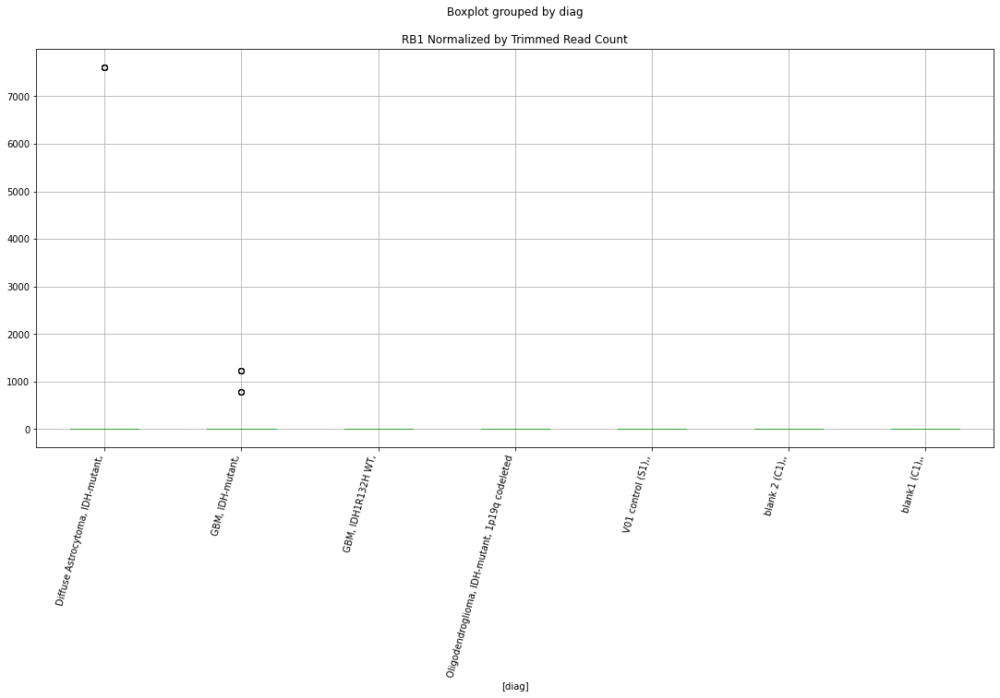

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  IDH2-DT
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH2-DT, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH2-DT, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH2-DT, dtype: float64


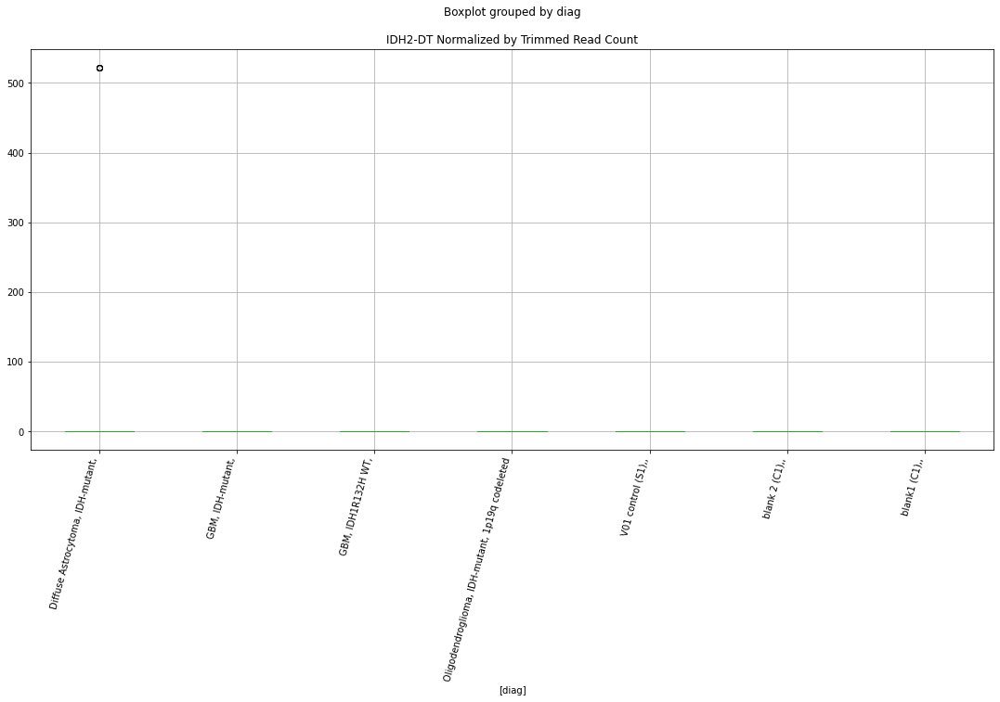

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  RB1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1, dtype: float64


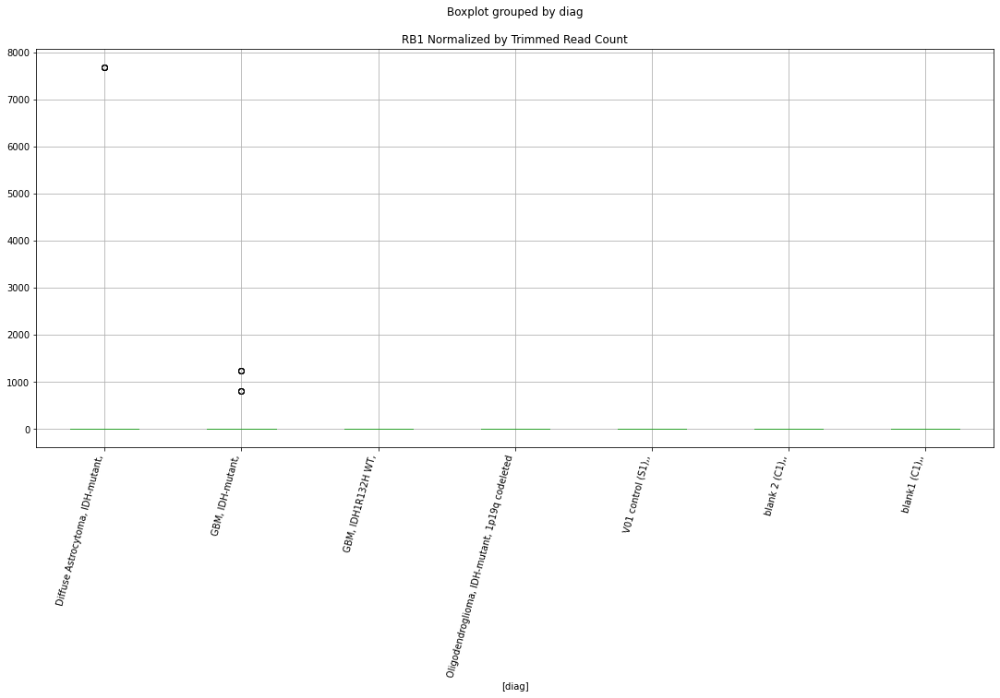

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  RB1CC1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1CC1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1CC1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1CC1, dtype: float64


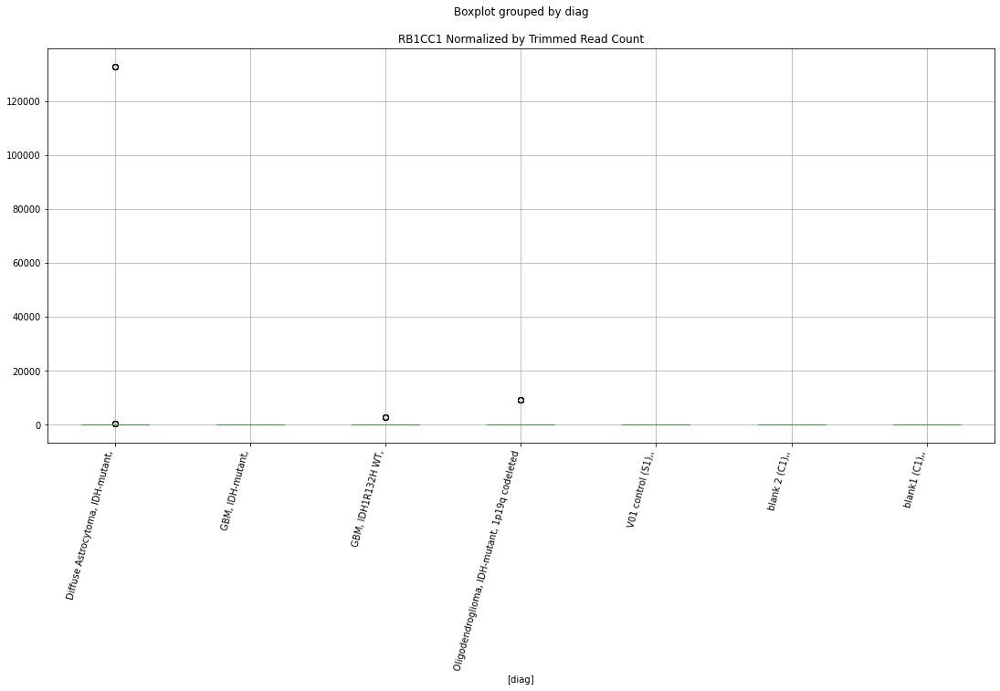

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  RB1-DT
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1-DT, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1-DT, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1-DT, dtype: float64


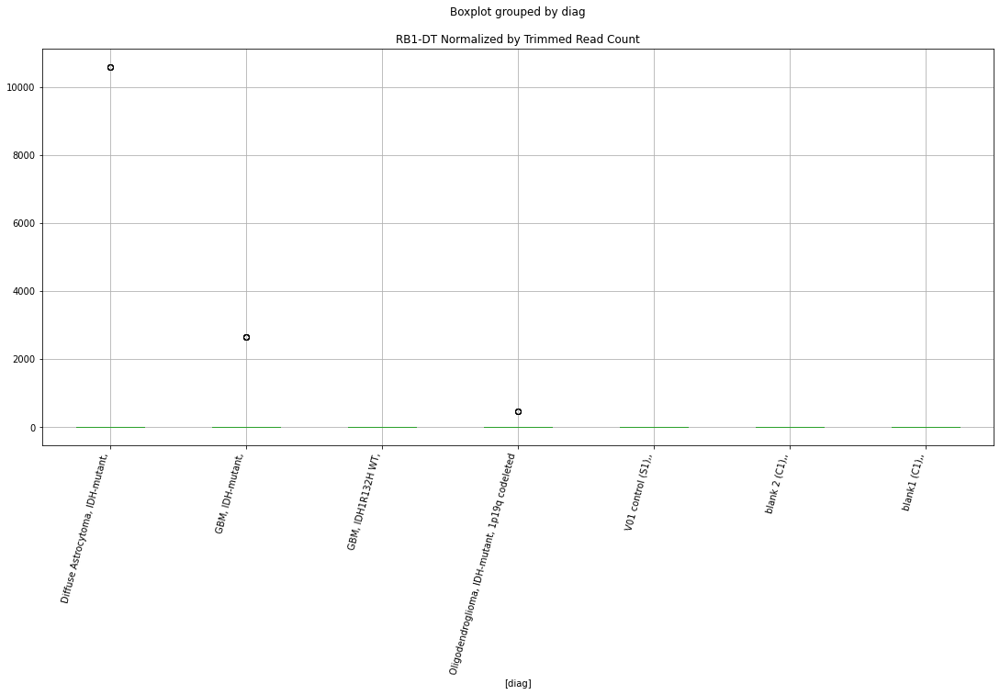

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  IDH2
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH2, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH2, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH2, dtype: float64


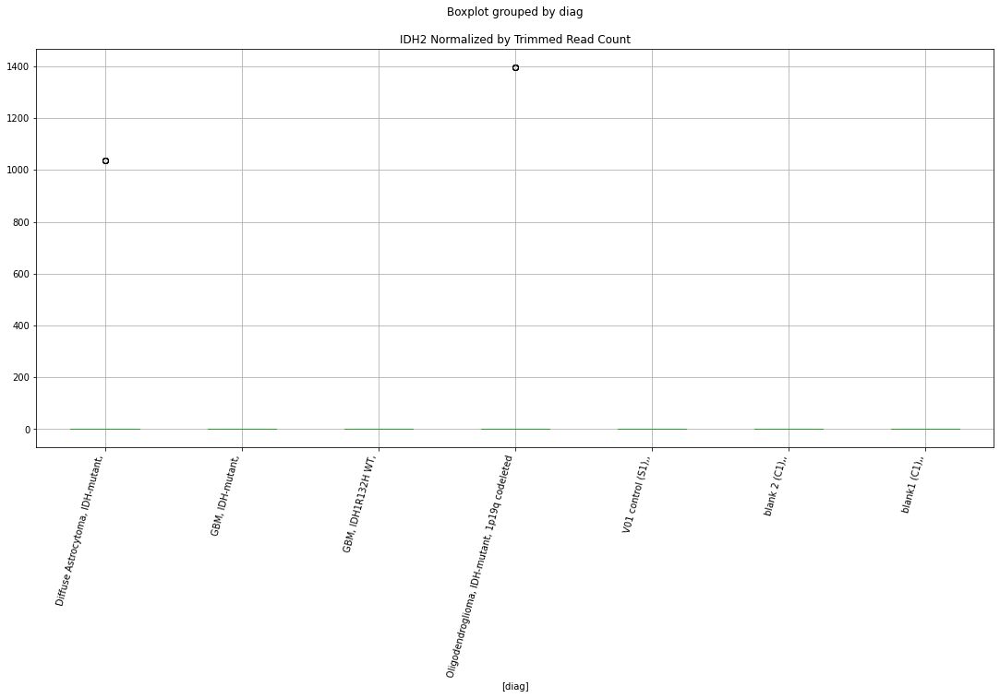

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  IDH1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH1, dtype: float64


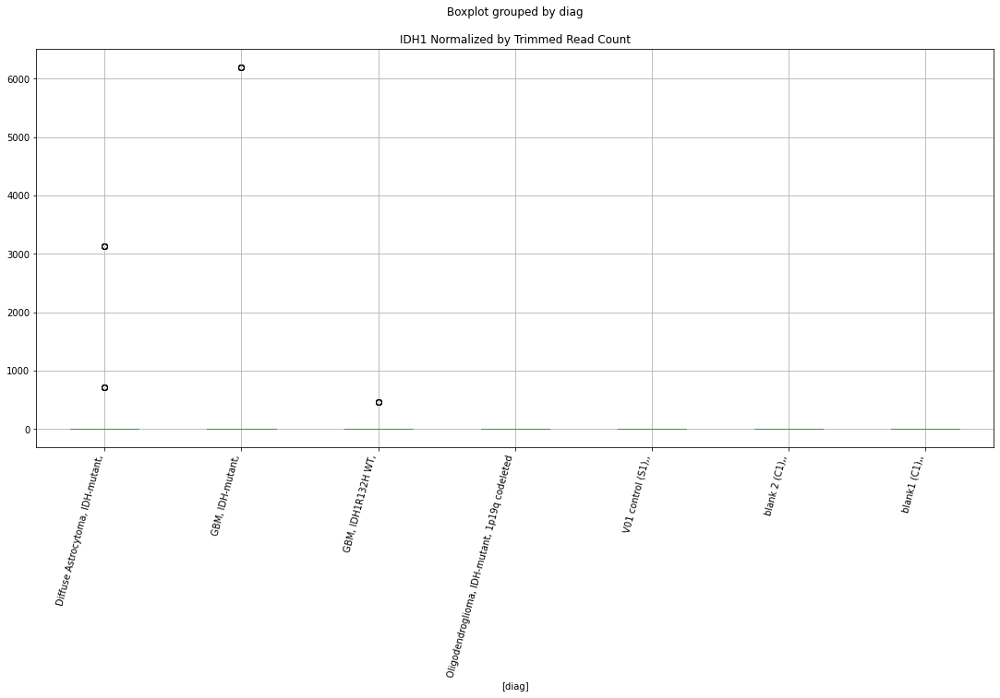

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  IDH1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH1, dtype: float64


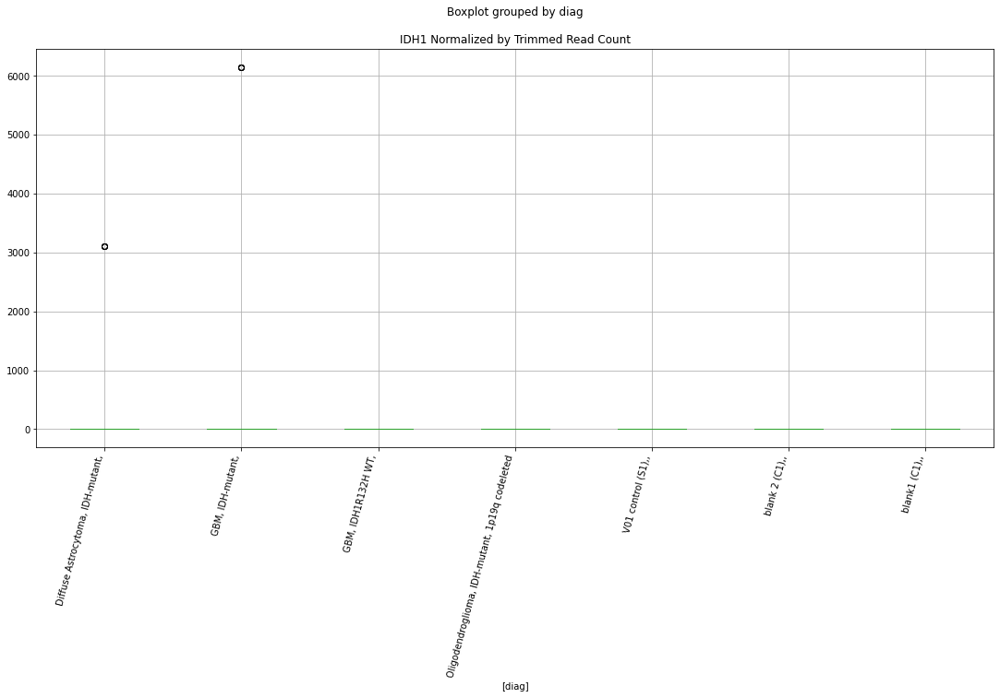

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  IDH2
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH2, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH2, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH2, dtype: float64


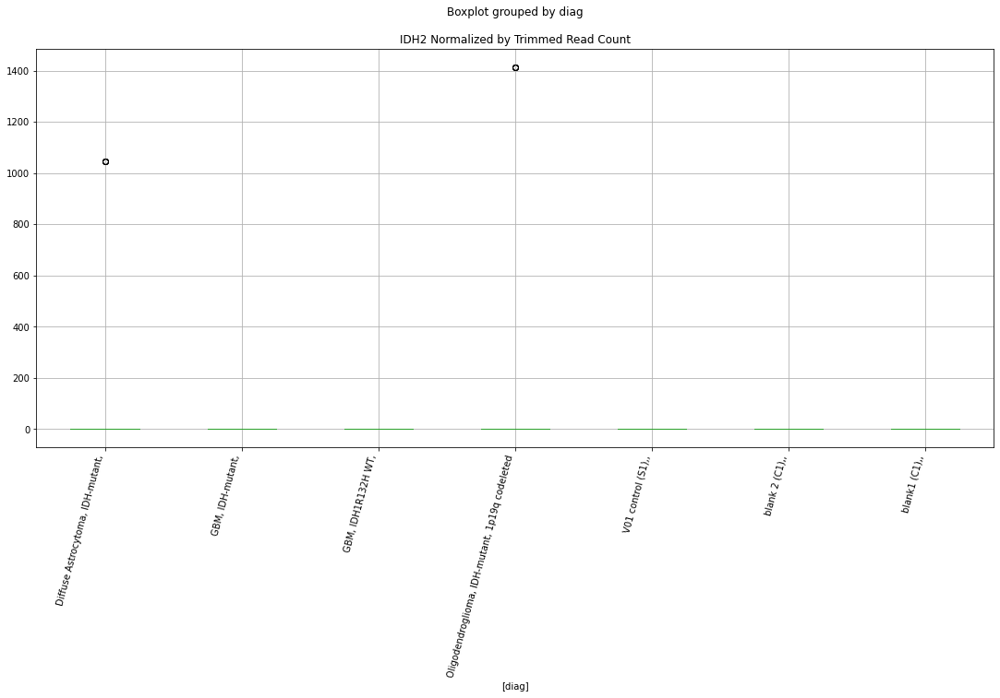

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  EGFR-AS1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: EGFR-AS1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: EGFR-AS1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: EGFR-AS1, dtype: float64


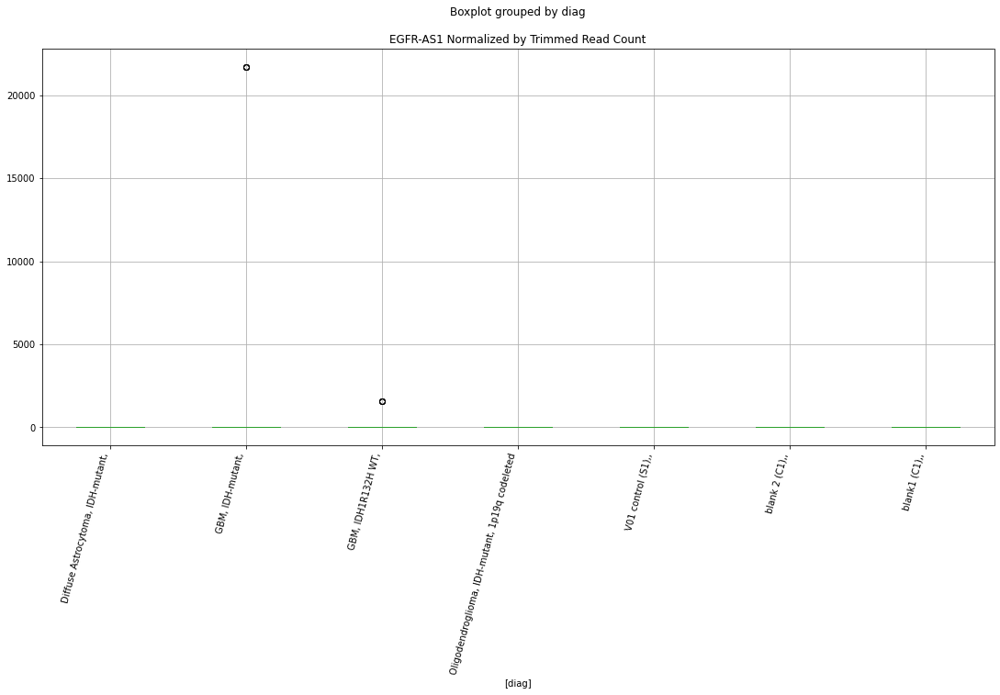

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  EGFR-AS1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: EGFR-AS1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: EGFR-AS1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: EGFR-AS1, dtype: float64


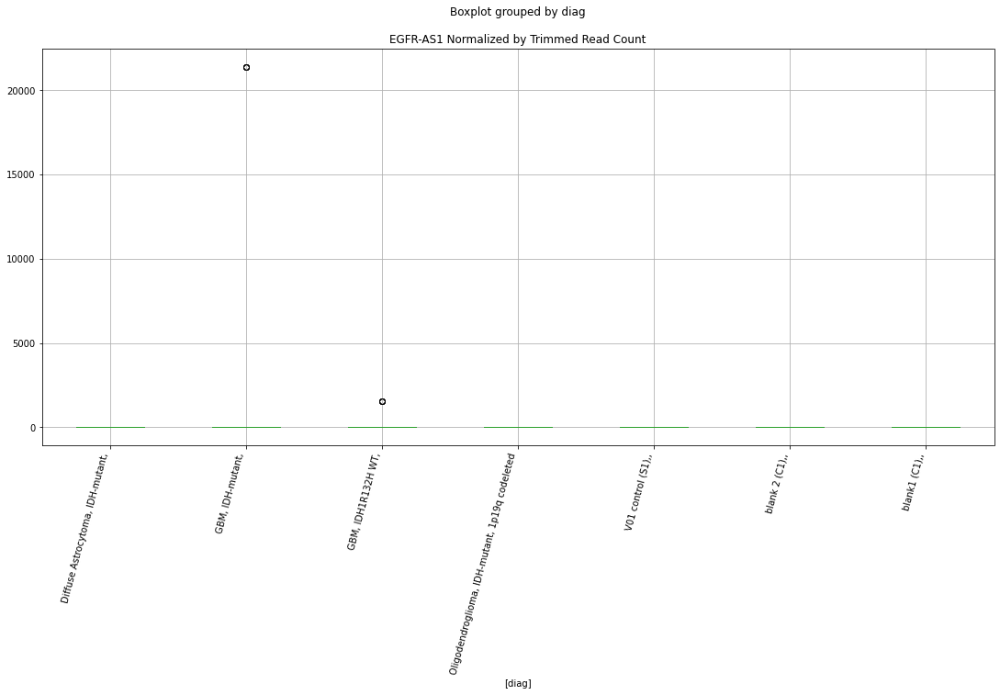

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  CDKN2B-AS1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2B-AS1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2B-AS1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2B-AS1, dtype: float64


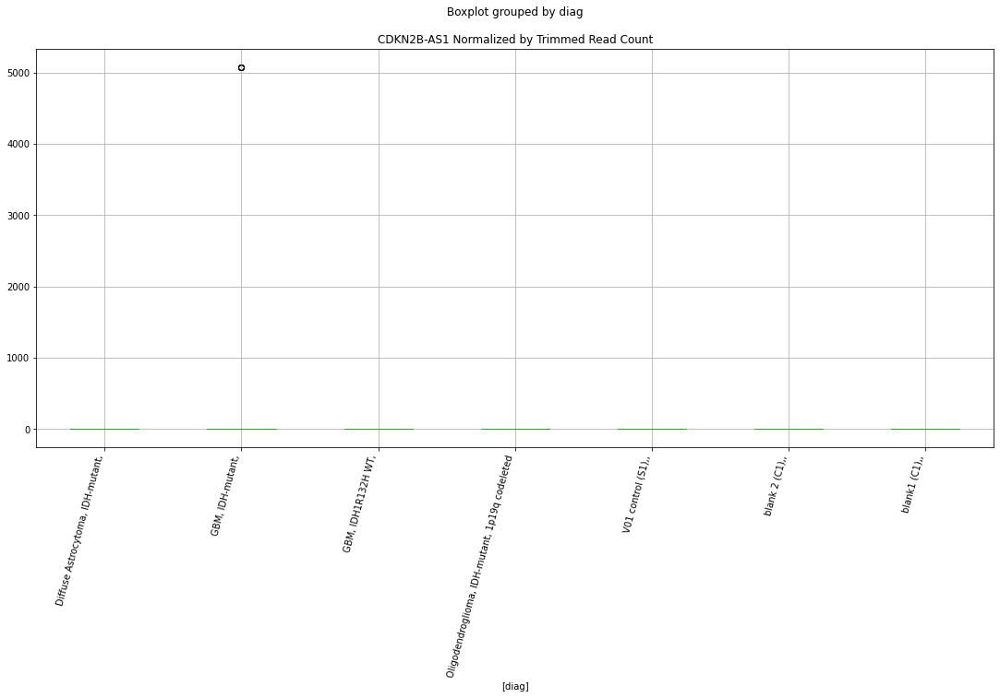

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  IDH1-AS1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH1-AS1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH1-AS1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH1-AS1, dtype: float64


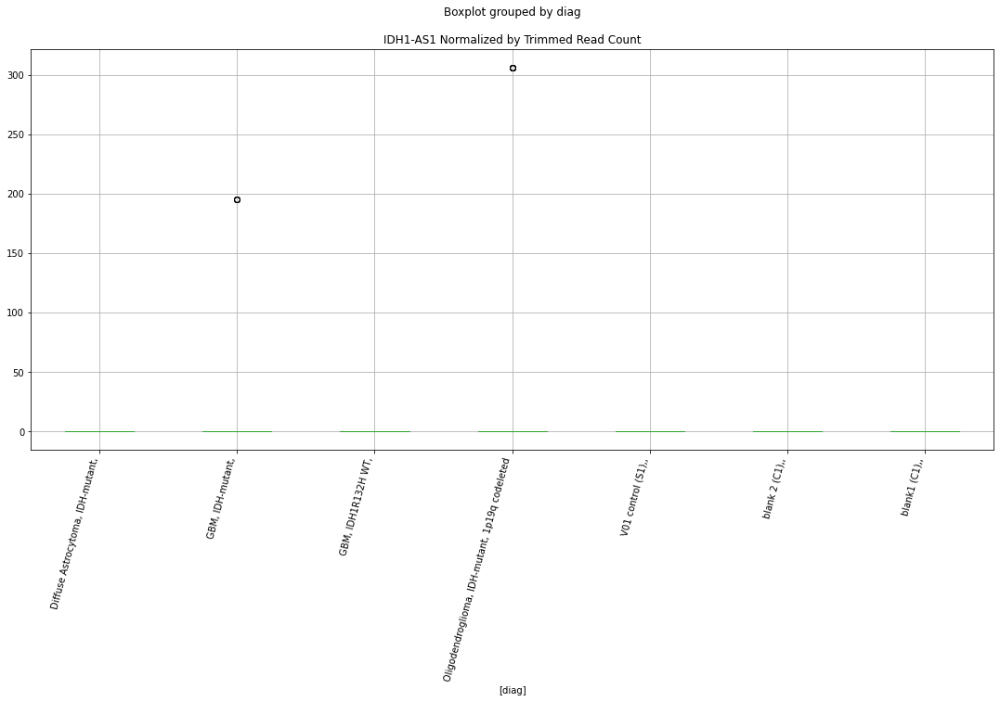

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  IDH1-AS1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH1-AS1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH1-AS1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH1-AS1, dtype: float64


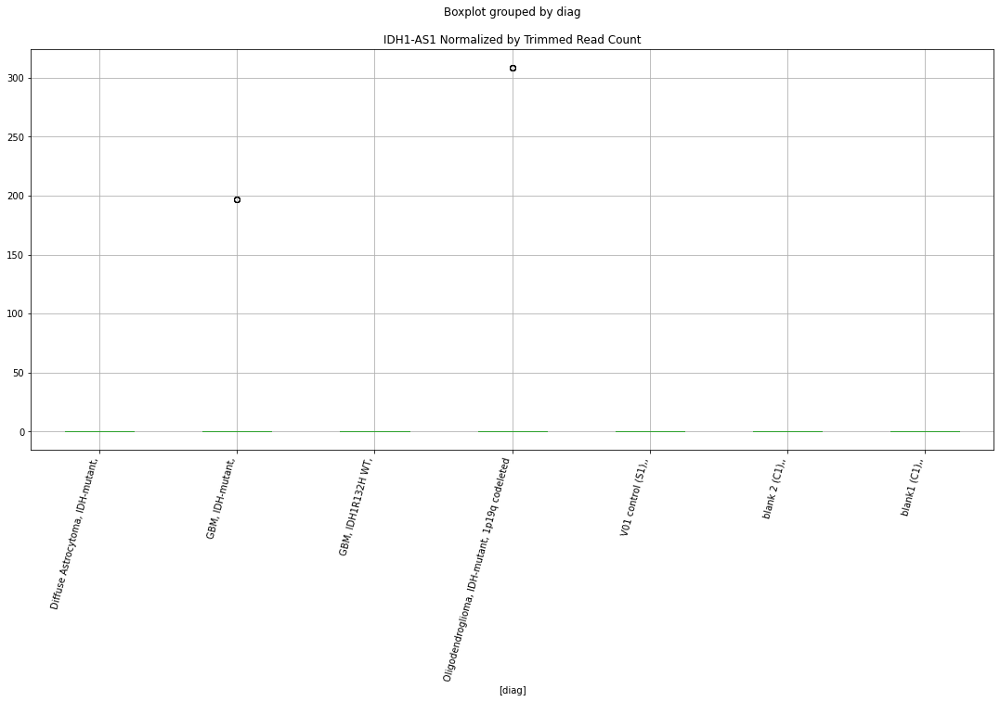

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2AIPNL, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2AIPNL, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2AIPNL, dtype: float64


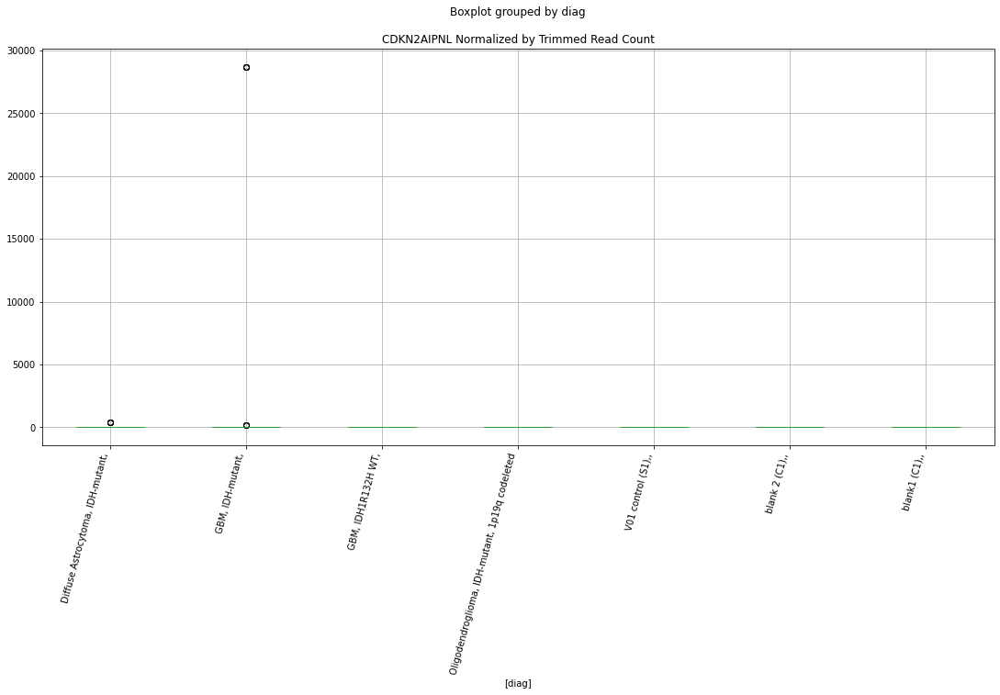

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  bbduk2  :  CDKN2A-DT
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2A-DT, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2A-DT, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2A-DT, dtype: float64


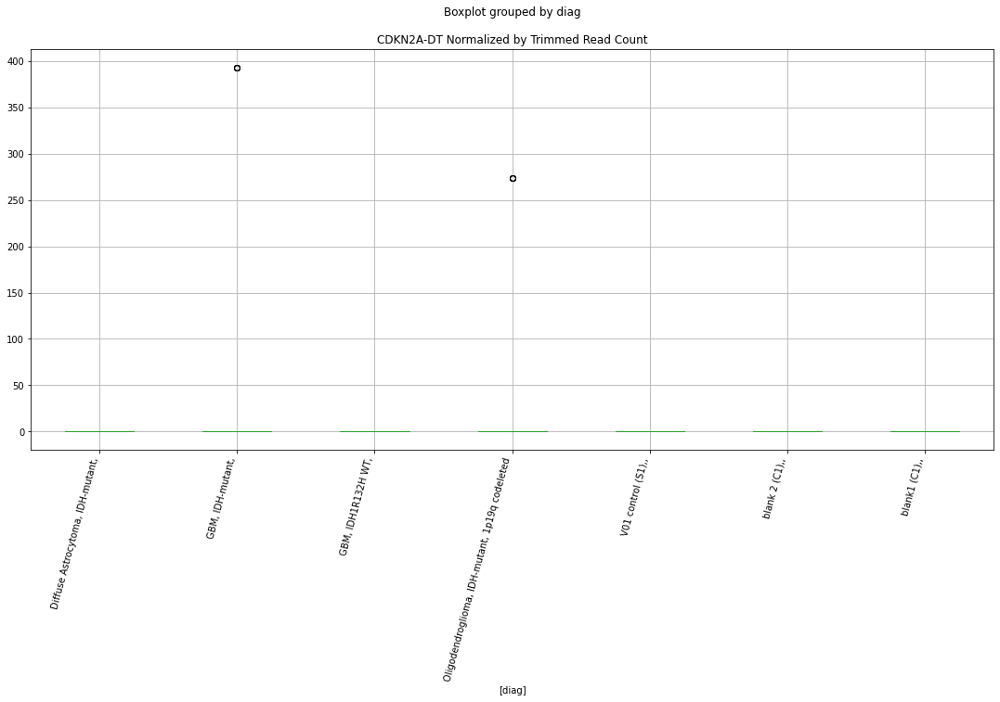

 p : 0.04077419025766818  ( t : 2.0795009796401454 ) :  Lexogen  :  cutadapt2  :  CDKN2A-DT
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2A-DT, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2A-DT, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2A-DT, dtype: float64


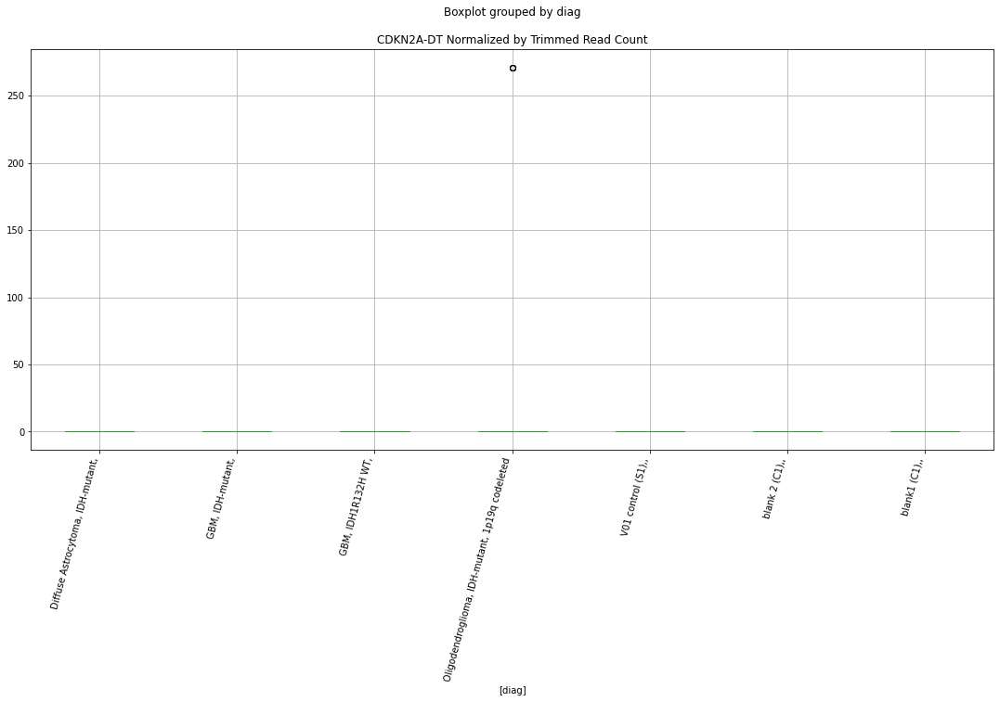

 p : 0.04077419025766822  ( t : 2.079500979640145 ) :  Lexogen  :  cutadapt2  :  IDH2
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH2, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH2, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH2, dtype: float64


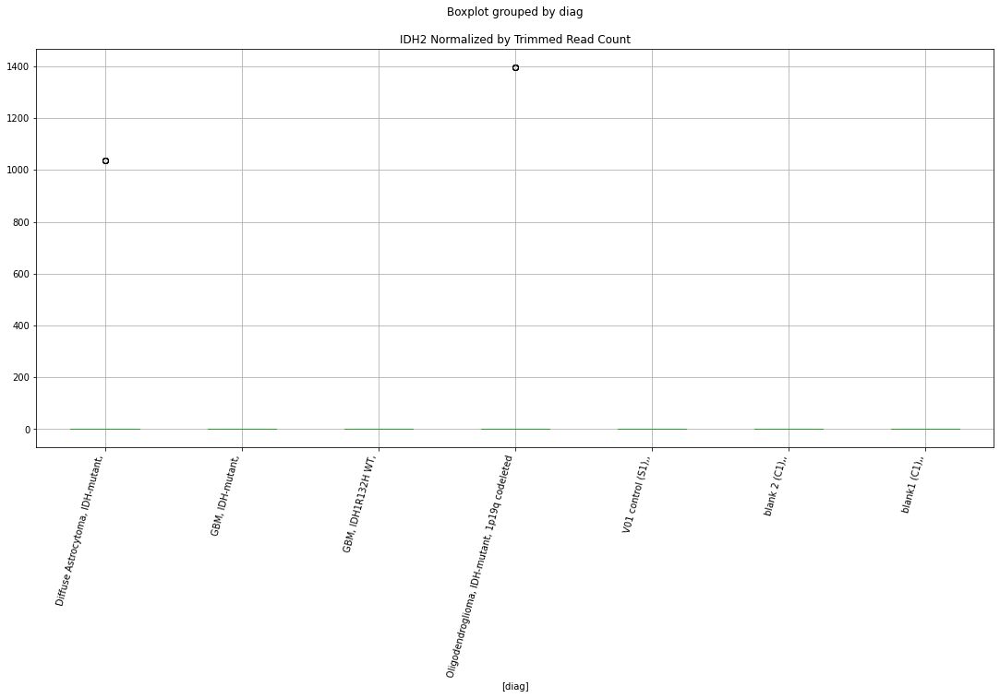

 p : 0.04077419025766822  ( t : 2.079500979640145 ) :  Lexogen  :  cutadapt2  :  IDH2-DT
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH2-DT, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH2-DT, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH2-DT, dtype: float64


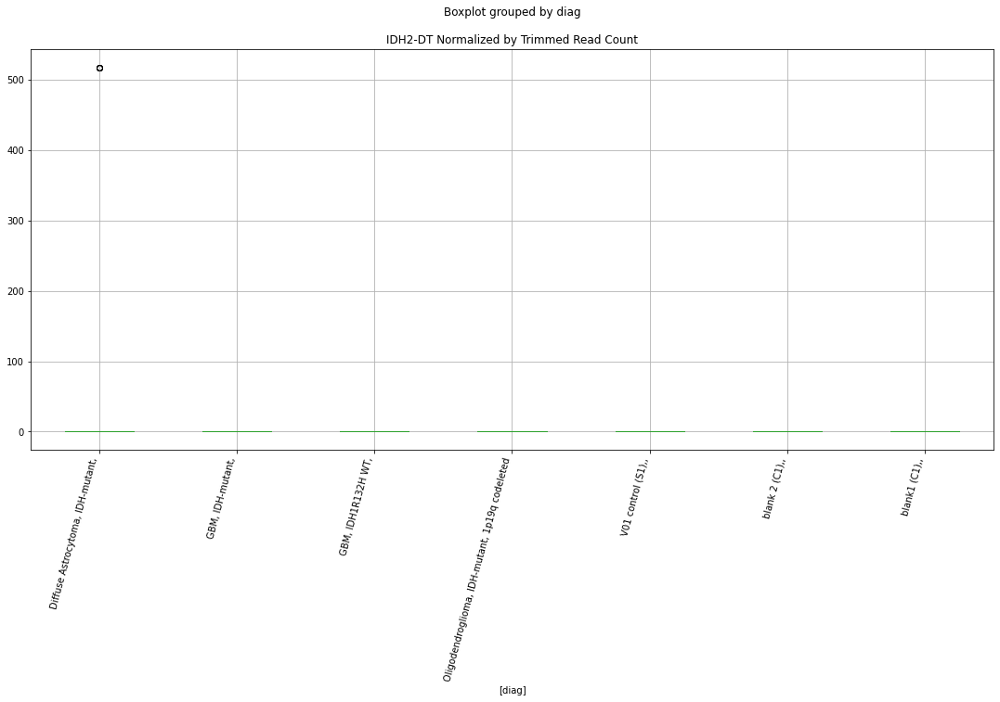

 p : 0.04077419025766822  ( t : 2.079500979640145 ) :  Lexogen  :  bbduk2  :  IDH2
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH2, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH2, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH2, dtype: float64


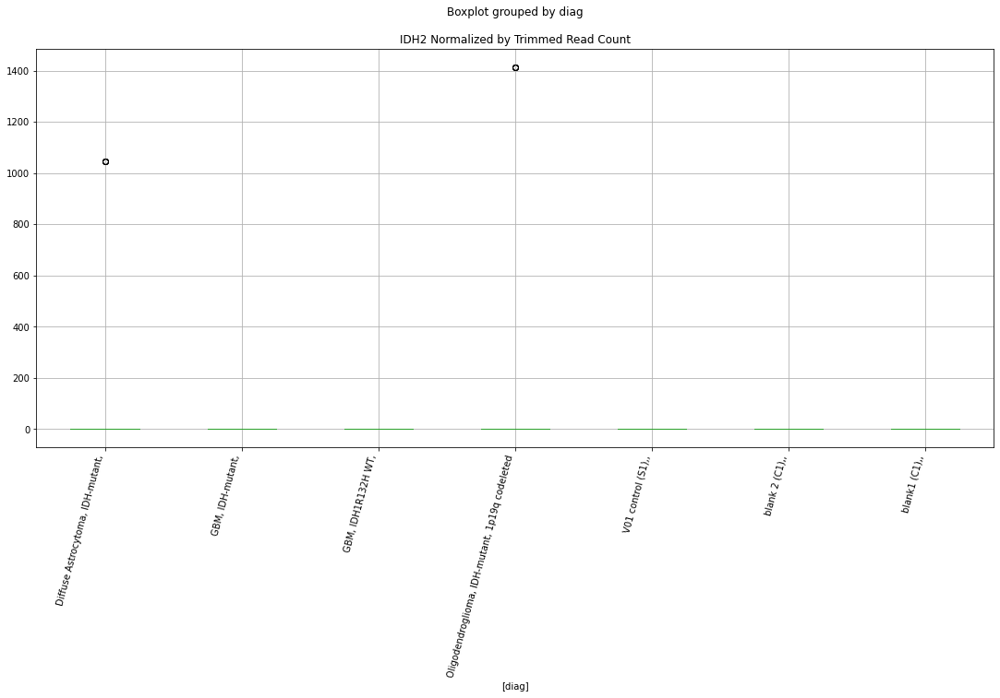

 p : 0.04077419025766822  ( t : 2.079500979640145 ) :  Lexogen  :  cutadapt2  :  IDH1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: IDH1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: IDH1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: IDH1, dtype: float64


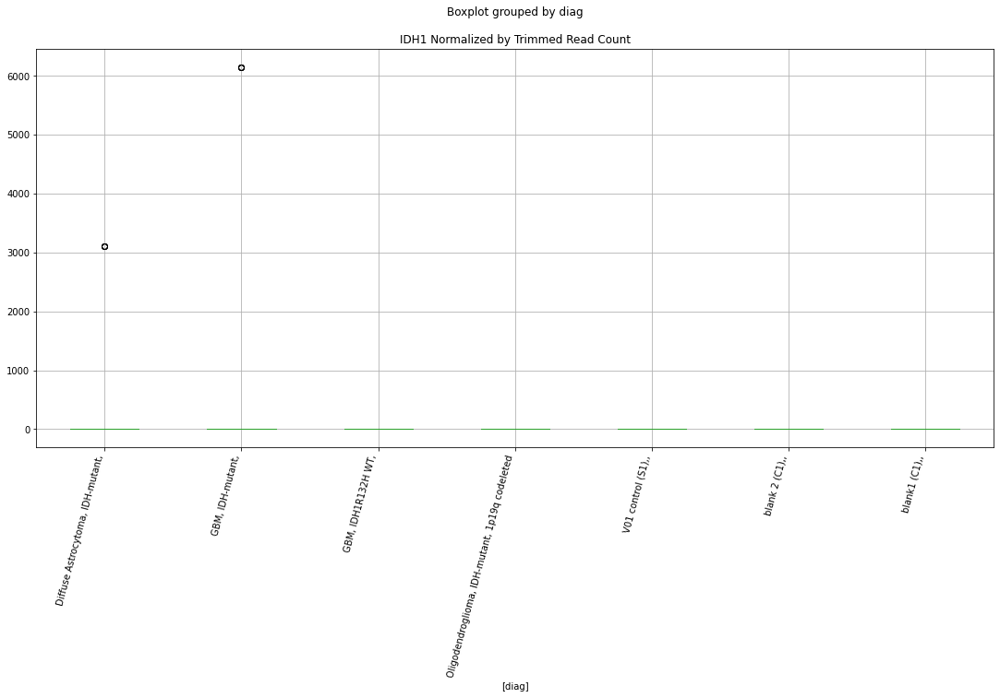

 p : 0.04194176288720988  ( t : 2.061101294949695 ) :  D-plex  :  cutadapt2  :  TERT
Control and blanks
363     3030.46
364     3030.46
365     3030.46
366     3030.46
367     3030.46
1557       0.00
1558       0.00
1559       0.00
1560       0.00
1561       0.00
Name: TERT, dtype: float64
957    2821.76
958    2821.76
959    2821.76
960    2821.76
961    2821.76
Name: TERT, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: TERT, dtype: float64


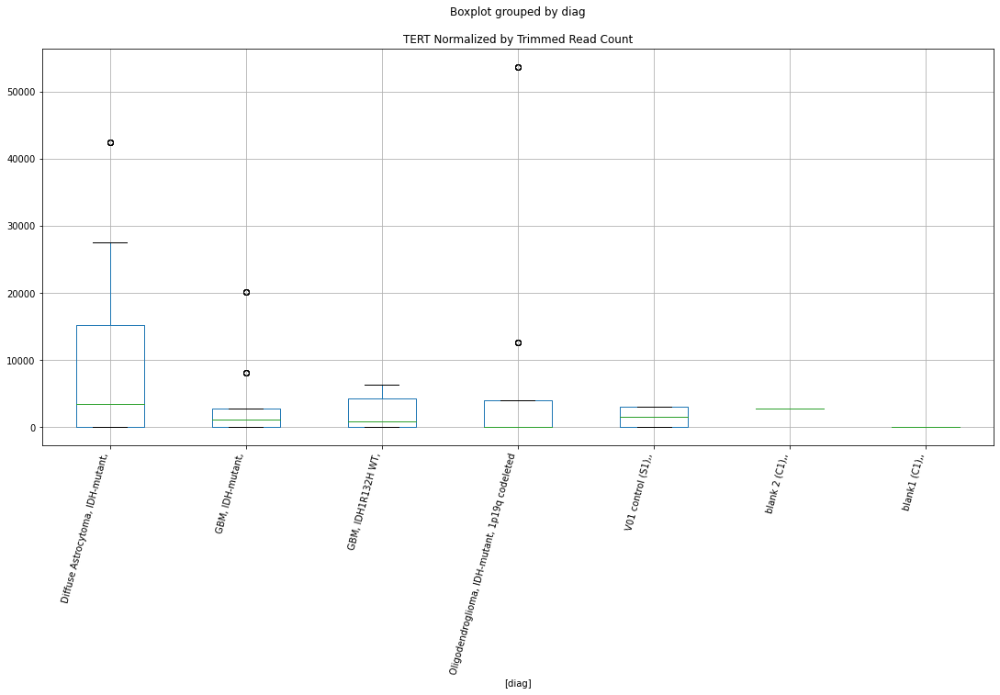

 p : 0.042236305621044704  ( t : 2.06423510672177 ) :  Lexogen  :  cutadapt2  :  CDKN2AIPNL
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2AIPNL, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2AIPNL, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2AIPNL, dtype: float64


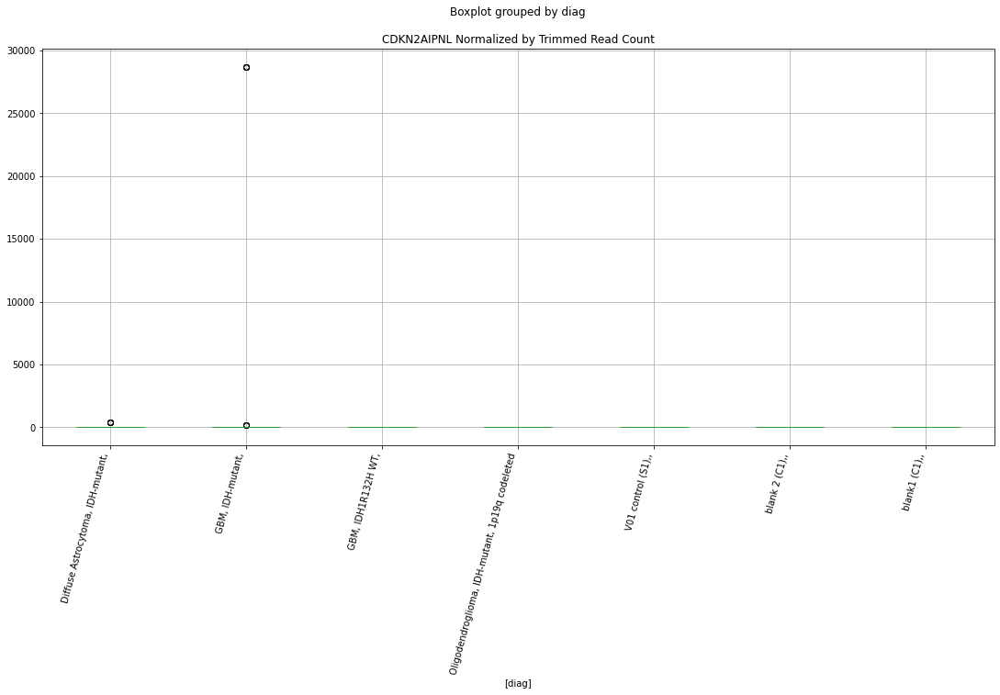

 p : 0.04224579567046177  ( t : 2.064137520032271 ) :  Lexogen  :  bbduk2  :  CDKN2AIPNL
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2AIPNL, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2AIPNL, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2AIPNL, dtype: float64


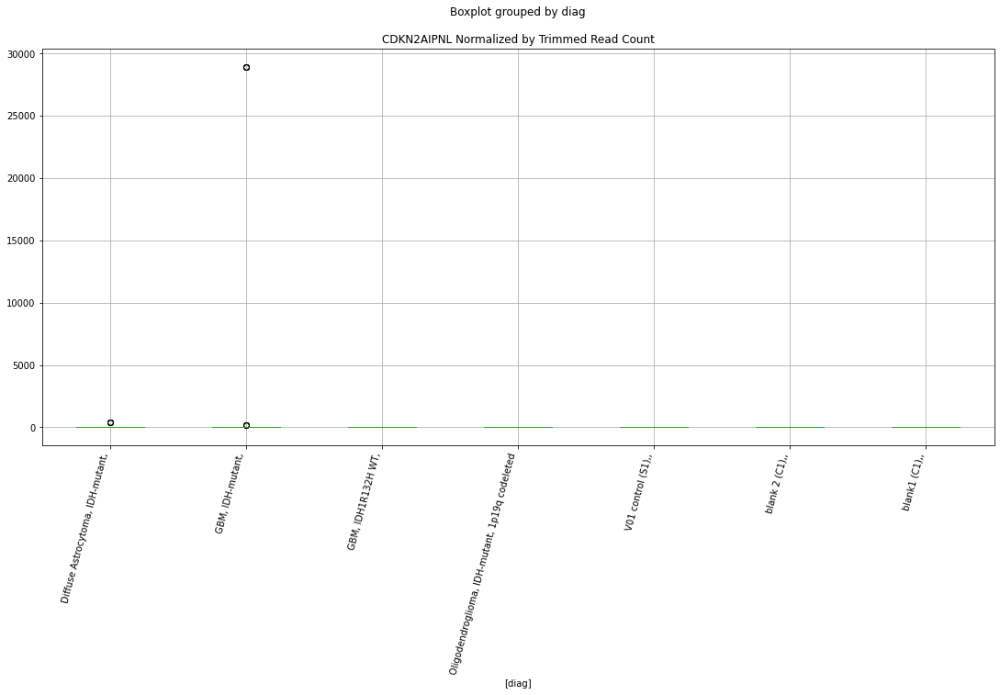

 p : 0.0446454510874713  ( t : 2.040047100610089 ) :  Lexogen  :  cutadapt2  :  RB1CC1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1CC1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1CC1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1CC1, dtype: float64


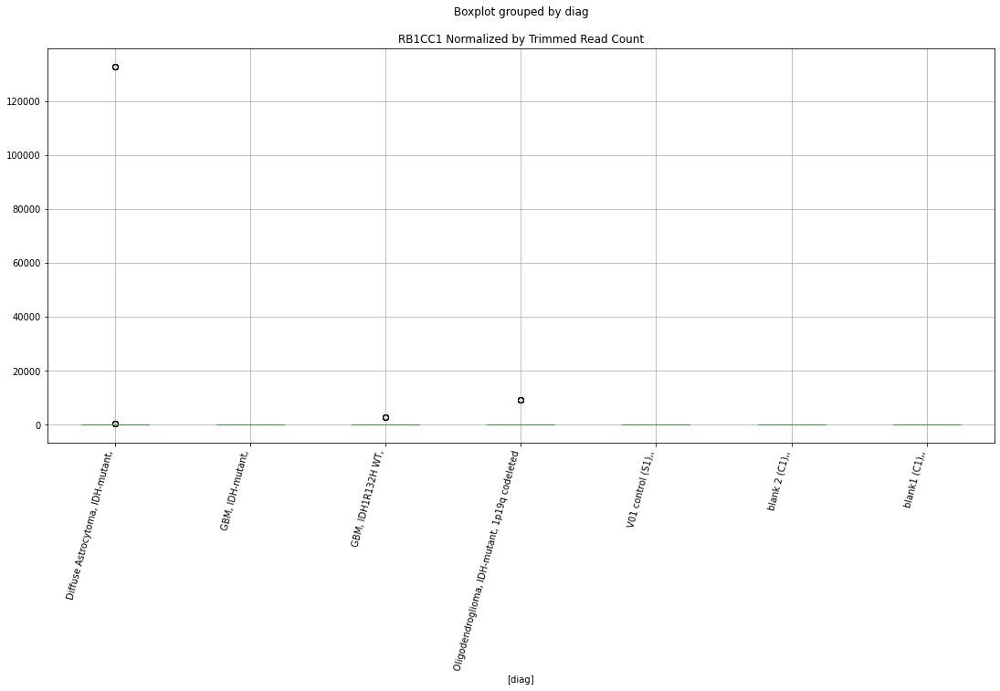

 p : 0.044898319964382864  ( t : 2.037573839594645 ) :  Lexogen  :  cutadapt2  :  EGFR
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: EGFR, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: EGFR, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: EGFR, dtype: float64


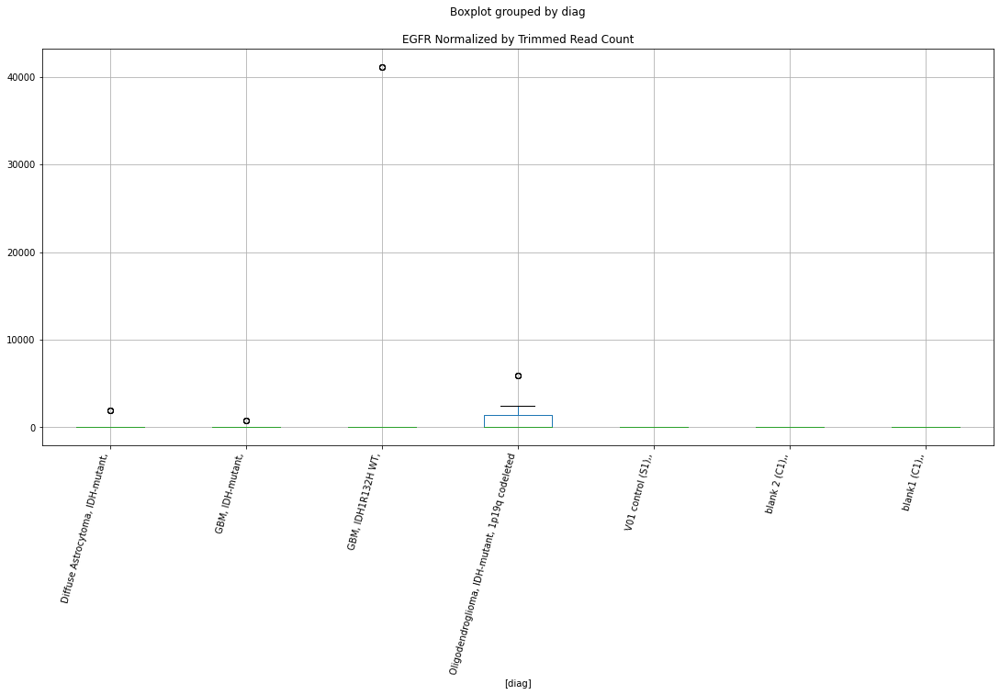

 p : 0.0451899445219454  ( t : 2.028811838820157 ) :  D-plex  :  bbduk2  :  CDKN2B
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B, dtype: float64
942    358.18
943    358.18
944    358.18
945    358.18
946    358.18
Name: CDKN2B, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2B, dtype: float64


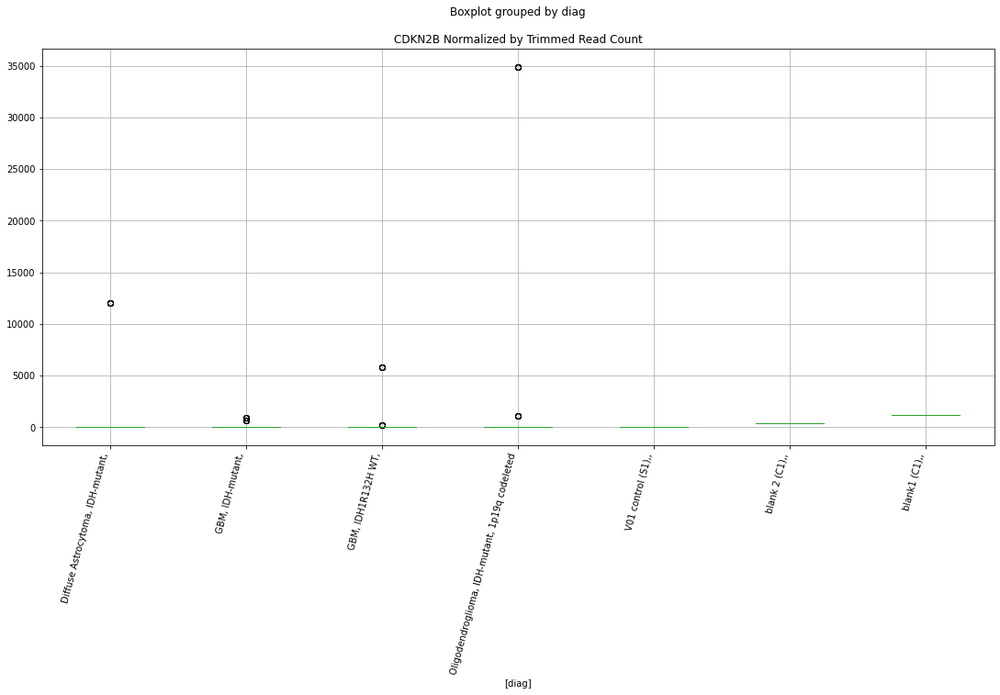

 p : 0.04667426583360179  ( t : 2.0205329681941815 ) :  Lexogen  :  bbduk2  :  CDKN2AIP
Control and blanks
377       0.00
378       0.00
379       0.00
380       0.00
1571    424.63
1572    424.63
1573    424.63
1574    424.63
Name: CDKN2AIP, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2AIP, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2AIP, dtype: float64


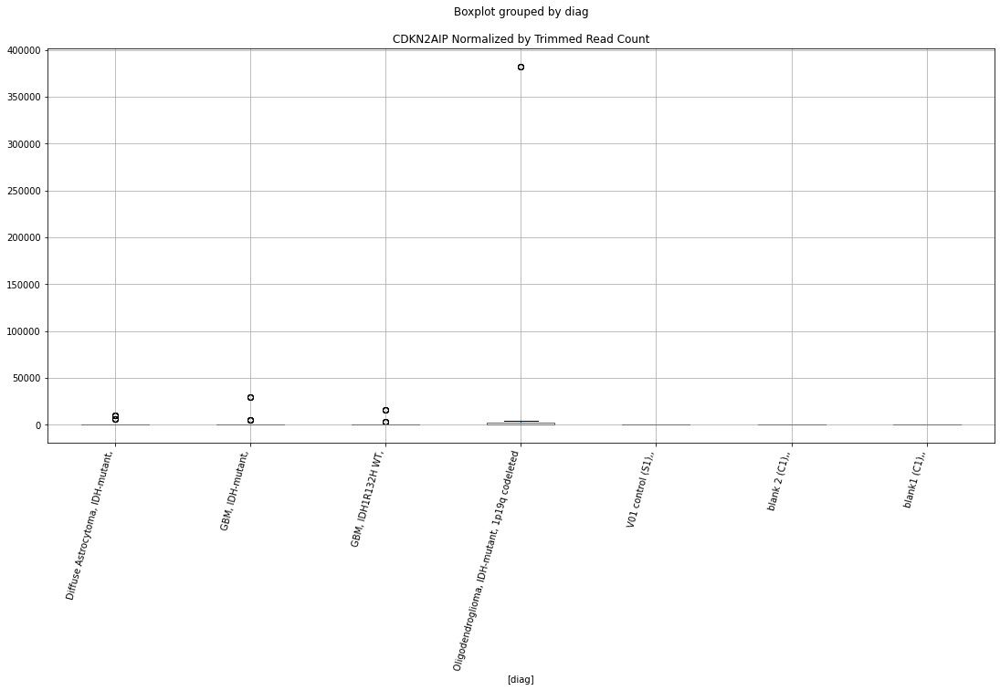

 p : 0.046689169974245555  ( t : 2.0203923282358445 ) :  Lexogen  :  cutadapt2  :  CDKN2AIP
Control and blanks
389       0.00
390       0.00
391       0.00
392       0.00
1583    420.87
1584    420.87
1585    420.87
1586    420.87
Name: CDKN2AIP, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2AIP, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2AIP, dtype: float64


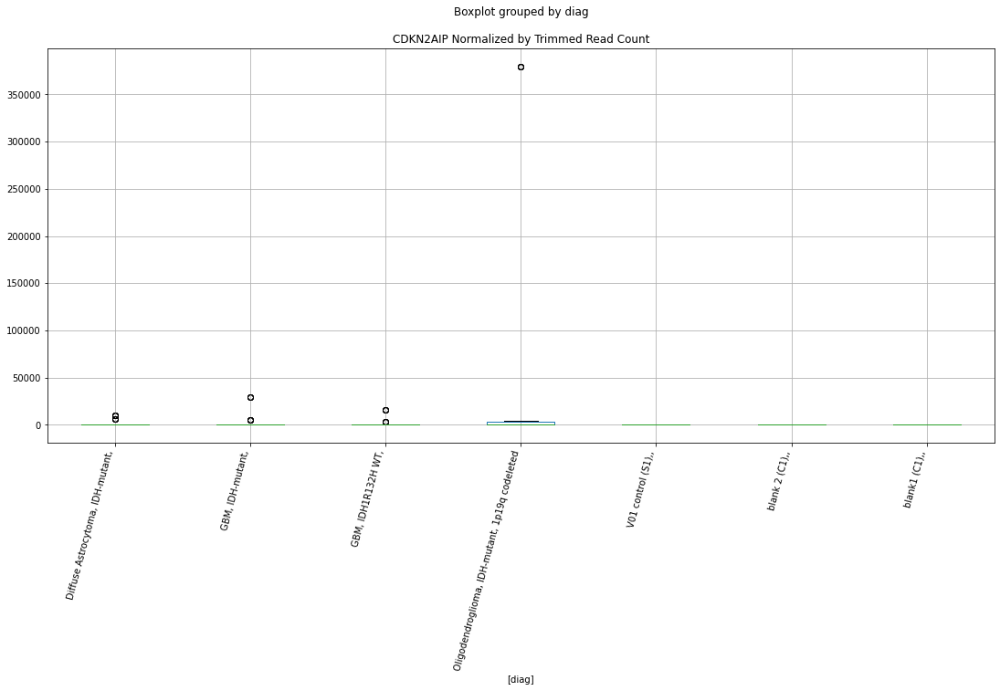

 p : 0.047223831985420225  ( t : 2.0153723723776884 ) :  Lexogen  :  cutadapt2  :  CDKN2AIP
Control and blanks
389       0.00
390       0.00
391       0.00
392       0.00
1583    420.87
1584    420.87
1585    420.87
1586    420.87
Name: CDKN2AIP, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2AIP, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2AIP, dtype: float64


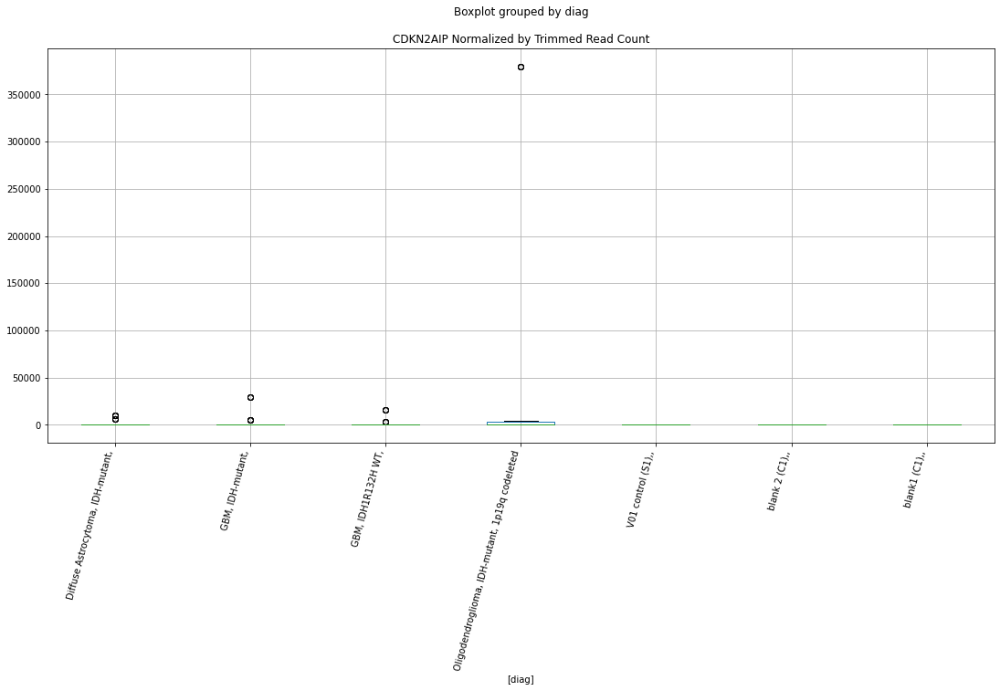

 p : 0.047326976374994736  ( t : 2.0086361640150883 ) :  D-plex  :  cutadapt2  :  NF1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: NF1, dtype: float64
957    7583.49
958    7583.49
959    7583.49
960    7583.49
961    7583.49
Name: NF1, dtype: float64
2151    8091.38
2152    8091.38
2153    8091.38
2154    8091.38
2155    8091.38
Name: NF1, dtype: float64


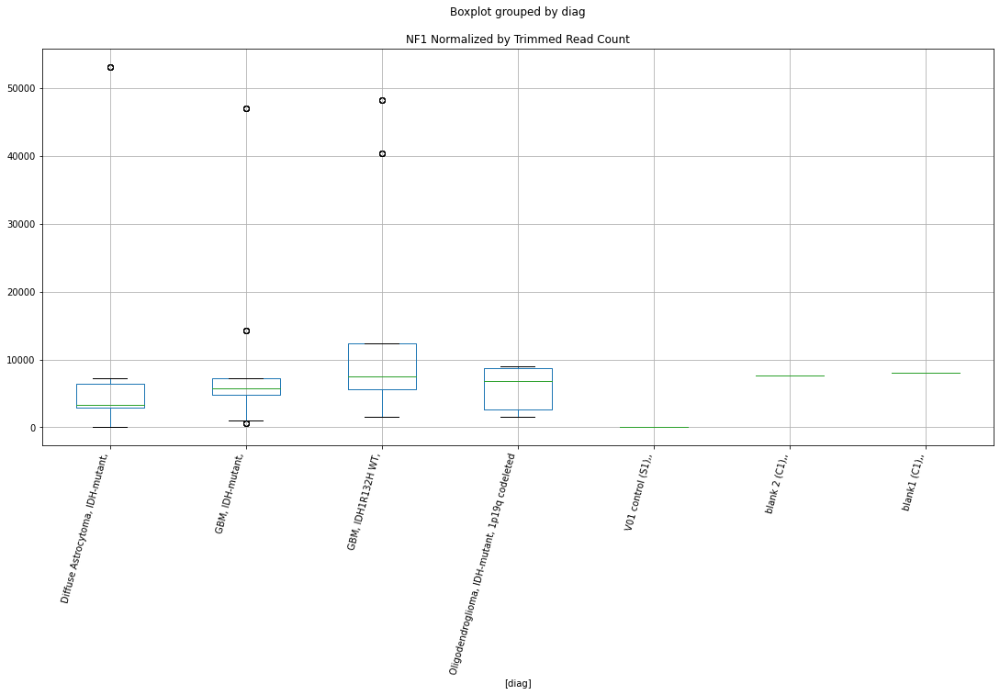

 p : 0.04756433769374107  ( t : 2.0122006826698473 ) :  Lexogen  :  bbduk2  :  CDKN2AIP
Control and blanks
377       0.00
378       0.00
379       0.00
380       0.00
1571    424.63
1572    424.63
1573    424.63
1574    424.63
Name: CDKN2AIP, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2AIP, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2AIP, dtype: float64


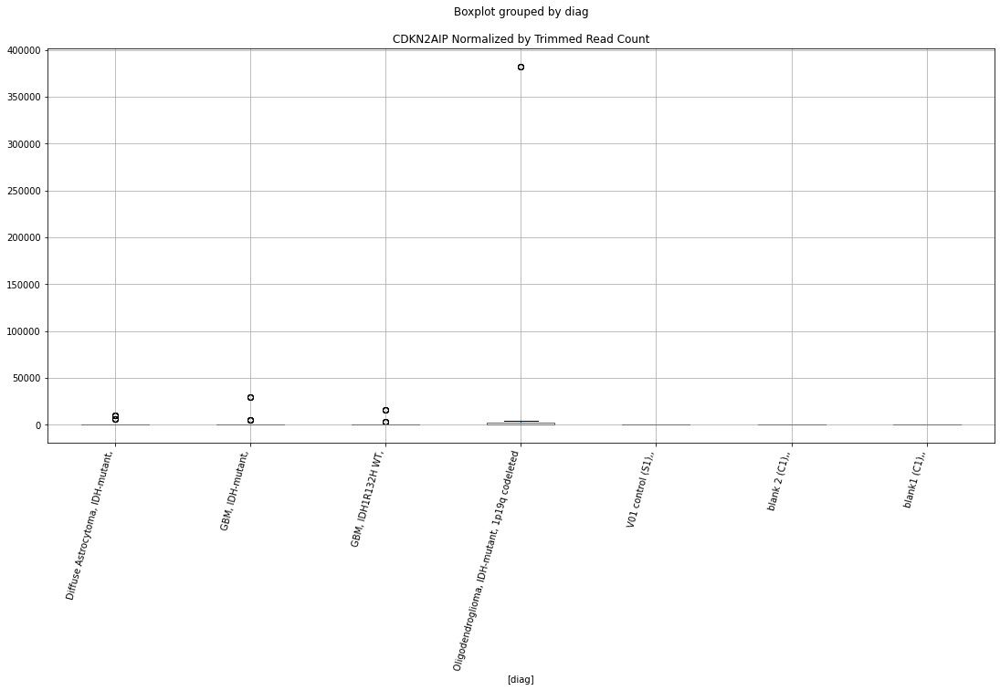

 p : 0.04854353767713082  ( t : 1.9974957927849646 ) :  D-plex  :  cutadapt2  :  CDKN2AIP
Control and blanks
363        0.00
364        0.00
365        0.00
366        0.00
367        0.00
1557    1761.46
1558    1761.46
1559    1761.46
1560    1761.46
1561    1761.46
Name: CDKN2AIP, dtype: float64
957    705.44
958    705.44
959    705.44
960    705.44
961    705.44
Name: CDKN2AIP, dtype: float64
2151    2311.82
2152    2311.82
2153    2311.82
2154    2311.82
2155    2311.82
Name: CDKN2AIP, dtype: float64


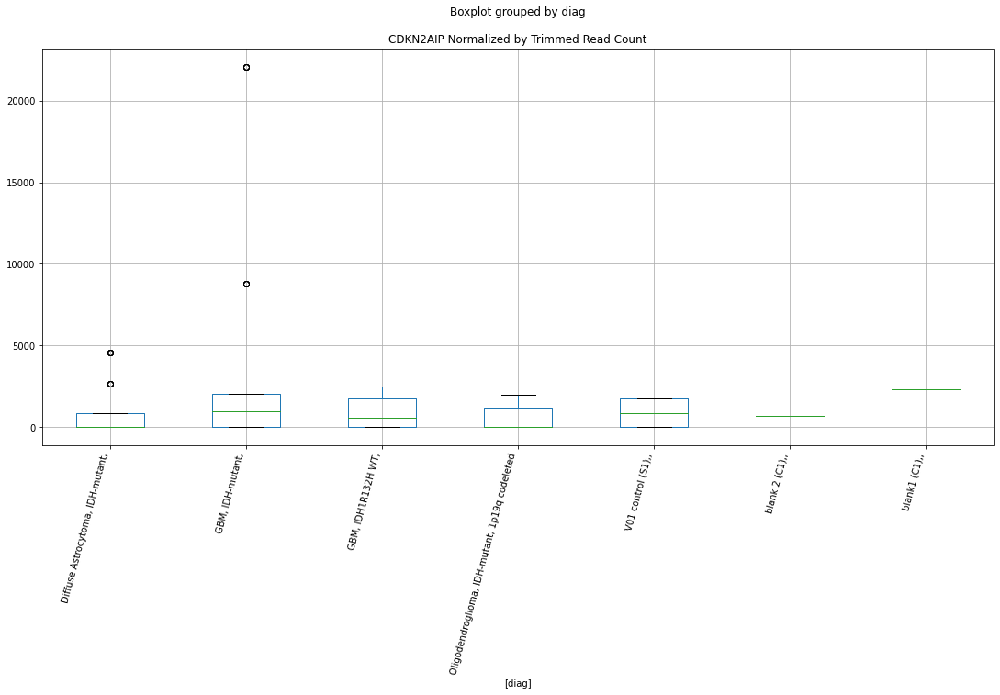

 p : 0.04887481857940763  ( t : 2.000172615229496 ) :  Lexogen  :  cutadapt2  :  RB1-DT
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1-DT, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1-DT, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1-DT, dtype: float64


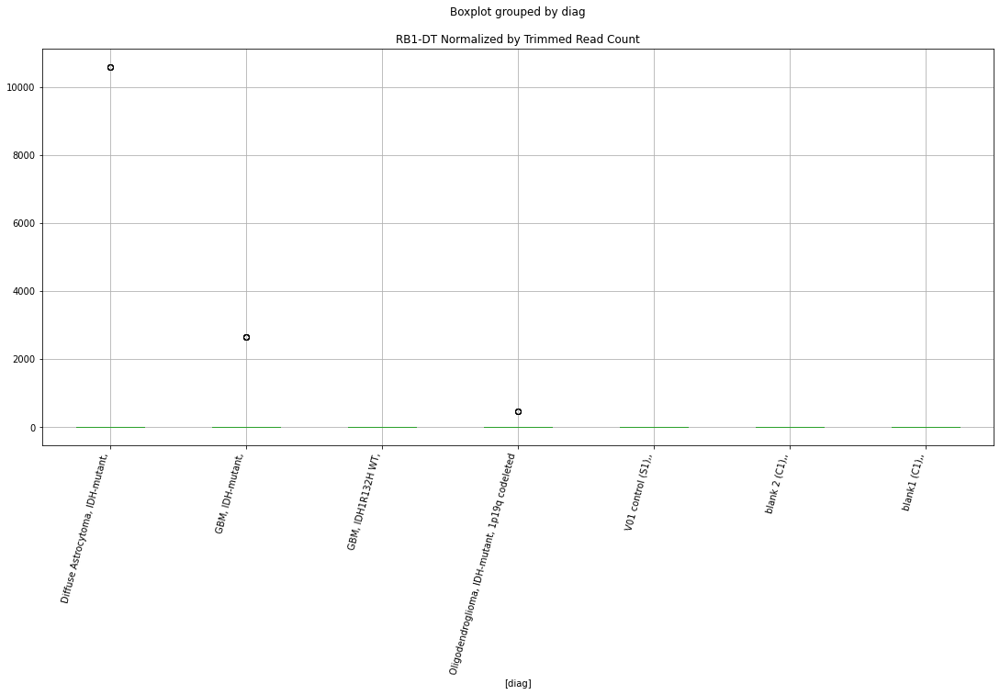

 p : 0.048926250807841465  ( t : 1.9940404261867466 ) :  D-plex  :  bbduk2  :  EGFR
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: EGFR, dtype: float64
942    3581.82
943    3581.82
944    3581.82
945    3581.82
946    3581.82
Name: EGFR, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: EGFR, dtype: float64


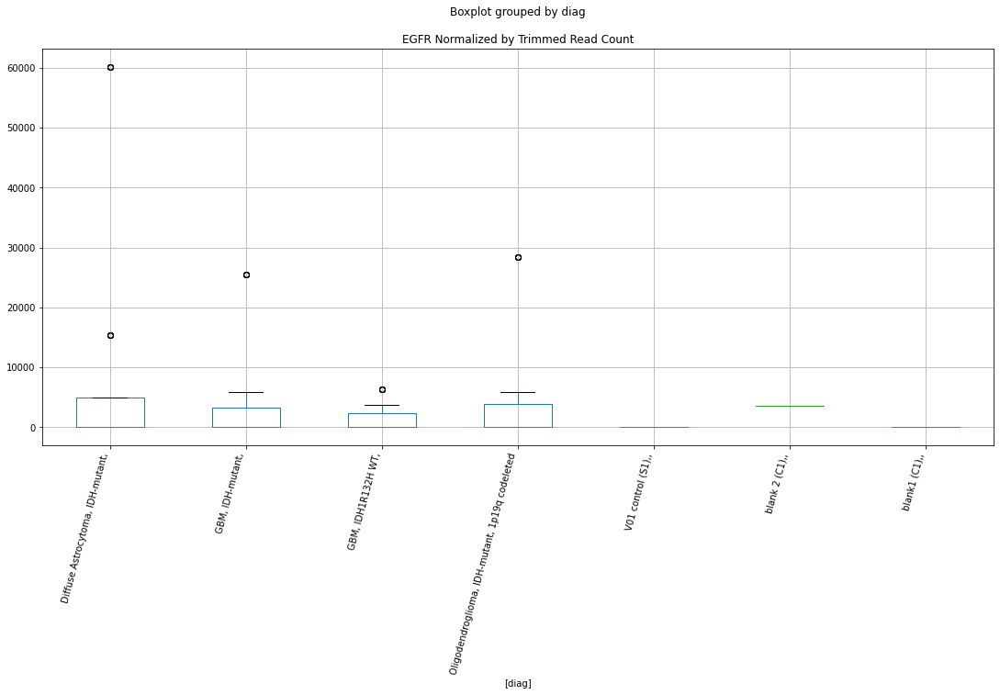

 p : 0.04909654363827851  ( t : 1.9981648997563606 ) :  Lexogen  :  bbduk2  :  RB1-DT
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1-DT, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1-DT, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1-DT, dtype: float64


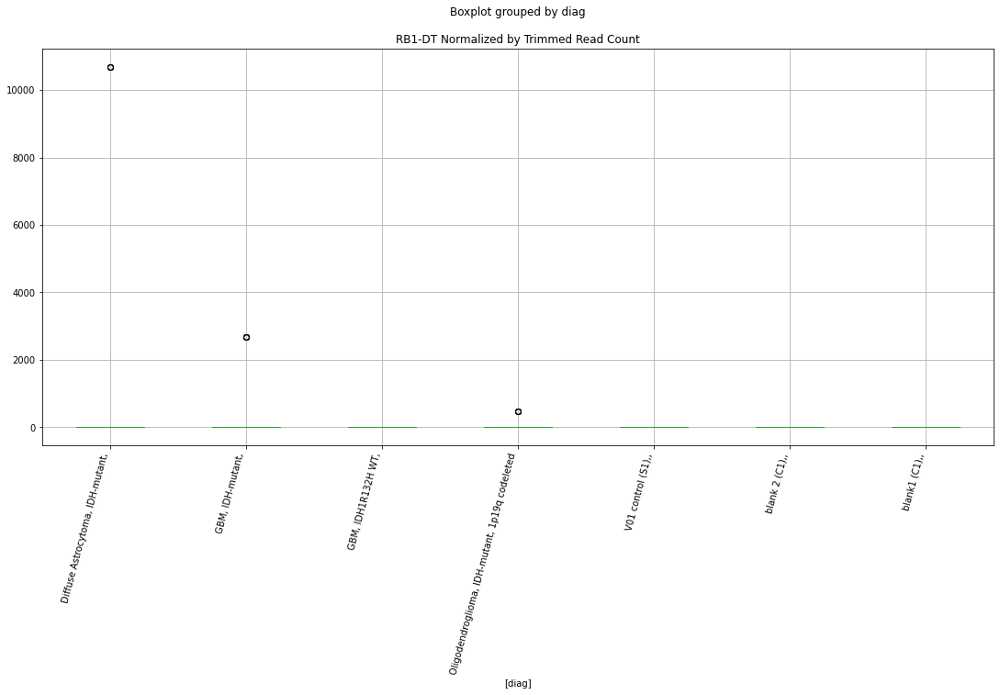

 p : 0.04913223023384931  ( t : 1.9921902444841983 ) :  D-plex  :  cutadapt2  :  EGFR
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: EGFR, dtype: float64
957    3527.2
958    3527.2
959    3527.2
960    3527.2
961    3527.2
Name: EGFR, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: EGFR, dtype: float64


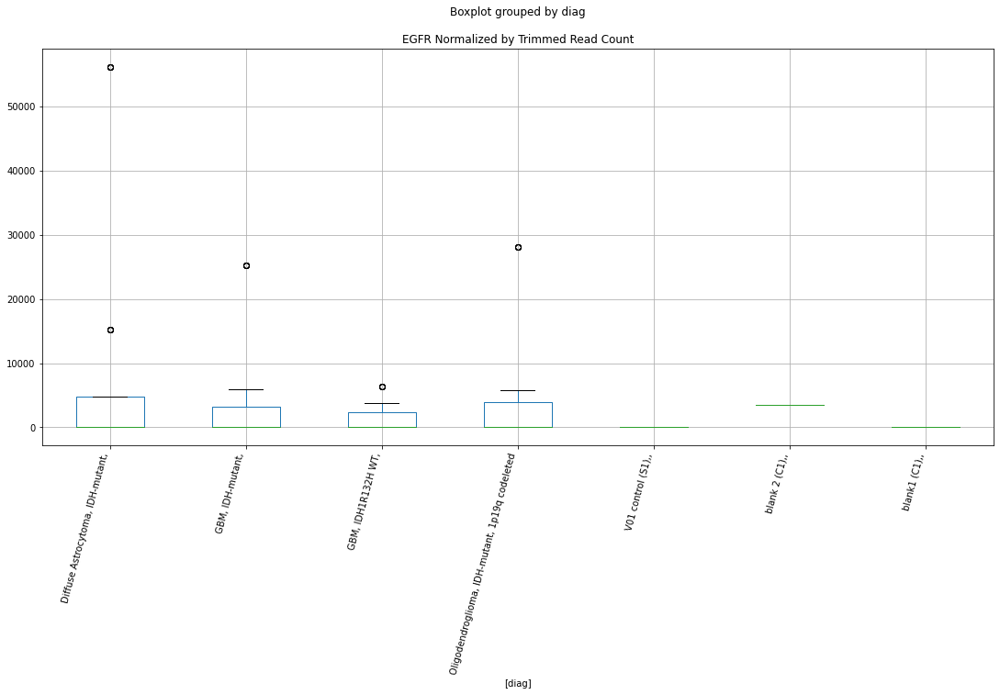

 p : 0.04977319070830143  ( t : 1.9864748771032712 ) :  D-plex  :  bbduk2  :  RB1
Control and blanks
348         0.0
349         0.0
350         0.0
351         0.0
352         0.0
1542    24924.4
1543    24924.4
1544    24924.4
1545    24924.4
1546    24924.4
Name: RB1, dtype: float64
942    1432.73
943    1432.73
944    1432.73
945    1432.73
946    1432.73
Name: RB1, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: RB1, dtype: float64


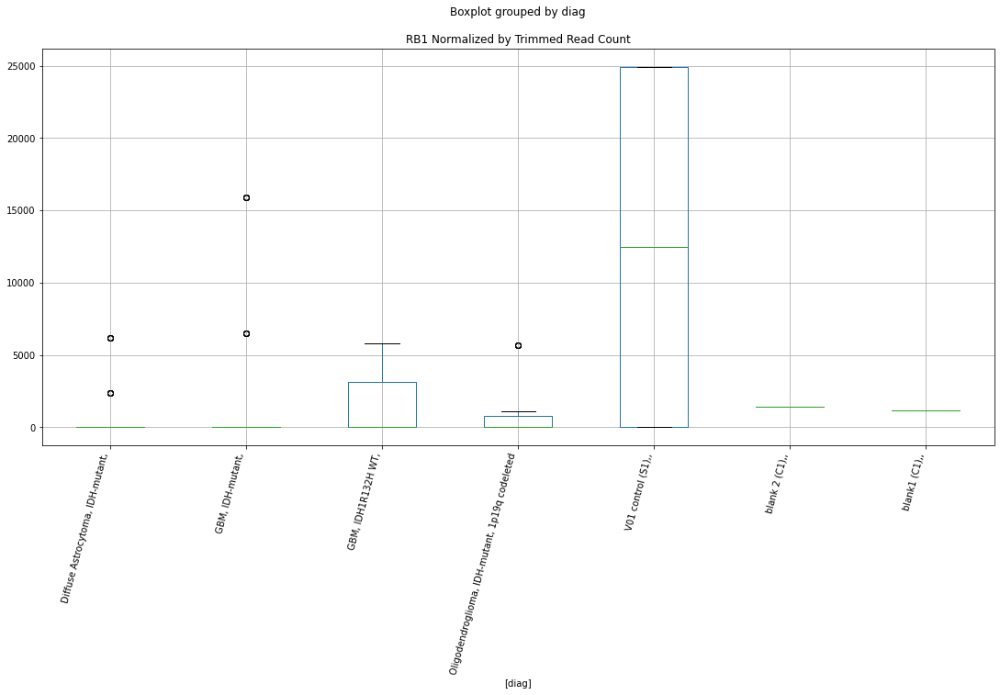

 p : 0.04996356731966607  ( t : 1.984789386190143 ) :  D-plex  :  bbduk2  :  CDKN2B
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B, dtype: float64
942    358.18
943    358.18
944    358.18
945    358.18
946    358.18
Name: CDKN2B, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2B, dtype: float64


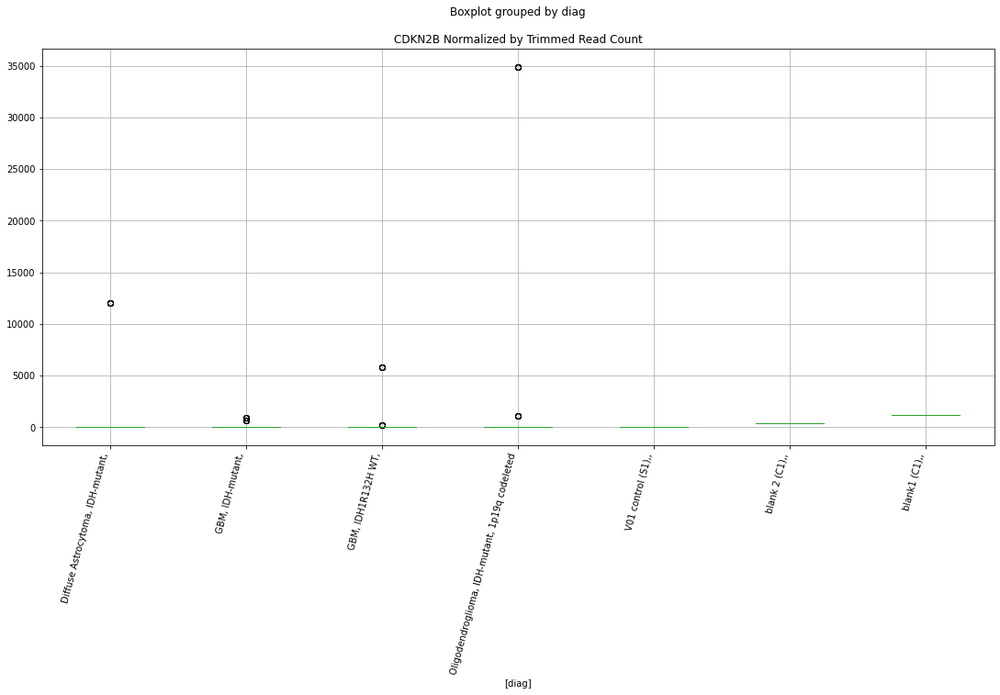

 p : 0.05043905939670782  ( t : 1.9861713528651275 ) :  Lexogen  :  cutadapt2  :  RB1-DT
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1-DT, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1-DT, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1-DT, dtype: float64


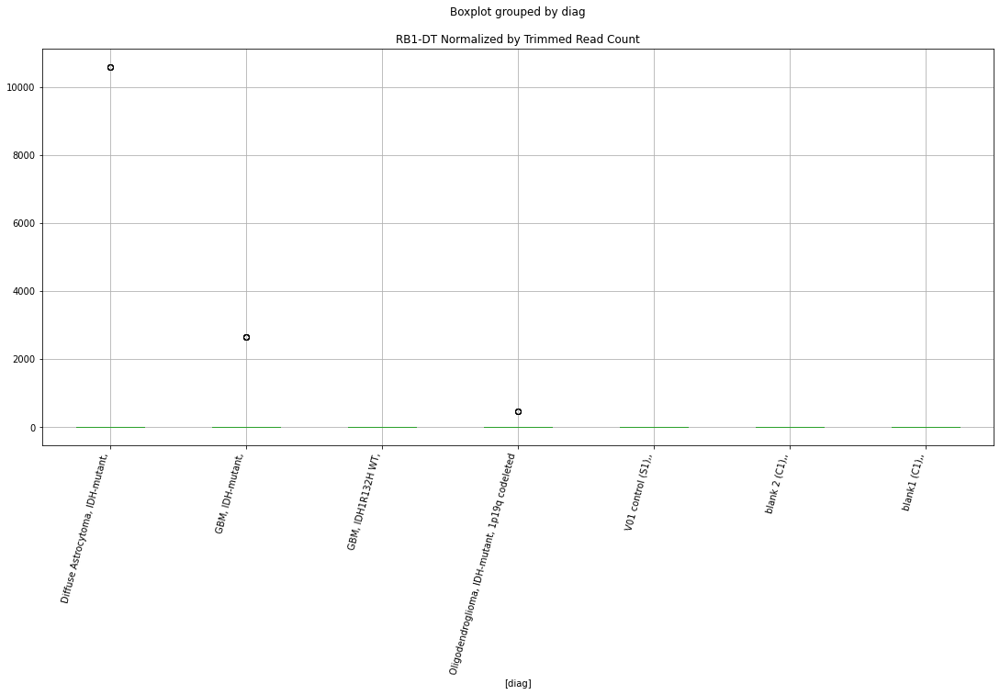

 p : 0.05047251023362283  ( t : 1.9858760133302231 ) :  Lexogen  :  bbduk2  :  RB1-DT
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1-DT, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1-DT, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1-DT, dtype: float64


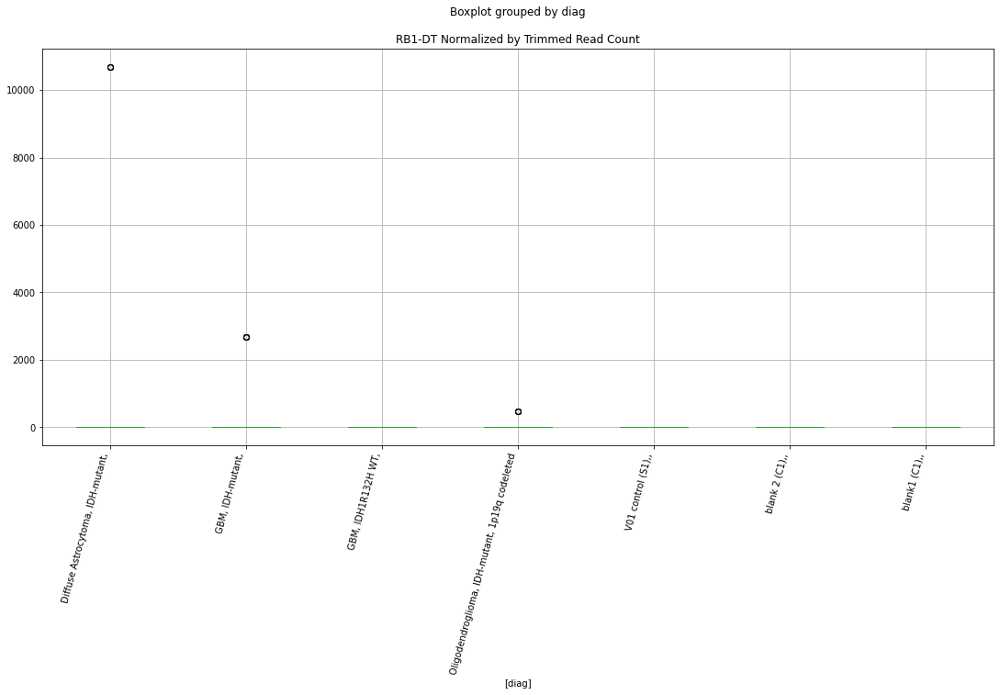

 p : 0.05113733796021868  ( t : 1.9800405871913362 ) :  Lexogen  :  cutadapt2  :  EGFR
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: EGFR, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: EGFR, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: EGFR, dtype: float64


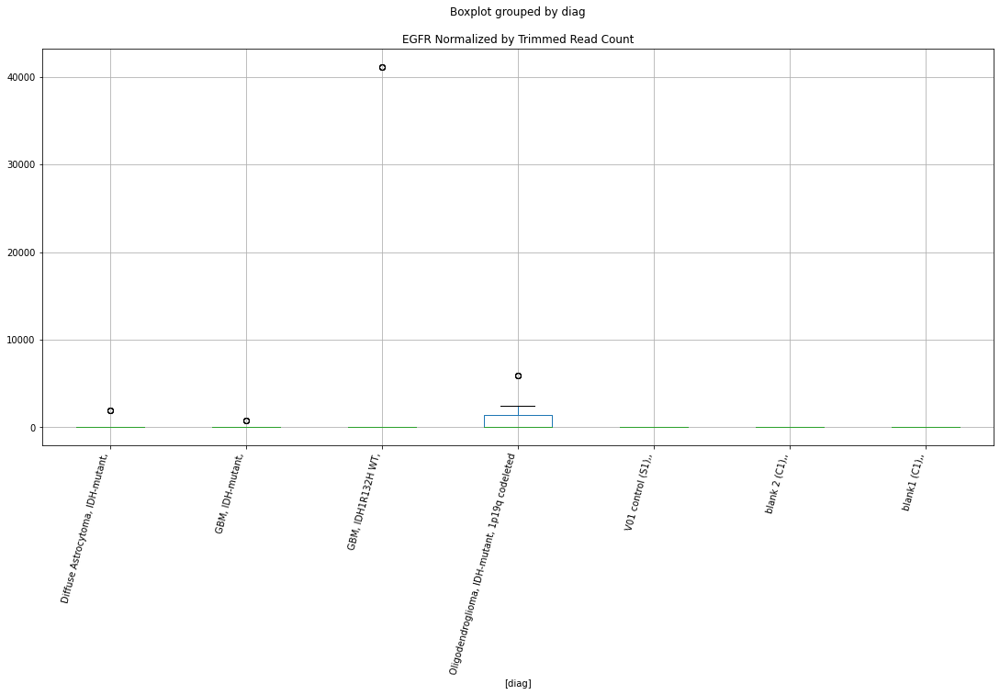

 p : 0.051668645913251696  ( t : 1.9699323321442441 ) :  D-plex  :  cutadapt2  :  CDKN2B
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B, dtype: float64


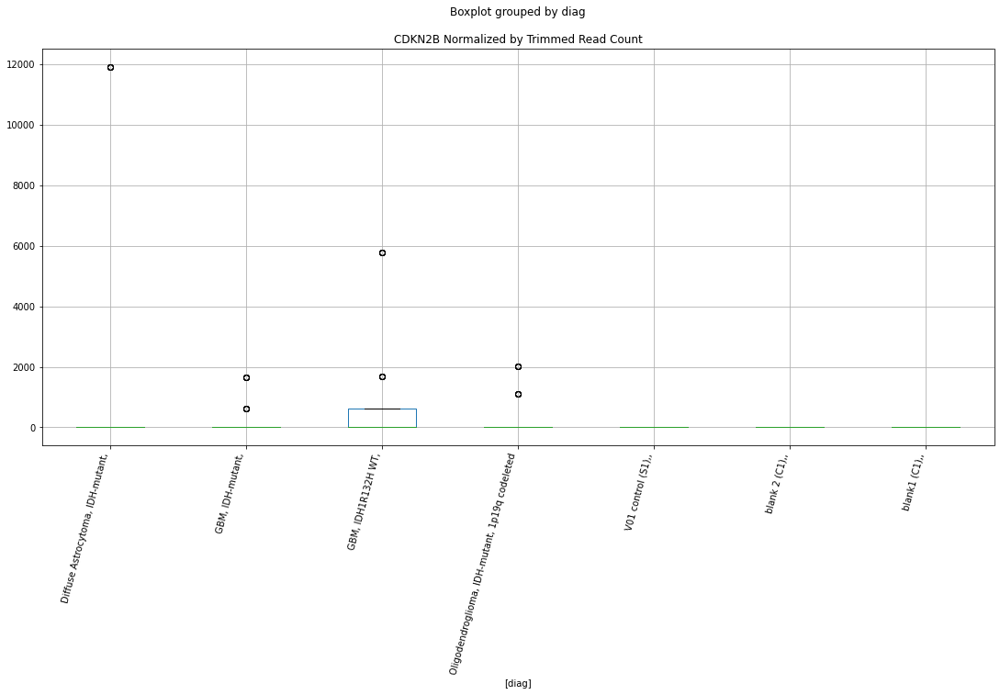

 p : 0.05371935643014263  ( t : 1.957973627740124 ) :  Lexogen  :  bbduk2  :  CDKN2A
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2A, dtype: float64
971    1639.84
972    1639.84
973    1639.84
974    1639.84
Name: CDKN2A, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2A, dtype: float64


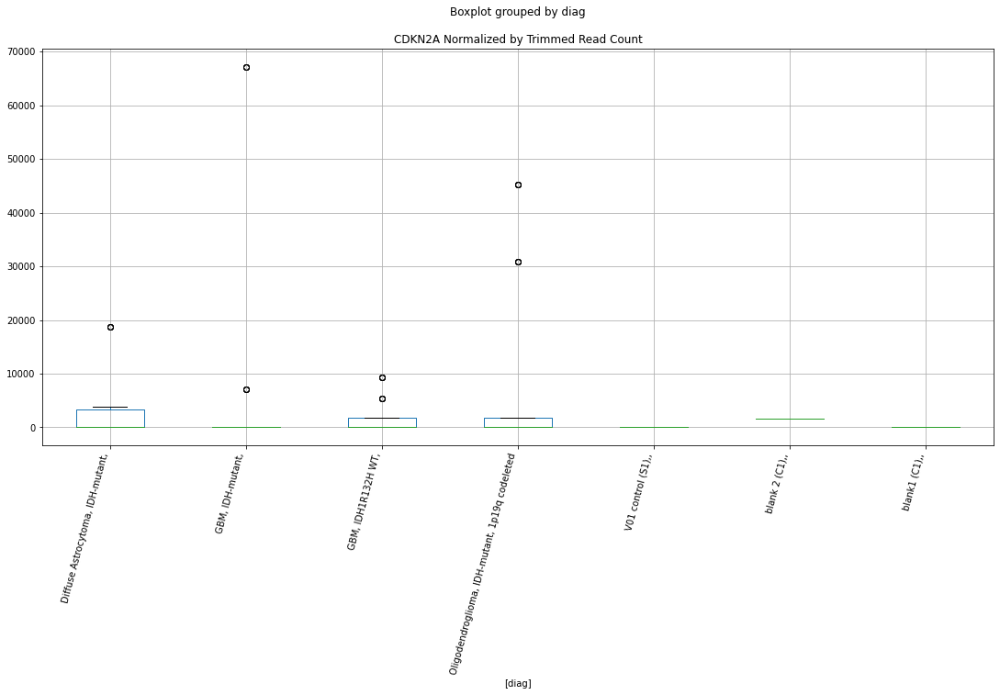

 p : 0.05606162197841087  ( t : 1.9387229151966094 ) :  Lexogen  :  cutadapt2  :  RB1CC1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: RB1CC1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: RB1CC1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: RB1CC1, dtype: float64


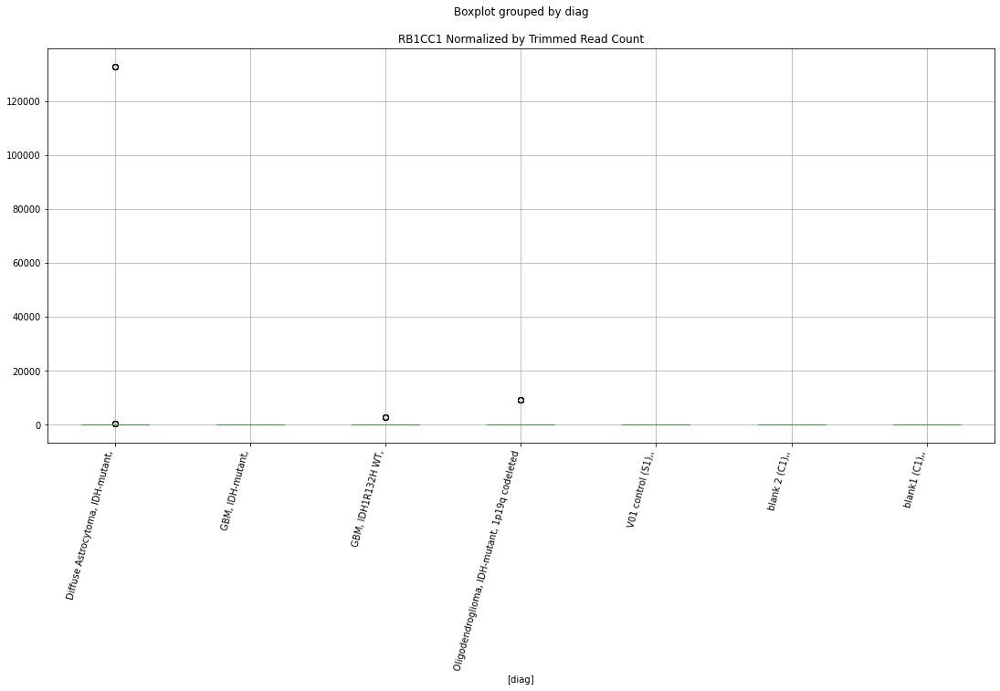

 p : 0.058173076273915145  ( t : 1.9219455072050615 ) :  Lexogen  :  bbduk2  :  EGFR-AS1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: EGFR-AS1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: EGFR-AS1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: EGFR-AS1, dtype: float64


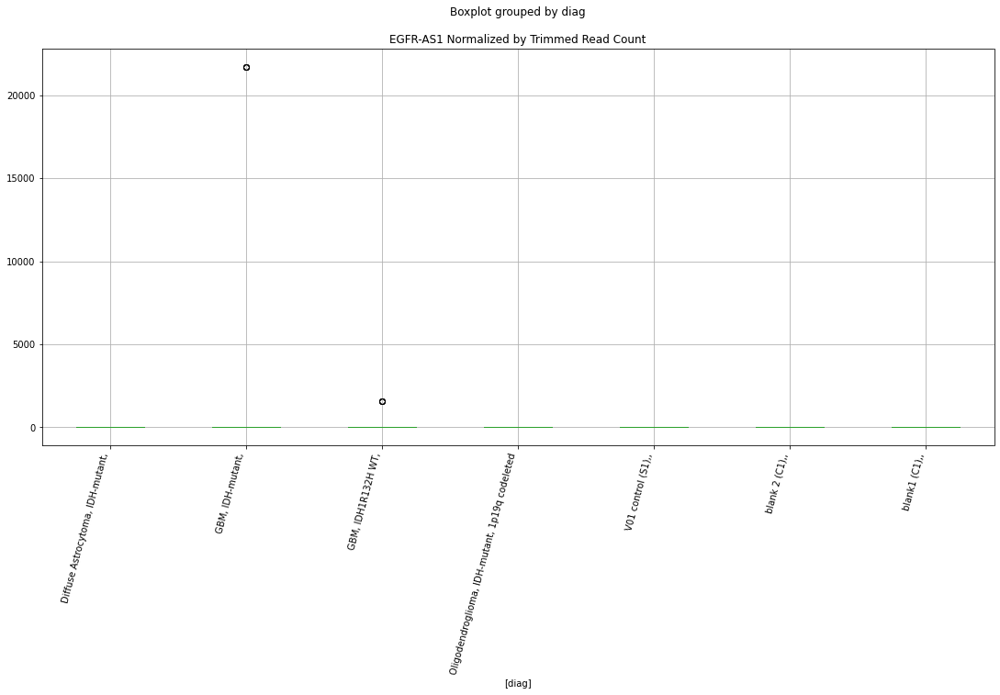

 p : 0.05826421528645894  ( t : 1.9212330104111668 ) :  Lexogen  :  cutadapt2  :  EGFR-AS1
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: EGFR-AS1, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: EGFR-AS1, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: EGFR-AS1, dtype: float64


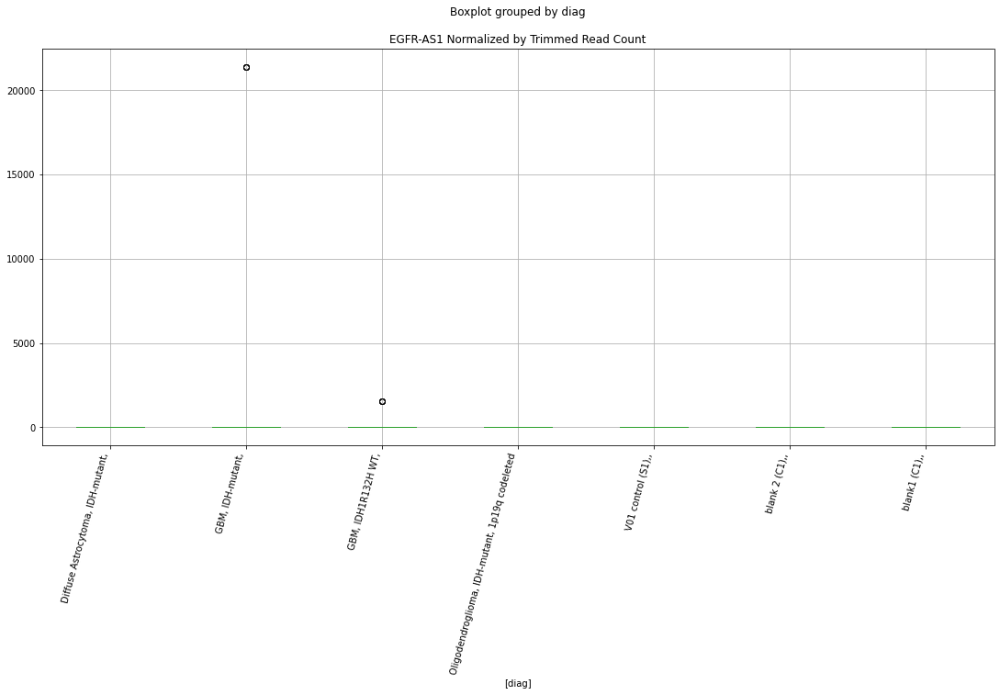

 p : 0.05862030247511135  ( t : 1.9133620296468874 ) :  D-plex  :  cutadapt2  :  NF1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: NF1, dtype: float64
957    7583.49
958    7583.49
959    7583.49
960    7583.49
961    7583.49
Name: NF1, dtype: float64
2151    8091.38
2152    8091.38
2153    8091.38
2154    8091.38
2155    8091.38
Name: NF1, dtype: float64


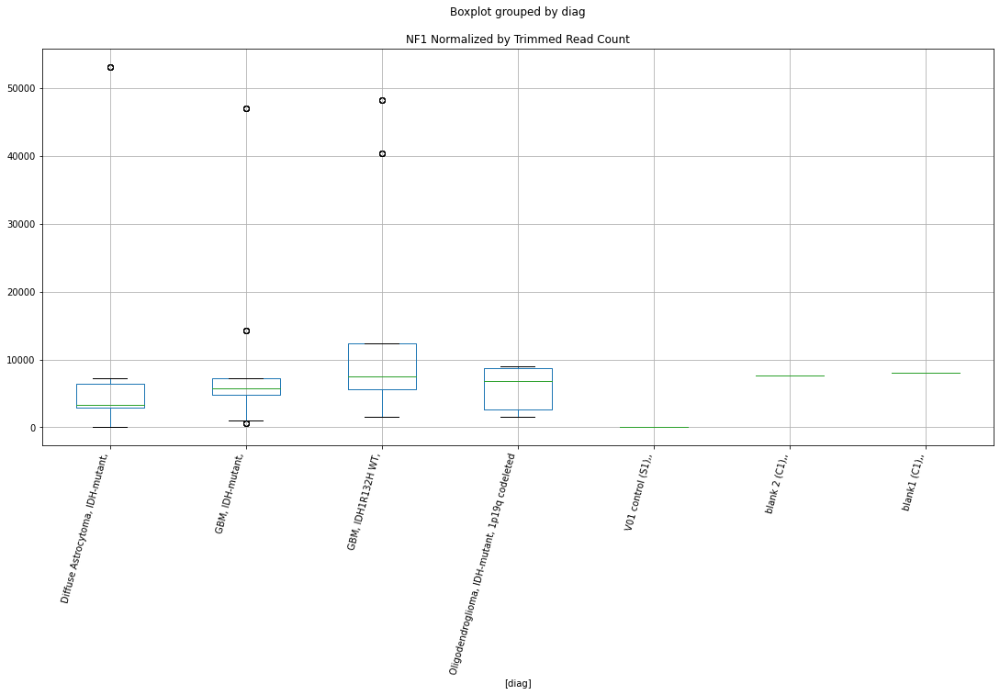

 p : 0.05876031412463539  ( t : 1.91737112128176 ) :  Lexogen  :  bbduk2  :  IDH1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: IDH1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: IDH1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: IDH1, dtype: float64


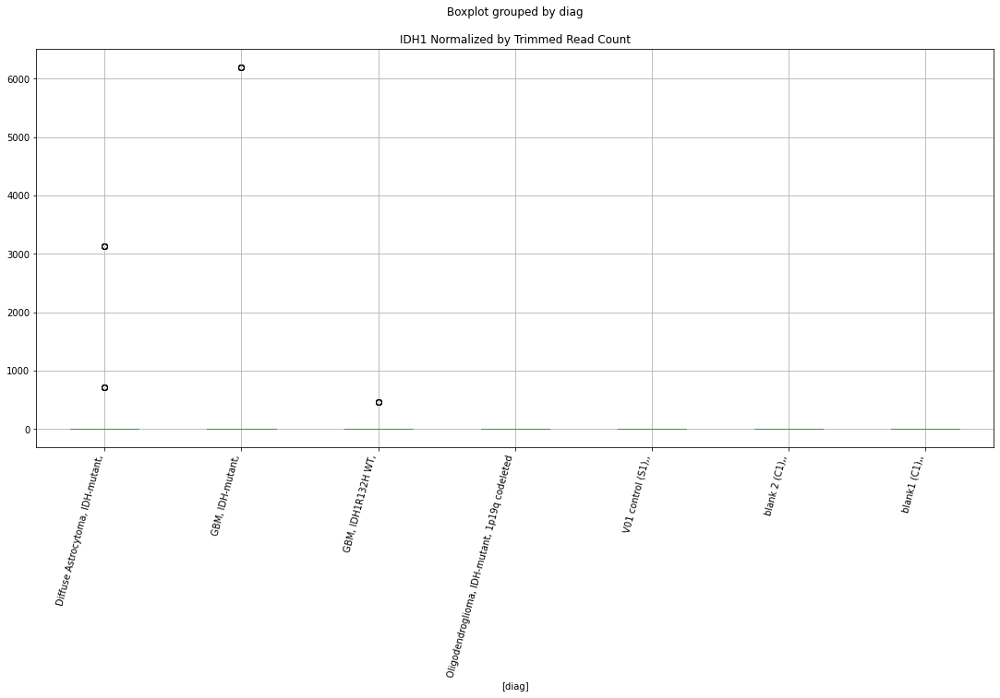

 p : 0.05886021518940661  ( t : 1.9165967787334819 ) :  Lexogen  :  cutadapt2  :  CDKN2AIP
Control and blanks
389       0.00
390       0.00
391       0.00
392       0.00
1583    420.87
1584    420.87
1585    420.87
1586    420.87
Name: CDKN2AIP, dtype: float64
983    0.0
984    0.0
985    0.0
986    0.0
Name: CDKN2AIP, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2AIP, dtype: float64


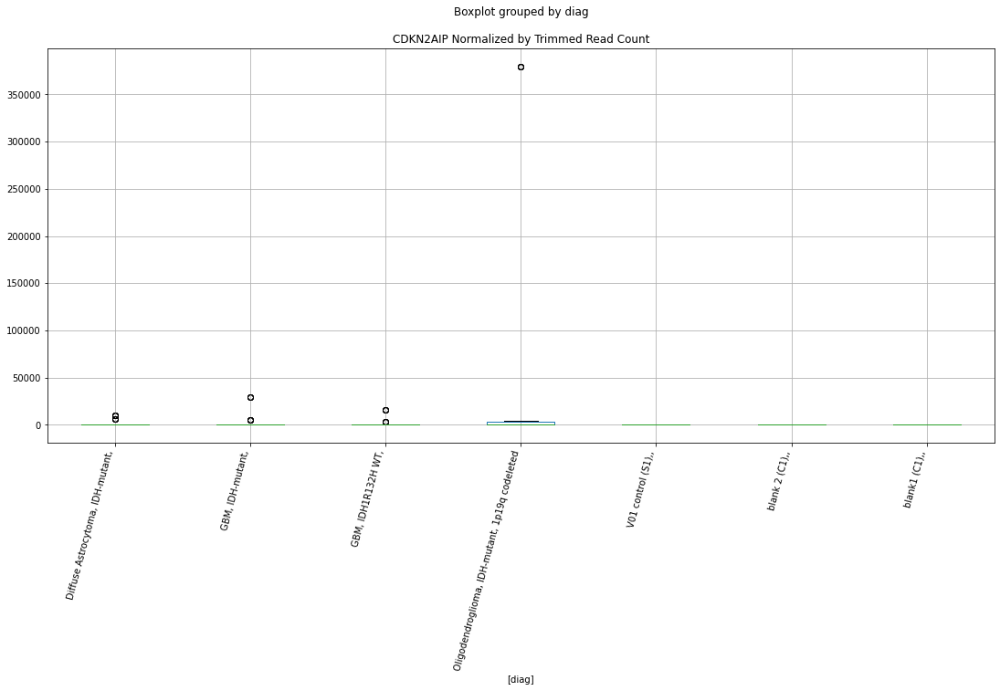

 p : 0.05926129671110673  ( t : 1.9134991048671868 ) :  Lexogen  :  bbduk2  :  CDKN2AIP
Control and blanks
377       0.00
378       0.00
379       0.00
380       0.00
1571    424.63
1572    424.63
1573    424.63
1574    424.63
Name: CDKN2AIP, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: CDKN2AIP, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2AIP, dtype: float64


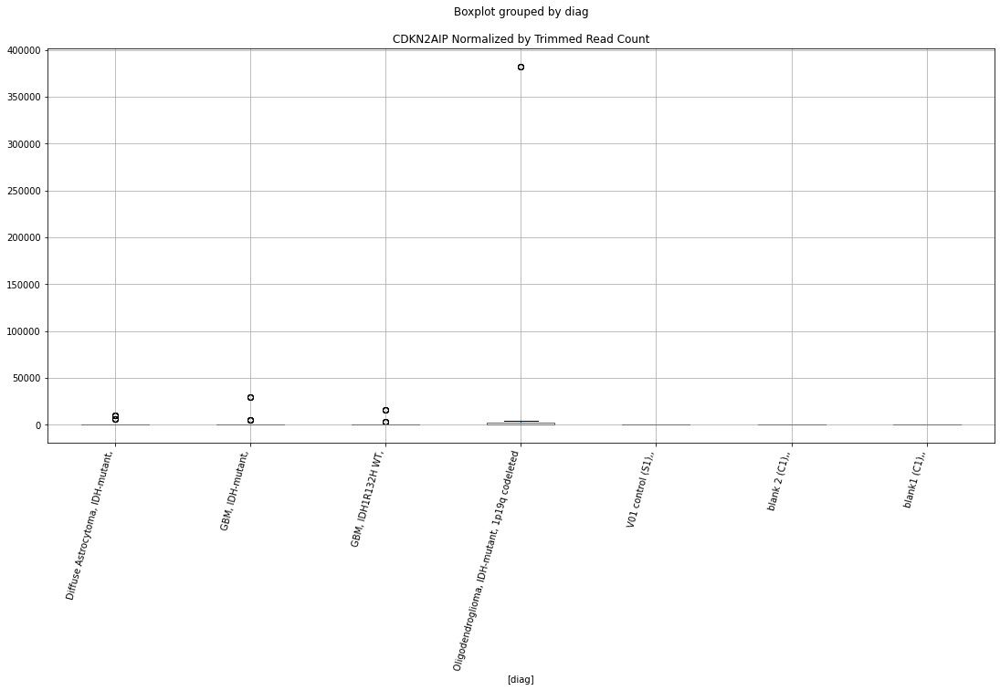

 p : 0.061416550127835916  ( t : 1.8971505666688222 ) :  Lexogen  :  bbduk2  :  RB1CC1
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: RB1CC1, dtype: float64
971    0.0
972    0.0
973    0.0
974    0.0
Name: RB1CC1, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: RB1CC1, dtype: float64


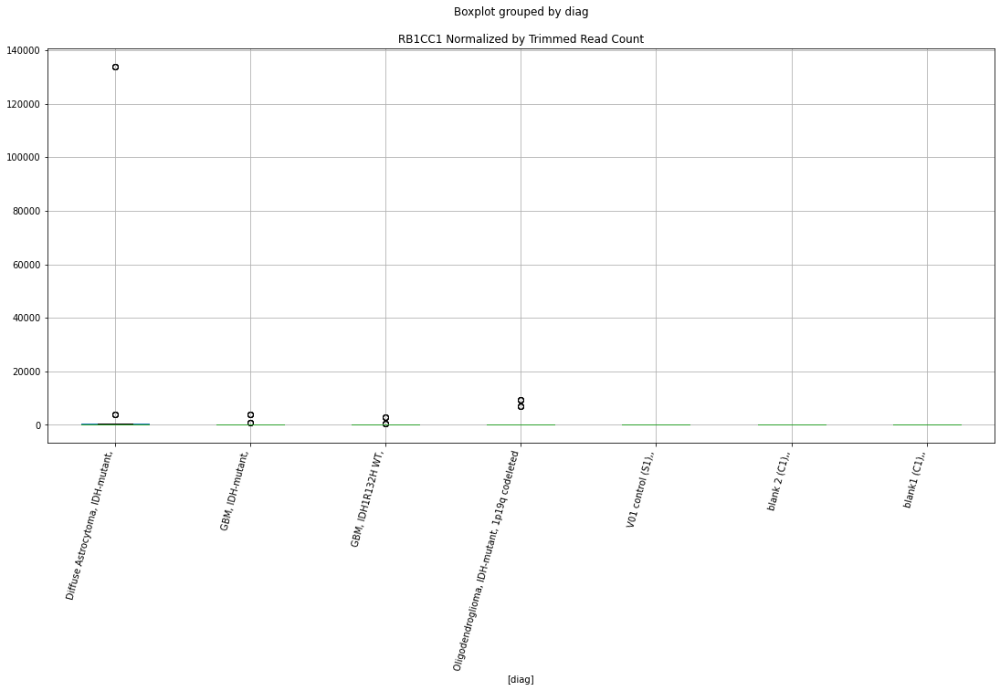

 p : 0.06152640552589488  ( t : 1.891381992642823 ) :  D-plex  :  bbduk2  :  CDKN2A
Control and blanks
348     773.01
349     773.01
350     773.01
351     773.01
352     773.01
1542      0.00
1543      0.00
1544      0.00
1545      0.00
1546      0.00
Name: CDKN2A, dtype: float64
942    5372.73
943    5372.73
944    5372.73
945    5372.73
946    5372.73
Name: CDKN2A, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: CDKN2A, dtype: float64


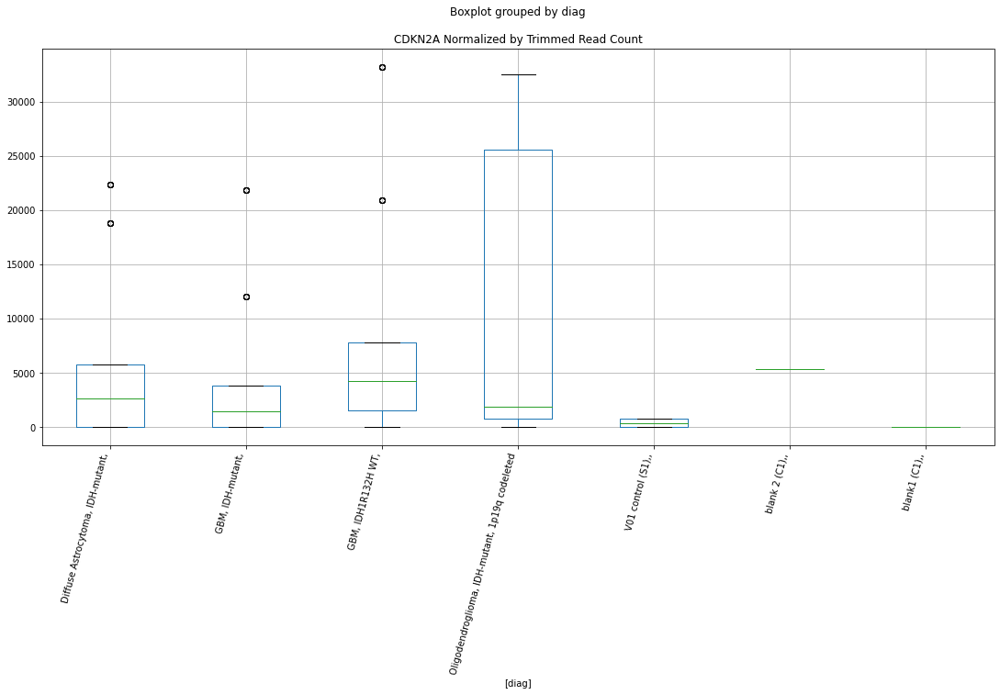

 p : 0.06450237265674308  ( t : 1.8697601425561665 ) :  D-plex  :  cutadapt2  :  CDKN2B
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B, dtype: float64


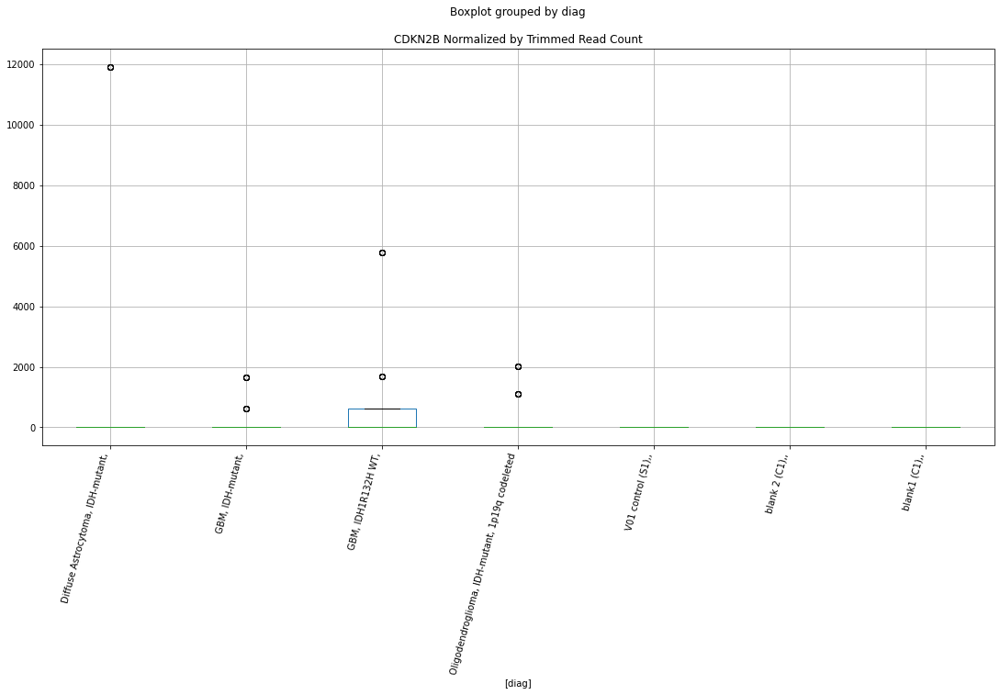

 p : 0.06734397522447497  ( t : 1.8498812246277998 ) :  D-plex  :  cutadapt2  :  CDKN2A
Control and blanks
363     757.61
364     757.61
365     757.61
366     757.61
367     757.61
1557      0.00
1558      0.00
1559      0.00
1560      0.00
1561      0.00
Name: CDKN2A, dtype: float64
957    5290.81
958    5290.81
959    5290.81
960    5290.81
961    5290.81
Name: CDKN2A, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2A, dtype: float64


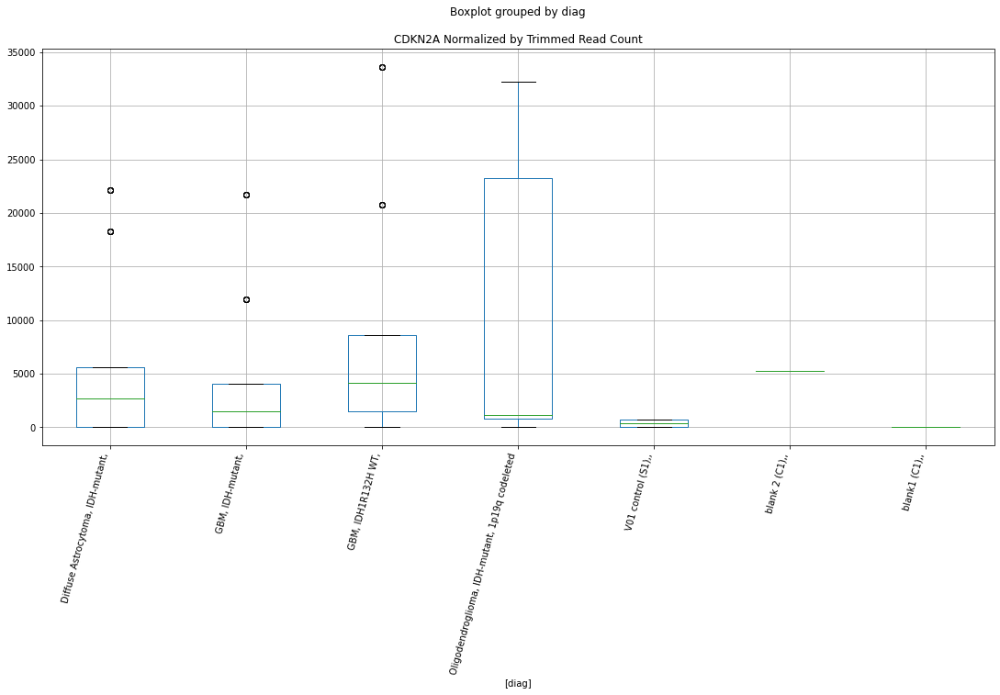

 p : 0.06975680811292656  ( t : 1.8335448382529476 ) :  D-plex  :  bbduk2  :  RB1
Control and blanks
348         0.0
349         0.0
350         0.0
351         0.0
352         0.0
1542    24924.4
1543    24924.4
1544    24924.4
1545    24924.4
1546    24924.4
Name: RB1, dtype: float64
942    1432.73
943    1432.73
944    1432.73
945    1432.73
946    1432.73
Name: RB1, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: RB1, dtype: float64


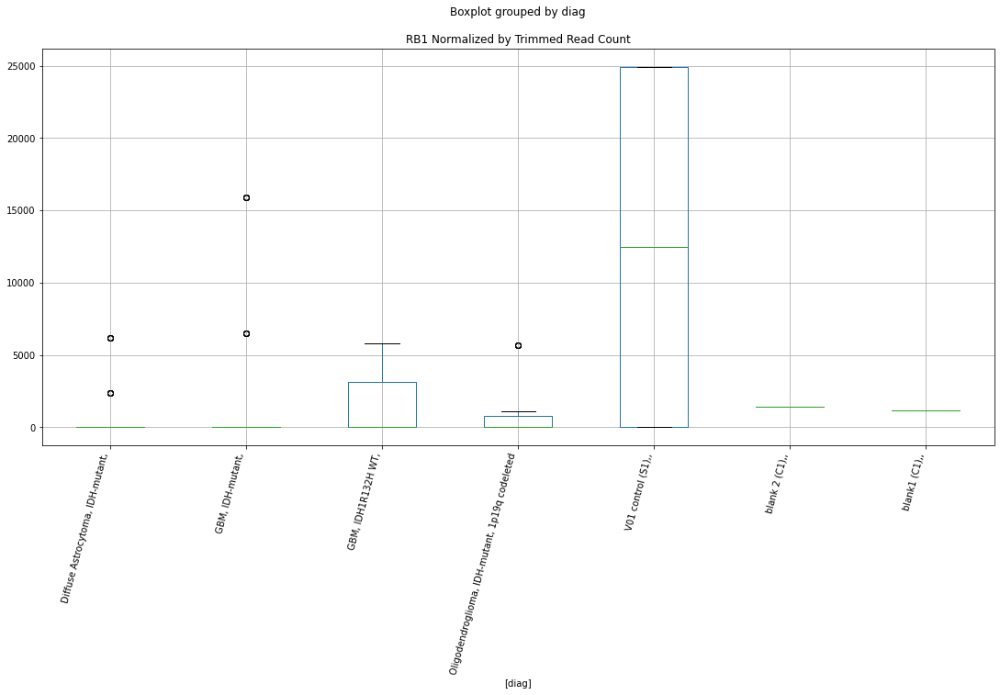

 p : 0.07140496809823625  ( t : 1.8226545486423122 ) :  D-plex  :  cutadapt2  :  CDKN2B-AS1
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B-AS1, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B-AS1, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B-AS1, dtype: float64


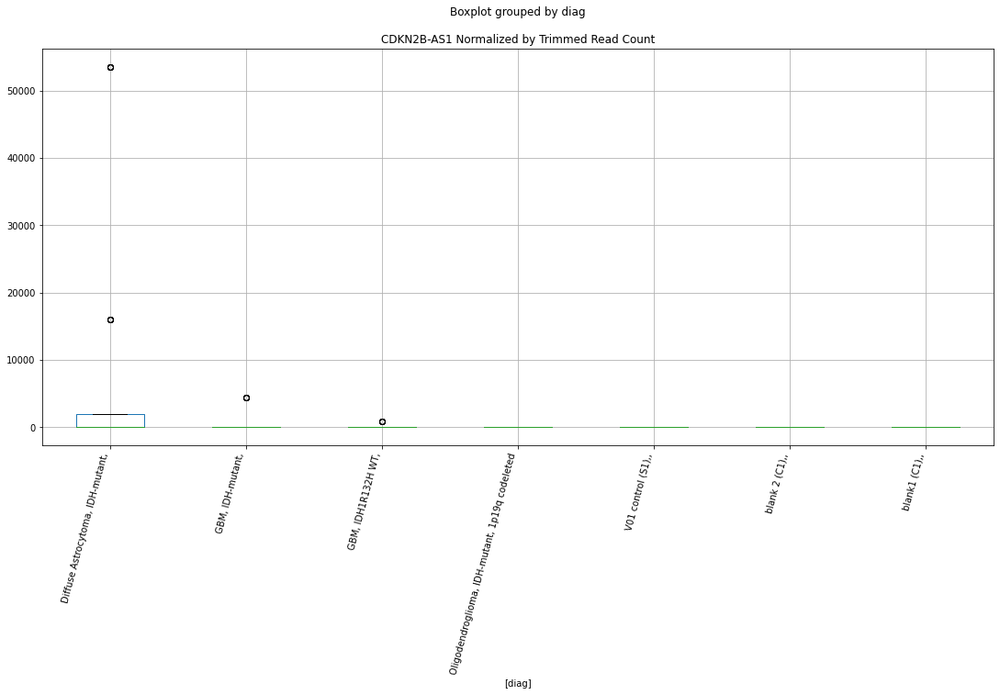

 p : 0.07521918796689722  ( t : 1.798231808018023 ) :  D-plex  :  bbduk2  :  IDH2
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: IDH2, dtype: float64
942    537.27
943    537.27
944    537.27
945    537.27
946    537.27
Name: IDH2, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: IDH2, dtype: float64


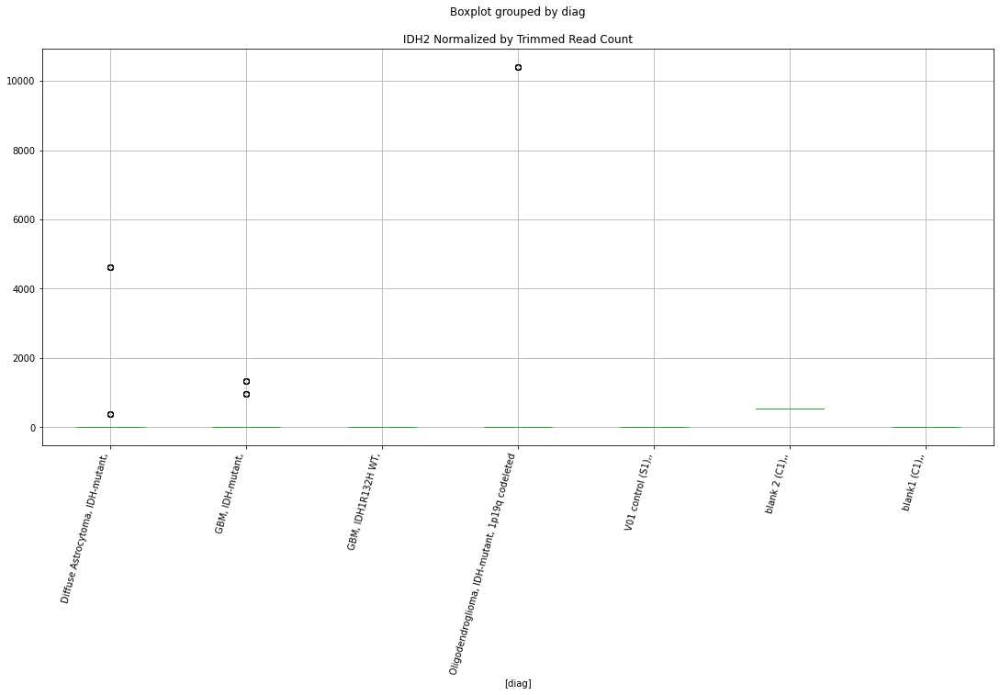

 p : 0.07527570784908633  ( t : 1.7978777105592056 ) :  D-plex  :  bbduk2  :  NOTCH1
Control and blanks
348     12368.13
349     12368.13
350     12368.13
351     12368.13
352     12368.13
1542    85455.10
1543    85455.10
1544    85455.10
1545    85455.10
1546    85455.10
Name: NOTCH1, dtype: float64
942    64651.83
943    64651.83
944    64651.83
945    64651.83
946    64651.83
Name: NOTCH1, dtype: float64
2136    403421.63
2137    403421.63
2138    403421.63
2139    403421.63
2140    403421.63
Name: NOTCH1, dtype: float64


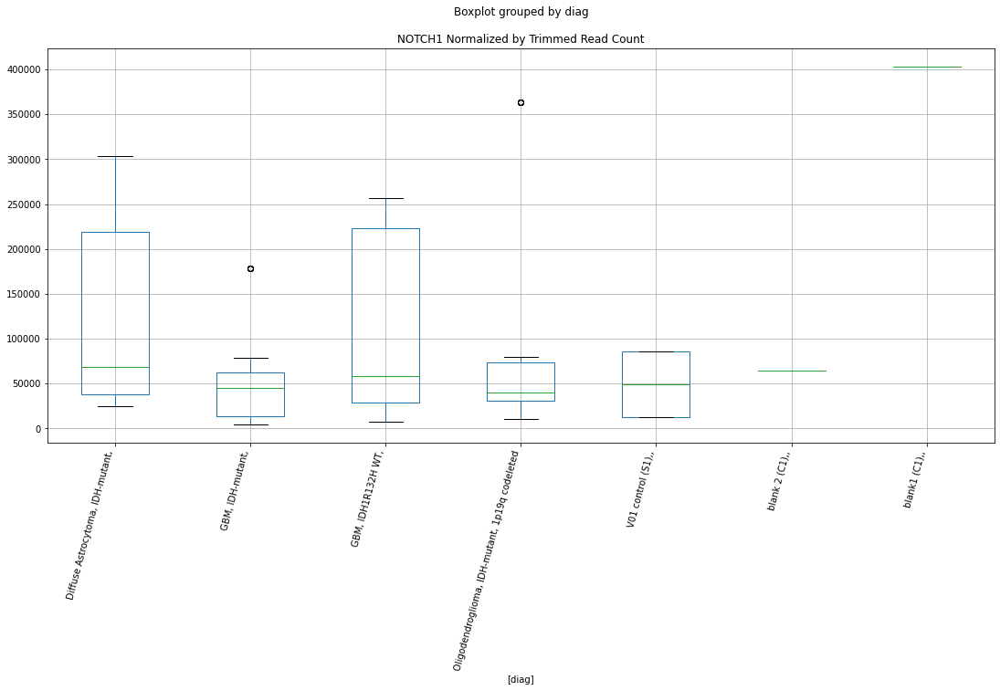

 p : 0.07708318228272319  ( t : 1.7909535088947348 ) :  Lexogen  :  bbduk2  :  TP53
Control and blanks
377     6.87e+05
378     6.87e+05
379     6.87e+05
380     6.87e+05
1571    5.99e+06
1572    5.99e+06
1573    5.99e+06
1574    5.99e+06
Name: TP53, dtype: float64
971    1.02e+06
972    1.02e+06
973    1.02e+06
974    1.02e+06
Name: TP53, dtype: float64
2165    1.02e+06
2166    1.02e+06
2167    1.02e+06
2168    1.02e+06
Name: TP53, dtype: float64


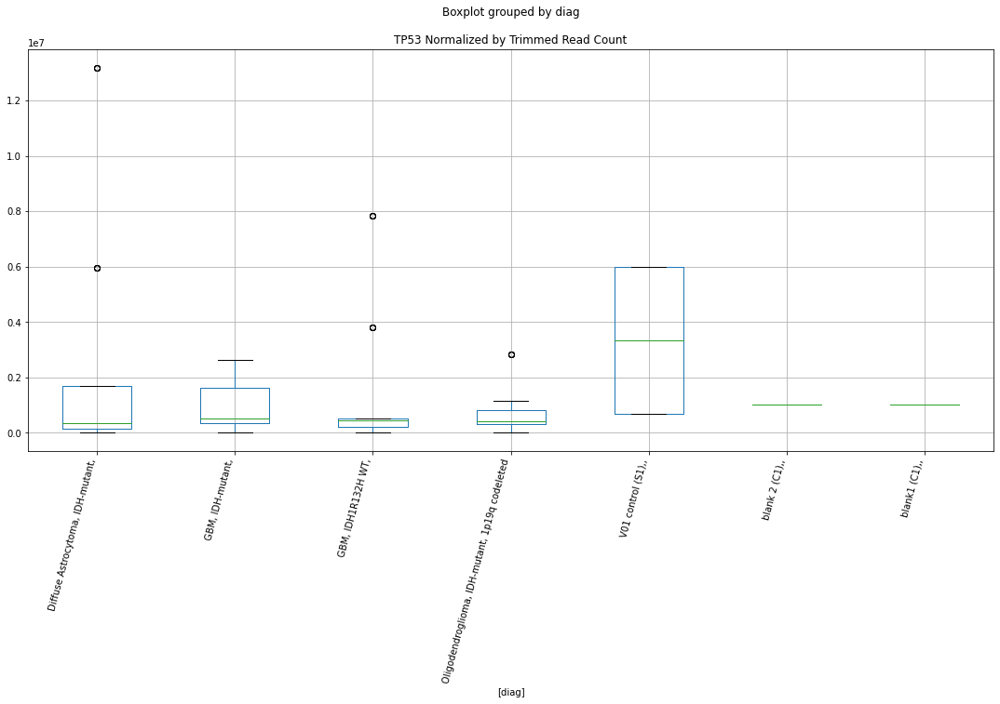

 p : 0.07776354105751139  ( t : 1.7867654912856665 ) :  Lexogen  :  cutadapt2  :  CDKN2A
Control and blanks
389     0.0
390     0.0
391     0.0
392     0.0
1583    0.0
1584    0.0
1585    0.0
1586    0.0
Name: CDKN2A, dtype: float64
983    1627.36
984    1627.36
985    1627.36
986    1627.36
Name: CDKN2A, dtype: float64
2177    0.0
2178    0.0
2179    0.0
2180    0.0
Name: CDKN2A, dtype: float64


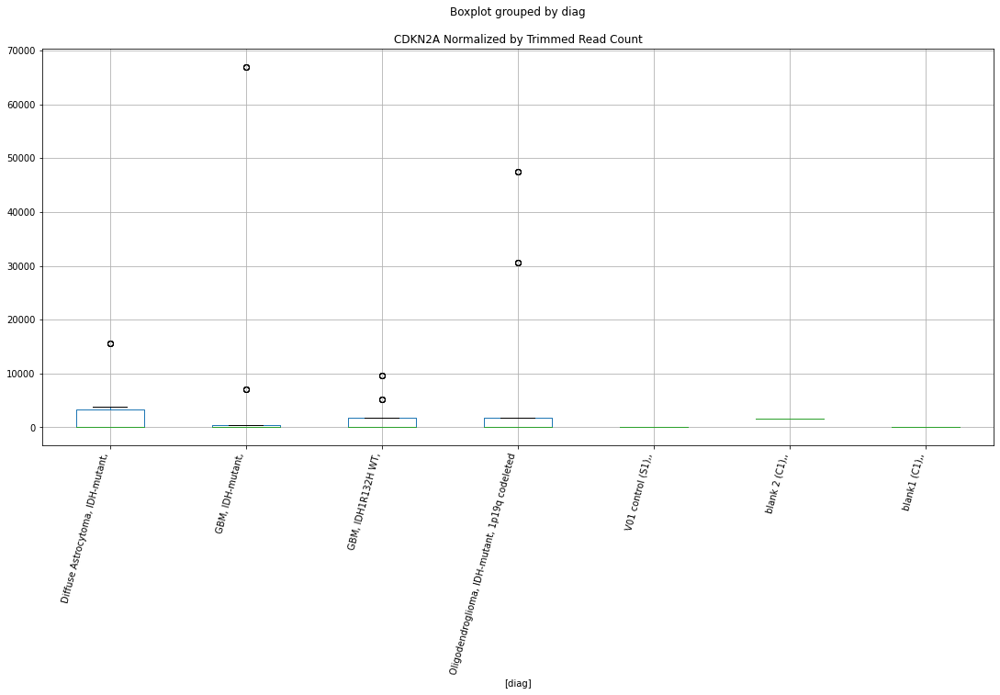

 p : 0.07847888046124284  ( t : 1.7823948064273776 ) :  Lexogen  :  bbduk2  :  CDKN2A
Control and blanks
377     0.0
378     0.0
379     0.0
380     0.0
1571    0.0
1572    0.0
1573    0.0
1574    0.0
Name: CDKN2A, dtype: float64
971    1639.84
972    1639.84
973    1639.84
974    1639.84
Name: CDKN2A, dtype: float64
2165    0.0
2166    0.0
2167    0.0
2168    0.0
Name: CDKN2A, dtype: float64


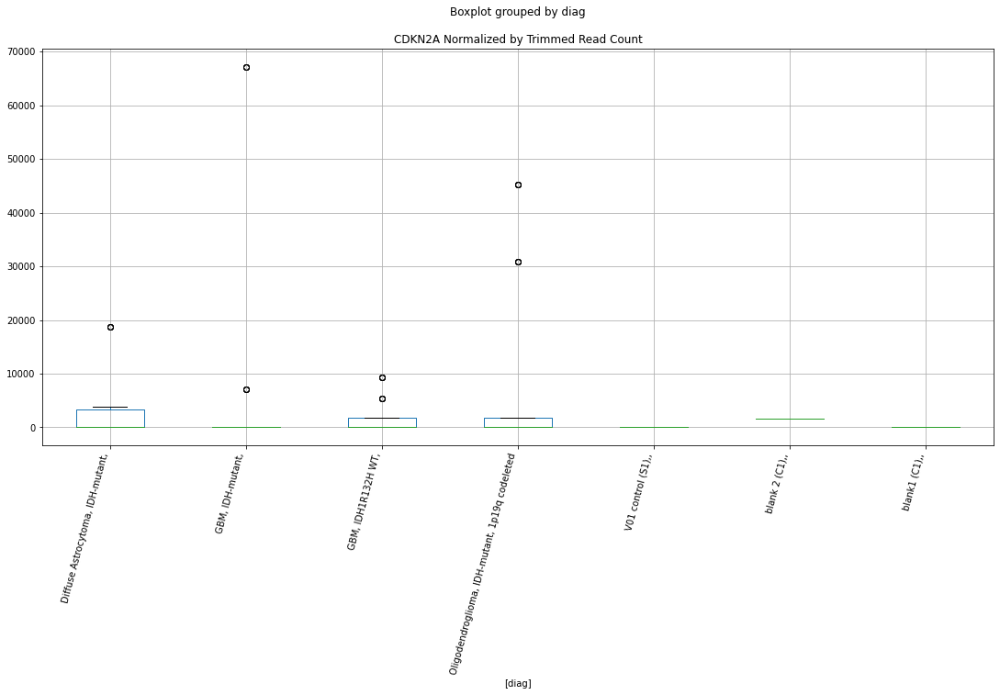

 p : 0.0787598343952668  ( t : 1.7806872254003598 ) :  Lexogen  :  cutadapt2  :  TP53
Control and blanks
389     6.82e+05
390     6.82e+05
391     6.82e+05
392     6.82e+05
1583    5.98e+06
1584    5.98e+06
1585    5.98e+06
1586    5.98e+06
Name: TP53, dtype: float64
983    1.01e+06
984    1.01e+06
985    1.01e+06
986    1.01e+06
Name: TP53, dtype: float64
2177    1.02e+06
2178    1.02e+06
2179    1.02e+06
2180    1.02e+06
Name: TP53, dtype: float64


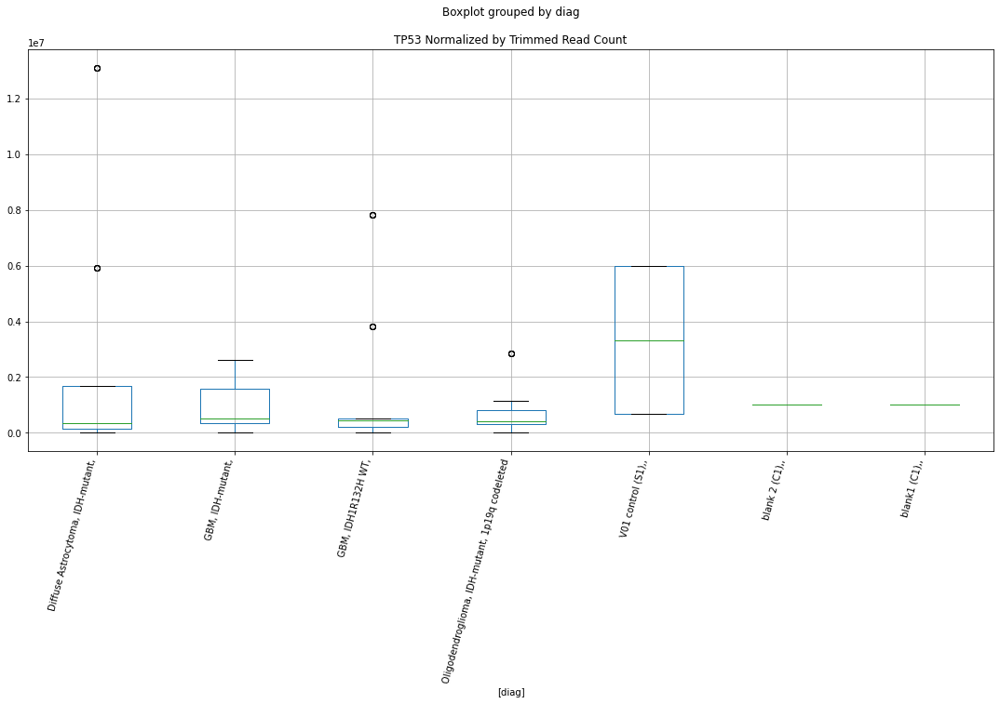

 p : 0.07877461626483782  ( t : 1.7763739703800085 ) :  D-plex  :  bbduk2  :  CDKN2B
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: CDKN2B, dtype: float64
942    358.18
943    358.18
944    358.18
945    358.18
946    358.18
Name: CDKN2B, dtype: float64
2136    1183.05
2137    1183.05
2138    1183.05
2139    1183.05
2140    1183.05
Name: CDKN2B, dtype: float64


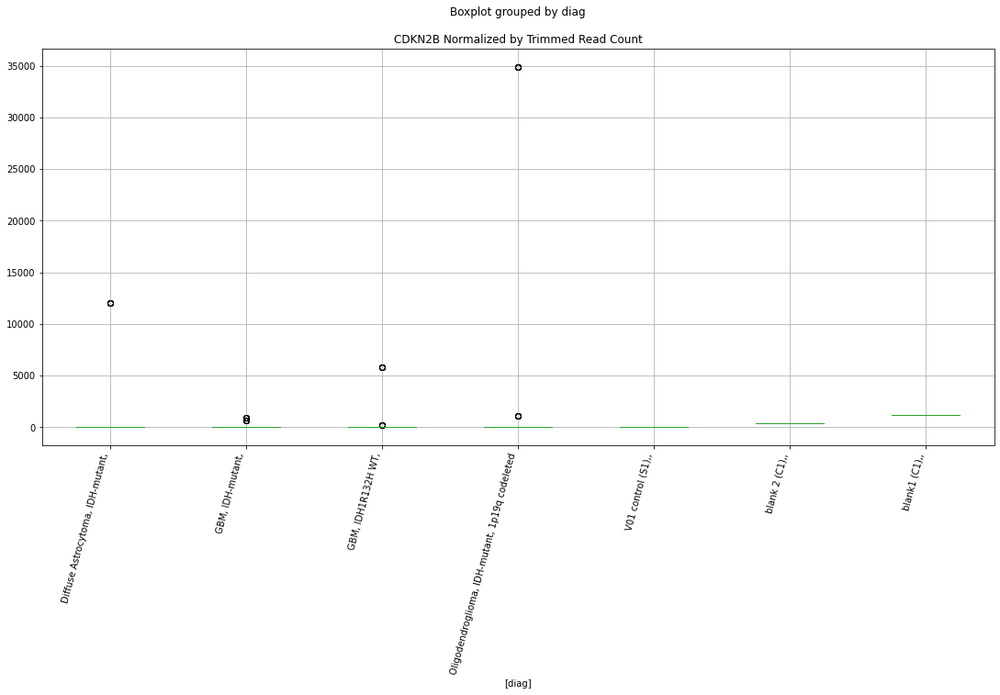

 p : 0.0808703841659989  ( t : 1.763869002326184 ) :  D-plex  :  cutadapt2  :  NOTCH1
Control and blanks
363     12121.83
364     12121.83
365     12121.83
366     12121.83
367     12121.83
1557    84550.28
1558    84550.28
1559    84550.28
1560    84550.28
1561    84550.28
Name: NOTCH1, dtype: float64
957    64371.48
958    64371.48
959    64371.48
960    64371.48
961    64371.48
Name: NOTCH1, dtype: float64
2151    394165.88
2152    394165.88
2153    394165.88
2154    394165.88
2155    394165.88
Name: NOTCH1, dtype: float64


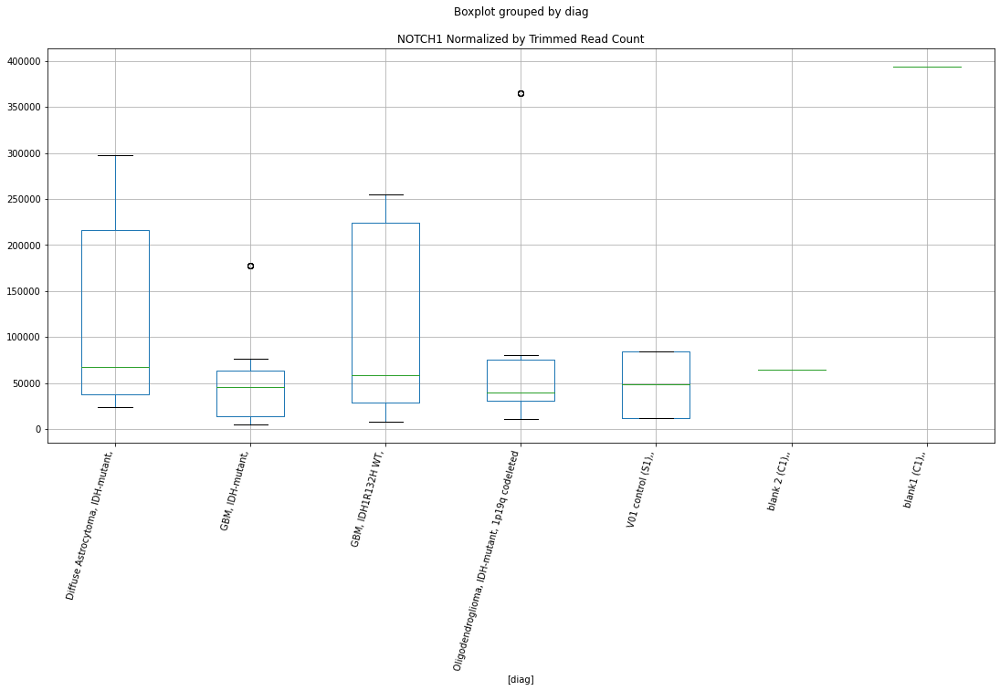

 p : 0.08207055307247012  ( t : 1.7568277445266414 ) :  D-plex  :  bbduk2  :  TP53
Control and blanks
348     0.0
349     0.0
350     0.0
351     0.0
352     0.0
1542    0.0
1543    0.0
1544    0.0
1545    0.0
1546    0.0
Name: TP53, dtype: float64
942    10745.46
943    10745.46
944    10745.46
945    10745.46
946    10745.46
Name: TP53, dtype: float64
2136    26618.73
2137    26618.73
2138    26618.73
2139    26618.73
2140    26618.73
Name: TP53, dtype: float64


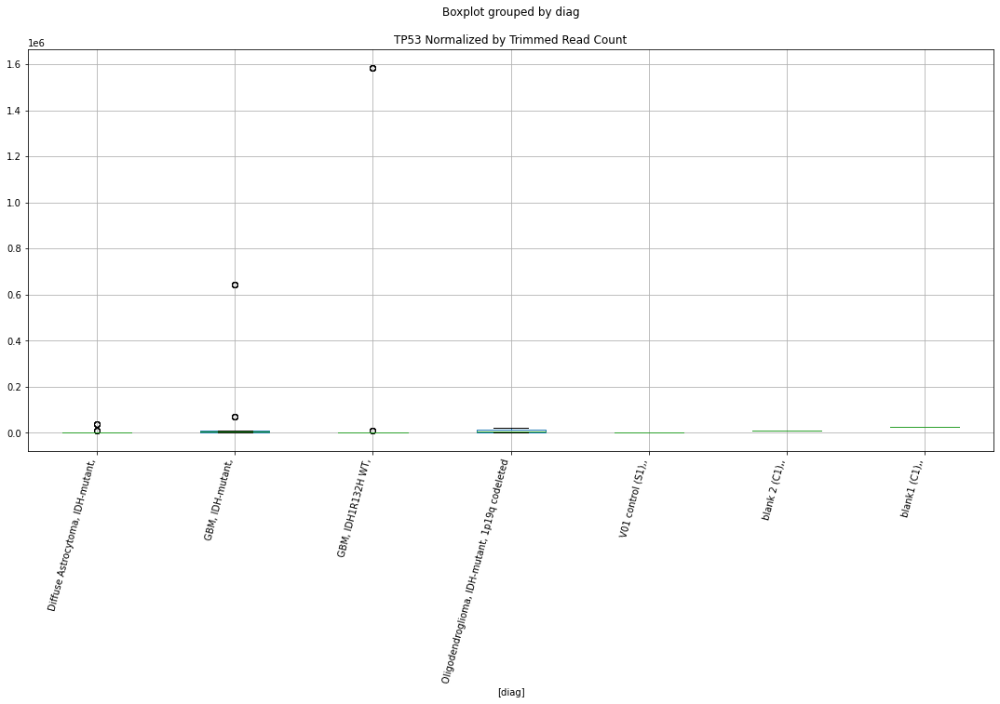

 p : 0.09259337250244938  ( t : 1.6984627039364144 ) :  D-plex  :  cutadapt2  :  CDKN2B
Control and blanks
363     0.0
364     0.0
365     0.0
366     0.0
367     0.0
1557    0.0
1558    0.0
1559    0.0
1560    0.0
1561    0.0
Name: CDKN2B, dtype: float64
957    0.0
958    0.0
959    0.0
960    0.0
961    0.0
Name: CDKN2B, dtype: float64
2151    0.0
2152    0.0
2153    0.0
2154    0.0
2155    0.0
Name: CDKN2B, dtype: float64


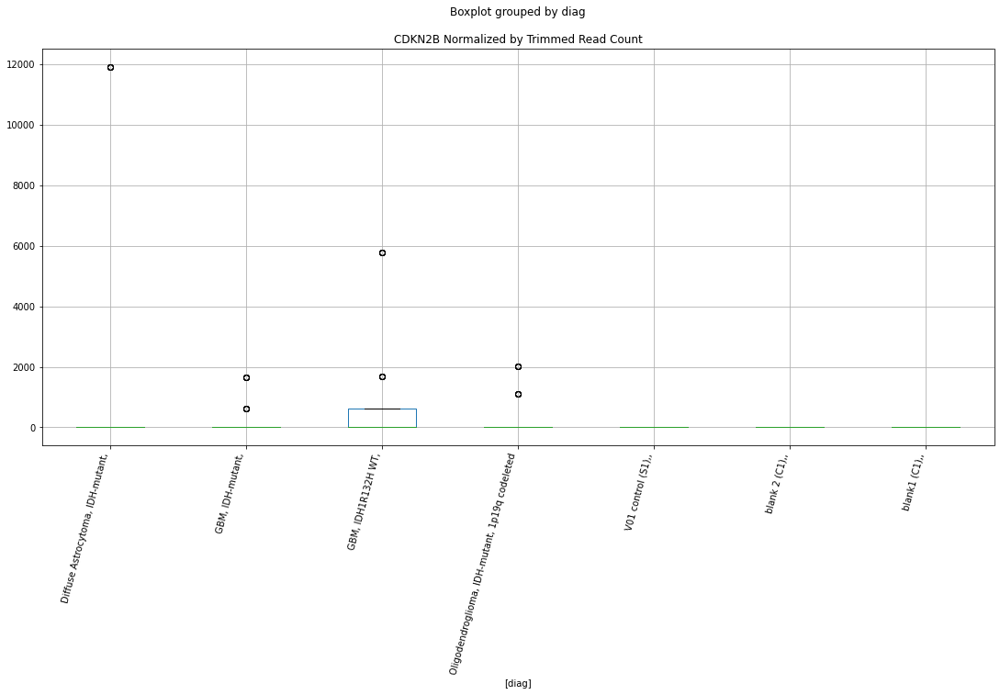

 p : 0.09703421050586097  ( t : 1.6754487810107825 ) :  D-plex  :  bbduk2  :  TERT
Control and blanks
348     3092.03
349     3092.03
350     3092.03
351     3092.03
352     3092.03
1542       0.00
1543       0.00
1544       0.00
1545       0.00
1546       0.00
Name: TERT, dtype: float64
942    2865.46
943    2865.46
944    2865.46
945    2865.46
946    2865.46
Name: TERT, dtype: float64
2136    0.0
2137    0.0
2138    0.0
2139    0.0
2140    0.0
Name: TERT, dtype: float64


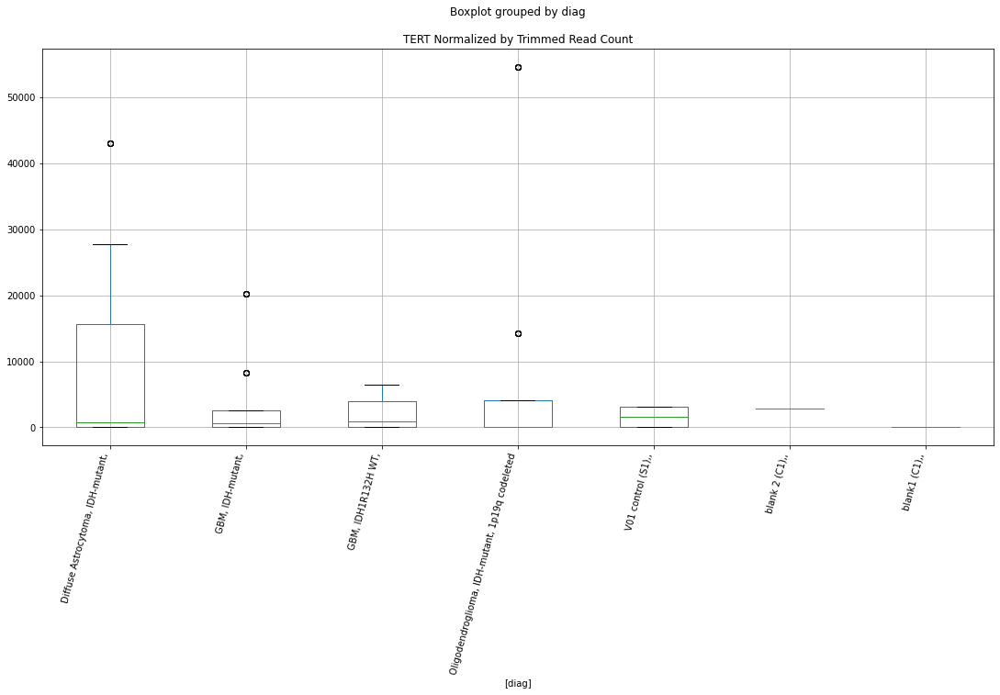

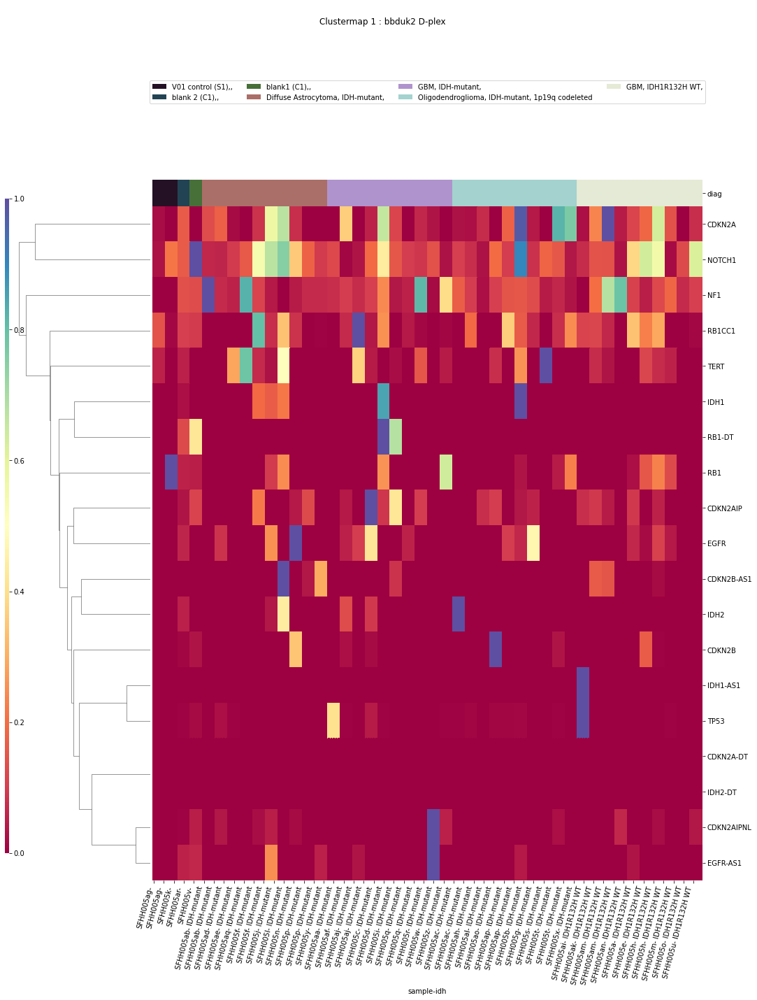

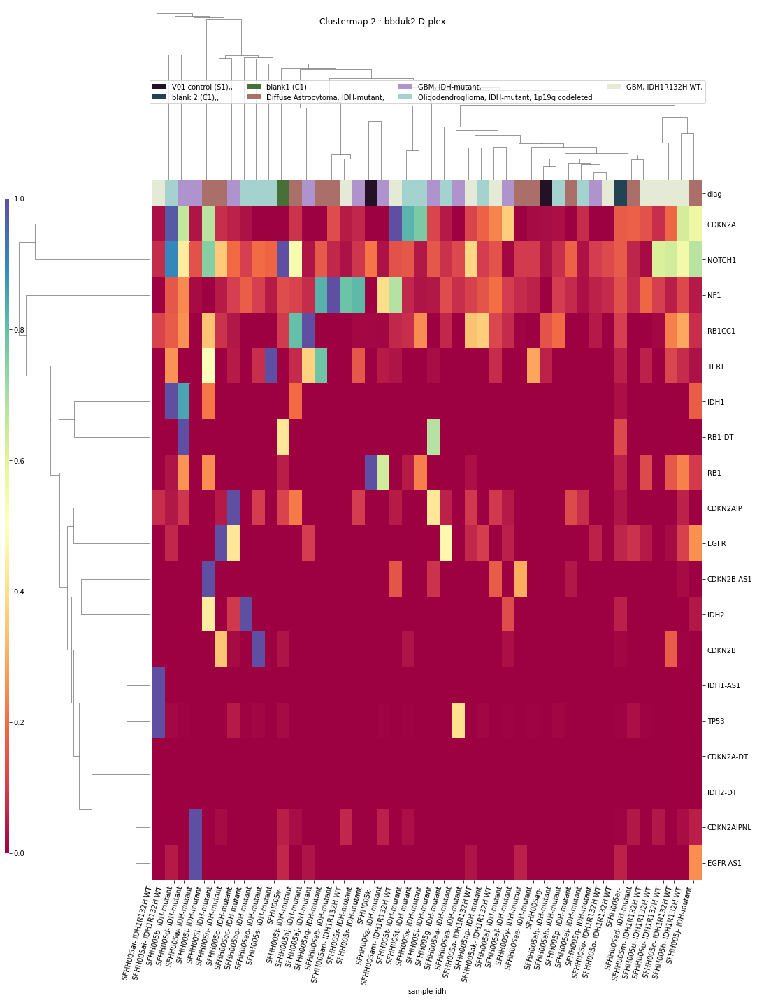

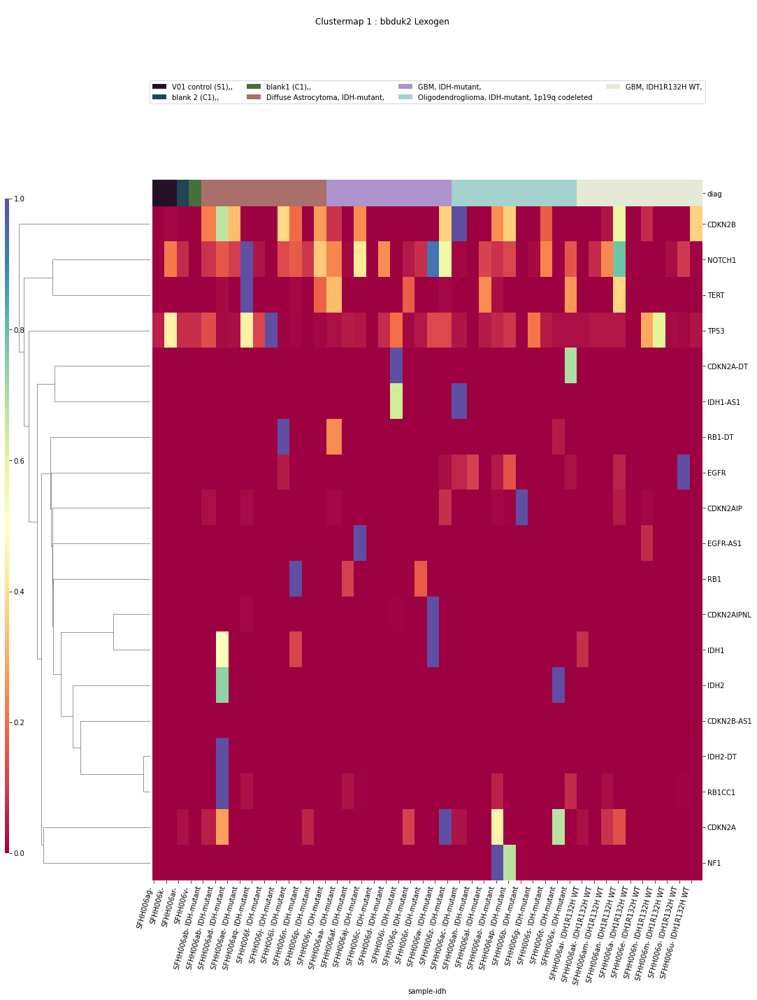

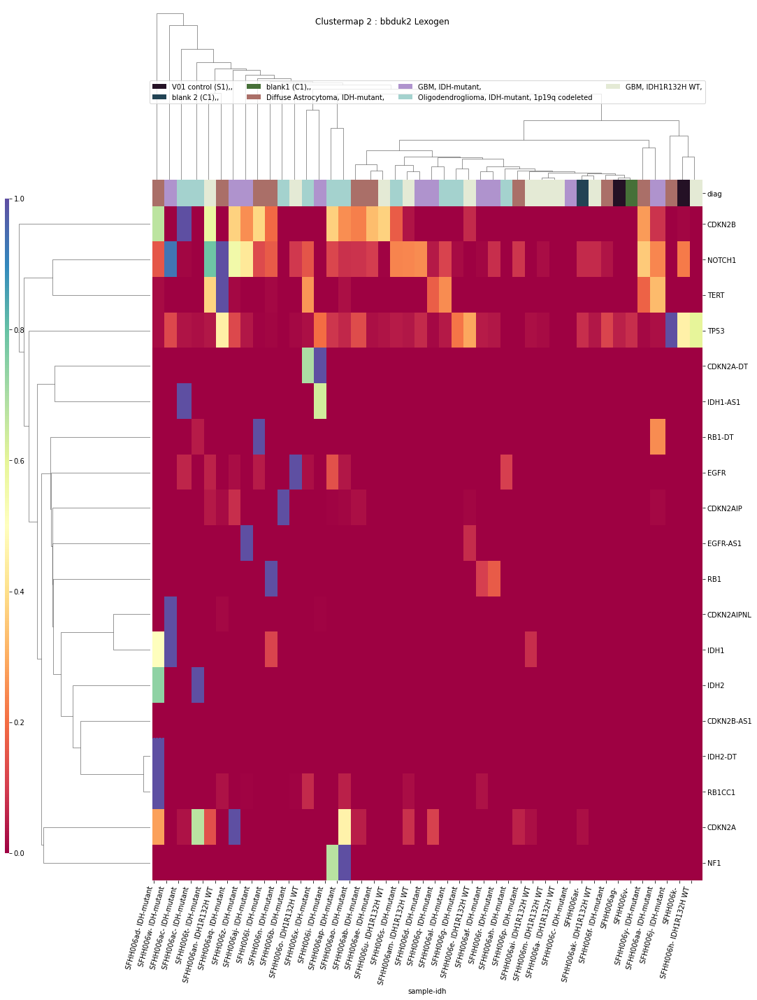

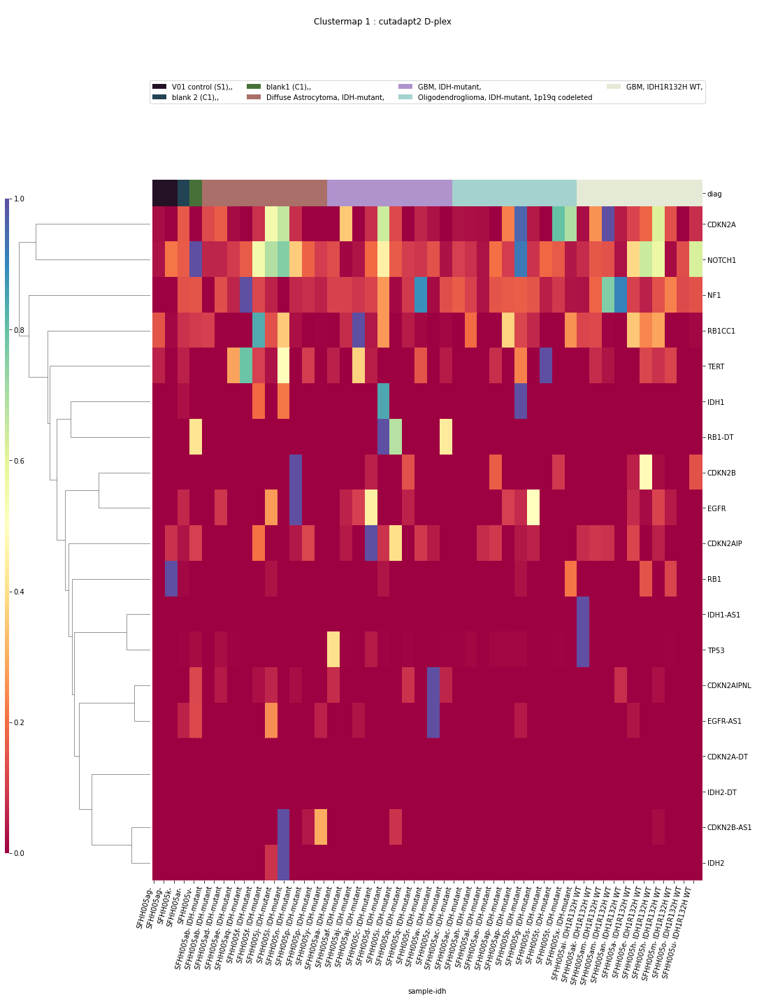

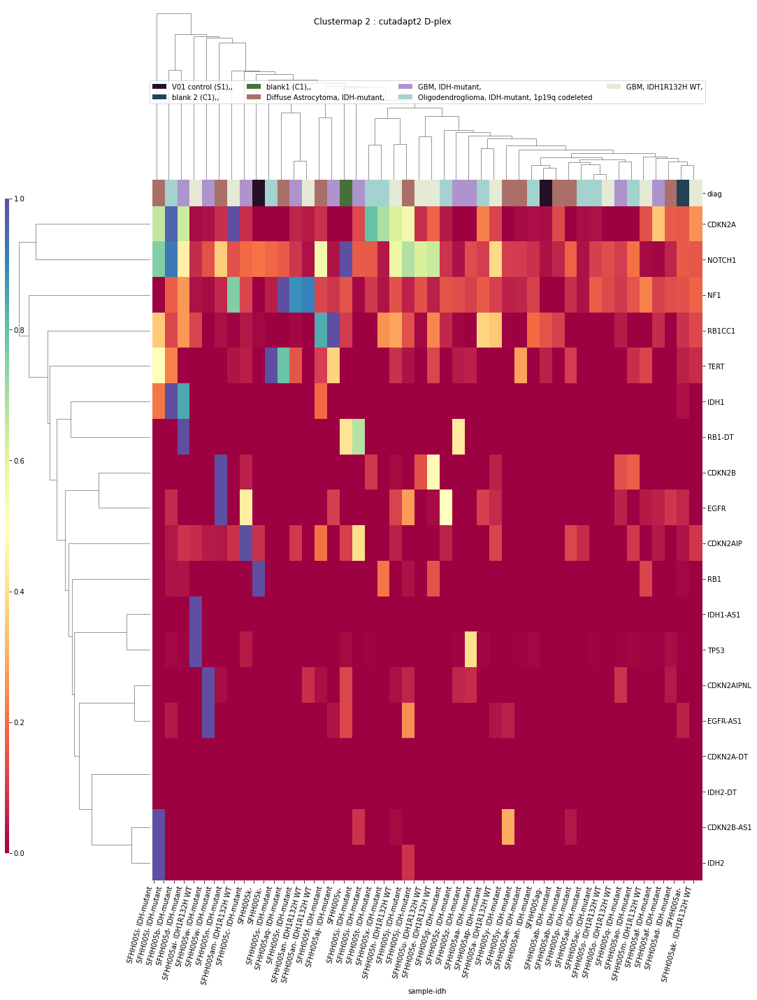

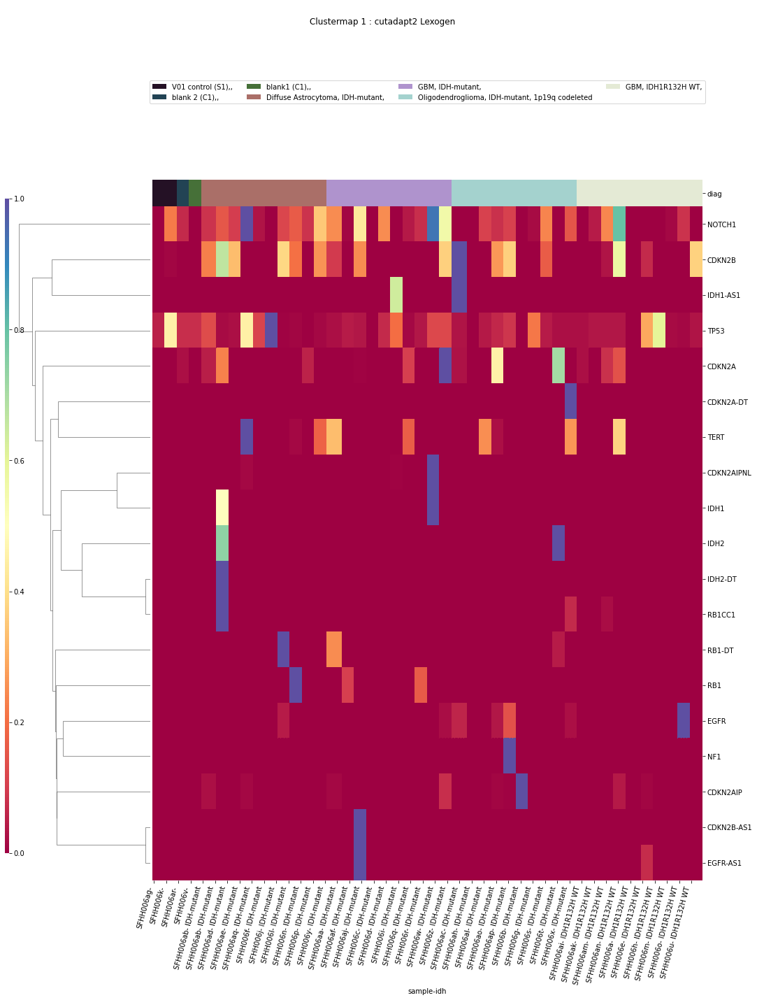

In [ ]:
ttests_boxplots_and_heatmaps(dfn,['CDKN2A','CDKN2A-DT','CDKN2AIP','CDKN2AIPNL','CDKN2B','CDKN2B-AS1','EGFR',
                                  'EGFR-AS1','IDH1','IDH1-AS1','IDH2','IDH2-DT','NF1','NOTCH1','RB1','RB1CC1',
                                  'RB1-DT','TERT','TP53'],box_p=0.1,heat_p=0.2)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# Genes

In [ ]:
ttests_boxplots_and_heatmaps(dfn,genes)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# miRNA

In [ ]:
ttests_boxplots_and_heatmaps(dfn,mirnas)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# mRNA_Prot

In [ ]:
ttests_boxplots_and_heatmaps(dfn,mrnas)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# Diamond NR Families

In [ ]:
#ttests_boxplots_and_heatmaps(dfn,diamond_families)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# RMSK Families

In [ ]:
ttests_boxplots_and_heatmaps(dfn,rmsk_families)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# RMSK Classes

In [ ]:
ttests_boxplots_and_heatmaps(dfn,rmsk_classes)

In [ ]:
datetime.now().strftime("%H:%M:%S")

# RMSK Names

In [ ]:
ttests_boxplots_and_heatmaps(dfn,rmsk_names)

In [ ]:
datetime.now().strftime("%H:%M:%S")

In [ ]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [ ]:
pd.set_option('display.max_columns', default_max_columns)

In [ ]:
pd.set_option('display.max_rows',default_max_rows)

In [ ]:
pd.set_option('display.precision', default_precision)